# 2026-05-25 Initial Further Project Check

Adapted from the previous `extended` project notebook to the nested `further` tree. The active cells below discover the current `v3tk_v7.6.8/<galaxy>/` products, summarize product availability, and provide quick diagnostics that run before the new `_further` mass/SFR products exist.


In [1]:

# Further-project initial checks for the v3tk v7.6.8 products.
# This notebook was adapted from the previous flat `extended` project layout.
# It now discovers products under `v3tk_v7.6.8/<galaxy>/` from the current cwd.

from __future__ import annotations

import math
import re
import sys
from pathlib import Path

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.io import fits
from IPython.display import display

PROJECT_ROOT = Path.cwd().resolve()
RUN_LABEL = "v3tk_v7.6.8"
RUN_DIR = PROJECT_ROOT / RUN_LABEL
REFERENCE_ROOT = (PROJECT_ROOT.parent / "extended").resolve()
OUTDIR = PROJECT_ROOT / "quicklook_figures"

KEY_LINES = [
    "HB4861",
    "OIII5006",
    "HA6562",
    "NII6583",
    "SII6716",
    "SII6730",
    "SIII6312",
    "OII7318",
    "OII7319",
    "OII7329",
    "OII7330",
]

plt.style.use("default")
mpl.rcParams.update({
    "figure.dpi": 120,
    "font.size": 10,
    "axes.grid": False,
})

print(f"Project root: {PROJECT_ROOT}")
print(f"Run directory: {RUN_DIR}")
if REFERENCE_ROOT.exists() and str(REFERENCE_ROOT) not in sys.path:
    sys.path.append(str(REFERENCE_ROOT))

print(f"Reference resources fallback: {REFERENCE_ROOT}")
print(f"Active save paths are intentionally commented out in this notebook.")


Project root: /Users/Igniz/Desktop/ICRAR/further
Run directory: /Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8
Reference resources fallback: /Users/Igniz/Desktop/ICRAR/extended
Active save paths are intentionally commented out in this notebook.


In [2]:

def first_existing(*paths: Path | None) -> Path | None:
    for path in paths:
        if path is not None and path.exists():
            return path
    return None


def fits_has_hdus(path: Path | None, names: list[str]) -> bool:
    if path is None or not path.exists():
        return False
    try:
        with fits.open(path, memmap=True) as hdul:
            hdu_names = {h.name.upper() for h in hdul}
        return all(name.upper() in hdu_names for name in names)
    except Exception:
        return False


def align_map_to_shape(map_data, target_shape, *, label="map", fill_value=np.nan, max_delta=2):
    """Align a nearly matching 2D map to target_shape by copying the overlap."""
    target_shape = tuple(target_shape)
    arr = np.asarray(map_data, dtype=float)
    if arr.shape == target_shape:
        return arr
    if arr.ndim != len(target_shape):
        raise ValueError(f"{label}: cannot align ndim {arr.ndim} to target shape {target_shape}")

    deltas = tuple(abs(src - dst) for src, dst in zip(arr.shape, target_shape))
    if any(delta > max_delta for delta in deltas):
        raise ValueError(f"{label}: shape {arr.shape} differs too much from target {target_shape}")

    aligned = np.full(target_shape, fill_value, dtype=float)
    overlap = tuple(min(src, dst) for src, dst in zip(arr.shape, target_shape))
    slices = tuple(slice(0, n) for n in overlap)
    aligned[slices] = arr[slices]
    print(f"  {label}: aligned shape {arr.shape} -> {target_shape}; overlap={overlap}")
    return aligned


def intrinsic_sigma_from_maps(sigma_obs, sigma_corr, *, label="sigma"):
    """Return intrinsic sigma = sqrt(SIGMA^2 - SIGMA_CORR^2), masking nonphysical pixels."""
    if sigma_obs is None or sigma_corr is None:
        return None
    sigma_obs = np.asarray(sigma_obs, dtype=float)
    sigma_corr = align_map_to_shape(sigma_corr, sigma_obs.shape, label=f"{label} correction")
    sigma2_intrinsic = sigma_obs**2 - sigma_corr**2
    sigma_intrinsic = np.full(sigma_obs.shape, np.nan, dtype=float)
    ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
    sigma_intrinsic[ok] = np.sqrt(sigma2_intrinsic[ok])
    return sigma_intrinsic


def discover_further_products(run_dir: Path = RUN_DIR) -> pd.DataFrame:
    rows = []
    if not run_dir.exists():
        raise FileNotFoundError(f"Missing run directory: {run_dir}")

    for gal_dir in sorted(p for p in run_dir.iterdir() if p.is_dir()):
        gal = gal_dir.name
        spatial_raw = gal_dir / f"{gal}_spatial_binning_maps.fits"
        spatial_further = gal_dir / f"{gal}_spatial_binning_maps_further.fits"
        spatial_extended = gal_dir / f"{gal}_spatial_binning_maps_extended.fits"
        gas_raw = gal_dir / f"{gal}_gas_bin_maps.fits"
        gas_further = gal_dir / f"{gal}_gas_bin_maps_further.fits"
        gas_extended = gal_dir / f"{gal}_gas_BIN_maps_extended.fits"
        sfh = gal_dir / f"{gal}_sfh_maps.fits"
        sfh_weights = gal_dir / f"{gal}_sfh_weights.fits"
        kin = gal_dir / f"{gal}_kin_maps.fits"
        gas_spaxel = gal_dir / f"{gal}_gas_spaxel_maps.fits"
        mask = gal_dir / f"{gal}_mask.fits"

        spatial_preferred = first_existing(spatial_further, spatial_extended, spatial_raw)
        gas_preferred = first_existing(gas_further, gas_extended, gas_raw)

        rows.append({
            "galaxy": gal,
            "folder": gal_dir,
            "spatial_path": spatial_preferred,
            "gas_path": gas_preferred,
            "sfh_path": sfh if sfh.exists() else None,
            "sfh_weights_path": sfh_weights if sfh_weights.exists() else None,
            "kin_path": kin if kin.exists() else None,
            "gas_spaxel_path": gas_spaxel if gas_spaxel.exists() else None,
            "mask_path": mask if mask.exists() else None,
            "has_spatial": spatial_preferred is not None,
            "has_gas": gas_preferred is not None,
            "has_sfh": sfh.exists(),
            "has_sfh_weights": sfh_weights.exists(),
            "has_kin": kin.exists(),
            "has_gas_spaxel": gas_spaxel.exists(),
            "has_mask": mask.exists(),
            "has_spatial_further": spatial_further.exists(),
            "has_gas_further": gas_further.exists(),
        })

    table = pd.DataFrame(rows).set_index("galaxy", drop=False)
    if table.empty:
        raise RuntimeError(f"No galaxy folders found below {run_dir}")

    table["has_mass_map"] = [
        fits_has_hdus(path, ["LOGMASS_SURFACE_DENSITY"])
        for path in table["spatial_path"]
    ]
    table["has_sfr_map"] = [
        fits_has_hdus(path, ["LOGSFR_SURFACE_DENSITY_HII", "LOGSFR_SURFACE_DENSITY_SF"])
        for path in table["gas_path"]
    ]
    table["has_o3n2_m13"] = [
        fits_has_hdus(path, ["O_H_O3N2_M13_HII", "O_H_O3N2_M13_SF"])
        for path in table["gas_path"]
    ]
    table["has_proxy_ew"] = [
        first_existing(
            Path(row["folder"]) / f"{gal}_proxy_EW_maps_further.fits",
            Path(row["folder"]) / f"{gal}_proxy_EW_maps.fits",
            PROJECT_ROOT / f"{gal}_proxy_EW_maps_further.fits",
            PROJECT_ROOT / f"{gal}_proxy_EW_maps.fits",
            REFERENCE_ROOT / f"{gal}_proxy_EW_maps.fits",
        ) is not None
        for gal, row in table.iterrows()
    ]
    table["ready_physics_maps"] = table["has_mass_map"] & table["has_sfr_map"] & table["has_o3n2_m13"]
    table["ready_raw_gas_qc"] = table["has_spatial"] & table["has_gas"]
    table["ready_sfh_qc"] = table["has_spatial"] & table["has_sfh"]
    return table


PRODUCTS = discover_further_products()


def further_spatial_path(galaxy: str) -> Path:
    path = PRODUCTS.loc[galaxy, "spatial_path"]
    if path is None:
        raise FileNotFoundError(f"No spatial product registered for {galaxy}")
    return Path(path)


def further_gas_path(galaxy: str) -> Path:
    path = PRODUCTS.loc[galaxy, "gas_path"]
    if path is None:
        raise FileNotFoundError(f"No gas product registered for {galaxy}")
    return Path(path)


def further_ew_path(galaxy: str, suffix: str | None = None) -> Path:
    suffixes = []
    if suffix:
        suffixes.append(suffix)
    suffixes.extend(["_proxy_EW_maps_further.fits", "_proxy_EW_maps.fits", "_pseudo_EW_maps.fits"])
    candidates = []
    folder = PRODUCTS.loc[galaxy, "folder"] if galaxy in PRODUCTS.index else RUN_DIR / galaxy
    for suffix_item in dict.fromkeys(suffixes):
        candidates.extend([
            Path(folder) / f"{galaxy}{suffix_item}",
            PROJECT_ROOT / f"{galaxy}{suffix_item}",
            REFERENCE_ROOT / f"{galaxy}{suffix_item}",
        ])
    found = first_existing(*candidates)
    if found is None:
        checked = "\n".join(f"  - {path}" for path in candidates)
        raise FileNotFoundError(f"No EW product found for {galaxy}. Checked:\n{checked}")
    return found


def physics_ready_galaxies(require_ew: bool = True) -> list[str]:
    galaxies = PRODUCTS.index[PRODUCTS["ready_physics_maps"]].tolist()
    if require_ew:
        galaxies = [gal for gal in galaxies if PRODUCTS.loc[gal, "has_proxy_ew"]]
    return galaxies


def old_paper_cells_ready(require_ew: bool = True) -> bool:
    return len(physics_ready_galaxies(require_ew=require_ew)) > 0

RAW_GAS_GALAXIES = PRODUCTS.index[PRODUCTS["ready_raw_gas_qc"]].tolist()
SFH_GALAXIES = PRODUCTS.index[PRODUCTS["ready_sfh_qc"]].tolist()
READY_PHYSICS_GALAXIES = PRODUCTS.index[PRODUCTS["ready_physics_maps"]].tolist()

summary_columns = [
    "has_spatial",
    "has_gas",
    "has_sfh",
    "has_sfh_weights",
    "has_kin",
    "has_gas_spaxel",
    "has_mask",
    "has_mass_map",
    "has_sfr_map",
    "has_o3n2_m13",
    "has_proxy_ew",
    "ready_raw_gas_qc",
    "ready_sfh_qc",
    "ready_physics_maps",
]

print(f"Discovered {len(PRODUCTS)} galaxy folders in {RUN_LABEL}.")
print(f"Raw gas QC-ready galaxies: {len(RAW_GAS_GALAXIES)}")
print(f"SFH QC-ready galaxies: {len(SFH_GALAXIES)}")
print(f"Previous-paper physics-map ready galaxies: {len(READY_PHYSICS_GALAXIES)}")
display(PRODUCTS[summary_columns])


Discovered 29 galaxy folders in v3tk_v7.6.8.
Raw gas QC-ready galaxies: 29
SFH QC-ready galaxies: 29
Previous-paper physics-map ready galaxies: 29


,has_spatial,has_gas,has_sfh,has_sfh_weights,has_kin,has_gas_spaxel,has_mask,has_mass_map,has_sfr_map,has_o3n2_m13,has_proxy_ew,ready_raw_gas_qc,ready_sfh_qc,ready_physics_maps
galaxy,,,,,,,,,,,,,,
IC3392,True,True,True,True,True,True,True,True,True,True,True,True,True,True
NGC4064,True,True,True,True,True,True,True,True,True,True,True,True,True,True
NGC4189,True,True,True,True,True,True,True,True,True,True,True,True,True,True
NGC4192,True,True,True,True,True,True,True,True,True,True,True,True,True,True
NGC4254,True,True,True,True,True,True,True,True,True,True,True,True,True,True
NGC4293,True,True,True,True,True,True,True,True,True,True,True,True,True,True
NGC4294,True,True,True,True,True,True,True,True,True,True,True,True,True,True
NGC4298,True,True,True,True,True,True,True,True,True,True,True,True,True,True
NGC4302,True,True,True,True,True,True,True,True,True,True,True,True,True,True


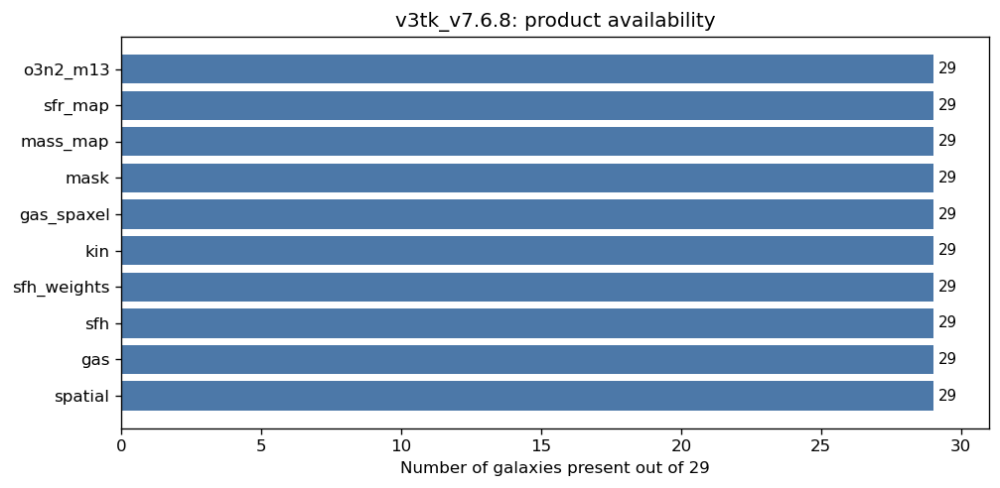

Galaxies missing gas_bin_maps: none
Galaxies missing sfh_maps: none


In [3]:

# Product availability quicklook. This is useful immediately because the new sample is not the old 14-galaxy flat layout.
count_columns = [
    "has_spatial",
    "has_gas",
    "has_sfh",
    "has_sfh_weights",
    "has_kin",
    "has_gas_spaxel",
    "has_mask",
    "has_mass_map",
    "has_sfr_map",
    "has_o3n2_m13",
]
counts = PRODUCTS[count_columns].sum().sort_values(ascending=True)

fig, ax = plt.subplots(figsize=(8.5, 4.2))
ax.barh(counts.index.str.replace("has_", ""), counts.values, color="#4c78a8")
ax.set_xlabel(f"Number of galaxies present out of {len(PRODUCTS)}")
ax.set_title(f"{RUN_LABEL}: product availability")
for y, value in enumerate(counts.values):
    ax.text(value + 0.2, y, str(int(value)), va="center", fontsize=9)
ax.set_xlim(0, max(len(PRODUCTS), int(counts.max()) + 2))
fig.tight_layout()
# fig.savefig(OUTDIR / "product_availability.png", dpi=200, bbox_inches="tight")
plt.show()

missing_gas = PRODUCTS.index[~PRODUCTS["has_gas"]].tolist()
missing_sfh = PRODUCTS.index[~PRODUCTS["has_sfh"]].tolist()
print("Galaxies missing gas_bin_maps:", ", ".join(missing_gas) if missing_gas else "none")
print("Galaxies missing sfh_maps:", ", ".join(missing_sfh) if missing_sfh else "none")


Line S/N summary rows: 319 from 29 raw-gas-ready galaxies


line,HA6562,HB4861,NII6583,OII7318,OII7319,OII7329,OII7330,OIII5006,SII6716,SII6730,SIII6312
galaxy,,,,,,,,,,,
IC3392,0.494,0.439,0.494,0.243,0.040,0.243,0.040,0.486,0.494,0.464,0.150
NGC4064,0.472,0.427,0.472,0.002,0.050,0.002,0.050,0.468,0.462,0.410,0.091
NGC4189,0.927,0.894,0.927,0.025,0.193,0.025,0.193,0.921,0.927,0.927,0.000
NGC4192,0.294,0.288,0.294,0.015,0.010,0.015,0.010,0.290,0.294,0.294,0.033
NGC4254,0.866,0.866,0.866,0.019,0.238,0.019,0.238,0.865,0.866,0.866,0.000
NGC4293,0.530,0.376,0.530,0.001,0.038,0.001,0.038,0.521,0.442,0.346,0.054
NGC4294,0.475,0.475,0.475,0.068,0.262,0.068,0.262,0.475,0.475,0.475,0.341
NGC4298,0.463,0.450,0.446,0.129,0.051,0.129,0.051,0.454,0.440,0.414,0.040
NGC4302,0.913,0.860,0.892,0.087,0.017,0.087,0.017,0.810,0.889,0.881,0.106


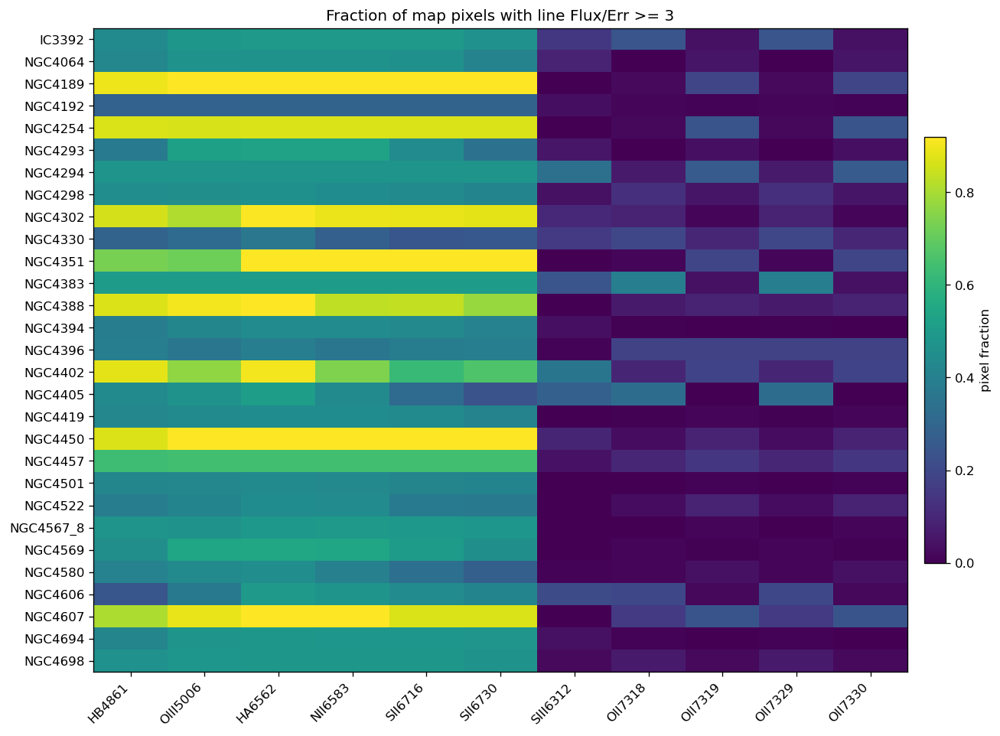

In [4]:

def finite_fraction(array: np.ndarray) -> float:
    return float(np.isfinite(array).mean()) if array.size else np.nan


def line_snr_summary(galaxy: str, gas_path: Path, key_lines: list[str] = KEY_LINES) -> list[dict]:
    rows = []
    with fits.open(gas_path, memmap=True) as hdul:
        names = {h.name.upper(): h.name for h in hdul}
        shape = hdul[1].data.shape if len(hdul) > 1 and hdul[1].data is not None else None
        for line in key_lines:
            flux_name = f"{line}_FLUX"
            err_name = f"{line}_FLUX_ERR"
            if flux_name.upper() not in names or err_name.upper() not in names:
                rows.append({
                    "galaxy": galaxy,
                    "line": line,
                    "present": False,
                    "shape": shape,
                    "finite_fraction": np.nan,
                    "snr3_fraction": np.nan,
                    "snr10_fraction": np.nan,
                    "snr_median": np.nan,
                    "snr_p90": np.nan,
                })
                continue

            flux = np.asarray(hdul[names[flux_name.upper()]].data, dtype=float)
            err = np.asarray(hdul[names[err_name.upper()]].data, dtype=float)
            good = np.isfinite(flux) & np.isfinite(err) & (err > 0)
            snr = np.full(flux.shape, np.nan, dtype=float)
            snr[good] = flux[good] / err[good]
            snr_good = snr[np.isfinite(snr)]
            rows.append({
                "galaxy": galaxy,
                "line": line,
                "present": True,
                "shape": flux.shape,
                "finite_fraction": finite_fraction(snr),
                "snr3_fraction": float(np.mean(snr >= 3)),
                "snr10_fraction": float(np.mean(snr >= 10)),
                "snr_median": float(np.nanmedian(snr_good)) if snr_good.size else np.nan,
                "snr_p90": float(np.nanpercentile(snr_good, 90)) if snr_good.size else np.nan,
            })
    return rows


line_rows = []
for gal in RAW_GAS_GALAXIES:
    line_rows.extend(line_snr_summary(gal, PRODUCTS.loc[gal, "gas_path"]))

LINE_SNR = pd.DataFrame(line_rows)
print(f"Line S/N summary rows: {len(LINE_SNR)} from {len(RAW_GAS_GALAXIES)} raw-gas-ready galaxies")
display(LINE_SNR.pivot(index="galaxy", columns="line", values="snr3_fraction").round(3))

if not LINE_SNR.empty:
    heat = LINE_SNR.pivot(index="galaxy", columns="line", values="snr3_fraction").reindex(columns=KEY_LINES)
    fig, ax = plt.subplots(figsize=(11, max(4, 0.28 * len(heat))))
    im = ax.imshow(heat.to_numpy(dtype=float), aspect="auto", vmin=0, vmax=np.nanpercentile(heat.to_numpy(dtype=float), 95), cmap="viridis")
    ax.set_xticks(np.arange(len(heat.columns)), heat.columns, rotation=45, ha="right")
    ax.set_yticks(np.arange(len(heat.index)), heat.index)
    ax.set_title("Fraction of map pixels with line Flux/Err >= 3")
    cbar = fig.colorbar(im, ax=ax, fraction=0.025, pad=0.02)
    cbar.set_label("pixel fraction")
    fig.tight_layout()
    # fig.savefig(OUTDIR / "line_snr3_fraction_heatmap.png", dpi=200, bbox_inches="tight")
    plt.show()


BPT quicklook points: 87,000 sampled spaxels from 29 galaxies


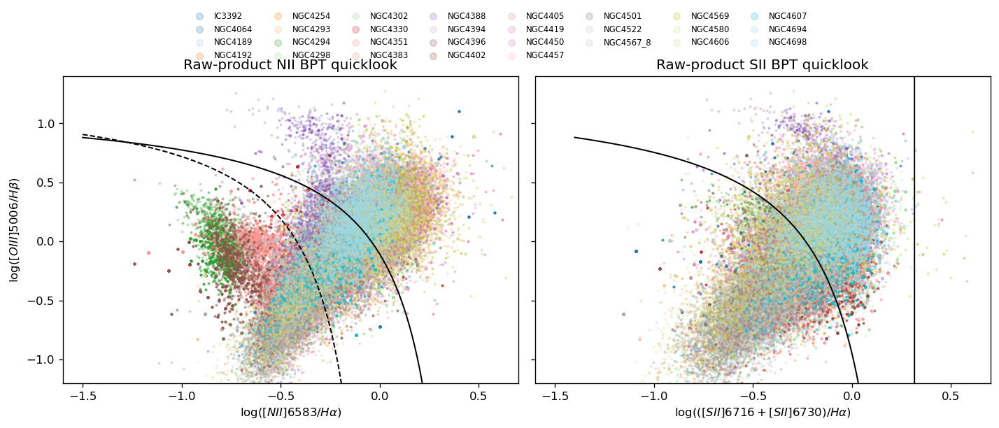

In [5]:

def bpt_demarcation_curves():
    x_n2_kauff = np.linspace(-1.5, 0.0, 300)
    y_n2_kauff = 0.61 / (x_n2_kauff - 0.05) + 1.3
    x_n2_kewley = np.linspace(-1.5, 0.45, 300)
    y_n2_kewley = 0.61 / (x_n2_kewley - 0.47) + 1.19
    x_s2_kewley = np.linspace(-1.4, 0.35, 300)
    y_s2_kewley = 0.72 / (x_s2_kewley - 0.32) + 1.30
    return x_n2_kauff, y_n2_kauff, x_n2_kewley, y_n2_kewley, x_s2_kewley, y_s2_kewley


def get_hdu_data(hdul, name: str) -> np.ndarray | None:
    upper = name.upper()
    for hdu in hdul:
        if hdu.name.upper() == upper:
            return np.asarray(hdu.data, dtype=float)
    return None


def collect_bpt_points(galaxies: list[str], snr_min: float = 3.0, max_points_per_galaxy: int = 3000, seed: int = 20260525) -> pd.DataFrame:
    rng = np.random.default_rng(seed)
    rows = []
    required = [
        "HB4861_FLUX", "HB4861_FLUX_ERR",
        "OIII5006_FLUX", "OIII5006_FLUX_ERR",
        "HA6562_FLUX", "HA6562_FLUX_ERR",
        "NII6583_FLUX", "NII6583_FLUX_ERR",
        "SII6716_FLUX", "SII6716_FLUX_ERR",
        "SII6730_FLUX", "SII6730_FLUX_ERR",
    ]
    for gal in galaxies:
        gas_path = PRODUCTS.loc[gal, "gas_path"]
        with fits.open(gas_path, memmap=True) as hdul:
            values = {name: get_hdu_data(hdul, name) for name in required}
            if any(v is None for v in values.values()):
                continue
            hb = values["HB4861_FLUX"]
            hb_err = values["HB4861_FLUX_ERR"]
            o3 = values["OIII5006_FLUX"]
            o3_err = values["OIII5006_FLUX_ERR"]
            ha = values["HA6562_FLUX"]
            ha_err = values["HA6562_FLUX_ERR"]
            n2 = values["NII6583_FLUX"]
            n2_err = values["NII6583_FLUX_ERR"]
            s2 = values["SII6716_FLUX"] + values["SII6730_FLUX"]
            s2_err = np.hypot(values["SII6716_FLUX_ERR"], values["SII6730_FLUX_ERR"])

            positive = (hb > 0) & (o3 > 0) & (ha > 0) & (n2 > 0) & (s2 > 0)
            snr_ok = (
                (hb / hb_err >= snr_min) &
                (o3 / o3_err >= snr_min) &
                (ha / ha_err >= snr_min) &
                (n2 / n2_err >= snr_min) &
                (s2 / s2_err >= snr_min)
            )
            good = positive & snr_ok & np.isfinite(hb) & np.isfinite(o3) & np.isfinite(ha) & np.isfinite(n2) & np.isfinite(s2)
            yy, xx = np.where(good)
            if yy.size == 0:
                continue
            if yy.size > max_points_per_galaxy:
                keep = rng.choice(yy.size, max_points_per_galaxy, replace=False)
                yy = yy[keep]
                xx = xx[keep]
            rows.append(pd.DataFrame({
                "galaxy": gal,
                "log_n2_ha": np.log10(n2[yy, xx] / ha[yy, xx]),
                "log_s2_ha": np.log10(s2[yy, xx] / ha[yy, xx]),
                "log_o3_hb": np.log10(o3[yy, xx] / hb[yy, xx]),
            }))
    return pd.concat(rows, ignore_index=True) if rows else pd.DataFrame(columns=["galaxy", "log_n2_ha", "log_s2_ha", "log_o3_hb"])


BPT_POINTS = collect_bpt_points(RAW_GAS_GALAXIES, snr_min=3.0)
print(f"BPT quicklook points: {len(BPT_POINTS):,} sampled spaxels from {BPT_POINTS['galaxy'].nunique() if not BPT_POINTS.empty else 0} galaxies")

if not BPT_POINTS.empty:
    x_n2_kauff, y_n2_kauff, x_n2_kewley, y_n2_kewley, x_s2_kewley, y_s2_kewley = bpt_demarcation_curves()
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
    color_map = dict(zip(PRODUCTS.index, plt.cm.tab20(np.linspace(0, 1, len(PRODUCTS)))))
    for gal, group in BPT_POINTS.groupby("galaxy", sort=True):
        color = color_map.get(gal, "0.5")
        axes[0].scatter(group["log_n2_ha"], group["log_o3_hb"], s=2, alpha=0.22, color=color, label=gal, rasterized=True)
        axes[1].scatter(group["log_s2_ha"], group["log_o3_hb"], s=2, alpha=0.22, color=color, label=gal, rasterized=True)
    axes[0].plot(x_n2_kauff, y_n2_kauff, color="black", lw=1.2, ls="--", label="Kauffmann+03")
    axes[0].plot(x_n2_kewley, y_n2_kewley, color="black", lw=1.2, label="Kewley+01")
    axes[1].plot(x_s2_kewley, y_s2_kewley, color="black", lw=1.2, label="Kewley+01")
    axes[0].set_xlabel(r"$\log([NII]6583/H\alpha)$")
    axes[1].set_xlabel(r"$\log(([SII]6716+[SII]6730)/H\alpha)$")
    axes[0].set_ylabel(r"$\log([OIII]5006/H\beta)$")
    axes[0].set_title("Raw-product NII BPT quicklook")
    axes[1].set_title("Raw-product SII BPT quicklook")
    for ax in axes:
        ax.set_xlim(-1.6, 0.7)
        ax.set_ylim(-1.2, 1.4)
    handles, labels = axes[0].get_legend_handles_labels()
    galaxy_handles = handles[:BPT_POINTS['galaxy'].nunique()]
    galaxy_labels = labels[:BPT_POINTS['galaxy'].nunique()]
    fig.legend(galaxy_handles, galaxy_labels, loc="upper center", bbox_to_anchor=(0.5, 1.02), ncol=min(8, max(1, len(galaxy_labels))), fontsize=7, markerscale=4, frameon=False)
    fig.tight_layout(rect=(0, 0, 1, 0.92))
    # fig.savefig(OUTDIR / "raw_bpt_quicklook.png", dpi=200, bbox_inches="tight")
    plt.show()


Map quicklook galaxies: IC3392, NGC4064, NGC4189, NGC4192, NGC4254, NGC4293, NGC4294, NGC4298


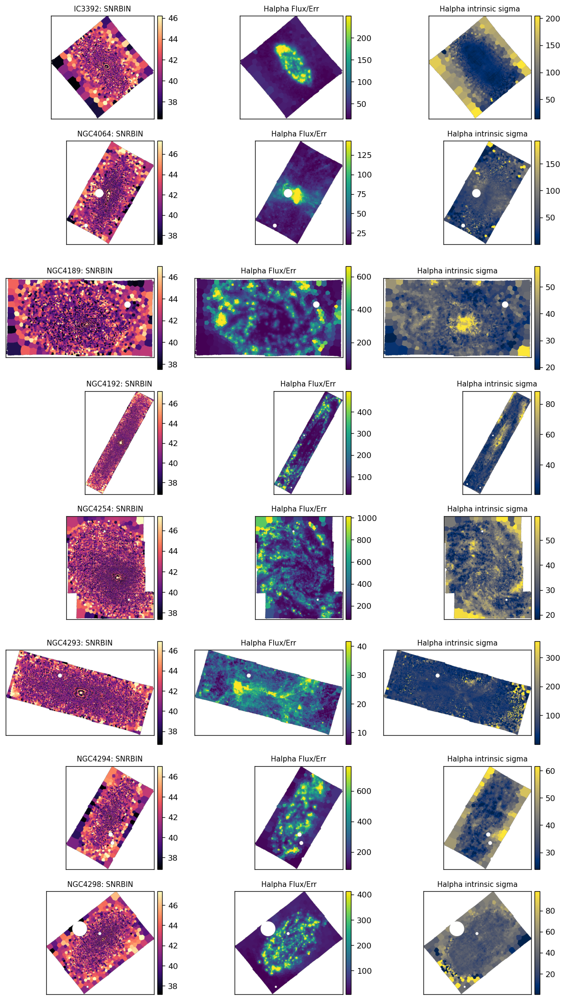

In [6]:

def read_optional_hdu(path: Path | None, name: str) -> np.ndarray | None:
    if path is None or not path.exists():
        return None
    try:
        with fits.open(path, memmap=True) as hdul:
            for hdu in hdul:
                if hdu.name.upper() == name.upper():
                    return np.asarray(hdu.data, dtype=float)
    except Exception as exc:
        print(f"Could not read {name} from {path}: {exc}")
    return None


def robust_limits(data: np.ndarray | None, qlo: float = 2, qhi: float = 98):
    if data is None:
        return None, None
    finite = data[np.isfinite(data)]
    if finite.size == 0:
        return None, None
    return np.nanpercentile(finite, [qlo, qhi])


quicklook_galaxies = RAW_GAS_GALAXIES[:min(8, len(RAW_GAS_GALAXIES))]
print("Map quicklook galaxies:", ", ".join(quicklook_galaxies))

if quicklook_galaxies:
    fig, axes = plt.subplots(len(quicklook_galaxies), 3, figsize=(10, 2.2 * len(quicklook_galaxies)), squeeze=False)
    for row, gal in enumerate(quicklook_galaxies):
        spatial_path = PRODUCTS.loc[gal, "spatial_path"]
        gas_path = PRODUCTS.loc[gal, "gas_path"]
        snrbin = read_optional_hdu(spatial_path, "SNRBIN")
        ha = read_optional_hdu(gas_path, "HA6562_FLUX")
        ha_err = read_optional_hdu(gas_path, "HA6562_FLUX_ERR")
        ha_sigma_obs = read_optional_hdu(gas_path, "HA6562_SIGMA")
        ha_sigma_corr = read_optional_hdu(gas_path, "HA6562_SIGMA_CORR")
        ha_sigma_intrinsic = intrinsic_sigma_from_maps(ha_sigma_obs, ha_sigma_corr, label=f"{gal} HA6562")
        ha_snr = np.where((ha_err is not None) & np.isfinite(ha_err) & (ha_err > 0), ha / ha_err, np.nan) if ha is not None and ha_err is not None else None
        panels = [("SNRBIN", snrbin, "magma"), ("Halpha Flux/Err", ha_snr, "viridis"), ("Halpha intrinsic sigma", ha_sigma_intrinsic, "cividis")]
        for col, (title, data, cmap) in enumerate(panels):
            ax = axes[row, col]
            if data is None:
                ax.text(0.5, 0.5, "missing", ha="center", va="center", transform=ax.transAxes)
                ax.set_axis_off()
                continue
            vmin, vmax = robust_limits(data)
            im = ax.imshow(data, origin="lower", cmap=cmap, vmin=vmin, vmax=vmax)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_title(f"{gal}: {title}" if col == 0 else title, fontsize=9)
            fig.colorbar(im, ax=ax, fraction=0.046, pad=0.02)
    fig.tight_layout()
    # fig.savefig(OUTDIR / "first_galaxy_map_quicklooks.png", dpi=200, bbox_inches="tight")
    plt.show()


In [7]:

# Previous-paper-style map panel, adapted to the nested further project structure.
# It runs only after Mass.py/SFR+Z.py have produced *_further products with mass, SFR, and O/H HDUs.
print(f"Physics-map-ready galaxies: {len(READY_PHYSICS_GALAXIES)}")
if READY_PHYSICS_GALAXIES:
    print(", ".join(READY_PHYSICS_GALAXIES))
else:
    print("No galaxies currently have all required mass/SFR/O3N2-M13 products in the nested further tree.")
    print("Run Mass.py and SFR+Z.py for target galaxies, then rerun this cell to reproduce the previous map-style figure on new products.")


def plot_previous_style_maps(galaxies: list[str] | None = None, max_galaxies: int | None = None):
    galaxies = list(READY_PHYSICS_GALAXIES if galaxies is None else galaxies)
    if max_galaxies is not None:
        galaxies = galaxies[:max_galaxies]
    if not galaxies:
        raise RuntimeError("No ready physics-map galaxies. Generate *_further products first.")

    ncols = 3
    nrows = len(galaxies)
    fig, axes = plt.subplots(nrows, ncols, figsize=(10.5, 2.7 * nrows), squeeze=False)
    for row, gal in enumerate(galaxies):
        spatial_path = PRODUCTS.loc[gal, "spatial_path"]
        gas_path = PRODUCTS.loc[gal, "gas_path"]
        sigm = read_optional_hdu(spatial_path, "LOGMASS_SURFACE_DENSITY")
        sigsfr = read_optional_hdu(gas_path, "LOGSFR_SURFACE_DENSITY_HII")
        oh = read_optional_hdu(gas_path, "O_H_O3N2_M13_HII")
        panels = [
            (r"$\log\Sigma_*$", sigm, "magma"),
            (r"$\log\Sigma_{SFR}$ HII", sigsfr, "viridis"),
            (r"12+log(O/H) O3N2-M13 HII", oh, "plasma"),
        ]
        for col, (title, data, cmap) in enumerate(panels):
            ax = axes[row, col]
            vmin, vmax = robust_limits(data)
            im = ax.imshow(data, origin="lower", cmap=cmap, vmin=vmin, vmax=vmax)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_title(f"{gal}: {title}" if col == 0 else title, fontsize=9)
            fig.colorbar(im, ax=ax, fraction=0.046, pad=0.02)
    fig.tight_layout()
    # fig.savefig(OUTDIR / "previous_style_physics_maps.png", dpi=200, bbox_inches="tight")
    return fig

# Uncomment after *_further products exist:
# fig = plot_previous_style_maps(max_galaxies=14)


Physics-map-ready galaxies: 29
IC3392, NGC4064, NGC4189, NGC4192, NGC4254, NGC4293, NGC4294, NGC4298, NGC4302, NGC4330, NGC4351, NGC4383, NGC4388, NGC4394, NGC4396, NGC4402, NGC4405, NGC4419, NGC4450, NGC4457, NGC4501, NGC4522, NGC4567_8, NGC4569, NGC4580, NGC4606, NGC4607, NGC4694, NGC4698


In [8]:

# Integrated-resource status for the old SFMS/MZR/FMR panel.
# These reference files are shared with the previous project if they are not copied into `further`.

def resolve_reference_file(name: str) -> Path | None:
    return first_existing(PROJECT_ROOT / name, REFERENCE_ROOT / name)

master_path = resolve_reference_file("mauve_master_wiki.fits")
loader_path = resolve_reference_file("mauve_master_loader.py")
califa_path = resolve_reference_file("Sanchez2017TableB1.csv")

print("mauve_master_wiki.fits:", master_path if master_path else "missing")
print("mauve_master_loader.py:", loader_path if loader_path else "missing")
print("Sanchez2017TableB1.csv:", califa_path if califa_path else "missing")

sfr_logs = []
for gal in PRODUCTS.index:
    candidates = [
        PROJECT_ROOT / "sfr_logs" / f"{gal}.log",
        PRODUCTS.loc[gal, "folder"] / "sfr_logs" / f"{gal}.log",
    ]
    found = first_existing(*candidates)
    sfr_logs.append({"galaxy": gal, "sfr_log": found, "has_sfr_log": found is not None})
SFR_LOG_STATUS = pd.DataFrame(sfr_logs).set_index("galaxy")
print(f"Local SFR metallicity logs available: {int(SFR_LOG_STATUS['has_sfr_log'].sum())} / {len(SFR_LOG_STATUS)}")
display(SFR_LOG_STATUS)

# The full old SFMS/MZR/FMR plotting cell should be run only once these resources and SFR logs exist.
# plt.savefig(...) remains commented out by default.


mauve_master_wiki.fits: /Users/Igniz/Desktop/ICRAR/further/mauve_master_wiki.fits
mauve_master_loader.py: /Users/Igniz/Desktop/ICRAR/further/mauve_master_loader.py
Sanchez2017TableB1.csv: /Users/Igniz/Desktop/ICRAR/further/Sanchez2017TableB1.csv
Local SFR metallicity logs available: 29 / 29


,sfr_log,has_sfr_log
galaxy,,
IC3392,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/IC...,True
NGC4064,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,True
NGC4189,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,True
NGC4192,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,True
NGC4254,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,True
NGC4293,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,True
NGC4294,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,True
NGC4298,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,True
NGC4302,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,True


## Copied Previous-Project Analysis Cells

These cells are active code again. Their file access has been adapted to the nested `further` product tree, and only figure-saving calls remain commented out. Cells that require Mass.py/SFR+Z.py `_further` outputs print a skip message until those products exist.


In [9]:
import matplotlib as mpl

# Increase tick label font sizes and tick length/width globally for all plots
mpl.rcParams.update({
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "xtick.major.size": 6,
    "ytick.major.size": 6,
    "xtick.minor.size": 4,
    "ytick.minor.size": 4,
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
    "xtick.minor.width": 1.0,
    "ytick.minor.width": 1.0,
    "xtick.direction": "in",
    "ytick.direction": "in",
})


  IC3392: 13799 HII pixels
  NGC4064: 3165 HII pixels
  NGC4189: 79662 HII pixels
  NGC4192: 138175 HII pixels
  NGC4254: 631734 HII pixels
  NGC4293: 439 HII pixels
  NGC4294: 67102 HII pixels
  NGC4298: 142275 HII pixels
  NGC4302: 17835 HII pixels
  NGC4330: 34567 HII pixels
  NGC4351: 26367 HII pixels
  NGC4383: 22361 HII pixels
  NGC4388: 17173 HII pixels
  NGC4394: 17856 HII pixels
  NGC4396: 80672 HII pixels
  NGC4402: 35164 HII pixels
  NGC4405: 10135 HII pixels
  NGC4419 PROXY_EWHA: aligned shape (643, 628) -> (643, 629); overlap=(643, 628)
  NGC4419: 5606 HII pixels
  NGC4450: 11951 HII pixels
  NGC4457: 5610 HII pixels
  NGC4501: 248763 HII pixels
  NGC4522: 31713 HII pixels
  NGC4567_8: 184697 HII pixels
  NGC4569: 36618 HII pixels
  NGC4580: 14984 HII pixels
  NGC4606: 1091 HII pixels
  NGC4607: 13891 HII pixels
  NGC4694 PROXY_EWHA: aligned shape (440, 439) -> (441, 439); overlap=(440, 439)
  NGC4694: 1053 HII pixels
  NGC4698: 5524 HII pixels

Total combined HII pixels: 

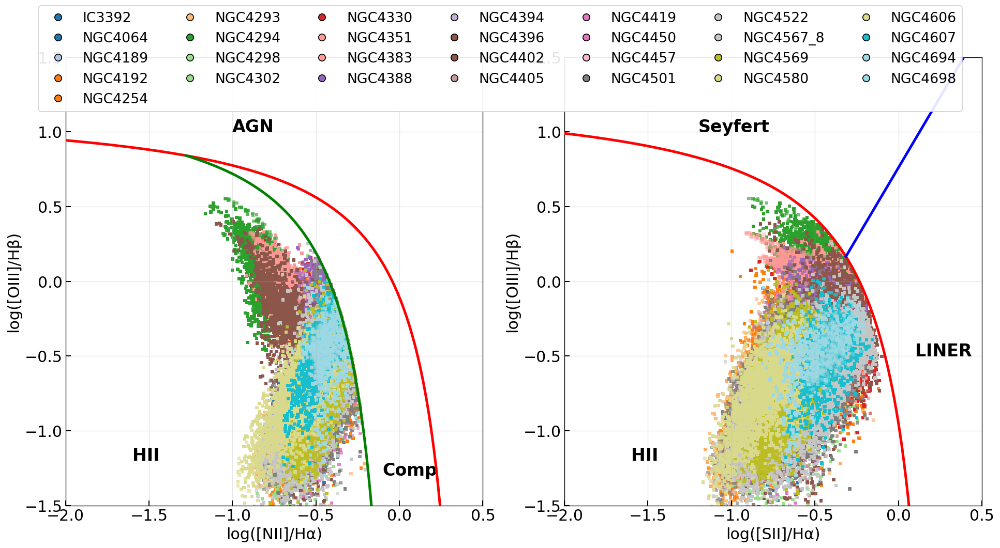

In [10]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------

    # Combined Analysis: NII and SII BPT Diagrams - Color-coded by Galaxy

    # Collect all HII spaxels from all galaxies (HII only, no SF)

    # Uses common spaxels across all 4 metallicity calibrations

    # ------------------------------------------------------------------

    import numpy as np

    import matplotlib.pyplot as plt

    from matplotlib.lines import Line2D

    from pathlib import Path

    from astropy.io import fits

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    EW_MIN = 6.0




    # BPT reference line functions

    def kewley01_N2(x):   # max-starburst

        return 0.61/(x-0.47) + 1.19



    def kauff03_N2(x):    # empirical SF upper envelope

        return 0.61/(x-0.05) + 1.30



    def kewley01_S2(x):

        return 0.72/(x-0.32) + 1.30



    def kewley06_Sy_LIN(x):   # Seyfert/LINER division

        return 1.89*x + 0.76



    # Create x arrays for the theoretical lines

    x_kewley_N2 = np.linspace(-2.0, 0.3, 200)

    x_kauff_N2 = np.linspace((286-np.sqrt(2871561))/1100, 0.0, 200)

    x_kewley_S2 = np.linspace(-2.0, 0.3, 200)

    x_kewley06_S2 = np.linspace((159-np.sqrt(105081))/525, 0.5, 200)



    # Get all galaxies from binning files

    galaxies = physics_ready_galaxies(require_ew=True)



    # Create galaxy color mapping (consistent for all HII regions)

    galaxy_colors = plt.cm.tab20(np.linspace(0, 1, len(galaxies)))

    galaxy_color_dict = dict(zip(galaxies, galaxy_colors))



    # Collect all spaxels from all galaxies - HII only (with galaxy indices)

    all_logN2_hii = []

    all_logO3_hii = []

    all_logS2_hii = []

    all_galaxy_indices_hii = []



    print("Collecting HII data from all galaxies...")

    for gal_idx, gal in enumerate(galaxies):

        gas_file = further_gas_path(gal)

        bin_file = further_spatial_path(gal)
        ew_file = further_ew_path(gal, EW_FILE_SUFFIX)



        if gas_file.exists() and bin_file.exists() and ew_file.exists():

            # Load maps for this galaxy

            with fits.open(further_spatial_path(gal)) as h:

                logSigmaM = h['LOGMASS_SURFACE_DENSITY'].data

            with fits.open(further_gas_path(gal)) as h:

                # HII quantities

                logSigmaSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data

                oh_d16_HII = h['O_H_D16_HII'].data

                oh_pg16_HII = h['O_H_PG16_HII'].data

                oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data

                oh_o3n2_c20_HII = h['O_H_O3N2_C20_HII'].data



                # Load corrected emission line fluxes

                HB4861_FLUX_corr = h['HB4861_FLUX_corr'].data

                HA6562_FLUX_corr = h['HA6562_FLUX_corr'].data

                OIII5006_FLUX_corr = h['OIII5006_FLUX_corr'].data

                NII6583_FLUX_corr = h['NII6583_FLUX_corr'].data

                SII6716_FLUX_corr = h['SII6716_FLUX_corr'].data

                SII6730_FLUX_corr = h['SII6730_FLUX_corr'].data

                HA6562_SIGMA_OBS = h['HA6562_SIGMA'].data
                HA6562_SIGMA_CORR = h['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h else None
                if HA6562_SIGMA_CORR is None:
                    raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gas_file.name}')
                if HA6562_SIGMA_CORR.shape != HA6562_SIGMA_OBS.shape:
                    raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {HA6562_SIGMA_CORR.shape} vs SIGMA {HA6562_SIGMA_OBS.shape}')
                sigma2_intrinsic = HA6562_SIGMA_OBS**2 - HA6562_SIGMA_CORR**2
                HA6562_SIGMA = np.full_like(HA6562_SIGMA_OBS, np.nan, dtype=float)
                sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
                HA6562_SIGMA[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])

            with fits.open(ew_file) as h_ew:
                if EW_HDU not in h_ew:
                    print(f"  {gal}: missing EW HDU {EW_HDU}")
                    continue
                ew_ha = h_ew[EW_HDU].data

            ew_ha = align_map_to_shape(ew_ha, HA6562_FLUX_corr.shape, label=f"{gal} {EW_HDU}")



            # Find common spaxels for HII

            common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 

                               np.isfinite(oh_d16_HII) & np.isfinite(oh_pg16_HII) & 

                               np.isfinite(oh_o3n2_m13_HII) & np.isfinite(oh_o3n2_c20_HII) &

                               np.isfinite(HB4861_FLUX_corr) & np.isfinite(HA6562_FLUX_corr) &

                               np.isfinite(OIII5006_FLUX_corr) & np.isfinite(NII6583_FLUX_corr) &

                               np.isfinite(SII6716_FLUX_corr) & np.isfinite(SII6730_FLUX_corr) &
                               np.isfinite(ew_ha) & (ew_ha > EW_MIN))

            common_mask_HII = common_mask_HII & np.isfinite(HA6562_SIGMA) & (HA6562_SIGMA < 45.0)



            n_pixels_HII = np.sum(common_mask_HII)

            print(f"  {gal}: {n_pixels_HII} HII pixels")



            # Apply common_mask to get valid spaxels - HII

            HB_common_HII = HB4861_FLUX_corr[common_mask_HII]

            HA_common_HII = HA6562_FLUX_corr[common_mask_HII]

            OIII_common_HII = OIII5006_FLUX_corr[common_mask_HII]

            NII_common_HII = NII6583_FLUX_corr[common_mask_HII]

            SII6716_common_HII = SII6716_FLUX_corr[common_mask_HII]

            SII6730_common_HII = SII6730_FLUX_corr[common_mask_HII]



            # Calculate line ratios - HII

            logN2_hii = np.log10(NII_common_HII / HA_common_HII)

            logO3_hii = np.log10(OIII_common_HII / HB_common_HII)

            logS2_hii = np.log10((SII6716_common_HII + SII6730_common_HII) / HA_common_HII)



            # Append to combined arrays - HII only

            all_logN2_hii.extend(logN2_hii.flatten())

            all_logO3_hii.extend(logO3_hii.flatten())

            all_logS2_hii.extend(logS2_hii.flatten())

            all_galaxy_indices_hii.extend([gal_idx] * len(logN2_hii.flatten()))

        else:

            print(f"  {gal}: Data files not found")



    # Convert to numpy arrays - HII

    all_logN2_hii = np.array(all_logN2_hii)

    all_logO3_hii = np.array(all_logO3_hii)

    all_logS2_hii = np.array(all_logS2_hii)

    all_galaxy_indices_hii = np.array(all_galaxy_indices_hii)



    print(f"\nTotal combined HII pixels: {len(all_logN2_hii)}")



    # Apply BPT classifications - HII only

    mask_N2_HII = all_logO3_hii <= kauff03_N2(all_logN2_hii)

    mask_N2_Comp = (all_logO3_hii > kauff03_N2(all_logN2_hii)) & (all_logO3_hii <= kewley01_N2(all_logN2_hii))

    mask_N2_AGN = all_logO3_hii > kewley01_N2(all_logN2_hii)



    mask_S2_HII = all_logO3_hii <= kewley01_S2(all_logS2_hii)

    mask_S2_above_kewley = all_logO3_hii > kewley01_S2(all_logS2_hii)

    mask_S2_LINER = mask_S2_above_kewley & (all_logO3_hii <= kewley06_Sy_LIN(all_logS2_hii))

    mask_S2_Seyfert = mask_S2_above_kewley & (all_logO3_hii > kewley06_Sy_LIN(all_logS2_hii))



    mask_HII_N2 = mask_N2_HII | mask_N2_Comp

    mask_HII_S2 = mask_S2_HII



    # Create BPT diagrams: HII only (single row, two panels)

    # Use constrained_layout for better spacing with legend

    fig, axes = plt.subplots(1, 2, figsize=(16, 8), constrained_layout=True)



    # ===== HII REGIONS ONLY =====



    # NII BPT Diagram - HII

    ax = axes[0]



    for gal_idx, gal in enumerate(galaxies):

        gal_mask = (all_galaxy_indices_hii == gal_idx) & mask_HII_N2

        if np.sum(gal_mask) > 0:

            ax.scatter(all_logN2_hii[gal_mask], all_logO3_hii[gal_mask], 

                       color=galaxy_colors[gal_idx], marker=',', s=15, alpha=0.4, 

                       edgecolors='none', rasterized=True)



    ax.plot(x_kewley_N2, kewley01_N2(x_kewley_N2), 'r-', lw=3, label='Kewley+01', zorder=10)

    ax.plot(x_kauff_N2, kauff03_N2(x_kauff_N2), 'g-', lw=3, label='Kauffmann+03', zorder=10)



    hii_count_N2 = np.sum(mask_HII_N2)

    total_common_hii = len(all_logN2_hii)

    hii_percent_N2 = hii_count_N2 / total_common_hii * 100 if total_common_hii > 0 else 0



    ax.set_xlabel('log([NII]/Hα)', fontsize=18)

    ax.set_ylabel('log([OIII]/Hβ)', fontsize=18)

    ax.tick_params(axis='both', which='major', labelsize=18)

    ax.set_xlim(-2.0, 0.5)

    ax.set_ylim(-1.5, 1.5)

    # ax.set_title('NII BPT (Common HII spaxels by Galaxy)', fontsize=14)

    ax.text(-1.6, -1.2, 'HII', fontsize=20, fontweight='bold')

    ax.text(-0.1, -1.3, 'Comp', fontsize=20, fontweight='bold')

    ax.text(-1.0, 1.0, 'AGN', fontsize=20, fontweight='bold')

    ax.grid(True, alpha=0.3)



    # SII BPT Diagram - HII

    ax = axes[1]



    for gal_idx, gal in enumerate(galaxies):

        gal_mask = (all_galaxy_indices_hii == gal_idx) & mask_HII_S2

        if np.sum(gal_mask) > 0:

            ax.scatter(all_logS2_hii[gal_mask], all_logO3_hii[gal_mask], 

                       color=galaxy_colors[gal_idx], marker=',', s=15, alpha=0.4, 

                       edgecolors='none', rasterized=True)



    ax.plot(x_kewley_S2, kewley01_S2(x_kewley_S2), 'r-', lw=3, label='Kewley+01', zorder=10)

    ax.plot(x_kewley06_S2, kewley06_Sy_LIN(x_kewley06_S2), 'b-', lw=3, label='Kewley+06', zorder=10)



    hii_count_S2 = np.sum(mask_HII_S2)

    hii_percent_S2 = hii_count_S2 / total_common_hii * 100 if total_common_hii > 0 else 0



    ax.set_xlabel('log([SII]/Hα)', fontsize=18)

    ax.set_ylabel('log([OIII]/Hβ)', fontsize=18)

    ax.tick_params(axis='both', which='major', labelsize=18)

    ax.set_xlim(-2.0, 0.5)

    ax.set_ylim(-1.5, 1.5)

    # ax.set_title('SII BPT (Common HII spaxels by Galaxy)', fontsize=14)

    ax.text(-1.6, -1.2, 'HII', fontsize=20, fontweight='bold')

    ax.text(-1.2, 1.0, 'Seyfert', fontsize=20, fontweight='bold')

    ax.text(0.1, -0.5, 'LINER', fontsize=20, fontweight='bold')

    ax.grid(True, alpha=0.3)



    # Build custom legend handles with larger markers

    legend_handles = []

    legend_labels = []

    for gal_idx, gal in enumerate(galaxies):

        legend_handles.append(Line2D([0], [0], marker='o', color='none', 

                                     markerfacecolor=galaxy_colors[gal_idx], markersize=8, linestyle='None'))

        legend_labels.append(f'{gal}')



    # Put legend above the axes at 1.1 (outside plot)

    fig.legend(legend_handles, legend_labels, loc='upper center',

               bbox_to_anchor=(0.5, 1.1),

               ncol=min(len(legend_labels), 7), fontsize=16, framealpha=0.9)



    # Save PNG tightly cropped, PDF with standard bbox (no cropping of legend)

    # fig.savefig('Plot_Paper_1/Combined_BPT_diagrams_by_Galaxy_HII_EW.png', dpi=600, bbox_inches='tight', pad_inches=0.05)

    # fig.savefig('Plot_Paper_1/Combined_BPT_diagrams_by_Galaxy_HII_EW.pdf', dpi=600, bbox_inches='tight', pad_inches=0.05)



    # Print summary statistics (HII only)

    print(f"\n=== Combined BPT Diagram Summary (HII only) ===")

    print(f"  N2 BPT - Total HII: {hii_count_N2} ({hii_percent_N2:.1f}%)")

    print(f"  S2 BPT - Total HII: {hii_count_S2} ({hii_percent_S2:.1f}%)")



    # Print galaxy breakdown for HII spaxels

    print(f"\nGalaxy breakdown for HII spaxels:")

    for gal_idx, gal in enumerate(galaxies):

        gal_n2 = np.sum((all_galaxy_indices_hii == gal_idx) & mask_HII_N2)

        gal_s2 = np.sum((all_galaxy_indices_hii == gal_idx) & mask_HII_S2)

        print(f"  {gal}: N2_HII={gal_n2}, S2_HII={gal_s2}")



    print(f"\nSuccessfully created combined BPT diagrams (HII only) colored by galaxy from {len(galaxies)} galaxies")

    print(f"Galaxies included: {', '.join(galaxies)}")
else:
    print("Skipped copied previous-project analysis cell 1: no nested *_further mass/SFR/OH+EW products are ready yet.")


In [11]:
# # ------------------------------------------------------------------

# # Combined Analysis: NII and SII diagrams - Color-coded by Galaxy

# # Collect all spaxels from all galaxies (no HII-only selection)

# # Use only dust-corrected emission line fluxes; no O/H needed

# # Apply SFR mask: keep spaxels with finite LOGSFR_SURFACE_DENSITY_HII

# #                  or LOGSFR_SURFACE_DENSITY_NONHII

# # ------------------------------------------------------------------

# import numpy as np

# import matplotlib.pyplot as plt

# from matplotlib.lines import Line2D

# from pathlib import Path

# from astropy.io import fits



# # BPT reference line functions (for drawing curves only, if desired)

# def kewley01_N2(x):   # max-starburst

#     return 0.61/(x-0.47) + 1.19



# def kauff03_N2(x):    # empirical SF upper envelope

#     return 0.61/(x-0.05) + 1.30



# def kewley01_S2(x):

#     return 0.72/(x-0.32) + 1.30



# def kewley06_Sy_LIN(x):   # Seyfert/LINER division

#     return 1.89*x + 0.76



# # Create x arrays for the theoretical lines (optional overlay)

# x_kewley_N2 = np.linspace(-2.0, 0.3, 200)

# x_kauff_N2 = np.linspace((286-np.sqrt(2871561))/1100, 0.0, 200)

# x_kewley_S2 = np.linspace(-2.0, 0.3, 200)

# x_kewley06_S2 = np.linspace((159-np.sqrt(105081))/525, 0.5, 200)



# # Get all galaxies from binning files

# bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))

# galaxies = [f.name.split('_')[0] for f in bins]



# # Create galaxy color mapping (consistent for all spaxels)

# galaxy_colors = plt.cm.tab20(np.linspace(0, 1, len(galaxies)))

# galaxy_color_dict = dict(zip(galaxies, galaxy_colors))



# # Collect all spaxels from all galaxies (no HII selection), with galaxy indices

# all_logN2 = []

# all_logO3 = []

# all_logS2 = []

# all_galaxy_indices = []



# print("Collecting all spaxels from all galaxies (using corrected fluxes only, with SFR mask)...")

# for gal_idx, gal in enumerate(galaxies):

#     gas_file = further_gas_path(gal)

#     bin_file = further_spatial_path(gal)



#     if gas_file.exists() and bin_file.exists():

#         with fits.open(gas_file) as h:

#             # Load corrected emission line fluxes

#             HB4861_FLUX_corr = h['HB4861_FLUX_CORR'].data

#             HA6562_FLUX_corr = h['HA6562_FLUX_CORR'].data

#             OIII5006_FLUX_corr = h['OIII5006_FLUX_CORR'].data

#             NII6583_FLUX_corr = h['NII6583_FLUX_CORR'].data

#             SII6716_FLUX_corr = h['SII6716_FLUX_CORR'].data

#             SII6730_FLUX_corr = h['SII6730_FLUX_CORR'].data



#             # Load SFR surface density maps (HII and NONHII)

#             logSigmaSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data

#             logSigmaSFR_NONHII = h['LOGSFR_SURFACE_DENSITY_NONHII'].data



#         # Valid where all corrected line fluxes are finite and positive

#         flux_mask = (

#             np.isfinite(HB4861_FLUX_corr) & (HB4861_FLUX_corr > 0) &

#             np.isfinite(HA6562_FLUX_corr) & (HA6562_FLUX_corr > 0) &

#             np.isfinite(OIII5006_FLUX_corr) & (OIII5006_FLUX_corr > 0) &

#             np.isfinite(NII6583_FLUX_corr) & (NII6583_FLUX_corr > 0) &

#             np.isfinite(SII6716_FLUX_corr) & (SII6716_FLUX_corr > 0) &

#             np.isfinite(SII6730_FLUX_corr) & (SII6730_FLUX_corr > 0)

#         )



#         # SFR mask: keep spaxels where either HII or NONHII SFR is finite

#         sfr_mask = (np.isfinite(logSigmaSFR_HII) | np.isfinite(logSigmaSFR_NONHII))



#         # Combined mask

#         valid_mask = flux_mask & sfr_mask



#         n_pixels = np.sum(valid_mask)

#         print(f"  {gal}: {n_pixels} valid spaxels (flux+SFR mask)")



#         HB_common = HB4861_FLUX_corr[valid_mask]

#         HA_common = HA6562_FLUX_corr[valid_mask]

#         OIII_common = OIII5006_FLUX_corr[valid_mask]

#         NII_common = NII6583_FLUX_corr[valid_mask]

#         SII6716_common = SII6716_FLUX_corr[valid_mask]

#         SII6730_common = SII6730_FLUX_corr[valid_mask]



#         # Calculate line ratios for all valid spaxels

#         logN2 = np.log10(NII_common / HA_common)

#         logO3 = np.log10(OIII_common / HB_common)

#         logS2 = np.log10((SII6716_common + SII6730_common) / HA_common)



#         all_logN2.extend(logN2.flatten())

#         all_logO3.extend(logO3.flatten())

#         all_logS2.extend(logS2.flatten())

#         all_galaxy_indices.extend([gal_idx] * len(logN2.flatten()))

#     else:

#         print(f"  {gal}: Data files not found")



# # Convert to numpy arrays

# all_logN2 = np.array(all_logN2)

# all_logO3 = np.array(all_logO3)

# all_logS2 = np.array(all_logS2)

# all_galaxy_indices = np.array(all_galaxy_indices)



# print(f"\nTotal combined valid spaxels (flux+SFR mask): {len(all_logN2)}")



# # Create diagrams for all spaxels (colored by galaxy), no BPT masks

# fig, axes = plt.subplots(1, 2, figsize=(16, 8), constrained_layout=True)



# # NII diagram

# ax = axes[0]

# for gal_idx, gal in enumerate(galaxies):

#     gal_mask = (all_galaxy_indices == gal_idx)

#     if np.sum(gal_mask) > 0:

#         ax.scatter(all_logN2[gal_mask], all_logO3[gal_mask],

#                    color=galaxy_colors[gal_idx], marker=',', s=15, alpha=0.4,

#                    edgecolors='none', rasterized=True)



# # Optional: overlay BPT curves as reference only

# ax.plot(x_kewley_N2, kewley01_N2(x_kewley_N2), 'r-', lw=2, label='Kewley+01', zorder=10)

# ax.plot(x_kauff_N2, kauff03_N2(x_kauff_N2), 'g-', lw=2, label='Kauffmann+03', zorder=10)



# ax.set_xlabel('log([NII]/Hα)', fontsize=18)

# ax.set_ylabel('log([OIII]/Hβ)', fontsize=18)

# ax.tick_params(axis='both', which='major', labelsize=18)

# ax.set_xlim(-2.0, 0.5)

# ax.set_ylim(-1.5, 1.5)

# ax.text(-1.6, -1.2, 'HII', fontsize=20, fontweight='bold')

# ax.text(-0.1, -1.3, 'Comp', fontsize=20, fontweight='bold')

# ax.text(-1.0, 1.0, 'AGN', fontsize=20, fontweight='bold')

# ax.grid(True, alpha=0.3)



# # SII diagram

# ax = axes[1]

# for gal_idx, gal in enumerate(galaxies):

#     gal_mask = (all_galaxy_indices == gal_idx)

#     if np.sum(gal_mask) > 0:

#         ax.scatter(all_logS2[gal_mask], all_logO3[gal_mask],

#                    color=galaxy_colors[gal_idx], marker=',', s=15, alpha=0.4,

#                    edgecolors='none', rasterized=True)



# ax.plot(x_kewley_S2, kewley01_S2(x_kewley_S2), 'r-', lw=2, label='Kewley+01', zorder=10)

# ax.plot(x_kewley06_S2, kewley06_Sy_LIN(x_kewley06_S2), 'b-', lw=2, label='Kewley+06', zorder=10)



# ax.set_xlabel('log([SII]/Hα)', fontsize=18)

# ax.set_ylabel('log([OIII]/Hβ)', fontsize=18)

# ax.tick_params(axis='both', which='major', labelsize=18)

# ax.set_xlim(-2.0, 0.5)

# ax.set_ylim(-1.5, 1.5)

# # ax.set_title('SII BPT (Common HII spaxels by Galaxy)', fontsize=14)

# ax.text(-1.6, -1.2, 'HII', fontsize=20, fontweight='bold')

# ax.text(-1.2, 1.0, 'Seyfert', fontsize=20, fontweight='bold')

# ax.text(0.1, -0.5, 'LINER', fontsize=20, fontweight='bold')

# ax.grid(True, alpha=0.3)



# # Build custom legend handles with larger markers

# legend_handles = []

# legend_labels = []

# for gal_idx, gal in enumerate(galaxies):

#     legend_handles.append(Line2D([0], [0], marker='o', color='none',

#                                  markerfacecolor=galaxy_colors[gal_idx], markersize=8, linestyle='None'))

#     legend_labels.append(f'{gal}')



# # Put legend above the axes at 1.1 (outside plot)

# fig.legend(legend_handles, legend_labels, loc='upper center',

#            bbox_to_anchor=(0.5, 1.1),

#            ncol=min(len(legend_labels), 7), fontsize=16, framealpha=0.9)



# # Save figures

# fig.savefig('Plot_Paper_1/Combined_BPT_diagrams_by_Galaxy_HII_NONHII.png', dpi=600, bbox_inches='tight', pad_inches=0.05)

# fig.savefig('Plot_Paper_1/Combined_BPT_diagrams_by_Galaxy_HII_NONHII.pdf', dpi=600, bbox_inches='tight', pad_inches=0.05)



# print(f"\nSuccessfully created combined NII/SII diagrams (flux+SFR mask, no BPT masks) colored by galaxy from {len(galaxies)} galaxies")

# print(f"Galaxies included: {', '.join(galaxies)}")


  IC3392: 21521 valid spaxels (flux+SFR+EW mask)
  NGC4064: 20256 valid spaxels (flux+SFR+EW mask)
  NGC4189: 138857 valid spaxels (flux+SFR+EW mask)
  NGC4192: 339661 valid spaxels (flux+SFR+EW mask)
  NGC4254: 875496 valid spaxels (flux+SFR+EW mask)
  NGC4293: 14646 valid spaxels (flux+SFR+EW mask)
  NGC4294: 125907 valid spaxels (flux+SFR+EW mask)
  NGC4298: 212076 valid spaxels (flux+SFR+EW mask)
  NGC4302: 60720 valid spaxels (flux+SFR+EW mask)
  NGC4330: 66442 valid spaxels (flux+SFR+EW mask)
  NGC4351: 74644 valid spaxels (flux+SFR+EW mask)
  NGC4383: 27396 valid spaxels (flux+SFR+EW mask)
  NGC4388: 29104 valid spaxels (flux+SFR+EW mask)
  NGC4394: 84579 valid spaxels (flux+SFR+EW mask)
  NGC4396: 136192 valid spaxels (flux+SFR+EW mask)
  NGC4402: 117883 valid spaxels (flux+SFR+EW mask)
  NGC4405: 25767 valid spaxels (flux+SFR+EW mask)
  NGC4419 PROXY_EWHA: aligned shape (643, 628) -> (643, 629); overlap=(643, 628)
  NGC4419: 25126 valid spaxels (flux+SFR+EW mask)
  NGC4450: 10

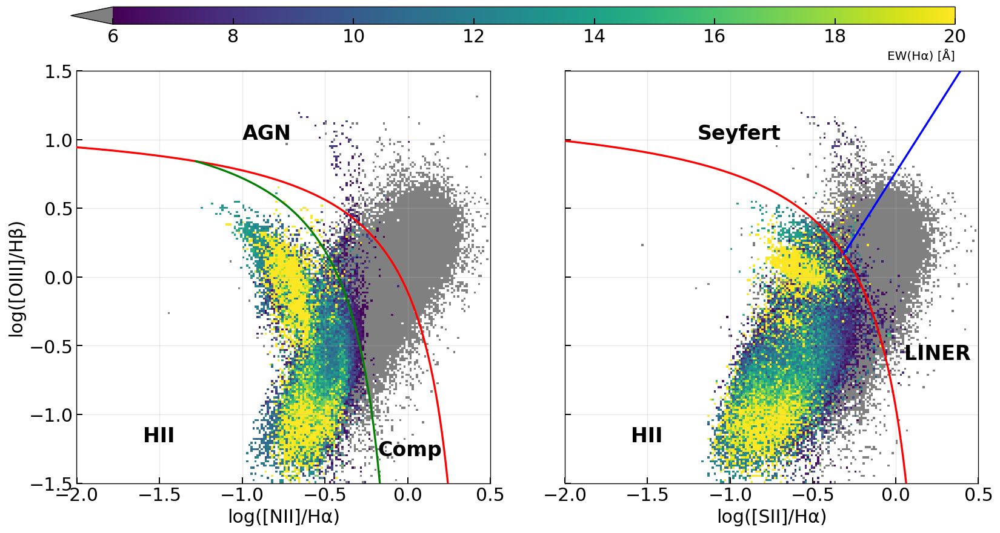


Successfully created combined NII/SII diagrams (flux+SFR+EW mask, color by EW(Hα))
Galaxies included: IC3392, NGC4064, NGC4189, NGC4192, NGC4254, NGC4293, NGC4294, NGC4298, NGC4302, NGC4330, NGC4351, NGC4383, NGC4388, NGC4394, NGC4396, NGC4402, NGC4405, NGC4419, NGC4450, NGC4457, NGC4501, NGC4522, NGC4567_8, NGC4569, NGC4580, NGC4606, NGC4607, NGC4694, NGC4698


In [12]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------
    # Combined Analysis: NII and SII diagrams - color by EW(Halpha)
    # Collect all spaxels from all galaxies (no HII-only selection)
    # Use only dust-corrected emission line fluxes; no O/H needed
    # Apply SFR mask: keep spaxels with finite LOGSFR_SURFACE_DENSITY_HII,
    #                  LOGSFR_SURFACE_DENSITY_NONHII, or LOGSFR_SURFACE_DENSITY_UNCLASSIFIED2
    # ------------------------------------------------------------------
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.colors import LogNorm
    from pathlib import Path
    from astropy.io import fits


    # BPT reference line functions (for drawing curves only, if desired)
    def kewley01_N2(x):   # max-starburst
        return 0.61/(x-0.47) + 1.19


    def kauff03_N2(x):    # empirical SF upper envelope
        return 0.61/(x-0.05) + 1.30


    def kewley01_S2(x):
        return 0.72/(x-0.32) + 1.30


    def kewley06_Sy_LIN(x):   # Seyfert/LINER division
        return 1.89*x + 0.76


    # Error propagation for BPT ratios (log10 numerator/denominator)
    def bpt_error_propagation(numerator, denominator, numerator_err, denominator_err):
        with np.errstate(divide='ignore', invalid='ignore'):
            log_ratio_err = 1/(np.log(10)) * np.sqrt((numerator_err / numerator)**2 + (denominator_err / denominator)**2)
            return log_ratio_err


    # Create x arrays for the theoretical lines (optional overlay)
    x_kewley_N2 = np.linspace(-2.0, 0.3, 200)
    x_kauff_N2 = np.linspace((286-np.sqrt(2871561))/1100, 0.0, 200)
    x_kewley_S2 = np.linspace(-2.0, 0.3, 200)
    x_kewley06_S2 = np.linspace((159-np.sqrt(105081))/525, 0.5, 200)


    # Get all galaxies from binning files
    galaxies = physics_ready_galaxies(require_ew=True)

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    SIGMA_CONTOUR_MAX = 45.0


    # Collect all spaxels from all galaxies (no HII selection)
    all_logN2 = []
    all_logO3 = []
    all_logS2 = []
    all_ew = []

    # Stats for SFR components
    count_hii = 0
    count_nonhii = 0
    count_unclass = 0
    count_union = 0
    sum_check_total = 0
    sum_check_ok = 0
    sum_check_maxabs = []

    # Stats for SF/NONSF/UNCLASSIFIED1 components
    count_sf = 0
    count_nonsf = 0
    count_unclass1 = 0
    count_union_sf = 0

    selection_rows = []
    total_base_c1 = 0
    total_hii_only = 0
    total_hii_ew6 = 0
    total_hii_ew6_sigma = 0

    # Error arrays for spaxel subsets
    err_hii_logN2, err_hii_logS2, err_hii_logO3 = [], [], []
    err_nonhii_logN2, err_nonhii_logS2, err_nonhii_logO3 = [], [], []
    err_unclass_logN2, err_unclass_logS2, err_unclass_logO3 = [], [], []
    err_hii_nonhii_logN2, err_hii_nonhii_logS2, err_hii_nonhii_logO3 = [], [], []
    err_allclasses_logN2, err_allclasses_logS2, err_allclasses_logO3 = [], [], []

    print('Collecting all spaxels from all galaxies (using corrected fluxes + EW, with SFR mask)...')
    for gal in galaxies:
        gas_file = further_gas_path(gal)
        bin_file = further_spatial_path(gal)
        ew_file = further_ew_path(gal, EW_FILE_SUFFIX)

        if gas_file.exists() and bin_file.exists() and ew_file.exists():
            with fits.open(gas_file) as h:
                # Load corrected emission line fluxes
                HB4861_FLUX_corr = h['HB4861_FLUX_CORR'].data
                HA6562_FLUX_corr = h['HA6562_FLUX_CORR'].data
                OIII5006_FLUX_corr = h['OIII5006_FLUX_CORR'].data
                NII6583_FLUX_corr = h['NII6583_FLUX_CORR'].data
                SII6716_FLUX_corr = h['SII6716_FLUX_CORR'].data
                SII6730_FLUX_corr = h['SII6730_FLUX_CORR'].data

                # Load corrected emission line flux errors
                HB4861_FLUX_ERR = h['HB4861_FLUX_ERR'].data
                HA6562_FLUX_ERR = h['HA6562_FLUX_ERR'].data
                OIII5006_FLUX_ERR = h['OIII5006_FLUX_ERR'].data
                NII6583_FLUX_ERR = h['NII6583_FLUX_ERR'].data
                SII6716_FLUX_ERR = h['SII6716_FLUX_ERR'].data
                SII6730_FLUX_ERR = h['SII6730_FLUX_ERR'].data

                # Load SFR surface density maps
                logSigmaSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
                logSigmaSFR_NONHII = h['LOGSFR_SURFACE_DENSITY_NONHII'].data
                logSigmaSFR_UNCLASS = h['LOGSFR_SURFACE_DENSITY_UNCLASSIFIED2'].data
                logSigmaSFR_TOTAL = h['LOGSFR_SURFACE_DENSITY'].data

                # Load SF / NONSF / UNCLASSIFIED1 maps
                logSigmaSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
                logSigmaSFR_NONSF = h['LOGSFR_SURFACE_DENSITY_NONSF'].data
                logSigmaSFR_UNCLASS1 = h['LOGSFR_SURFACE_DENSITY_UNCLASSIFIED1'].data
                HA6562_SIGMA_OBS = h['HA6562_SIGMA'].data
                HA6562_SIGMA_CORR = h['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h else None
                if HA6562_SIGMA_CORR is None:
                    raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gas_file.name}')
                if HA6562_SIGMA_CORR.shape != HA6562_SIGMA_OBS.shape:
                    raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {HA6562_SIGMA_CORR.shape} vs SIGMA {HA6562_SIGMA_OBS.shape}')
                sigma2_intrinsic = HA6562_SIGMA_OBS**2 - HA6562_SIGMA_CORR**2
                HA6562_SIGMA = np.full_like(HA6562_SIGMA_OBS, np.nan, dtype=float)
                sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
                HA6562_SIGMA[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])

            with fits.open(ew_file) as h_ew:
                if EW_HDU not in h_ew:
                    print(f'  {gal}: missing EW HDU {EW_HDU} in {ew_file.name}')
                    continue
                ew_ha = h_ew[EW_HDU].data

            ew_ha = align_map_to_shape(ew_ha, HA6562_FLUX_corr.shape, label=f"{gal} {EW_HDU}")

            # SFR masks
            hii_mask = np.isfinite(logSigmaSFR_HII)
            nonhii_mask = np.isfinite(logSigmaSFR_NONHII)
            unclass_mask = np.isfinite(logSigmaSFR_UNCLASS)
            total_mask = np.isfinite(logSigmaSFR_TOTAL)
            union_mask = hii_mask | nonhii_mask | unclass_mask

            count_hii += np.sum(hii_mask)
            count_nonhii += np.sum(nonhii_mask)
            count_unclass += np.sum(unclass_mask)
            count_union += np.sum(union_mask)

            # SF / NONSF / UNCLASSIFIED1 masks
            sf_mask = np.isfinite(logSigmaSFR_SF)
            nonsf_mask = np.isfinite(logSigmaSFR_NONSF)
            unclass1_mask = np.isfinite(logSigmaSFR_UNCLASS1)
            union_sf_mask = sf_mask | nonsf_mask | unclass1_mask

            count_sf += np.sum(sf_mask)
            count_nonsf += np.sum(nonsf_mask)
            count_unclass1 += np.sum(unclass1_mask)
            count_union_sf += np.sum(union_sf_mask)

            # Check add-up consistency where all components and total are finite
            sum_mask = hii_mask & nonhii_mask & unclass_mask & total_mask
            if np.any(sum_mask):
                diff = logSigmaSFR_TOTAL[sum_mask] - (
                    logSigmaSFR_HII[sum_mask] + logSigmaSFR_NONHII[sum_mask] + logSigmaSFR_UNCLASS[sum_mask]
                )
                sum_check_total += diff.size
                sum_check_ok += np.sum(np.isclose(diff, 0.0, atol=1e-6, rtol=0))
                sum_check_maxabs.append(np.nanmax(np.abs(diff)))

            # Valid where all corrected line fluxes are finite and positive
            flux_mask = (
                np.isfinite(HB4861_FLUX_corr) & (HB4861_FLUX_corr > 0) &
                np.isfinite(HA6562_FLUX_corr) & (HA6562_FLUX_corr > 0) &
                np.isfinite(OIII5006_FLUX_corr) & (OIII5006_FLUX_corr > 0) &
                np.isfinite(NII6583_FLUX_corr) & (NII6583_FLUX_corr > 0) &
                np.isfinite(SII6716_FLUX_corr) & (SII6716_FLUX_corr > 0) &
                np.isfinite(SII6730_FLUX_corr) & (SII6730_FLUX_corr > 0)
            )

            # SFR mask: keep spaxels where any class is finite
            sfr_mask = union_mask

            # EW mask
            ew_mask = np.isfinite(ew_ha) & (ew_ha > 0)
            ew_mask = ew_mask & np.isfinite(HA6562_SIGMA) & (HA6562_SIGMA < 45.0)

            base_c1_mask = flux_mask & union_mask & np.isfinite(ew_ha) & (ew_ha > 0) & np.isfinite(HA6562_SIGMA_CORR) & (HA6562_SIGMA_CORR > 0)
            hii_only_mask = base_c1_mask & np.isfinite(logSigmaSFR_HII)
            hii_ew6_mask = hii_only_mask & np.isfinite(ew_ha) & (ew_ha > 6.0)
            hii_ew6_sigma_mask = hii_ew6_mask & np.isfinite(HA6562_SIGMA) & (HA6562_SIGMA < 45.0)

            n_base_c1 = int(np.sum(base_c1_mask))
            n_hii_only = int(np.sum(hii_only_mask))
            n_hii_ew6 = int(np.sum(hii_ew6_mask))
            n_hii_ew6_sigma = int(np.sum(hii_ew6_sigma_mask))
            selection_rows.append((gal, n_base_c1, n_hii_only, n_hii_ew6, n_hii_ew6_sigma))
            total_base_c1 += n_base_c1
            total_hii_only += n_hii_only
            total_hii_ew6 += n_hii_ew6
            total_hii_ew6_sigma += n_hii_ew6_sigma

            # Combined mask for plotting
            valid_mask = flux_mask & sfr_mask & ew_mask
            n_pixels = np.sum(valid_mask)
            print(f'  {gal}: {n_pixels} valid spaxels (flux+SFR+EW mask)')

            HB_common = HB4861_FLUX_corr[valid_mask]
            HA_common = HA6562_FLUX_corr[valid_mask]
            OIII_common = OIII5006_FLUX_corr[valid_mask]
            NII_common = NII6583_FLUX_corr[valid_mask]
            SII6716_common = SII6716_FLUX_corr[valid_mask]
            SII6730_common = SII6730_FLUX_corr[valid_mask]
            EW_common = ew_ha[valid_mask]

            # Calculate line ratios for all valid spaxels
            logN2 = np.log10(NII_common / HA_common)
            logO3 = np.log10(OIII_common / HB_common)
            logS2 = np.log10((SII6716_common + SII6730_common) / HA_common)

            all_logN2.extend(logN2.flatten())
            all_logO3.extend(logO3.flatten())
            all_logS2.extend(logS2.flatten())
            all_ew.extend(EW_common.flatten())

            # Error propagation for spaxel subsets
            err_mask = (
                np.isfinite(HB4861_FLUX_ERR) & (HB4861_FLUX_ERR > 0) &
                np.isfinite(HA6562_FLUX_ERR) & (HA6562_FLUX_ERR > 0) &
                np.isfinite(OIII5006_FLUX_ERR) & (OIII5006_FLUX_ERR > 0) &
                np.isfinite(NII6583_FLUX_ERR) & (NII6583_FLUX_ERR > 0) &
                np.isfinite(SII6716_FLUX_ERR) & (SII6716_FLUX_ERR > 0) &
                np.isfinite(SII6730_FLUX_ERR) & (SII6730_FLUX_ERR > 0)
            )

            def collect_errs(sub_mask, out_N2, out_S2, out_O3):
                valid_err_mask = flux_mask & err_mask & ew_mask & sub_mask
                if np.any(valid_err_mask):
                    hb = HB4861_FLUX_corr[valid_err_mask]
                    ha = HA6562_FLUX_corr[valid_err_mask]
                    o3 = OIII5006_FLUX_corr[valid_err_mask]
                    n2 = NII6583_FLUX_corr[valid_err_mask]
                    s2_1 = SII6716_FLUX_corr[valid_err_mask]
                    s2_2 = SII6730_FLUX_corr[valid_err_mask]

                    hb_err = HB4861_FLUX_ERR[valid_err_mask]
                    ha_err = HA6562_FLUX_ERR[valid_err_mask]
                    o3_err = OIII5006_FLUX_ERR[valid_err_mask]
                    n2_err = NII6583_FLUX_ERR[valid_err_mask]
                    s2_1_err = SII6716_FLUX_ERR[valid_err_mask]
                    s2_2_err = SII6730_FLUX_ERR[valid_err_mask]

                    s2 = s2_1 + s2_2
                    s2_err = np.sqrt(s2_1_err**2 + s2_2_err**2)

                    err_logN2 = bpt_error_propagation(n2, ha, n2_err, ha_err)
                    err_logS2 = bpt_error_propagation(s2, ha, s2_err, ha_err)
                    err_logO3 = bpt_error_propagation(o3, hb, o3_err, hb_err)

                    out_N2.extend(err_logN2[np.isfinite(err_logN2)])
                    out_S2.extend(err_logS2[np.isfinite(err_logS2)])
                    out_O3.extend(err_logO3[np.isfinite(err_logO3)])

            collect_errs(hii_mask, err_hii_logN2, err_hii_logS2, err_hii_logO3)
            collect_errs(nonhii_mask, err_nonhii_logN2, err_nonhii_logS2, err_nonhii_logO3)
            collect_errs(unclass_mask, err_unclass_logN2, err_unclass_logS2, err_unclass_logO3)
            collect_errs(hii_mask | nonhii_mask, err_hii_nonhii_logN2, err_hii_nonhii_logS2, err_hii_nonhii_logO3)
            collect_errs(union_mask, err_allclasses_logN2, err_allclasses_logS2, err_allclasses_logO3)
        else:
            missing_parts = []
            if not gas_file.exists():
                missing_parts.append(gas_file.name)
            if not bin_file.exists():
                missing_parts.append(bin_file.name)
            if not ew_file.exists():
                missing_parts.append(ew_file.name)
            print(f"  {gal}: Missing files -> {', '.join(missing_parts)}")

    # Convert to numpy arrays
    all_logN2 = np.array(all_logN2)
    all_logO3 = np.array(all_logO3)
    all_logS2 = np.array(all_logS2)
    all_ew = np.array(all_ew)

    if len(all_logN2) == 0:
        raise RuntimeError('No valid spaxels found after applying flux+SFR+EW masks.')
    if len(all_ew) != len(all_logN2):
        raise RuntimeError('EW array length mismatch with BPT arrays.')

    # Report SFR component stats
    print(f'\nTotal combined valid spaxels (flux+SFR+EW mask): {len(all_logN2)}')
    if count_union > 0:
        print('\nSFR component counts (finite spaxels, all galaxies combined):')
        print(f'  HII: {count_hii} ({count_hii / count_union * 100:.3f}%)')
        print(f'  NONHII: {count_nonhii} ({count_nonhii / count_union * 100:.3f}%)')
        print(f'  UNCLASSIFIED2: {count_unclass} ({count_unclass / count_union * 100:.3f}%)')

    if count_union > 0:
        print('\nSF component counts (finite spaxels, all galaxies combined):')
        print(f'  SF: {count_sf} ({count_sf / count_union * 100:.3f}%)')
        print(f'  NONSF: {count_nonsf} ({count_nonsf / count_union * 100:.3f}%)')
        print(f'  UNCLASSIFIED1: {count_unclass1} ({count_unclass1 / count_union * 100:.3f}%)')

    if sum_check_total > 0:
        max_abs_diff = np.nanmax(sum_check_maxabs) if len(sum_check_maxabs) > 0 else np.nan
        print('\nCheck LOGSFR_SURFACE_DENSITY ≈ HII + NONHII + UNCLASSIFIED2 (finite spaxels):')
        print(f'  Passed: {sum_check_ok} / {sum_check_total} ({sum_check_ok / sum_check_total:.3f})')
        print(f'  Max |Δ|: {max_abs_diff:.3e}')

    def frac(numerator, denominator):
        return np.nan if denominator == 0 else numerator / denominator

    print('\nSelection chain (per galaxy):')
    print('  Base(Cell1) -> HII -> HII+EW>6 -> HII+EW>6+sigma_int<45')
    header_sel = (
        f"{'Galaxy':<10} {'Base(C1)':>10} {'HII':>10} {'f(HII)':>10} "
        f"{'HII+EW>6':>12} {'f(HII+EW)':>12} {'HII+EW+sig<45':>16} {'f(final)':>10}"
    )
    print(header_sel)
    print('-' * len(header_sel))
    for gal_sel, n_base_sel, n_hii_sel, n_hii_ew_sel, n_hii_ew_sig_sel in selection_rows:
        print(
            f"{gal_sel:<10} {n_base_sel:10d} {n_hii_sel:10d} {frac(n_hii_sel, n_base_sel):10.4f} "
            f"{n_hii_ew_sel:12d} {frac(n_hii_ew_sel, n_base_sel):12.4f} {n_hii_ew_sig_sel:16d} {frac(n_hii_ew_sig_sel, n_base_sel):10.4f}"
        )
    print('-' * len(header_sel))
    print(
        f"{'ALL':<10} {total_base_c1:10d} {total_hii_only:10d} {frac(total_hii_only, total_base_c1):10.4f} "
        f"{total_hii_ew6:12d} {frac(total_hii_ew6, total_base_c1):12.4f} {total_hii_ew6_sigma:16d} {frac(total_hii_ew6_sigma, total_base_c1):10.4f}"
    )

    # Mean log-errors for requested subsets

    def mean_or_nan(arr):
        return np.nanmean(arr) if len(arr) > 0 else np.nan

    print('\nMean log-error (spaxel subsets):')
    print(f'  HII only       - log([NII]/Hα): {mean_or_nan(err_hii_logN2):.4f}, log([SII]/Hα): {mean_or_nan(err_hii_logS2):.4f}, log([OIII]/Hβ): {mean_or_nan(err_hii_logO3):.4f}')
    print(f'  NONHII only    - log([NII]/Hα): {mean_or_nan(err_nonhii_logN2):.4f}, log([SII]/Hα): {mean_or_nan(err_nonhii_logS2):.4f}, log([OIII]/Hβ): {mean_or_nan(err_nonhii_logO3):.4f}')
    print(f'  UNCLASS only   - log([NII]/Hα): {mean_or_nan(err_unclass_logN2):.4f}, log([SII]/Hα): {mean_or_nan(err_unclass_logS2):.4f}, log([OIII]/Hβ): {mean_or_nan(err_unclass_logO3):.4f}')
    print(f'  HII+NONHII     - log([NII]/Hα): {mean_or_nan(err_hii_nonhii_logN2):.4f}, log([SII]/Hα): {mean_or_nan(err_hii_nonhii_logS2):.4f}, log([OIII]/Hβ): {mean_or_nan(err_hii_nonhii_logO3):.4f}')
    print(f'  HII+NONHII+UNC - log([NII]/Hα): {mean_or_nan(err_allclasses_logN2):.4f}, log([SII]/Hα): {mean_or_nan(err_allclasses_logS2):.4f}, log([OIII]/Hβ): {mean_or_nan(err_allclasses_logO3):.4f}')

    # Create diagrams for all spaxels (2D EW color)
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)
    plt.subplots_adjust(wspace=0.18, top=0.82)

    import copy

    cmap_ew = copy.copy(plt.get_cmap('viridis'))
    cmap_ew.set_under('grey')

    # Binning and ranges
    xlim = (-2.0, 0.5)
    ylim = (-1.5, 1.5)
    bins_2d = 200
    min_count_per_bin = 3
    vmin_ew = 6.0
    vmax_ew = 20.0

    # NII panel EW grid
    hist_N2, xedges_N2, yedges_N2 = np.histogram2d(
        all_logN2, all_logO3, bins=bins_2d, range=[xlim, ylim]
    )
    sum_ew_N2, _, _ = np.histogram2d(
        all_logN2, all_logO3, bins=bins_2d, range=[xlim, ylim], weights=all_ew
    )
    mean_ew_N2 = np.divide(
        sum_ew_N2,
        hist_N2,
        out=np.full_like(sum_ew_N2, np.nan, dtype=float),
        where=hist_N2 > 0,
    )
    mean_ew_N2[hist_N2 < min_count_per_bin] = np.nan

    # SII panel EW grid
    hist_S2, xedges_S2, yedges_S2 = np.histogram2d(
        all_logS2, all_logO3, bins=bins_2d, range=[xlim, ylim]
    )
    sum_ew_S2, _, _ = np.histogram2d(
        all_logS2, all_logO3, bins=bins_2d, range=[xlim, ylim], weights=all_ew
    )
    mean_ew_S2 = np.divide(
        sum_ew_S2,
        hist_S2,
        out=np.full_like(sum_ew_S2, np.nan, dtype=float),
        where=hist_S2 > 0,
    )
    mean_ew_S2[hist_S2 < min_count_per_bin] = np.nan

    # NII diagram
    ax = axes[0]
    img_N2 = ax.pcolormesh(
        xedges_N2,
        yedges_N2,
        np.ma.masked_invalid(mean_ew_N2.T),
        cmap=cmap_ew,
        vmin=vmin_ew,
        vmax=vmax_ew,
        shading='auto',
        edgecolors='face',
        linewidths=0
    )

    # Optional: overlay BPT curves as reference only
    ax.plot(x_kewley_N2, kewley01_N2(x_kewley_N2), 'r-', lw=2, label='Kewley+01', zorder=10)
    ax.plot(x_kauff_N2, kauff03_N2(x_kauff_N2), 'g-', lw=2, label='Kauffmann+03', zorder=10)

    ax.set_xlabel('log([NII]/Hα)', fontsize=18)
    ax.set_ylabel('log([OIII]/Hβ)', fontsize=18)
    ax.tick_params(axis='both', which='major', labelsize=18)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.text(-1.6, -1.2, 'HII', fontsize=20, fontweight='bold')
    ax.text(-0.18, -1.3, 'Comp', fontsize=20, fontweight='bold')
    ax.text(-1.0, 1.0, 'AGN', fontsize=20, fontweight='bold')
    ax.grid(True, alpha=0.3)

    # SII diagram
    ax = axes[1]
    img_S2 = ax.pcolormesh(
        xedges_S2,
        yedges_S2,
        np.ma.masked_invalid(mean_ew_S2.T),
        cmap=cmap_ew,
        vmin=vmin_ew,
        vmax=vmax_ew,
        shading='auto',
        edgecolors='face',
        linewidths=0
    )

    ax.plot(x_kewley_S2, kewley01_S2(x_kewley_S2), 'r-', lw=2, label='Kewley+01', zorder=10)
    ax.plot(x_kewley06_S2, kewley06_Sy_LIN(x_kewley06_S2), 'b-', lw=2, label='Kewley+06', zorder=10)

    ax.set_xlabel('log([SII]/Hα)', fontsize=18)
    ax.set_ylabel('')
    ax.tick_params(axis='both', which='major', labelsize=18)
    ax.tick_params(axis='y', labelleft=False)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.text(-1.6, -1.2, 'HII', fontsize=20, fontweight='bold')
    ax.text(-1.2, 1.0, 'Seyfert', fontsize=20, fontweight='bold')
    ax.text(0.05, -0.6, 'LINER', fontsize=20, fontweight='bold')
    ax.grid(True, alpha=0.3)

    # Shared colorbar (top, spanning both panels)
    cax = fig.add_axes([0.12, 0.9, 0.76, 0.03])
    cbar = fig.colorbar(img_N2, cax=cax, orientation='horizontal', extend='min')
    cbar.set_label('EW(Hα) [Å]', fontsize=12, loc='right')
    cbar.ax.tick_params(labelsize=18)

    # Save figures
    output_dir = Path('Plot_Paper_1')
    output_dir.mkdir(parents=True, exist_ok=True)
    # fig.savefig(output_dir / 'Combined_BPT_diagrams_by_EW_HII_NONHII.png', dpi=600, bbox_inches='tight')
    # fig.savefig(output_dir / 'Combined_BPT_diagrams_by_EW_HII_NONHII.pdf', bbox_inches='tight')
    plt.show()

    print('\nSuccessfully created combined NII/SII diagrams (flux+SFR+EW mask, color by EW(Hα))')
    print('Galaxies included: ' + ', '.join(galaxies))
else:
    print("Skipped copied previous-project analysis cell 3: no nested *_further mass/SFR/OH+EW products are ready yet.")


  NGC4419 PROXY_EWHA: aligned shape (643, 628) -> (643, 629); overlap=(643, 628)
  NGC4694 PROXY_EWHA: aligned shape (440, 439) -> (441, 439); overlap=(440, 439)


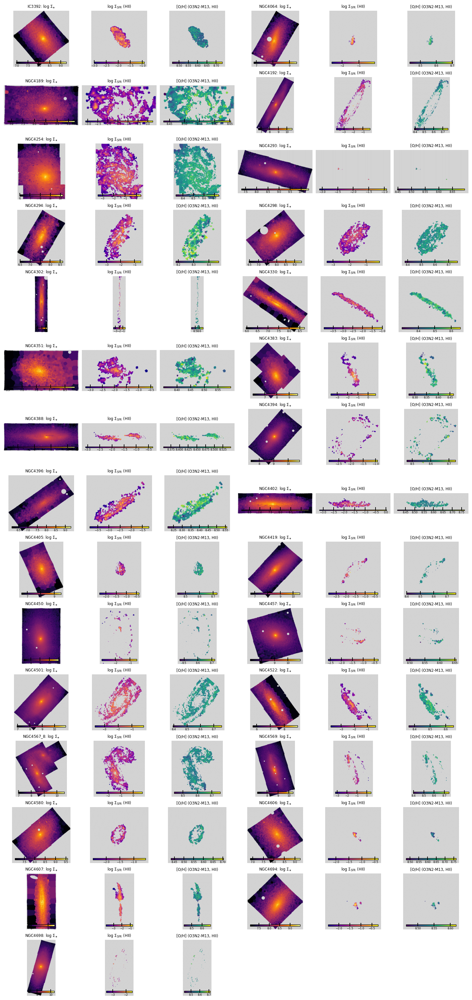

In [13]:
if old_paper_cells_ready(require_ew=True):
    # --------------------------------------------------------------
    # Maps: Σ_M*, Σ_SFR and [O/H] (O3N2-M13) maps for each galaxy
    # Using HII spaxels (common HII for Σ_SFR and O/H only)
    # Layout: dynamic rows, two 3-column galaxy blocks per row
    # Columns per row: [Σ_M*, Σ_SFR, [O/H]] × 2 blocks
    # --------------------------------------------------------------
    import math
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.gridspec import GridSpec
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes
    from pathlib import Path
    from astropy.io import fits

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    EW_MIN = 6.0


    # 0 · discover galaxies
    galaxies = physics_ready_galaxies(require_ew=True)
    ngal     = len(galaxies)
    if ngal == 0:
        print("No galaxies with mass, SFR, O/H, and EW maps are ready yet.")

    # 1 · helpers to load maps (no mask for mass; HII mask for Σ_SFR and O/H)
    def load_maps_hii(gal):
        """
        Load stellar-mass surface density (from spatial-binning file),
        Σ_SFR (HII), and [O/H] (O3N2-M13, HII) for a galaxy.

        - Σ_M* is shown wherever it is finite (no HII mask).
        - Σ_SFR and [O/H] use a common HII mask requiring both to be finite.
        """
        with fits.open(further_spatial_path(gal)) as h_bin:
            logSigmaM = h_bin['LOGMASS_SURFACE_DENSITY'].data
        with fits.open(further_gas_path(gal)) as h_gas:
            sigSFR_HII     = h_gas['LOGSFR_SURFACE_DENSITY_HII'].data
            ha_sigma_obs = h_gas['HA6562_SIGMA'].data
            ha_sigma_corr = h_gas['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h_gas else None
            if ha_sigma_corr is None:
                raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gal}_gas_BIN_maps_extended.fits')
            if ha_sigma_corr.shape != ha_sigma_obs.shape:
                raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {ha_sigma_corr.shape} vs SIGMA {ha_sigma_obs.shape}')
            sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
            ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
            sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
            ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
            oh_o3n2m13_HII = h_gas['O_H_O3N2_M13_HII'].data

        ew_file = further_ew_path(gal, EW_FILE_SUFFIX)
        with fits.open(ew_file) as h_ew:
            if EW_HDU not in h_ew:
                raise KeyError(f"Missing {EW_HDU} in {ew_file}")
            ew_ha = h_ew[EW_HDU].data
        ew_ha = align_map_to_shape(ew_ha, sigSFR_HII.shape, label=f"{gal} {EW_HDU}")

        # Mass: just require Σ_M* to be finite
        mass_mask   = np.isfinite(logSigmaM)
        logSigmaM_c = np.where(mass_mask, logSigmaM, np.nan)

        # HII common mask for Σ_SFR and O/H
        hii_mask        = (np.isfinite(sigSFR_HII) & np.isfinite(oh_o3n2m13_HII) & np.isfinite(ew_ha) & (ew_ha > EW_MIN))
        hii_mask = hii_mask & np.isfinite(ha_sigma) & (ha_sigma < 45.0)
        sigSFR_HII_c    = np.where(hii_mask, sigSFR_HII, np.nan)
        oh_o3n2m13_c    = np.where(hii_mask, oh_o3n2m13_HII, np.nan)

        return logSigmaM_c, sigSFR_HII_c, oh_o3n2m13_c

    # 2 · figure & GridSpec  (two 3-column blocks per row)
    # Use constrained_layout for better handling of colorbars and spacing
    nrows = max(1, math.ceil(ngal / 2))
    fig = plt.figure(figsize=(12, max(3.0, 1.7 * nrows)), constrained_layout=True)
    gs  = GridSpec(
            nrows=nrows, ncols=6, figure=fig,
            width_ratios=[1, 1, 1, 1, 1, 1],      # [Σ_M*, Σ_SFR, [O/H]] × 2 blocks
            wspace=0.00, hspace=0.00
    )

    for idx, gal in enumerate(galaxies):
        row  = idx // 2                     # dynamic row index
        blk  = idx % 2                      # 0 or 1   (left / right 3-column block)
        col0 = blk * 3                      # 0 or 3   (start col of that block)

        logSigmaM_c, sigSFR_HII_c, oh_o3n2m13_c = load_maps_hii(gal)

        # Σ_M* map with NaN shown as light gray
        axM = fig.add_subplot(gs[row, col0])
        cmap_M = plt.cm.inferno.copy(); cmap_M.set_bad('lightgray')
        imM = axM.imshow(logSigmaM_c, origin='lower', cmap=cmap_M)
        axM.set_title(rf'{gal}: $\log\,\Sigma_{{\ast}}$', fontsize=7)
        axM.axis('off')
        caxM = inset_axes(axM, width='90%', height='3%', loc='lower center', borderpad=0.6)
        fig.colorbar(imM, cax=caxM, orientation='horizontal')
        caxM.tick_params(labelsize=5, pad=1)

        # Σ_SFR (HII) map with NaN shown as light gray
        axS = fig.add_subplot(gs[row, col0+1])
        cmap_S = plt.cm.plasma.copy(); cmap_S.set_bad('lightgray')
        imS = axS.imshow(sigSFR_HII_c, origin='lower', cmap=cmap_S)
        axS.set_title(r'$\log\,\Sigma_{\mathrm{SFR}}$ (HII)', fontsize=7)
        axS.axis('off')
        caxS = inset_axes(axS, width='90%', height='3%', loc='lower center', borderpad=0.6)
        fig.colorbar(imS, cax=caxS, orientation='horizontal')
        caxS.tick_params(labelsize=5, pad=1)

        # [O/H] O3N2-M13 (HII) map with NaN shown as light gray
        axOH = fig.add_subplot(gs[row, col0+2])
        cmap_OH = plt.cm.viridis.copy(); cmap_OH.set_bad('lightgray')
        imOH = axOH.imshow(oh_o3n2m13_c, origin='lower', cmap=cmap_OH)
        axOH.set_title(r'[O/H] (O3N2-M13, HII)', fontsize=7)
        axOH.axis('off')
        caxOH = inset_axes(axOH, width='90%', height='3%', loc='lower center', borderpad=0.6)
        fig.colorbar(imOH, cax=caxOH, orientation='horizontal')
        caxOH.tick_params(labelsize=5, pad=1)

    # Save figure in both PNG and PDF formats
    # Add a little extra space below plots via pad_inches
    # fig.savefig('Plot_Paper_1/MAUVE_MUSE_SigmaM_SigmaSFR_OH_Maps_HII_6x7_EW.png', dpi=600, bbox_inches='tight', pad_inches=0.05)
    # fig.savefig('Plot_Paper_1/MAUVE_MUSE_SigmaM_SigmaSFR_OH_Maps_HII_6x7_EW.pdf', dpi=600, pad_inches=0.05)

    plt.show()
else:
    print("Skipped copied previous-project analysis cell 4: no nested *_further mass/SFR/OH+EW products are ready yet.")


In [14]:
# # ------------------------------------------------------------------
# # Combined Analysis: rMZR and Z_gas-Σ_SFR relation - HII regions only
# # Using O3N2-M13 indicator only
# # 2x2 subplot layout:
# #   Top-left: rMZR scatter
# #   Top-right: Z_gas-Σ_SFR scatter
# #   Bottom-left: rMZR median trends
# #   Bottom-right: Z_gas-Σ_SFR median trends
# # ------------------------------------------------------------------
# import numpy as np
# import matplotlib.pyplot as plt
# from pathlib import Path
# from astropy.io import fits
# import scipy.stats as stats

# def load_maps_o3n2_m13(gal):
#     """Load O3N2-M13 metallicity calibration for HII regions"""
#     with fits.open(further_spatial_path(gal)) as h:
#         sigM = h['LOGMASS_SURFACE_DENSITY'].data
#     with fits.open(further_gas_path(gal)) as h:
#         # HII regions
#         sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
#         oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
#     return (sigM, sigSFR_HII, oh_o3n2_m13_HII)

# def calculate_binned_stats(x_data, y_data, bin_width=0.2, min_pixels=20):
#     """Calculate median and std in bins - only keep bins with >= 20 unique datapoints"""
#     # Define bins
#     x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
#     bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
#     bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
#     medians = []
#     stds = []
#     counts = []
#     valid_centers = []
#     valid_bin_indices = []
    
#     for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
#         # Select data in this bin
#         in_bin = (x_data >= bin_start) & (x_data < bin_end)
#         y_in_bin = y_data[in_bin]
        
#         if len(np.unique(y_in_bin)) >= min_pixels:
#             medians.append(np.median(y_in_bin))
#             stds.append(np.std(y_in_bin))
#             counts.append(len(y_in_bin))
#             valid_centers.append(bin_centers[i])
#             valid_bin_indices.append(i)
    
#     return (np.array(valid_centers), np.array(medians), np.array(stds), 
#             np.array(counts), np.array(valid_bin_indices))

# # Get all galaxies
# bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
# galaxies = [f.name.split('_')[0] for f in bins]

# # Galaxies to exclude entirely
# excluded_galaxies = {'NGC4383'}
# included_galaxies = []

# # ==============================================================================
# # STEP 1: Collect all spaxels from all galaxies for HII regions
# # ==============================================================================
# all_logSigmaM_HII = []
# all_logSigmaSFR_HII = []
# all_oh_o3n2_m13_HII = []

# print("="*80)
# print("STEP 1: Collecting data from all galaxies for HII regions (O3N2-M13 only)...")
# print("="*80)

# for gal in galaxies:
#     if gal in excluded_galaxies:
#         print(f"  {gal}: excluded from analysis")
#         continue

#     bin_file = further_spatial_path(gal)
#     gas_file = further_gas_path(gal)

#     if bin_file.exists() and gas_file.exists():
#         included_galaxies.append(gal)
#         # Load data for HII regions
#         (logSigmaM, logSigmaSFR_HII, oh_o3n2_m13_HII) = load_maps_o3n2_m13(gal)

#         # Find common spaxels for HII regions
#         common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
#                            np.isfinite(oh_o3n2_m13_HII))
        
#         print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
        
#         # Append HII data
#         all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
#         all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
#         all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
#     else:
#         print(f"  {gal}: Data files not found")

# # Convert to numpy arrays
# all_logSigmaM_HII = np.array(all_logSigmaM_HII)
# all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
# all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)

# print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")

# # ==============================================================================
# # STEP 2: Define 8 Σ_SFR bins for rMZR analysis
# # Bins: <-3.5, [-3.5,-3.0), [-3.0,-2.5), [-2.5,-2.0), [-2.0,-1.5), [-1.5,-1.0), [-1.0,-0.5), >=-0.5
# # ==============================================================================
# print("\n" + "="*80)
# print("STEP 2: Defining 8 SFR bins for rMZR")
# print("="*80)

# # Define 8 bins with specific boundaries
# n_bins = 8
# # Bin edges: -inf, -3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5, np.inf
# sfr_bin_edges = [-np.inf, -3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5, np.inf]

# print(f"\nΣ_SFR bins:")
# print(f"  Number of bins: {n_bins}")

# # Create bin labels
# bin_labels = [
#     '<-3.5',
#     '-3.5–-3.0',
#     '-3.0–-2.5',
#     '-2.5–-2.0',
#     '-2.0–-1.5',
#     '-1.5–-1.0',
#     '-1.0–-0.5',
#     '>-0.5'
# ]

# print(f"\n8 SFR bins:")
# for i, label in enumerate(bin_labels):
#     print(f"  Bin {i+1}: {label}")

# # Colors for different bins using rainbow colormap
# colors_sfr = plt.cm.rainbow(np.linspace(0, 1, n_bins))

# # ==============================================================================
# # STEP 3: Define 8 Σ_* bins for Z_gas-Σ_SFR analysis
# # Bins: <6.5, [6.5,7.0), [7.0,7.5), [7.5,8.0), [8.0,8.5), [8.5,9.0), [9.0,9.5), >=9.5
# # ==============================================================================
# print("\n" + "="*80)
# print("STEP 3: Defining 8 Σ_* bins for Z_gas-Σ_SFR")
# print("="*80)

# # Define 8 Σ_* bins with specific boundaries
# n_bins_sigmaM = 8
# # Bin edges: -inf, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, +inf
# sigmaM_bin_edges = [-np.inf, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, np.inf]

# print(f"\nΣ_* bins:")
# print(f"  Number of bins: {n_bins_sigmaM}")

# # Create bin labels for Σ_* bins
# bin_labels_sigmaM = [
#     '<6.5',
#     '6.5–7.0',
#     '7.0–7.5',
#     '7.5–8.0',
#     '8.0–8.5',
#     '8.5–9.0',
#     '9.0–9.5',
#     '>9.5'
# ]

# print(f"\n8 Σ_* bins:")
# for i, label in enumerate(bin_labels_sigmaM):
#     print(f"  Bin {i+1}: {label}")

# # Colors for 8 Σ_* bins: gradient from blue (low Σ_*) to red (high Σ_*)
# colors_sigmaM = plt.cm.coolwarm(np.linspace(0.1, 0.9, n_bins_sigmaM))

# # ==============================================================================
# # STEP 4: Create combined 2x2 figure (rMZR & Z_gas-Σ_SFR)
# # ==============================================================================
# print("\n" + "="*80)
# print("STEP 4: Creating combined 2x2 plot (O3N2-M13 only)")
# print("="*80)

# # Set uniform y-axis range
# common_ylim = (8.2, 8.9)

# print(f"\nUsing uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

# # Create figure with 2 rows x 2 columns, sharing axes
# # sharex='col': Top-Left shares with Bottom-Left, Top-Right shares with Bottom-Right
# # sharey='all': All panels share Y axis (since all are [O/H])
# fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharex='col', sharey='all')
# plt.subplots_adjust(wspace=0.05, hspace=0.05)

# # Use O3N2-M13 data
# oh_data_HII = all_oh_o3n2_m13_HII
# calib_name_HII = 'O3N2-M13'

# print(f"\nProcessing {calib_name_HII} calibration for HII regions:")
# print(f"  HII {calib_name_HII} range: {np.min(oh_data_HII):.3f} to {np.max(oh_data_HII):.3f}")

# # Assign axes (swap top-right with bottom-left)
# ax_rMZR_scatter = axes[0, 0]
# ax_Zgas_scatter = axes[0, 1]
# ax_rMZR_median = axes[1, 0]
# ax_Zgas_median = axes[1, 1]

# # =============================================================================
# # TOP ROW LEFT: rMZR scatter (in 8 Σ_SFR bins)
# # =============================================================================
# print(f"\n--- Processing rMZR (8 Σ_SFR bins) ---")

# legend_handles_sfr = []
# legend_labels_sfr = []

# valid_bins_rMZR = 0
# for i in range(n_bins):
#     # HII regions processing - handle all bins uniformly
#     in_bin_HII = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII < sfr_bin_edges[i+1])
    
#     n_pixels_HII = np.sum(in_bin_HII)
    
#     if n_pixels_HII >= 10:
#         # Get data for this bin (x=Σ_*, y=[O/H])
#         x_bin_HII = all_logSigmaM_HII[in_bin_HII]
#         y_bin_HII = oh_data_HII[in_bin_HII]
        
#         # Scatter plot
#         scatter_hii = ax_rMZR_scatter.scatter(x_bin_HII, y_bin_HII, c=[colors_sfr[i]], s=15, alpha=0.6, 
#                              edgecolors='none', rasterized=True)
        
#         legend_handles_sfr.append(scatter_hii)
#         legend_labels_sfr.append(bin_labels[i])
        
#         # Median trends
#         mass_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(
#             x_bin_HII, y_bin_HII, bin_width=0.2, min_pixels=20)
        
#         if len(mass_centers_HII) > 0:
#             ax_rMZR_median.errorbar(mass_centers_HII, medians_HII, yerr=stds_HII, 
#                        color=colors_sfr[i], marker='o', markersize=6, 
#                        linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
            
#             # Add lines between adjacent bins
#             for j in range(len(valid_bin_indices_HII) - 1):
#                 current_bin_idx = valid_bin_indices_HII[j]
#                 next_bin_idx = valid_bin_indices_HII[j + 1]
#                 if next_bin_idx - current_bin_idx == 1:
#                     ax_rMZR_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], 
#                            [medians_HII[j], medians_HII[j + 1]], 
#                            color=colors_sfr[i], linewidth=2, alpha=0.8)
#             valid_bins_rMZR += 1

# # Format rMZR scatter plot
# # No title
# # No xlabel (shared with bottom)
# ax_rMZR_scatter.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
# ax_rMZR_scatter.grid(True, alpha=0.3)
# ax_rMZR_scatter.set_xlim(6, 10)
# ax_rMZR_scatter.set_ylim(common_ylim)

# # =============================================================================
# # BOTTOM ROW LEFT: rMZR median trends
# # =============================================================================
# # No title
# ax_rMZR_median.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax_rMZR_median.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
# ax_rMZR_median.grid(True, alpha=0.3)
# ax_rMZR_median.set_xlim(6, 10)
# ax_rMZR_median.set_ylim(common_ylim)

# # Add legend to bottom panel
# ax_rMZR_median.legend(legend_handles_sfr, legend_labels_sfr, loc='upper center', 
#                      ncol=4, fontsize=12, framealpha=0.9,
#                      title='rMZR: log(ΣSFR) bins', title_fontsize=12)

# print(f"  rMZR valid bins: {valid_bins_rMZR}")

# # =============================================================================
# # TOP ROW RIGHT: Z_gas-Σ_SFR scatter (in 8 Σ_* bins)
# # =============================================================================
# print(f"\n--- Processing Z_gas-Σ_SFR (8 Σ_* bins) ---")

# legend_handles_sigmaM = []
# legend_labels_sigmaM_display = []

# valid_bins_Zgas = 0
# for i in range(n_bins_sigmaM):
#     # HII regions processing - handle all bins uniformly
#     in_bin_HII = (all_logSigmaM_HII >= sigmaM_bin_edges[i]) & (all_logSigmaM_HII < sigmaM_bin_edges[i+1])
    
#     n_pixels_HII = np.sum(in_bin_HII)
    
#     if n_pixels_HII >= 10:
#         # Get data for this bin (x=Σ_SFR, y=[O/H])
#         x_bin_HII = all_logSigmaSFR_HII[in_bin_HII]
#         y_bin_HII = oh_data_HII[in_bin_HII]
        
#         # Scatter plot
#         scatter_hii = ax_Zgas_scatter.scatter(x_bin_HII, y_bin_HII, c=[colors_sigmaM[i]], s=15, alpha=0.6, 
#                              edgecolors='none', rasterized=True)
        
#         legend_handles_sigmaM.append(scatter_hii)
#         legend_labels_sigmaM_display.append(bin_labels_sigmaM[i])
        
#         # Median trends (now bin by Σ_SFR)
#         sfr_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(
#             x_bin_HII, y_bin_HII, bin_width=0.2, min_pixels=20)
        
#         if len(sfr_centers_HII) > 0:
#             ax_Zgas_median.errorbar(sfr_centers_HII, medians_HII, yerr=stds_HII, 
#                        color=colors_sigmaM[i], marker='o', markersize=6, 
#                        linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
            
#             # Add lines between adjacent bins
#             for j in range(len(valid_bin_indices_HII) - 1):
#                 current_bin_idx = valid_bin_indices_HII[j]
#                 next_bin_idx = valid_bin_indices_HII[j + 1]
#                 if next_bin_idx - current_bin_idx == 1:
#                     ax_Zgas_median.plot([sfr_centers_HII[j], sfr_centers_HII[j + 1]], 
#                            [medians_HII[j], medians_HII[j + 1]], 
#                            color=colors_sigmaM[i], linewidth=2, alpha=0.8)
#             valid_bins_Zgas += 1

# # Format Z_gas-Σ_SFR scatter plot
# # No title
# # No xlabel (shared with bottom)
# # No ylabel (shared with left)
# ax_Zgas_scatter.grid(True, alpha=0.3)
# ax_Zgas_scatter.set_xlim(-5.0, 0.5)
# ax_Zgas_scatter.set_ylim(common_ylim)

# # =============================================================================
# # BOTTOM ROW RIGHT: Z_gas-Σ_SFR median trends
# # =============================================================================
# # No title
# ax_Zgas_median.set_xlabel(r'$\log\,\Sigma_\mathrm{SFR} \; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
# # No ylabel (shared with left)
# ax_Zgas_median.grid(True, alpha=0.3)
# ax_Zgas_median.set_xlim(-5.0, 0.5)
# ax_Zgas_median.set_ylim(common_ylim)

# # Add legend to bottom panel
# ax_Zgas_median.legend(legend_handles_sigmaM, legend_labels_sigmaM_display, loc='upper center', 
#                      ncol=4, fontsize=12, framealpha=0.9,
#                      title='Z_gas-Σ_SFR: log(Σ*) bins', title_fontsize=12)

# print(f"  Z_gas-Σ_SFR valid bins: {valid_bins_Zgas}")

# plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13.png', dpi=600, bbox_inches='tight')
# plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13.pdf', bbox_inches='tight')
# plt.show()

# print("\n" + "="*80)
# print("COMPLETED: Combined rMZR and Z_gas-Σ_SFR analysis (O3N2-M13 only)")
# print("="*80)
# print(f"Successfully created 2x2 subplot figure showing HII regions from {len(included_galaxies)} galaxies")
# print(f"Galaxies included: {', '.join(included_galaxies)}")
# print(f"Excluded: {', '.join(sorted(excluded_galaxies))}")
# print("\nPanel summary:")
# print("  Top-left: rMZR scatter (8 Σ_SFR bins)")
# print("  Top-right: Z_gas-Σ_SFR scatter (8 Σ_* bins)")
# print("  Bottom-left: rMZR median trends (8 Σ_SFR bins)")
# print("  Bottom-right: Z_gas-Σ_SFR median trends (8 Σ_* bins)")
# print(f"  Shared y-range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")


Offset relations and Spearman rho vs Σ_* (excluding: {'NGC4383'})
All galaxies (for color assignment): IC3392, NGC4064, NGC4189, NGC4192, NGC4254, NGC4293, NGC4294, NGC4298, NGC4302, NGC4330, NGC4351, NGC4383, NGC4388, NGC4394, NGC4396, NGC4402, NGC4405, NGC4419, NGC4450, NGC4457, NGC4501, NGC4522, NGC4567_8, NGC4569, NGC4580, NGC4606, NGC4607, NGC4694, NGC4698
Galaxies used in this analysis: IC3392, NGC4064, NGC4189, NGC4192, NGC4254, NGC4293, NGC4294, NGC4298, NGC4302, NGC4330, NGC4351, NGC4388, NGC4394, NGC4396, NGC4402, NGC4405, NGC4419, NGC4450, NGC4457, NGC4501, NGC4522, NGC4567_8, NGC4569, NGC4580, NGC4606, NGC4607, NGC4694, NGC4698

Processing IC3392 ...
  Σ* range (95%): 8.008 to 8.824
  Global Δlog(Σ_SFR) axis limits: ±0.930
  Global Δ[O/H] axis limits: ±0.161
  Spearman rho in each Σ_* bin (3σ clip + trend, per galaxy):
    Bin 01 (8.08): n=1937, r=0.366 (p=1.69e-62)
    Bin 02 (8.21): n=4327, r=0.312 (p=4.41e-98)
    Bin 03 (8.35): n=3681, r=0.211 (p=2.51e-38)
    Bin 04 (8

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_12693/1331013195.py:474: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


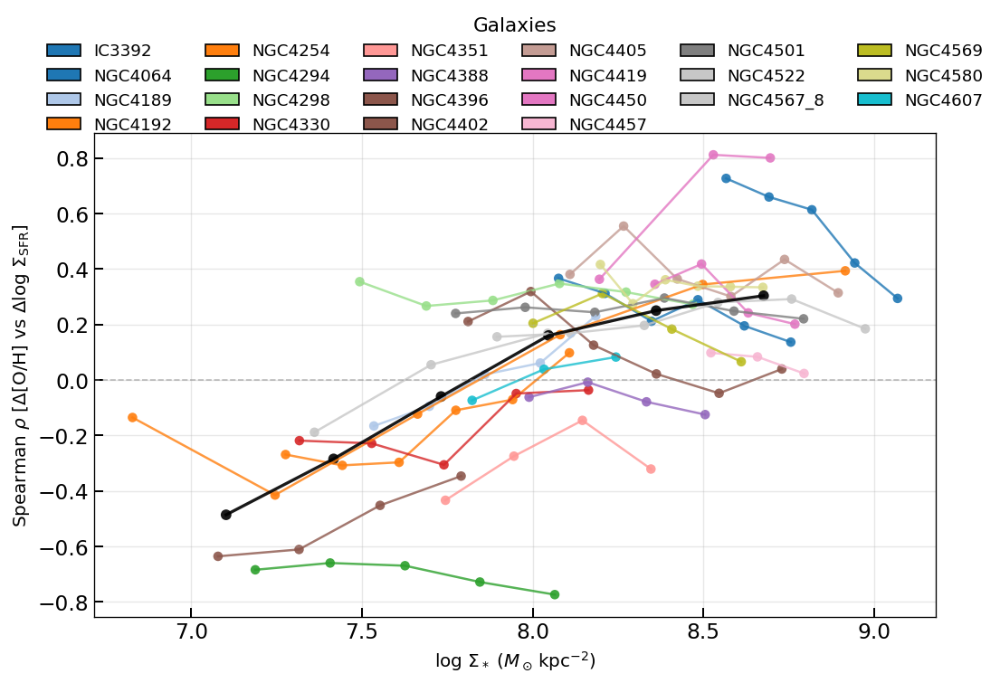

In [15]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------
    # Offset relations: Δ[O/H] vs Δlog Σ_SFR in Σ_* bins
    # For all galaxies (excluding NGC4383) and Spearman rho vs Σ_* summary
    # Spearman rho uses only points inside 95% contour and only if trend exists
    # ------------------------------------------------------------------
    from pathlib import Path
    from astropy.io import fits

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    EW_MIN = 6.0

    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.colors import BoundaryNorm
    import matplotlib.gridspec as gridspec
    from scipy.stats import spearmanr
    from matplotlib.lines import Line2D
    from matplotlib.patches import Patch

    # ------------------------------------------------------------------
    # Helper: read the required maps
    # ------------------------------------------------------------------
    def load_maps(gal):
        spatial_path = further_spatial_path(gal)
        gas_path = further_gas_path(gal)
        ew_path = further_ew_path(gal, EW_FILE_SUFFIX)

        if not (Path(spatial_path).exists() and Path(gas_path).exists() and Path(ew_path).exists()):
            raise FileNotFoundError(f'Required FITS files for {gal} not found.')

        with fits.open(spatial_path) as h_spatial:
            sigM = h_spatial['LOGMASS_SURFACE_DENSITY'].data
        with fits.open(gas_path) as h_gas:
            sigSFR = h_gas['LOGSFR_SURFACE_DENSITY_HII'].data
            ha_sigma_obs = h_gas['HA6562_SIGMA'].data
            ha_sigma_corr = h_gas['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h_gas else None
            if ha_sigma_corr is None:
                raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gas_path}')
            if ha_sigma_corr.shape != ha_sigma_obs.shape:
                raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {ha_sigma_corr.shape} vs SIGMA {ha_sigma_obs.shape}')
            sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
            ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
            sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
            ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
            if 'O_H_O3N2_M14_HII' in h_gas:
                oh_map = h_gas['O_H_O3N2_M14_HII'].data
                indicator_name = 'O3N2-M14'
            elif 'O_H_O3N2_M13_HII' in h_gas:
                print(f"Warning: O3N2-M14 not available for {gal}; using O3N2-M13 instead.")
                oh_map = h_gas['O_H_O3N2_M13_HII'].data
                indicator_name = 'O3N2-M13'
            else:
                available = [hdu.name for hdu in h_gas]
                raise KeyError(f"No O3N2 metallicity extension (M14/M13) found for {gal}. Available: {available}")
        with fits.open(ew_path) as h_ew:
            if EW_HDU not in h_ew:
                raise KeyError(f"Missing {EW_HDU} in {ew_path}")
            ew_ha = h_ew[EW_HDU].data
        ew_ha = align_map_to_shape(ew_ha, sigSFR.shape, label=f"{gal} {EW_HDU}")
        ew_mask = np.isfinite(ew_ha) & (ew_ha > EW_MIN)
        ew_mask = ew_mask & np.isfinite(ha_sigma) & (ha_sigma < 45.0)
        sigSFR = np.where(ew_mask, sigSFR, np.nan)
        oh_map = np.where(ew_mask, oh_map, np.nan)
        return sigM, sigSFR, oh_map, indicator_name

    # ------------------------------------------------------------------
    # Helper: calculate binned statistics with unique-count requirement
    # ------------------------------------------------------------------
    def calculate_binned_stats(x_data, y_data, bin_width=0.2, min_unique=20):
        """Calculate median and std in x-bins, requiring >= min_unique unique y values."""
        x_data = np.asarray(x_data)
        y_data = np.asarray(y_data)

        finite = np.isfinite(x_data) & np.isfinite(y_data)
        if np.sum(finite) == 0:
            return np.array([]), np.array([]), np.array([]), np.array([])

        x_min, x_max = np.nanmin(x_data[finite]), np.nanmax(x_data[finite])
        if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
            return np.array([]), np.array([]), np.array([]), np.array([])

        bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
        if bin_edges.size < 2:
            return np.array([]), np.array([]), np.array([]), np.array([])

        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

        medians = []
        stds = []
        counts = []
        valid_centers = []

        for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
            in_bin = finite & (x_data >= bin_start) & (x_data < bin_end)
            if np.sum(in_bin) == 0:
                continue

            y_in_bin = y_data[in_bin]
            if len(np.unique(y_in_bin)) >= min_unique:
                medians.append(np.nanmedian(y_in_bin))
                stds.append(np.nanstd(y_in_bin))
                counts.append(len(y_in_bin))
                valid_centers.append(bin_centers[i])

        return (np.array(valid_centers), np.array(medians),
                np.array(stds), np.array(counts))

    # ------------------------------------------------------------------
    # Galaxy list and color map (reserve color for excluded galaxy)
    # ------------------------------------------------------------------
    all_bin_centers = []  # Σ_* bin centers for which rho is valid (per-galaxy)
    all_rho_values = []     # Spearman rho (per-galaxy)
    all_galaxy_indices = []

    # Also store all spaxels across galaxies to compute a global trend
    global_sigM_list = []
    global_sfr_off_list = []
    global_oh_off_list = []
    global_gal_index_list = []

    # Build full galaxy list from available FITS files (including excluded)
    galaxies_all = physics_ready_galaxies(require_ew=True)
    excluded_galaxies = {'NGC4383'}

    # Build galaxy -> color mapping over ALL galaxies (so excluded keeps its color)
    galaxy_colors_all = plt.cm.tab20(np.linspace(0, 1, len(galaxies_all)))
    galaxy_color_dict = dict(zip(galaxies_all, galaxy_colors_all))

    # Now define the working sample that EXCLUDES NGC4383 for analysis/plotting
    galaxies = [g for g in galaxies_all if g not in excluded_galaxies]

    print("=" * 80)
    print(f"Offset relations and Spearman rho vs Σ_* (excluding: {excluded_galaxies})")
    print("All galaxies (for color assignment):", ", ".join(galaxies_all))
    print("Galaxies used in this analysis:", ", ".join(galaxies))
    print("=" * 80)

    # ------------------------------------------------------------------
    # Loop over galaxies and compute Spearman rho per Σ_* bin (per-galaxy)
    # and collect global spaxels for combined trend
    # ------------------------------------------------------------------
    for gal_index, gal in enumerate(galaxies):
        print(f"\nProcessing {gal} ...")
        try:
            sigM, sigSFR, oh_o3n2_map, indicator_name = load_maps(gal)
        except Exception as e:
            print(f"  Skipping {gal}: {e}")
            continue

        valid_sfr = np.isfinite(sigSFR)
        valid_oh = np.isfinite(oh_o3n2_map)
        valid_sigM = np.isfinite(sigM)
        valid_all = valid_sfr & valid_oh & valid_sigM

        if np.sum(valid_all) == 0:
            print("  No valid pixels.")
            continue

        global_gal_index_list.append(np.full(np.sum(valid_all), gal_index, dtype=int))

        # 1. Define 6 Σ_* bins for this galaxy (spanning 95% population)
        n_bins = 6
        sigmaM_min = np.nanpercentile(sigM[valid_all], 2.5)
        sigmaM_max = np.nanpercentile(sigM[valid_all], 97.5)
        sigmaM_bin_edges = np.linspace(sigmaM_min, sigmaM_max, n_bins + 1)
        sigmaM_bin_centers = 0.5 * (sigmaM_bin_edges[:-1] + sigmaM_bin_edges[1:])

        # 2. Global symmetric limits for this galaxy (for reference / consistency)
        global_max_abs_sfr = 0
        global_max_abs_oh = 0
        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM <= sigmaM_bin_edges[i+1]) & valid_all
            else:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all

            if np.sum(bin_mask) > 0:
                sfr_bin = sigSFR[bin_mask]
                oh_bin = oh_o3n2_map[bin_mask]

                sfr_offset = sfr_bin - np.mean(sfr_bin)
                oh_offset = oh_bin - np.mean(oh_bin)

                if np.any(np.isfinite(sfr_offset)):
                    global_max_abs_sfr = max(global_max_abs_sfr, np.nanmax(np.abs(sfr_offset)))
                if np.any(np.isfinite(oh_offset)):
                    global_max_abs_oh = max(global_max_abs_oh, np.nanmax(np.abs(oh_offset)))

        print(f"  Σ* range (95%): {sigmaM_min:.3f} to {sigmaM_max:.3f}")
        print(f"  Global Δlog(Σ_SFR) axis limits: ±{global_max_abs_sfr:.3f}")
        print(f"  Global Δ[O/H] axis limits: ±{global_max_abs_oh:.3f}")

        # 3. Compute Spearman rho in each Σ_* bin using 3-sigma clipping on unique data (per galaxy)
        print("  Spearman rho in each Σ_* bin (3σ clip + trend, per galaxy):")
        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM <= sigmaM_bin_edges[i+1]) & valid_all
            else:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all

            n_pixels = np.sum(bin_mask)

            if n_pixels <= 0:
                print(f"    Bin {i+1:02d} ({sigmaM_bin_centers[i]:.2f}): n=0, r=N/A")
                continue

            # Values in this Σ_* bin
            sfr_bin = sigSFR[bin_mask]
            oh_bin = oh_o3n2_map[bin_mask]

            # Offsets within this bin
            sfr_bin_mean = np.mean(sfr_bin)
            oh_bin_mean = np.mean(oh_bin)

            sfr_offset = sfr_bin - sfr_bin_mean
            oh_offset = oh_bin - oh_bin_mean

            valid_corr = np.isfinite(sfr_offset) & np.isfinite(oh_offset)
            if np.sum(valid_corr) > 0:
                global_sigM_list.append(sigM[bin_mask][valid_corr])
                global_sfr_off_list.append(sfr_offset[valid_corr])
                global_oh_off_list.append(oh_offset[valid_corr])


            if np.sum(valid_corr) <= 2:
                spearman_rho = np.nan
                print(f"    Bin {i+1:02d} ({sigmaM_bin_centers[i]:.2f}): n={n_pixels}, r=N/A (insufficient valid points)")
                continue

            # ------------------------------------------------------------------
            # Calculate 3-sigma clipping mask on unique valid data
            # ------------------------------------------------------------------
            sigma_clip_mask = np.zeros_like(valid_corr, dtype=bool)
            if np.sum(valid_corr) > 0:
                # Get unique valid data using np.unique
                sfr_data = sfr_offset[valid_corr]
                oh_data = oh_offset[valid_corr]
            
                sfr_unique = np.unique(sfr_data)
                oh_unique = np.unique(oh_data)
            
                # Calculate mean and std on unique values
                x_mean = np.mean(sfr_unique)
                x_std = np.std(sfr_unique)
                y_mean = np.mean(oh_unique)
                y_std = np.std(oh_unique)
            
                # 3-sigma bounds
                x_lower = x_mean - 3 * x_std
                x_upper = x_mean + 3 * x_std
                y_lower = y_mean - 3 * y_std
                y_upper = y_mean + 3 * y_std
            
                # Apply 3-sigma clipping to all data points
                within_3sigma = (sfr_data >= x_lower) & (sfr_data <= x_upper) & \
                                (oh_data >= y_lower) & (oh_data <= y_upper)
                sigma_clip_mask[valid_corr] = within_3sigma

            # ------------------------------------------------------------------
            # Median trend using only points within 3-sigma
            # ------------------------------------------------------------------
            x_trend = sfr_offset[sigma_clip_mask]
            y_trend = oh_offset[sigma_clip_mask]

            centers, medians, stds, counts = calculate_binned_stats(x_trend, y_trend,
                                                                    bin_width=0.2,
                                                                    min_unique=20)

            # Require at least 2 median-trend points for a valid trend
            has_trend = centers.size >= 3

            # ------------------------------------------------------------------
            # Spearman rho: only for points within 3-sigma and only if trend exists
            # ------------------------------------------------------------------
            if has_trend and np.sum(sigma_clip_mask & valid_corr) > 2:
                try:
                    spearman_rho, spearman_p = spearmanr(sfr_offset[sigma_clip_mask & valid_corr],
                                                    oh_offset[sigma_clip_mask & valid_corr])
                    print(f"    Bin {i+1:02d} ({sigmaM_bin_centers[i]:.2f}): n={n_pixels}, r={spearman_rho:.3f} (p={spearman_p:.3g})")
                except Exception:
                    spearman_rho = np.nan
                    print(f"    Bin {i+1:02d} ({sigmaM_bin_centers[i]:.2f}): n={n_pixels}, r=N/A (error)")
            else:
                spearman_rho = np.nan
                print(f"    Bin {i+1:02d} ({sigmaM_bin_centers[i]:.2f}): n={n_pixels}, r=N/A (no trend or too few in 3σ)")

            # Store only valid rho values
            if np.isfinite(spearman_rho):
                all_bin_centers.append(sigmaM_bin_centers[i])
                all_rho_values.append(spearman_rho)
                all_galaxy_indices.append(gal_index)

    # ------------------------------------------------------------------
    # Prepare global arrays for combined Spearman vs Σ_* (all galaxies)
    # ------------------------------------------------------------------
    if global_sigM_list:
        global_sigM = np.concatenate(global_sigM_list)
        global_sfr_off = np.concatenate(global_sfr_off_list)
        global_oh_off = np.concatenate(global_oh_off_list)
    else:
        global_sigM = np.array([])
        global_sfr_off = np.array([])
        global_oh_off = np.array([])

    # ------------------------------------------------------------------
    # Convert collected per-galaxy Spearman rho data to arrays
    # ------------------------------------------------------------------
    all_bin_centers = np.array(all_bin_centers)
    all_rho_values = np.array(all_rho_values)
    all_galaxy_indices = np.array(all_galaxy_indices)

    print("\n" + "=" * 80)
    print("Summary: number of Σ_* bins with valid Spearman rho (per galaxy):", len(all_rho_values))
    print("=" * 80)

    # ------------------------------------------------------------------
    # Compute combined Spearman rho vs Σ_* over all galaxies (same method)
    # ------------------------------------------------------------------
    global_bin_centers = []
    global_rho_values = []

    if global_sigM.size > 0:
        # Define 6 Σ_* bins for the combined sample (spanning 95% population)
        n_bins_global = 6
        sigmaM_min_g = np.nanpercentile(global_sigM, 2.5)
        sigmaM_max_g = np.nanpercentile(global_sigM, 97.5)
        sigmaM_edges_g = np.linspace(sigmaM_min_g, sigmaM_max_g, n_bins_global + 1)
        sigmaM_centers_g = 0.5 * (sigmaM_edges_g[:-1] + sigmaM_edges_g[1:])

        print("\nComputing combined Spearman rho in Σ_* bins (all galaxies together)...")
        for i in range(n_bins_global):
            if i == 0:
                bin_mask_g = (global_sigM >= sigmaM_edges_g[i]) & (global_sigM < sigmaM_edges_g[i+1])
            elif i == n_bins_global - 1:
                bin_mask_g = (global_sigM >= sigmaM_edges_g[i]) & (global_sigM <= sigmaM_edges_g[i+1])
            else:
                bin_mask_g = (global_sigM >= sigmaM_edges_g[i]) & (global_sigM < sigmaM_edges_g[i+1])

            n_pix_g = np.sum(bin_mask_g)
            if n_pix_g <= 0:
                print(f"  Global bin {i+1:02d} ({sigmaM_centers_g[i]:.2f}): n=0, r=N/A")
                continue


            sfr_off_g = global_sfr_off[bin_mask_g]
            oh_off_g = global_oh_off[bin_mask_g]

            valid_corr_g = np.isfinite(sfr_off_g) & np.isfinite(oh_off_g)
            if np.sum(valid_corr_g) <= 2:
                print(f"  Global bin {i+1:02d} ({sigmaM_centers_g[i]:.2f}): n={n_pix_g}, r=N/A (insufficient valid points)")
                continue

            # ------------------------------------------------------------------
            # Calculate 3-sigma clipping mask on unique valid data (global)
            # ------------------------------------------------------------------
            sigma_clip_mask_global = np.zeros_like(valid_corr_g, dtype=bool)
            if np.sum(valid_corr_g) > 0:
                sfr_data_g = sfr_off_g[valid_corr_g]
                oh_data_g = oh_off_g[valid_corr_g]
            
                sfr_unique_g = np.unique(sfr_data_g)
                oh_unique_g = np.unique(oh_data_g)
            
                x_mean_g = np.mean(sfr_unique_g)
                x_std_g = np.std(sfr_unique_g)
                y_mean_g = np.mean(oh_unique_g)
                y_std_g = np.std(oh_unique_g)
            
                x_lower_g = x_mean_g - 3 * x_std_g
                x_upper_g = x_mean_g + 3 * x_std_g
                y_lower_g = y_mean_g - 3 * y_std_g
                y_upper_g = y_mean_g + 3 * y_std_g
            
                within_3sigma_g = (sfr_data_g >= x_lower_g) & (sfr_data_g <= x_upper_g) & \
                                  (oh_data_g >= y_lower_g) & (oh_data_g <= y_upper_g)
                sigma_clip_mask_global[valid_corr_g] = within_3sigma_g

            x_trend_g = sfr_off_g[sigma_clip_mask_global]
            y_trend_g = oh_off_g[sigma_clip_mask_global]

            centers_g, medians_g, stds_g, counts_g = calculate_binned_stats(x_trend_g, y_trend_g,
                                                                            bin_width=0.2,
                                                                            min_unique=20)

            has_trend_g = centers_g.size >= 3

            if has_trend_g and np.sum(sigma_clip_mask_global & valid_corr_g) > 2:
                try:
                    rho_g, p_g = spearmanr(sfr_off_g[sigma_clip_mask_global & valid_corr_g],
                                         oh_off_g[sigma_clip_mask_global & valid_corr_g])
                    global_bin_centers.append(sigmaM_centers_g[i])
                    global_rho_values.append(rho_g)
                    print(f"  Global bin {i+1:02d} ({sigmaM_centers_g[i]:.2f}): n={n_pix_g}, r={rho_g:.3f} (p={p_g:.3g})")
                except Exception:
                    print(f"  Global bin {i+1:02d} ({sigmaM_centers_g[i]:.2f}): n={n_pix_g}, r=N/A (error)")
            else:
                print(f"  Global bin {i+1:02d} ({sigmaM_centers_g[i]:.2f}): n={n_pix_g}, r=N/A (no trend or too few in 3σ)")

    global_bin_centers = np.array(global_bin_centers)
    global_rho_values = np.array(global_rho_values)

    # ------------------------------------------------------------------
    # Plot Spearman rho vs Σ_* for all galaxies, with galaxy color legend
    # and an additional combined (all galaxies) trend in black
    # ------------------------------------------------------------------
    if len(all_rho_values) > 0:
    
        galaxy_indices_unique = np.unique(all_galaxy_indices)
    
        # Create figure with main axis and a thin top axis for legend
        fig = plt.figure(figsize=(10, 7))
        gs = gridspec.GridSpec(2, 1, height_ratios=[0.18, 1.0], hspace=0.05)
        legend_ax = fig.add_subplot(gs[0, 0])
        ax = fig.add_subplot(gs[1, 0])
        legend_ax.axis('off')
    
        plotted_galaxies = [] # Keep track of which galaxies are actually plotted
    
        # Plot Spearman rho vs Σ_* for each galaxy
        for idx in galaxy_indices_unique:
            mask = all_galaxy_indices == idx
            gal_name = galaxies[idx]
            color = galaxy_color_dict[gal_name]
        
            # Sort by Σ_* so lines are not scrambled
            x_vals = all_bin_centers[mask]
            y_vals = all_rho_values[mask]
        
            # Filter: skip if only 1 data point
            if len(x_vals) <= 2:
                continue
            
            plotted_galaxies.append(gal_name)
        
            order = np.argsort(x_vals)
            x_sorted = x_vals[order]
            y_sorted = y_vals[order]
        
            ax.plot(x_sorted, y_sorted, color=color, linewidth=1.5, alpha=0.8)
            ax.scatter(x_sorted, y_sorted, color=color, s=40, alpha=0.9, edgecolors='none', rasterized=True)
    
        # Add combined trend (all galaxies together) in black (no legend entry)
        if global_rho_values.size > 2:
            order_g = np.argsort(global_bin_centers)
            ax.plot(global_bin_centers[order_g], global_rho_values[order_g],
                    color='black', linewidth=2.0, alpha=0.9, linestyle='-')
            ax.scatter(global_bin_centers[order_g], global_rho_values[order_g],
                       color='black', s=50, alpha=0.9, edgecolors='none', rasterized=True)
    
        # Axis formatting
        ax.axhline(0.0, color='gray', linestyle='--', linewidth=1.0, alpha=0.5)
        ax.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
        ax.set_ylabel(r'Spearman $\rho$ [Δ[O/H] vs Δ$\log\,\Sigma_{\mathrm{SFR}}$]', fontsize=12)
        # ax.set_title(r'Spearman $\rho$ vs $\log\,\Sigma_*$ (all galaxies, excluding NGC4383)', fontsize=14)
        ax.grid(True, alpha=0.3)
    
        # ------------------------------------------------------------------
        # Galaxy legend at the top using dummy patches (excluding NGC4383)
        # ------------------------------------------------------------------
        legend_elements = [
            Patch(facecolor=galaxy_color_dict[gal], edgecolor='black', label=gal)
            for gal in plotted_galaxies
        ]
        if len(plotted_galaxies) > 0:
            legend_ax.legend(handles=legend_elements, loc='center', ncol=min(len(plotted_galaxies), 6),
                            frameon=False, fontsize=11, title='Galaxies', title_fontsize=13)
    
        plt.tight_layout()
        # plt.savefig('Plot_Paper_1/MAUVE_MUSE_SpearmanRho_vs_SigmaM_AllGalaxies_ExclNGC4383_EW.png',
                    # dpi=600, bbox_inches='tight')
        # plt.savefig('Plot_Paper_1/MAUVE_MUSE_SpearmanRho_vs_SigmaM_AllGalaxies_ExclNGC4383_EW.pdf',
                    # bbox_inches='tight')
        plt.show()
    else:
        print("No valid Spearman rho values to plot.")
else:
    print("Skipped copied previous-project analysis cell 6: no nested *_further mass/SFR/OH+EW products are ready yet.")


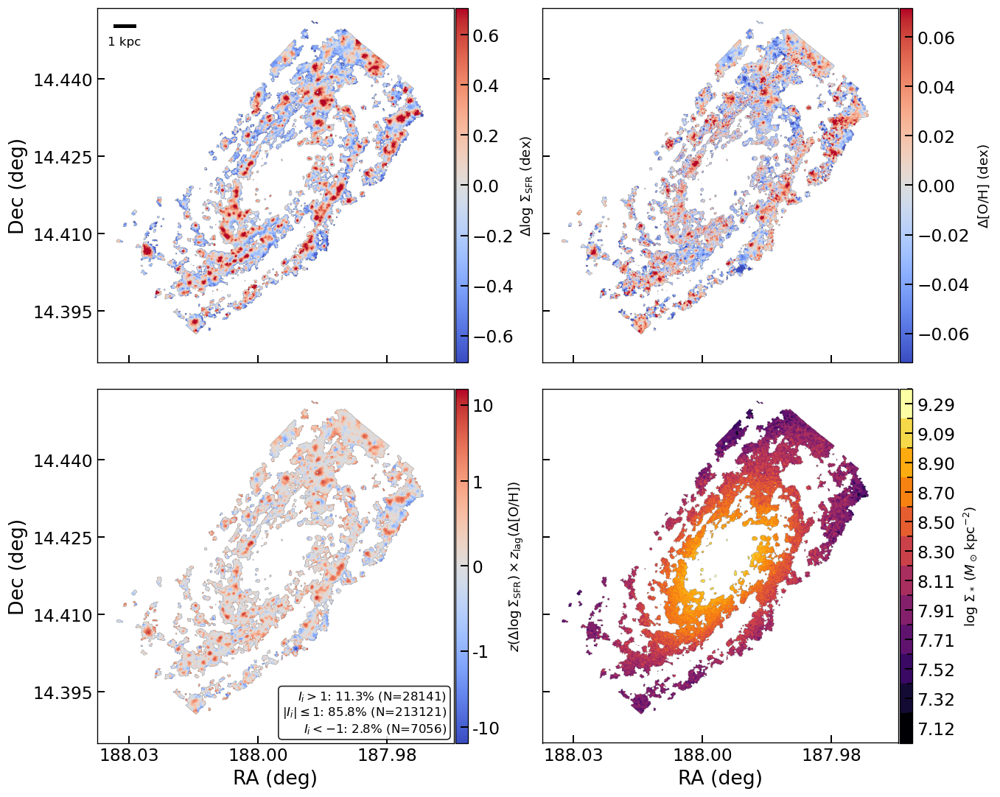

In [16]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------
    # 2x2 Combined figure: offset maps + Moran-like map + binned Σ* map
    # ------------------------------------------------------------------
    from pathlib import Path
    from astropy.io import fits

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    EW_MIN = 6.0

    from astropy.wcs import WCS
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gs_module
    from matplotlib.colors import BoundaryNorm, SymLogNorm
    import matplotlib.ticker as mticker
    from matplotlib.ticker import ScalarFormatter

    # Only focus on NGC4501 for this visualisation
    galaxies = [gal for gal in ['NGC4501'] if gal in physics_ready_galaxies(require_ew=True)]
    if not galaxies:
        print('Skipped NGC4501 visualisation: nested *_further mass/SFR/OH+EW products are not ready for this galaxy yet.')

    # ------------------------------------------------------------------
    # Define threshold parameter for linear/log colorbar transition and classification
    # ------------------------------------------------------------------
    threshold = 1  # Values between -threshold and +threshold use linear scale

    # ------------------------------------------------------------------
    # 1.  Helper: read the required maps
    # ------------------------------------------------------------------
    def load_maps(gal):
        spatial_path = further_spatial_path(gal)
        gas_path = further_gas_path(gal)
        ew_path = further_ew_path(gal, EW_FILE_SUFFIX)

        if not (Path(spatial_path).exists() and Path(gas_path).exists() and Path(ew_path).exists()):
            raise FileNotFoundError(f'Required FITS files for {gal} not found.')

        with fits.open(spatial_path) as h_spatial:
            sigM = h_spatial['LOGMASS_SURFACE_DENSITY'].data
            binid_map = h_spatial['BINID'].data
            wcs = WCS(h_spatial['LOGMASS_SURFACE_DENSITY'].header)
        with fits.open(gas_path) as h_gas:
            sigSFR = h_gas['LOGSFR_SURFACE_DENSITY_HII'].data
            ha_sigma_obs = h_gas['HA6562_SIGMA'].data
            ha_sigma_corr = h_gas['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h_gas else None
            if ha_sigma_corr is None:
                raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gas_path}')
            if ha_sigma_corr.shape != ha_sigma_obs.shape:
                raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {ha_sigma_corr.shape} vs SIGMA {ha_sigma_obs.shape}')
            sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
            ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
            sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
            ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
            if 'O_H_O3N2_M14_HII' in h_gas:
                oh_map = h_gas['O_H_O3N2_M14_HII'].data
                indicator_name = 'O3N2-M14'
            elif 'O_H_O3N2_M13_HII' in h_gas:
                print(f"Warning: O3N2-M14 not available for {gal}; using O3N2-M13 instead.")
                oh_map = h_gas['O_H_O3N2_M13_HII'].data
                indicator_name = 'O3N2-M13'
            else:
                available = [hdu.name for hdu in h_gas]
                raise KeyError(f"No O3N2 metallicity extension (M14/M13) found for {gal}. Available: {available}")
            gas_header = h_gas['LOGSFR_SURFACE_DENSITY_HII'].header
        with fits.open(ew_path) as h_ew:
            if EW_HDU not in h_ew:
                raise KeyError(f"Missing {EW_HDU} in {ew_path}")
            ew_ha = h_ew[EW_HDU].data
        ew_ha = align_map_to_shape(ew_ha, sigSFR.shape, label=f"{gal} {EW_HDU}")
        ew_mask = np.isfinite(ew_ha) & (ew_ha > EW_MIN)
        ew_mask = ew_mask & np.isfinite(ha_sigma) & (ha_sigma < 45.0)
        sigSFR = np.where(ew_mask, sigSFR, np.nan)
        oh_map = np.where(ew_mask, oh_map, np.nan)
        return sigM, sigSFR, oh_map, indicator_name, wcs, gas_header, binid_map

    for gal in galaxies:
        sigM, sigSFR, oh_o3n2_map, indicator_name, wcs_full, gas_header, binid_map = load_maps(gal)
        # Valid pixels across maps
        valid_sfr = np.isfinite(sigSFR)
        valid_oh = np.isfinite(oh_o3n2_map)
        valid_sigM = np.isfinite(sigM)
        valid_all = valid_sfr & valid_oh & valid_sigM

        # ------------------------------------------------------------------
        # 2.  Calculate offset maps (relative to Σ* bin means)
        # ------------------------------------------------------------------
        # Define 12 Σ* bins
        n_bins = 12
        sigmaM_min = np.nanmin(sigM[valid_all])
        sigmaM_max = np.nanmax(sigM[valid_all])
        sigmaM_bin_edges = np.linspace(sigmaM_min, sigmaM_max, n_bins + 1)
    
        # Initialize offset maps
        sfr_offset = np.full_like(sigSFR, np.nan)
        oh_offset = np.full_like(oh_o3n2_map, np.nan)
    
        # Calculate offset for each Σ* bin
        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM <= sigmaM_bin_edges[i+1]) & valid_all
            else:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
        
            if np.sum(bin_mask) > 0:
                # Calculate bin mean and offset within this bin
                sfr_bin_mean = np.mean(sigSFR[bin_mask])
                oh_bin_mean = np.mean(oh_o3n2_map[bin_mask])
            
                sfr_offset[bin_mask] = sigSFR[bin_mask] - sfr_bin_mean
                oh_offset[bin_mask] = oh_o3n2_map[bin_mask] - oh_bin_mean
    
        sfr_offset_max = np.nanpercentile(np.abs(sfr_offset[valid_all]), 95)
        # Reduce Delta O/H range to 95th percentile to highlight differences
        oh_offset_max = np.nanpercentile(np.abs(oh_offset[valid_all]), 95)
    
        # Global means for display purposes only
        sfr_mean = np.nanmean(sigSFR[valid_sfr])
        oh_mean = np.nanmean(oh_o3n2_map[valid_oh])

        # ------------------------------------------------------------------
        # 3.  Calculate local bivariate Moran-like map
        # ------------------------------------------------------------------
        def local_bivariate_moran_by_bin(A, B, valid_mask, binid_map, neighbourhood='queen'):
            """Local bivariate Moran-style statistic on adjacent spatial bins.

            Each valid BINID is treated as one graph node, using the mean A and B value
            of that bin. The resulting per-bin Moran value is expanded back to all
            valid pixels in the bin for plotting.
            """
            A = np.asarray(A, dtype=float)
            B = np.asarray(B, dtype=float)
            valid_mask = np.asarray(valid_mask, dtype=bool)
            binid_raw = np.asarray(binid_map, dtype=float)
            if A.shape != B.shape or A.shape != valid_mask.shape or A.shape != binid_raw.shape:
                raise ValueError('A, B, valid_mask, and binid_map must have the same shape')

            I_map = np.full(A.shape, np.nan)
            quad_map = np.zeros(A.shape, dtype=np.int16)
            finite_bin = np.isfinite(binid_raw) & (binid_raw >= 0)
            binid = np.full(A.shape, -1, dtype=np.int64)
            binid[finite_bin] = np.rint(binid_raw[finite_bin]).astype(np.int64)
            valid = valid_mask & np.isfinite(A) & np.isfinite(B) & (binid >= 0)
            valid_bins = np.unique(binid[valid])
            if valid_bins.size < 2:
                return I_map, quad_map

            max_bin = int(valid_bins.max())
            flat_bins = binid[valid].ravel()
            counts = np.bincount(flat_bins, minlength=max_bin + 1).astype(float)
            sum_A = np.bincount(flat_bins, weights=A[valid].ravel(), minlength=max_bin + 1)
            sum_B = np.bincount(flat_bins, weights=B[valid].ravel(), minlength=max_bin + 1)
            A_bin = np.full(max_bin + 1, np.nan)
            B_bin = np.full(max_bin + 1, np.nan)
            has_data = counts > 0
            A_bin[has_data] = sum_A[has_data] / counts[has_data]
            B_bin[has_data] = sum_B[has_data] / counts[has_data]

            A_vals = A_bin[valid_bins]
            B_vals = B_bin[valid_bins]
            A_std = np.nanstd(A_vals)
            B_std = np.nanstd(B_vals)
            if not np.isfinite(A_std) or not np.isfinite(B_std) or A_std == 0 or B_std == 0:
                return I_map, quad_map

            Az = np.full(max_bin + 1, np.nan)
            Bz = np.full(max_bin + 1, np.nan)
            Az[valid_bins] = (A_vals - np.nanmean(A_vals)) / A_std
            Bz[valid_bins] = (B_vals - np.nanmean(B_vals)) / B_std

            offsets = [(-1, 0), (1, 0), (0, -1), (0, 1)]
            if neighbourhood == 'queen':
                offsets += [(-1, -1), (-1, 1), (1, -1), (1, 1)]
            elif neighbourhood != 'rook':
                raise ValueError("neighbourhood must be 'rook' or 'queen'")

            adjacency = {int(b): set() for b in valid_bins}
            rows, cols = A.shape
            for dy, dx in offsets:
                y0 = max(0, -dy)
                y1 = rows - max(0, dy)
                x0 = max(0, -dx)
                x1 = cols - max(0, dx)
                src = (slice(y0, y1), slice(x0, x1))
                dst = (slice(y0 + dy, y1 + dy), slice(x0 + dx, x1 + dx))
                pair_valid = valid[src] & valid[dst] & (binid[src] != binid[dst])
                for left, right in zip(binid[src][pair_valid], binid[dst][pair_valid]):
                    left = int(left)
                    right = int(right)
                    adjacency[left].add(right)
                    adjacency[right].add(left)

            for b in valid_bins:
                b = int(b)
                neigh = sorted(adjacency[b])
                if not neigh:
                    continue
                lag_B = np.nanmean(Bz[neigh])
                I_val = Az[b] * lag_B
                pixels = valid & (binid == b)
                I_map[pixels] = I_val
                if Az[b] >= 0 and lag_B >= 0:
                    quad_map[pixels] = 1
                elif Az[b] < 0 and lag_B < 0:
                    quad_map[pixels] = 2
                elif Az[b] >= 0 and lag_B < 0:
                    quad_map[pixels] = 3
                else:
                    quad_map[pixels] = 4

            return I_map, quad_map
        I_map, quad_map = local_bivariate_moran_by_bin(sfr_offset, oh_offset, valid_all, binid_map,
                                                neighbourhood='queen')

        # ------------------------------------------------------------------
        # Calculate statistics for three classes based on threshold
        # ------------------------------------------------------------------
        valid_I = np.isfinite(I_map)
        n_total = np.sum(valid_I)
        n_high = np.sum(I_map[valid_I] > threshold)
        n_mid = np.sum((I_map[valid_I] >= -threshold) & (I_map[valid_I] <= threshold))
        n_low = np.sum(I_map[valid_I] < -threshold)
        pct_high = (n_high / n_total * 100) if n_total > 0 else 0
        pct_mid = (n_mid / n_total * 100) if n_total > 0 else 0
        pct_low = (n_low / n_total * 100) if n_total > 0 else 0

        # ------------------------------------------------------------------
        # 4.  Create binned Σ* map
        # ------------------------------------------------------------------
        sigM_binned_map = np.full_like(sigM, np.nan)
    
        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM <= sigmaM_bin_edges[i+1]) & valid_all
            else:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
        
            # Assign bin center value
            bin_center = (sigmaM_bin_edges[i] + sigmaM_bin_edges[i+1]) / 2
            sigM_binned_map[bin_mask] = bin_center

        # ------------------------------------------------------------------
        # 5.  Prepare coordinate extent
        # ------------------------------------------------------------------
        wcs_celestial = WCS(gas_header).celestial
        y_size, x_size = sigSFR.shape
        x_coords = np.arange(x_size)
        y_coords = np.arange(y_size)
        xx, yy = np.meshgrid(x_coords, y_coords)
        ra, dec = wcs_celestial.pixel_to_world_values(xx, yy)
        extent = [ra.max(), ra.min(), dec.min(), dec.max()]

        # ------------------------------------------------------------------
        # 5b.  Scale bar: 5 kpc for 0.2 arcsec/pixel at 16.5 Mpc
        # ------------------------------------------------------------------
        pix_scale_arcsec = 0.2
        distance_mpc = 16.5
        # calculate degrees for 5 kpc, including cos(dec) for the RA axis
        kpc_arcsec = 206265.0 / (distance_mpc * 1000.0)
        scalebar_kpc = 1
        scalebar_length_deg = (scalebar_kpc * kpc_arcsec) / 3600.0
        mean_dec = np.nanmean(dec)
        scalebar_length_deg_ra = scalebar_length_deg / np.cos(np.deg2rad(mean_dec))

        def add_scalebar(ax, length_deg, label='1 kpc'):
            x0, x1 = ax.get_xlim()
            x_range = abs(x1 - x0)
            if x_range == 0:
                return
            frac_len = length_deg / x_range
            x_start = 0.05
            y_start = 0.95
            x_end = x_start + frac_len
            line, = ax.plot([x_start, x_end], [y_start, y_start], transform=ax.transAxes,
                            color='k', lw=3, clip_on=False)
            line.set_in_layout(False)
            txt = ax.text((x_start + x_end) / 2, y_start - 0.03, label,
                          transform=ax.transAxes, ha='center', va='top', color='k')
            txt.set_in_layout(False)

        # ------------------------------------------------------------------
        # 6.  2x2 figure: shared axes, equal aspect preserved, colorbars glued to axes
        # ------------------------------------------------------------------
        from mpl_toolkits.axes_grid1 import make_axes_locatable

        # Auto-derive a reasonable figsize from the map extent
        dx = abs(extent[1] - extent[0])   # RA span
        dy = abs(extent[3] - extent[2])   # Dec span
        data_ratio = (dx / dy) if dy > 0 else 1.0  # width / height

        panel_h = 4.2   # inches per panel height (tune once)
        panel_w = panel_h * data_ratio
        cbar_w = 0.35   # inches per colorbar (tune once)

        W = 2 * panel_w + 2 * cbar_w + 1.2
        H = 2 * panel_h + 0.8

        fig, axs = plt.subplots(
            2, 2, figsize=(W, H), sharex=True, sharey=True
        )

        # Make space for the appended colorbars (right margin matters)
        fig.subplots_adjust(
            left=0.07, right=0.96, bottom=0.07, top=0.98,
            wspace=0.20, hspace=0.06
        )

        ax1, ax2 = axs[0, 0], axs[0, 1]
        ax3, ax4 = axs[1, 0], axs[1, 1]

        def add_cbar(ax, im, label, size="3.5%", pad=0.02, labelpad=6, labelsize=11):
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size=size, pad=pad)
            cbar = fig.colorbar(im, cax=cax)
            cbar.set_label(label, fontsize=labelsize, labelpad=labelpad)
            return cbar

        # --- Ticks / formatting (readable RA, no +1.834e2)
        for ax in (ax1, ax2, ax3, ax4):
            ax.xaxis.set_major_locator(mticker.MaxNLocator(3))
            ax.yaxis.set_major_locator(mticker.MaxNLocator(5))
            ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))

        # Hide inner tick labels
        plt.setp(ax1.get_xticklabels(), visible=False)
        plt.setp(ax2.get_xticklabels(), visible=False)
        plt.setp(ax2.get_yticklabels(), visible=False)
        plt.setp(ax4.get_yticklabels(), visible=False)

        # Axis labels (outer only)
        ax3.set_xlabel("RA (deg)", fontsize=16)
        ax4.set_xlabel("RA (deg)", fontsize=16)
        ax1.set_ylabel("Dec (deg)", fontsize=16)
        ax3.set_ylabel("Dec (deg)", fontsize=16)

        # ---- Panel 1: SFR offset
        im_sfr = ax1.imshow(
            np.ma.masked_invalid(sfr_offset),
            origin="lower", cmap="coolwarm",
            extent=extent, vmin=-sfr_offset_max, vmax=sfr_offset_max,
            aspect="equal"
        )
        add_scalebar(ax1, scalebar_length_deg_ra, label="1 kpc")
        add_cbar(ax1, im_sfr, r'$\Delta\log\,\Sigma_{\mathrm{SFR}}$ (dex)', labelpad=4)

        # ---- Panel 2: OH offset
        im_oh = ax2.imshow(
            np.ma.masked_invalid(oh_offset),
            origin="lower", cmap="coolwarm",
            extent=extent, vmin=-oh_offset_max, vmax=oh_offset_max,
            aspect="equal"
        )
        add_cbar(ax2, im_oh, r'$\Delta$[O/H] (dex)')

        # ---- Panel 3: Moran-like
        vI = np.nanmax(np.abs(I_map))
        norm = SymLogNorm(linthresh=threshold, linscale=1.0, vmin=-vI, vmax=vI, base=10)

        imI = ax3.imshow(
            np.ma.masked_invalid(I_map),
            origin="lower", cmap="coolwarm",
            extent=extent, norm=norm,
            aspect="equal"
        )
        cbarI = add_cbar(
            ax3, imI,
            r'$z(\Delta\log\Sigma_{\rm SFR}) \times z_{\rm lag}(\Delta{\rm [O/H]})$'
        )

        # Keep your symmetric-log ticks logic
        max_pow = int(np.floor(np.log10(vI))) if vI > 0 else 0
        pos_ticks = [10**k for k in range(0, max_pow + 1) if 10**k <= vI]
        pos_ticks_filtered = [p for p in pos_ticks if p != threshold]
        neg_ticks_filtered = [-p for p in reversed(pos_ticks_filtered)]
        ticks = sorted(set(neg_ticks_filtered + [-threshold, 0.0, threshold] + pos_ticks_filtered))
        cbarI.set_ticks(ticks)
        cbarI.set_ticklabels([f"{t:g}" for t in ticks])

        legend_text = (
            rf'$I_i > {threshold}$: {pct_high:.1f}% (N={n_high})'
            '\n' + rf'$|I_i| \leq {threshold}$: {pct_mid:.1f}% (N={n_mid})'
            '\n' + rf'$I_i < -{threshold}$: {pct_low:.1f}% (N={n_low})'
        )
        ax3.text(
            0.98, 0.02, legend_text, transform=ax3.transAxes,
            fontsize=10, va="bottom", ha="right",
            bbox=dict(boxstyle="round", facecolor="white", alpha=0.85)
        )

        # ---- Panel 4: binned Σ*
        cmap_discrete = plt.cm.inferno
        norm_discrete = BoundaryNorm(sigmaM_bin_edges, cmap_discrete.N)

        im_sigM_binned = ax4.imshow(
            np.ma.masked_invalid(sigM_binned_map),
            origin="lower", cmap=cmap_discrete, norm=norm_discrete,
            extent=extent,
            aspect="equal"
        )
        cbar_binned = add_cbar(
            ax4, im_sigM_binned,
            r'$\log\,\Sigma_*\;(M_\odot\,\mathrm{kpc}^{-2})$'
        )

        bin_centers = [(sigmaM_bin_edges[i] + sigmaM_bin_edges[i+1]) / 2 for i in range(n_bins)]
        cbar_binned.set_ticks(bin_centers)
        cbar_binned.set_ticklabels([f"{bc:.2f}" for bc in bin_centers])

        # fig.savefig(f'Plot_Paper_1/{gal}_correlation_map_moran_EW.png', dpi=600, bbox_inches="tight", pad_inches=0.02)
        # fig.savefig(f'Plot_Paper_1/{gal}_correlation_map_moran_EW.pdf', bbox_inches="tight", pad_inches=0.02)
        plt.show()
else:
    print("Skipped copied previous-project analysis cell 7: no nested *_further mass/SFR/OH+EW products are ready yet.")


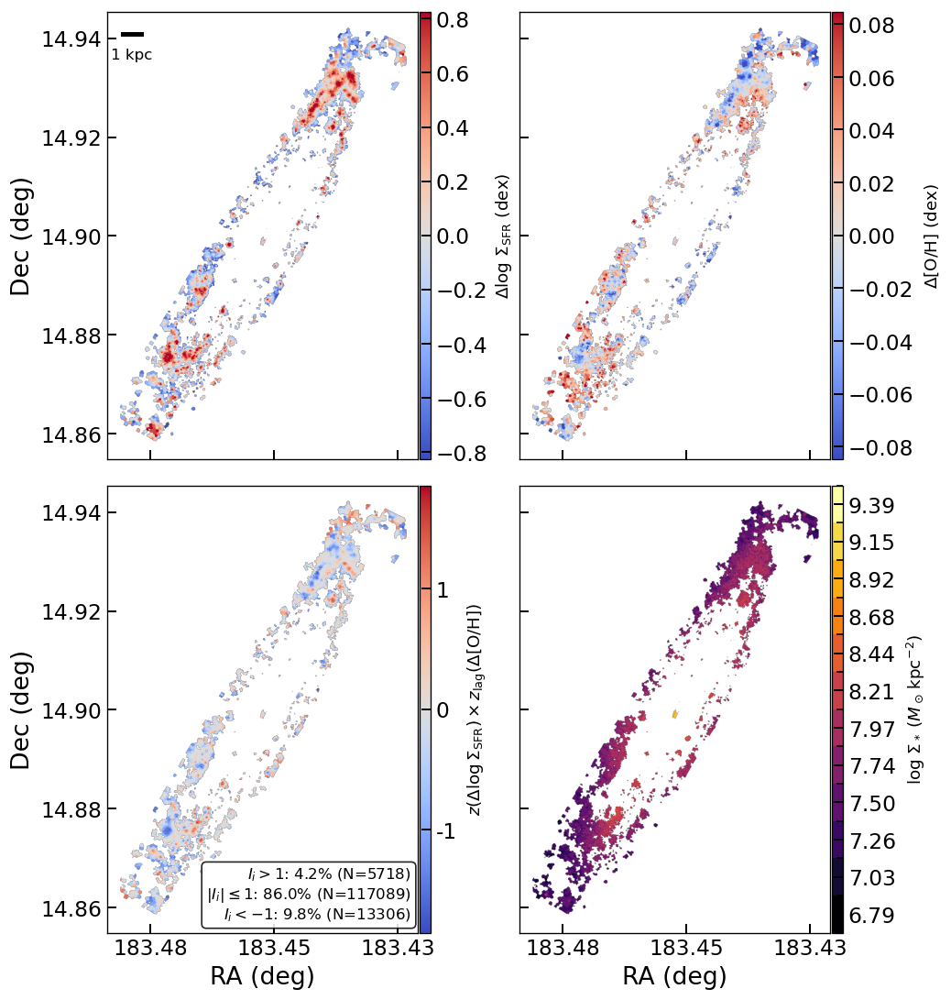

In [17]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------
    # 2x2 Combined figure: offset maps + Moran-like map + binned Σ* map
    # ------------------------------------------------------------------
    from pathlib import Path
    from astropy.io import fits

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    EW_MIN = 6.0

    from astropy.wcs import WCS
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gs_module
    from matplotlib.colors import BoundaryNorm, SymLogNorm
    import matplotlib.ticker as mticker
    from matplotlib.ticker import ScalarFormatter

    # Only focus on NGC4192 for this visualisation
    galaxies = [gal for gal in ['NGC4192'] if gal in physics_ready_galaxies(require_ew=True)]
    if not galaxies:
        print('Skipped NGC4192 visualisation: nested *_further mass/SFR/OH+EW products are not ready for this galaxy yet.')

    # ------------------------------------------------------------------
    # Define threshold parameter for linear/log colorbar transition and classification
    # ------------------------------------------------------------------
    threshold = 1  # Values between -threshold and +threshold use linear scale

    # ------------------------------------------------------------------
    # 1.  Helper: read the required maps
    # ------------------------------------------------------------------
    def load_maps(gal):
        spatial_path = further_spatial_path(gal)
        gas_path = further_gas_path(gal)
        ew_path = further_ew_path(gal, EW_FILE_SUFFIX)

        if not (Path(spatial_path).exists() and Path(gas_path).exists() and Path(ew_path).exists()):
            raise FileNotFoundError(f'Required FITS files for {gal} not found.')

        with fits.open(spatial_path) as h_spatial:
            sigM = h_spatial['LOGMASS_SURFACE_DENSITY'].data
            binid_map = h_spatial['BINID'].data
            wcs = WCS(h_spatial['LOGMASS_SURFACE_DENSITY'].header)
        with fits.open(gas_path) as h_gas:
            sigSFR = h_gas['LOGSFR_SURFACE_DENSITY_HII'].data
            ha_sigma_obs = h_gas['HA6562_SIGMA'].data
            ha_sigma_corr = h_gas['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h_gas else None
            if ha_sigma_corr is None:
                raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gas_path}')
            if ha_sigma_corr.shape != ha_sigma_obs.shape:
                raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {ha_sigma_corr.shape} vs SIGMA {ha_sigma_obs.shape}')
            sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
            ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
            sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
            ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
            if 'O_H_O3N2_M14_HII' in h_gas:
                oh_map = h_gas['O_H_O3N2_M14_HII'].data
                indicator_name = 'O3N2-M14'
            elif 'O_H_O3N2_M13_HII' in h_gas:
                print(f"Warning: O3N2-M14 not available for {gal}; using O3N2-M13 instead.")
                oh_map = h_gas['O_H_O3N2_M13_HII'].data
                indicator_name = 'O3N2-M13'
            else:
                available = [hdu.name for hdu in h_gas]
                raise KeyError(f"No O3N2 metallicity extension (M14/M13) found for {gal}. Available: {available}")
            gas_header = h_gas['LOGSFR_SURFACE_DENSITY_HII'].header
        with fits.open(ew_path) as h_ew:
            if EW_HDU not in h_ew:
                raise KeyError(f"Missing {EW_HDU} in {ew_path}")
            ew_ha = h_ew[EW_HDU].data
        ew_ha = align_map_to_shape(ew_ha, sigSFR.shape, label=f"{gal} {EW_HDU}")
        ew_mask = np.isfinite(ew_ha) & (ew_ha > EW_MIN)
        ew_mask = ew_mask & np.isfinite(ha_sigma) & (ha_sigma < 45.0)
        sigSFR = np.where(ew_mask, sigSFR, np.nan)
        oh_map = np.where(ew_mask, oh_map, np.nan)
        return sigM, sigSFR, oh_map, indicator_name, wcs, gas_header, binid_map

    for gal in galaxies:
        sigM, sigSFR, oh_o3n2_map, indicator_name, wcs_full, gas_header, binid_map = load_maps(gal)
        # Valid pixels across maps
        valid_sfr = np.isfinite(sigSFR)
        valid_oh = np.isfinite(oh_o3n2_map)
        valid_sigM = np.isfinite(sigM)
        valid_all = valid_sfr & valid_oh & valid_sigM

        # ------------------------------------------------------------------
        # 2.  Calculate offset maps (relative to Σ* bin means)
        # ------------------------------------------------------------------
        # Define 12 Σ* bins
        n_bins = 12
        sigmaM_min = np.nanmin(sigM[valid_all])
        sigmaM_max = np.nanmax(sigM[valid_all])
        sigmaM_bin_edges = np.linspace(sigmaM_min, sigmaM_max, n_bins + 1)
    
        # Initialize offset maps
        sfr_offset = np.full_like(sigSFR, np.nan)
        oh_offset = np.full_like(oh_o3n2_map, np.nan)
    
        # Calculate offset for each Σ* bin
        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM <= sigmaM_bin_edges[i+1]) & valid_all
            else:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
        
            if np.sum(bin_mask) > 0:
                # Calculate bin mean and offset within this bin
                sfr_bin_mean = np.mean(sigSFR[bin_mask])
                oh_bin_mean = np.mean(oh_o3n2_map[bin_mask])
            
                sfr_offset[bin_mask] = sigSFR[bin_mask] - sfr_bin_mean
                oh_offset[bin_mask] = oh_o3n2_map[bin_mask] - oh_bin_mean
    
        sfr_offset_max = np.nanpercentile(np.abs(sfr_offset[valid_all]), 95)
        # Reduce Delta O/H range to 95th percentile to highlight differences
        oh_offset_max = np.nanpercentile(np.abs(oh_offset[valid_all]), 95)
    
        # Global means for display purposes only
        sfr_mean = np.nanmean(sigSFR[valid_sfr])
        oh_mean = np.nanmean(oh_o3n2_map[valid_oh])

        # ------------------------------------------------------------------
        # 3.  Calculate local bivariate Moran-like map
        # ------------------------------------------------------------------
        def local_bivariate_moran_by_bin(A, B, valid_mask, binid_map, neighbourhood='queen'):
            """Local bivariate Moran-style statistic on adjacent spatial bins.

            Each valid BINID is treated as one graph node, using the mean A and B value
            of that bin. The resulting per-bin Moran value is expanded back to all
            valid pixels in the bin for plotting.
            """
            A = np.asarray(A, dtype=float)
            B = np.asarray(B, dtype=float)
            valid_mask = np.asarray(valid_mask, dtype=bool)
            binid_raw = np.asarray(binid_map, dtype=float)
            if A.shape != B.shape or A.shape != valid_mask.shape or A.shape != binid_raw.shape:
                raise ValueError('A, B, valid_mask, and binid_map must have the same shape')

            I_map = np.full(A.shape, np.nan)
            quad_map = np.zeros(A.shape, dtype=np.int16)
            finite_bin = np.isfinite(binid_raw) & (binid_raw >= 0)
            binid = np.full(A.shape, -1, dtype=np.int64)
            binid[finite_bin] = np.rint(binid_raw[finite_bin]).astype(np.int64)
            valid = valid_mask & np.isfinite(A) & np.isfinite(B) & (binid >= 0)
            valid_bins = np.unique(binid[valid])
            if valid_bins.size < 2:
                return I_map, quad_map

            max_bin = int(valid_bins.max())
            flat_bins = binid[valid].ravel()
            counts = np.bincount(flat_bins, minlength=max_bin + 1).astype(float)
            sum_A = np.bincount(flat_bins, weights=A[valid].ravel(), minlength=max_bin + 1)
            sum_B = np.bincount(flat_bins, weights=B[valid].ravel(), minlength=max_bin + 1)
            A_bin = np.full(max_bin + 1, np.nan)
            B_bin = np.full(max_bin + 1, np.nan)
            has_data = counts > 0
            A_bin[has_data] = sum_A[has_data] / counts[has_data]
            B_bin[has_data] = sum_B[has_data] / counts[has_data]

            A_vals = A_bin[valid_bins]
            B_vals = B_bin[valid_bins]
            A_std = np.nanstd(A_vals)
            B_std = np.nanstd(B_vals)
            if not np.isfinite(A_std) or not np.isfinite(B_std) or A_std == 0 or B_std == 0:
                return I_map, quad_map

            Az = np.full(max_bin + 1, np.nan)
            Bz = np.full(max_bin + 1, np.nan)
            Az[valid_bins] = (A_vals - np.nanmean(A_vals)) / A_std
            Bz[valid_bins] = (B_vals - np.nanmean(B_vals)) / B_std

            offsets = [(-1, 0), (1, 0), (0, -1), (0, 1)]
            if neighbourhood == 'queen':
                offsets += [(-1, -1), (-1, 1), (1, -1), (1, 1)]
            elif neighbourhood != 'rook':
                raise ValueError("neighbourhood must be 'rook' or 'queen'")

            adjacency = {int(b): set() for b in valid_bins}
            rows, cols = A.shape
            for dy, dx in offsets:
                y0 = max(0, -dy)
                y1 = rows - max(0, dy)
                x0 = max(0, -dx)
                x1 = cols - max(0, dx)
                src = (slice(y0, y1), slice(x0, x1))
                dst = (slice(y0 + dy, y1 + dy), slice(x0 + dx, x1 + dx))
                pair_valid = valid[src] & valid[dst] & (binid[src] != binid[dst])
                for left, right in zip(binid[src][pair_valid], binid[dst][pair_valid]):
                    left = int(left)
                    right = int(right)
                    adjacency[left].add(right)
                    adjacency[right].add(left)

            for b in valid_bins:
                b = int(b)
                neigh = sorted(adjacency[b])
                if not neigh:
                    continue
                lag_B = np.nanmean(Bz[neigh])
                I_val = Az[b] * lag_B
                pixels = valid & (binid == b)
                I_map[pixels] = I_val
                if Az[b] >= 0 and lag_B >= 0:
                    quad_map[pixels] = 1
                elif Az[b] < 0 and lag_B < 0:
                    quad_map[pixels] = 2
                elif Az[b] >= 0 and lag_B < 0:
                    quad_map[pixels] = 3
                else:
                    quad_map[pixels] = 4

            return I_map, quad_map
        I_map, quad_map = local_bivariate_moran_by_bin(sfr_offset, oh_offset, valid_all, binid_map,
                                                neighbourhood='queen')

        # ------------------------------------------------------------------
        # Calculate statistics for three classes based on threshold
        # ------------------------------------------------------------------
        valid_I = np.isfinite(I_map)
        n_total = np.sum(valid_I)
        n_high = np.sum(I_map[valid_I] > threshold)
        n_mid = np.sum((I_map[valid_I] >= -threshold) & (I_map[valid_I] <= threshold))
        n_low = np.sum(I_map[valid_I] < -threshold)
        pct_high = (n_high / n_total * 100) if n_total > 0 else 0
        pct_mid = (n_mid / n_total * 100) if n_total > 0 else 0
        pct_low = (n_low / n_total * 100) if n_total > 0 else 0

        # ------------------------------------------------------------------
        # 4.  Create binned Σ* map
        # ------------------------------------------------------------------
        sigM_binned_map = np.full_like(sigM, np.nan)
    
        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM <= sigmaM_bin_edges[i+1]) & valid_all
            else:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
        
            # Assign bin center value
            bin_center = (sigmaM_bin_edges[i] + sigmaM_bin_edges[i+1]) / 2
            sigM_binned_map[bin_mask] = bin_center

        # ------------------------------------------------------------------
        # 5.  Prepare coordinate extent
        # ------------------------------------------------------------------
        wcs_celestial = WCS(gas_header).celestial
        y_size, x_size = sigSFR.shape
        x_coords = np.arange(x_size)
        y_coords = np.arange(y_size)
        xx, yy = np.meshgrid(x_coords, y_coords)
        ra, dec = wcs_celestial.pixel_to_world_values(xx, yy)
        extent = [ra.max(), ra.min(), dec.min(), dec.max()]

        # ------------------------------------------------------------------
        # 5b.  Scale bar: 5 kpc for 0.2 arcsec/pixel at 16.5 Mpc
        # ------------------------------------------------------------------
        pix_scale_arcsec = 0.2
        distance_mpc = 16.5
        # calculate degrees for 5 kpc, including cos(dec) for the RA axis
        kpc_arcsec = 206265.0 / (distance_mpc * 1000.0)
        scalebar_kpc = 1
        scalebar_length_deg = (scalebar_kpc * kpc_arcsec) / 3600.0
        mean_dec = np.nanmean(dec)
        scalebar_length_deg_ra = scalebar_length_deg / np.cos(np.deg2rad(mean_dec))

        def add_scalebar(ax, length_deg, label='1 kpc'):
            x0, x1 = ax.get_xlim()
            x_range = abs(x1 - x0)
            if x_range == 0:
                return
            frac_len = length_deg / x_range
            x_start = 0.05
            y_start = 0.95
            x_end = x_start + frac_len
            line, = ax.plot([x_start, x_end], [y_start, y_start], transform=ax.transAxes,
                            color='k', lw=3, clip_on=False)
            line.set_in_layout(False)
            txt = ax.text((x_start + x_end) / 2, y_start - 0.03, label,
                          transform=ax.transAxes, ha='center', va='top', color='k')
            txt.set_in_layout(False)

        # ------------------------------------------------------------------
        # 6.  2x2 figure: shared axes, equal aspect preserved, colorbars glued to axes
        # ------------------------------------------------------------------
        from mpl_toolkits.axes_grid1 import make_axes_locatable

        # Auto-derive a reasonable figsize from the map extent
        dx = abs(extent[1] - extent[0])   # RA span
        dy = abs(extent[3] - extent[2])   # Dec span
        data_ratio = (dx / dy) if dy > 0 else 1.0  # width / height

        panel_h = 4.2   # inches per panel height (tune once)
        panel_w = panel_h * data_ratio
        cbar_w = 0.35   # inches per colorbar (tune once)

        W = 2 * panel_w + 2 * cbar_w + 1.2
        H = 2 * panel_h + 0.8

        fig, axs = plt.subplots(
            2, 2, figsize=(W, H), sharex=True, sharey=True
        )

        # Make space for the appended colorbars (right margin matters)
        fig.subplots_adjust(
            left=0.07, right=0.96, bottom=0.07, top=0.98,
            wspace=0.20, hspace=0.06
        )

        ax1, ax2 = axs[0, 0], axs[0, 1]
        ax3, ax4 = axs[1, 0], axs[1, 1]

        def add_cbar(ax, im, label, size="3.5%", pad=0.02, labelpad=6, labelsize=11):
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size=size, pad=pad)
            cbar = fig.colorbar(im, cax=cax)
            cbar.set_label(label, fontsize=labelsize, labelpad=labelpad)
            return cbar

        # --- Ticks / formatting (readable RA, no +1.834e2)
        for ax in (ax1, ax2, ax3, ax4):
            ax.xaxis.set_major_locator(mticker.MaxNLocator(3))
            ax.yaxis.set_major_locator(mticker.MaxNLocator(5))
            ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))

        # Hide inner tick labels
        plt.setp(ax1.get_xticklabels(), visible=False)
        plt.setp(ax2.get_xticklabels(), visible=False)
        plt.setp(ax2.get_yticklabels(), visible=False)
        plt.setp(ax4.get_yticklabels(), visible=False)

        # Axis labels (outer only)
        ax3.set_xlabel("RA (deg)", fontsize=16)
        ax4.set_xlabel("RA (deg)", fontsize=16)
        ax1.set_ylabel("Dec (deg)", fontsize=16)
        ax3.set_ylabel("Dec (deg)", fontsize=16)

        # ---- Panel 1: SFR offset
        im_sfr = ax1.imshow(
            np.ma.masked_invalid(sfr_offset),
            origin="lower", cmap="coolwarm",
            extent=extent, vmin=-sfr_offset_max, vmax=sfr_offset_max,
            aspect="equal"
        )
        add_scalebar(ax1, scalebar_length_deg_ra, label="1 kpc")
        add_cbar(ax1, im_sfr, r'$\Delta\log\,\Sigma_{\mathrm{SFR}}$ (dex)', labelpad=4)

        # ---- Panel 2: OH offset
        im_oh = ax2.imshow(
            np.ma.masked_invalid(oh_offset),
            origin="lower", cmap="coolwarm",
            extent=extent, vmin=-oh_offset_max, vmax=oh_offset_max,
            aspect="equal"
        )
        add_cbar(ax2, im_oh, r'$\Delta$[O/H] (dex)')

        # ---- Panel 3: Moran-like
        vI = np.nanmax(np.abs(I_map))
        norm = SymLogNorm(linthresh=threshold, linscale=1.0, vmin=-vI, vmax=vI, base=10)

        imI = ax3.imshow(
            np.ma.masked_invalid(I_map),
            origin="lower", cmap="coolwarm",
            extent=extent, norm=norm,
            aspect="equal"
        )
        cbarI = add_cbar(
            ax3, imI,
            r'$z(\Delta\log\Sigma_{\rm SFR}) \times z_{\rm lag}(\Delta{\rm [O/H]})$'
        )

        # Keep your symmetric-log ticks logic
        max_pow = int(np.floor(np.log10(vI))) if vI > 0 else 0
        pos_ticks = [10**k for k in range(0, max_pow + 1) if 10**k <= vI]
        pos_ticks_filtered = [p for p in pos_ticks if p != threshold]
        neg_ticks_filtered = [-p for p in reversed(pos_ticks_filtered)]
        ticks = sorted(set(neg_ticks_filtered + [-threshold, 0.0, threshold] + pos_ticks_filtered))
        cbarI.set_ticks(ticks)
        cbarI.set_ticklabels([f"{t:g}" for t in ticks])

        legend_text = (
            rf'$I_i > {threshold}$: {pct_high:.1f}% (N={n_high})'
            '\n' + rf'$|I_i| \leq {threshold}$: {pct_mid:.1f}% (N={n_mid})'
            '\n' + rf'$I_i < -{threshold}$: {pct_low:.1f}% (N={n_low})'
        )
        ax3.text(
            0.98, 0.02, legend_text, transform=ax3.transAxes,
            fontsize=10, va="bottom", ha="right",
            bbox=dict(boxstyle="round", facecolor="white", alpha=0.85)
        )

        # ---- Panel 4: binned Σ*
        cmap_discrete = plt.cm.inferno
        norm_discrete = BoundaryNorm(sigmaM_bin_edges, cmap_discrete.N)

        im_sigM_binned = ax4.imshow(
            np.ma.masked_invalid(sigM_binned_map),
            origin="lower", cmap=cmap_discrete, norm=norm_discrete,
            extent=extent,
            aspect="equal"
        )
        cbar_binned = add_cbar(
            ax4, im_sigM_binned,
            r'$\log\,\Sigma_*\;(M_\odot\,\mathrm{kpc}^{-2})$'
        )

        bin_centers = [(sigmaM_bin_edges[i] + sigmaM_bin_edges[i+1]) / 2 for i in range(n_bins)]
        cbar_binned.set_ticks(bin_centers)
        cbar_binned.set_ticklabels([f"{bc:.2f}" for bc in bin_centers])

        # fig.savefig(f'Plot_Paper_1/{gal}_correlation_map_moran_EW.png', dpi=600, bbox_inches="tight", pad_inches=0.02)
        # fig.savefig(f'Plot_Paper_1/{gal}_correlation_map_moran_EW.pdf', bbox_inches="tight", pad_inches=0.02)
        plt.show()
else:
    print("Skipped copied previous-project analysis cell 8: no nested *_further mass/SFR/OH+EW products are ready yet.")


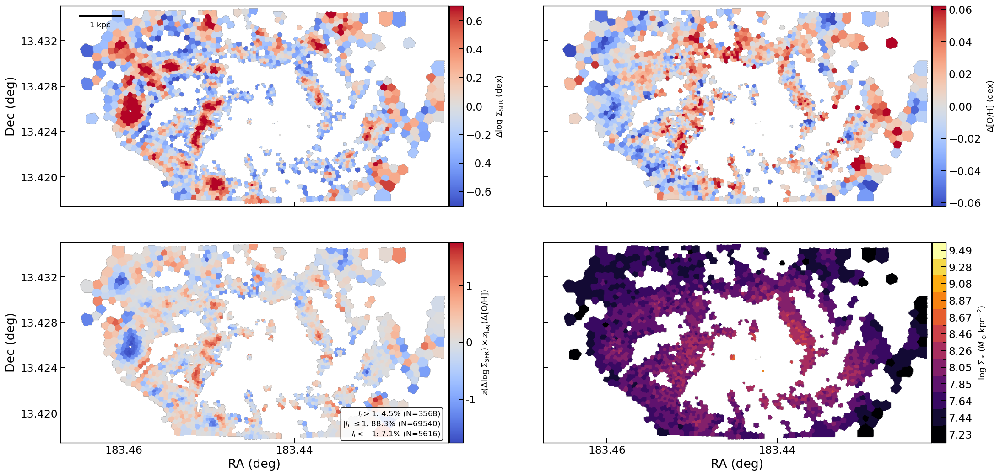

In [18]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------
    # 2x2 Combined figure: offset maps + Moran-like map + binned Σ* map
    # ------------------------------------------------------------------
    from pathlib import Path
    from astropy.io import fits

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    EW_MIN = 6.0

    from astropy.wcs import WCS
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gs_module
    from matplotlib.colors import BoundaryNorm, SymLogNorm
    import matplotlib.ticker as mticker
    from matplotlib.ticker import ScalarFormatter

    # Only focus on NGC4189 for this visualisation
    galaxies = [gal for gal in ['NGC4189'] if gal in physics_ready_galaxies(require_ew=True)]
    if not galaxies:
        print('Skipped NGC4189 visualisation: nested *_further mass/SFR/OH+EW products are not ready for this galaxy yet.')

    # ------------------------------------------------------------------
    # Define threshold parameter for linear/log colorbar transition and classification
    # ------------------------------------------------------------------
    threshold = 1  # Values between -threshold and +threshold use linear scale

    # ------------------------------------------------------------------
    # 1.  Helper: read the required maps
    # ------------------------------------------------------------------
    def load_maps(gal):
        spatial_path = further_spatial_path(gal)
        gas_path = further_gas_path(gal)
        ew_path = further_ew_path(gal, EW_FILE_SUFFIX)

        if not (Path(spatial_path).exists() and Path(gas_path).exists() and Path(ew_path).exists()):
            raise FileNotFoundError(f'Required FITS files for {gal} not found.')

        with fits.open(spatial_path) as h_spatial:
            sigM = h_spatial['LOGMASS_SURFACE_DENSITY'].data
            binid_map = h_spatial['BINID'].data
            wcs = WCS(h_spatial['LOGMASS_SURFACE_DENSITY'].header)
        with fits.open(gas_path) as h_gas:
            sigSFR = h_gas['LOGSFR_SURFACE_DENSITY_HII'].data
            ha_sigma_obs = h_gas['HA6562_SIGMA'].data
            ha_sigma_corr = h_gas['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h_gas else None
            if ha_sigma_corr is None:
                raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gas_path}')
            if ha_sigma_corr.shape != ha_sigma_obs.shape:
                raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {ha_sigma_corr.shape} vs SIGMA {ha_sigma_obs.shape}')
            sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
            ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
            sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
            ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
            if 'O_H_O3N2_M14_HII' in h_gas:
                oh_map = h_gas['O_H_O3N2_M14_HII'].data
                indicator_name = 'O3N2-M14'
            elif 'O_H_O3N2_M13_HII' in h_gas:
                print(f"Warning: O3N2-M14 not available for {gal}; using O3N2-M13 instead.")
                oh_map = h_gas['O_H_O3N2_M13_HII'].data
                indicator_name = 'O3N2-M13'
            else:
                available = [hdu.name for hdu in h_gas]
                raise KeyError(f"No O3N2 metallicity extension (M14/M13) found for {gal}. Available: {available}")
            gas_header = h_gas['LOGSFR_SURFACE_DENSITY_HII'].header
        with fits.open(ew_path) as h_ew:
            if EW_HDU not in h_ew:
                raise KeyError(f"Missing {EW_HDU} in {ew_path}")
            ew_ha = h_ew[EW_HDU].data
        ew_ha = align_map_to_shape(ew_ha, sigSFR.shape, label=f"{gal} {EW_HDU}")
        ew_mask = np.isfinite(ew_ha) & (ew_ha > EW_MIN)
        ew_mask = ew_mask & np.isfinite(ha_sigma) & (ha_sigma < 45.0)
        sigSFR = np.where(ew_mask, sigSFR, np.nan)
        oh_map = np.where(ew_mask, oh_map, np.nan)
        return sigM, sigSFR, oh_map, indicator_name, wcs, gas_header, binid_map

    for gal in galaxies:
        sigM, sigSFR, oh_o3n2_map, indicator_name, wcs_full, gas_header, binid_map = load_maps(gal)
        # Valid pixels across maps
        valid_sfr = np.isfinite(sigSFR)
        valid_oh = np.isfinite(oh_o3n2_map)
        valid_sigM = np.isfinite(sigM)
        valid_all = valid_sfr & valid_oh & valid_sigM

        # ------------------------------------------------------------------
        # 2.  Calculate offset maps (relative to Σ* bin means)
        # ------------------------------------------------------------------
        # Define 12 Σ* bins
        n_bins = 12
        sigmaM_min = np.nanmin(sigM[valid_all])
        sigmaM_max = np.nanmax(sigM[valid_all])
        sigmaM_bin_edges = np.linspace(sigmaM_min, sigmaM_max, n_bins + 1)
    
        # Initialize offset maps
        sfr_offset = np.full_like(sigSFR, np.nan)
        oh_offset = np.full_like(oh_o3n2_map, np.nan)
    
        # Calculate offset for each Σ* bin
        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM <= sigmaM_bin_edges[i+1]) & valid_all
            else:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
        
            if np.sum(bin_mask) > 0:
                # Calculate bin mean and offset within this bin
                sfr_bin_mean = np.mean(sigSFR[bin_mask])
                oh_bin_mean = np.mean(oh_o3n2_map[bin_mask])
            
                sfr_offset[bin_mask] = sigSFR[bin_mask] - sfr_bin_mean
                oh_offset[bin_mask] = oh_o3n2_map[bin_mask] - oh_bin_mean
    
        sfr_offset_max = np.nanpercentile(np.abs(sfr_offset[valid_all]), 95)
        # Reduce Delta O/H range to 95th percentile to highlight differences
        oh_offset_max = np.nanpercentile(np.abs(oh_offset[valid_all]), 95)
    
        # Global means for display purposes only
        sfr_mean = np.nanmean(sigSFR[valid_sfr])
        oh_mean = np.nanmean(oh_o3n2_map[valid_oh])

        # ------------------------------------------------------------------
        # 3.  Calculate local bivariate Moran-like map
        # ------------------------------------------------------------------
        def local_bivariate_moran_by_bin(A, B, valid_mask, binid_map, neighbourhood='queen'):
            """Local bivariate Moran-style statistic on adjacent spatial bins.

            Each valid BINID is treated as one graph node, using the mean A and B value
            of that bin. The resulting per-bin Moran value is expanded back to all
            valid pixels in the bin for plotting.
            """
            A = np.asarray(A, dtype=float)
            B = np.asarray(B, dtype=float)
            valid_mask = np.asarray(valid_mask, dtype=bool)
            binid_raw = np.asarray(binid_map, dtype=float)
            if A.shape != B.shape or A.shape != valid_mask.shape or A.shape != binid_raw.shape:
                raise ValueError('A, B, valid_mask, and binid_map must have the same shape')

            I_map = np.full(A.shape, np.nan)
            quad_map = np.zeros(A.shape, dtype=np.int16)
            finite_bin = np.isfinite(binid_raw) & (binid_raw >= 0)
            binid = np.full(A.shape, -1, dtype=np.int64)
            binid[finite_bin] = np.rint(binid_raw[finite_bin]).astype(np.int64)
            valid = valid_mask & np.isfinite(A) & np.isfinite(B) & (binid >= 0)
            valid_bins = np.unique(binid[valid])
            if valid_bins.size < 2:
                return I_map, quad_map

            max_bin = int(valid_bins.max())
            flat_bins = binid[valid].ravel()
            counts = np.bincount(flat_bins, minlength=max_bin + 1).astype(float)
            sum_A = np.bincount(flat_bins, weights=A[valid].ravel(), minlength=max_bin + 1)
            sum_B = np.bincount(flat_bins, weights=B[valid].ravel(), minlength=max_bin + 1)
            A_bin = np.full(max_bin + 1, np.nan)
            B_bin = np.full(max_bin + 1, np.nan)
            has_data = counts > 0
            A_bin[has_data] = sum_A[has_data] / counts[has_data]
            B_bin[has_data] = sum_B[has_data] / counts[has_data]

            A_vals = A_bin[valid_bins]
            B_vals = B_bin[valid_bins]
            A_std = np.nanstd(A_vals)
            B_std = np.nanstd(B_vals)
            if not np.isfinite(A_std) or not np.isfinite(B_std) or A_std == 0 or B_std == 0:
                return I_map, quad_map

            Az = np.full(max_bin + 1, np.nan)
            Bz = np.full(max_bin + 1, np.nan)
            Az[valid_bins] = (A_vals - np.nanmean(A_vals)) / A_std
            Bz[valid_bins] = (B_vals - np.nanmean(B_vals)) / B_std

            offsets = [(-1, 0), (1, 0), (0, -1), (0, 1)]
            if neighbourhood == 'queen':
                offsets += [(-1, -1), (-1, 1), (1, -1), (1, 1)]
            elif neighbourhood != 'rook':
                raise ValueError("neighbourhood must be 'rook' or 'queen'")

            adjacency = {int(b): set() for b in valid_bins}
            rows, cols = A.shape
            for dy, dx in offsets:
                y0 = max(0, -dy)
                y1 = rows - max(0, dy)
                x0 = max(0, -dx)
                x1 = cols - max(0, dx)
                src = (slice(y0, y1), slice(x0, x1))
                dst = (slice(y0 + dy, y1 + dy), slice(x0 + dx, x1 + dx))
                pair_valid = valid[src] & valid[dst] & (binid[src] != binid[dst])
                for left, right in zip(binid[src][pair_valid], binid[dst][pair_valid]):
                    left = int(left)
                    right = int(right)
                    adjacency[left].add(right)
                    adjacency[right].add(left)

            for b in valid_bins:
                b = int(b)
                neigh = sorted(adjacency[b])
                if not neigh:
                    continue
                lag_B = np.nanmean(Bz[neigh])
                I_val = Az[b] * lag_B
                pixels = valid & (binid == b)
                I_map[pixels] = I_val
                if Az[b] >= 0 and lag_B >= 0:
                    quad_map[pixels] = 1
                elif Az[b] < 0 and lag_B < 0:
                    quad_map[pixels] = 2
                elif Az[b] >= 0 and lag_B < 0:
                    quad_map[pixels] = 3
                else:
                    quad_map[pixels] = 4

            return I_map, quad_map
        I_map, quad_map = local_bivariate_moran_by_bin(sfr_offset, oh_offset, valid_all, binid_map,
                                                neighbourhood='queen')

        # ------------------------------------------------------------------
        # Calculate statistics for three classes based on threshold
        # ------------------------------------------------------------------
        valid_I = np.isfinite(I_map)
        n_total = np.sum(valid_I)
        n_high = np.sum(I_map[valid_I] > threshold)
        n_mid = np.sum((I_map[valid_I] >= -threshold) & (I_map[valid_I] <= threshold))
        n_low = np.sum(I_map[valid_I] < -threshold)
        pct_high = (n_high / n_total * 100) if n_total > 0 else 0
        pct_mid = (n_mid / n_total * 100) if n_total > 0 else 0
        pct_low = (n_low / n_total * 100) if n_total > 0 else 0

        # ------------------------------------------------------------------
        # 4.  Create binned Σ* map
        # ------------------------------------------------------------------
        sigM_binned_map = np.full_like(sigM, np.nan)
    
        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM <= sigmaM_bin_edges[i+1]) & valid_all
            else:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
        
            # Assign bin center value
            bin_center = (sigmaM_bin_edges[i] + sigmaM_bin_edges[i+1]) / 2
            sigM_binned_map[bin_mask] = bin_center

        # ------------------------------------------------------------------
        # 5.  Prepare coordinate extent
        # ------------------------------------------------------------------
        wcs_celestial = WCS(gas_header).celestial
        y_size, x_size = sigSFR.shape
        x_coords = np.arange(x_size)
        y_coords = np.arange(y_size)
        xx, yy = np.meshgrid(x_coords, y_coords)
        ra, dec = wcs_celestial.pixel_to_world_values(xx, yy)
        extent = [ra.max(), ra.min(), dec.min(), dec.max()]

        # ------------------------------------------------------------------
        # 5b.  Scale bar: 5 kpc for 0.2 arcsec/pixel at 16.5 Mpc
        # ------------------------------------------------------------------
        pix_scale_arcsec = 0.2
        distance_mpc = 16.5
        # calculate degrees for 5 kpc, including cos(dec) for the RA axis
        kpc_arcsec = 206265.0 / (distance_mpc * 1000.0)
        scalebar_kpc = 1
        scalebar_length_deg = (scalebar_kpc * kpc_arcsec) / 3600.0
        mean_dec = np.nanmean(dec)
        scalebar_length_deg_ra = scalebar_length_deg / np.cos(np.deg2rad(mean_dec))

        def add_scalebar(ax, length_deg, label='1 kpc'):
            x0, x1 = ax.get_xlim()
            x_range = abs(x1 - x0)
            if x_range == 0:
                return
            frac_len = length_deg / x_range
            x_start = 0.05
            y_start = 0.95
            x_end = x_start + frac_len
            line, = ax.plot([x_start, x_end], [y_start, y_start], transform=ax.transAxes,
                            color='k', lw=3, clip_on=False)
            line.set_in_layout(False)
            txt = ax.text((x_start + x_end) / 2, y_start - 0.03, label,
                          transform=ax.transAxes, ha='center', va='top', color='k')
            txt.set_in_layout(False)

        # ------------------------------------------------------------------
        # 6.  2x2 figure: shared axes, equal aspect preserved, colorbars glued to axes
        # ------------------------------------------------------------------
        from mpl_toolkits.axes_grid1 import make_axes_locatable

        # Auto-derive a reasonable figsize from the map extent
        dx = abs(extent[1] - extent[0])   # RA span
        dy = abs(extent[3] - extent[2])   # Dec span
        data_ratio = (dx / dy) if dy > 0 else 1.0  # width / height

        panel_h = 4.2   # inches per panel height (tune once)
        panel_w = panel_h * data_ratio
        cbar_w = 0.35   # inches per colorbar (tune once)

        W = 2 * panel_w + 2 * cbar_w + 1.2
        H = 2 * panel_h + 0.8

        fig, axs = plt.subplots(
            2, 2, figsize=(W, H), sharex=True, sharey=True
        )

        # Make space for the appended colorbars (right margin matters)
        fig.subplots_adjust(
            left=0.07, right=0.96, bottom=0.07, top=0.98,
            wspace=0.20, hspace=0.06
        )

        ax1, ax2 = axs[0, 0], axs[0, 1]
        ax3, ax4 = axs[1, 0], axs[1, 1]

        def add_cbar(ax, im, label, size="3.5%", pad=0.02, labelpad=6, labelsize=11):
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size=size, pad=pad)
            cbar = fig.colorbar(im, cax=cax)
            cbar.set_label(label, fontsize=labelsize, labelpad=labelpad)
            return cbar

        # --- Ticks / formatting (readable RA, no +1.834e2)
        for ax in (ax1, ax2, ax3, ax4):
            ax.xaxis.set_major_locator(mticker.MaxNLocator(3))
            ax.yaxis.set_major_locator(mticker.MaxNLocator(5))
            ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))

        # Hide inner tick labels
        plt.setp(ax1.get_xticklabels(), visible=False)
        plt.setp(ax2.get_xticklabels(), visible=False)
        plt.setp(ax2.get_yticklabels(), visible=False)
        plt.setp(ax4.get_yticklabels(), visible=False)

        # Axis labels (outer only)
        ax3.set_xlabel("RA (deg)", fontsize=16)
        ax4.set_xlabel("RA (deg)", fontsize=16)
        ax1.set_ylabel("Dec (deg)", fontsize=16)
        ax3.set_ylabel("Dec (deg)", fontsize=16)

        # ---- Panel 1: SFR offset
        im_sfr = ax1.imshow(
            np.ma.masked_invalid(sfr_offset),
            origin="lower", cmap="coolwarm",
            extent=extent, vmin=-sfr_offset_max, vmax=sfr_offset_max,
            aspect="equal"
        )
        add_scalebar(ax1, scalebar_length_deg_ra, label="1 kpc")
        add_cbar(ax1, im_sfr, r'$\Delta\log\,\Sigma_{\mathrm{SFR}}$ (dex)', labelpad=4)

        # ---- Panel 2: OH offset
        im_oh = ax2.imshow(
            np.ma.masked_invalid(oh_offset),
            origin="lower", cmap="coolwarm",
            extent=extent, vmin=-oh_offset_max, vmax=oh_offset_max,
            aspect="equal"
        )
        add_cbar(ax2, im_oh, r'$\Delta$[O/H] (dex)')

        # ---- Panel 3: Moran-like
        vI = np.nanmax(np.abs(I_map))
        norm = SymLogNorm(linthresh=threshold, linscale=1.0, vmin=-vI, vmax=vI, base=10)

        imI = ax3.imshow(
            np.ma.masked_invalid(I_map),
            origin="lower", cmap="coolwarm",
            extent=extent, norm=norm,
            aspect="equal"
        )
        cbarI = add_cbar(
            ax3, imI,
            r'$z(\Delta\log\Sigma_{\rm SFR}) \times z_{\rm lag}(\Delta{\rm [O/H]})$'
        )

        # Keep your symmetric-log ticks logic
        max_pow = int(np.floor(np.log10(vI))) if vI > 0 else 0
        pos_ticks = [10**k for k in range(0, max_pow + 1) if 10**k <= vI]
        pos_ticks_filtered = [p for p in pos_ticks if p != threshold]
        neg_ticks_filtered = [-p for p in reversed(pos_ticks_filtered)]
        ticks = sorted(set(neg_ticks_filtered + [-threshold, 0.0, threshold] + pos_ticks_filtered))
        cbarI.set_ticks(ticks)
        cbarI.set_ticklabels([f"{t:g}" for t in ticks])

        legend_text = (
            rf'$I_i > {threshold}$: {pct_high:.1f}% (N={n_high})'
            '\n' + rf'$|I_i| \leq {threshold}$: {pct_mid:.1f}% (N={n_mid})'
            '\n' + rf'$I_i < -{threshold}$: {pct_low:.1f}% (N={n_low})'
        )
        ax3.text(
            0.98, 0.02, legend_text, transform=ax3.transAxes,
            fontsize=10, va="bottom", ha="right",
            bbox=dict(boxstyle="round", facecolor="white", alpha=0.85)
        )

        # ---- Panel 4: binned Σ*
        cmap_discrete = plt.cm.inferno
        norm_discrete = BoundaryNorm(sigmaM_bin_edges, cmap_discrete.N)

        im_sigM_binned = ax4.imshow(
            np.ma.masked_invalid(sigM_binned_map),
            origin="lower", cmap=cmap_discrete, norm=norm_discrete,
            extent=extent,
            aspect="equal"
        )
        cbar_binned = add_cbar(
            ax4, im_sigM_binned,
            r'$\log\,\Sigma_*\;(M_\odot\,\mathrm{kpc}^{-2})$'
        )

        bin_centers = [(sigmaM_bin_edges[i] + sigmaM_bin_edges[i+1]) / 2 for i in range(n_bins)]
        cbar_binned.set_ticks(bin_centers)
        cbar_binned.set_ticklabels([f"{bc:.2f}" for bc in bin_centers])

        # fig.savefig(f'Plot_Paper_1/{gal}_correlation_map_moran_EW.png', dpi=600, bbox_inches="tight", pad_inches=0.02)
        # fig.savefig(f'Plot_Paper_1/{gal}_correlation_map_moran_EW.pdf', bbox_inches="tight", pad_inches=0.02)
        plt.show()
else:
    print("Skipped copied previous-project analysis cell 8: no nested *_further mass/SFR/OH+EW products are ready yet.")


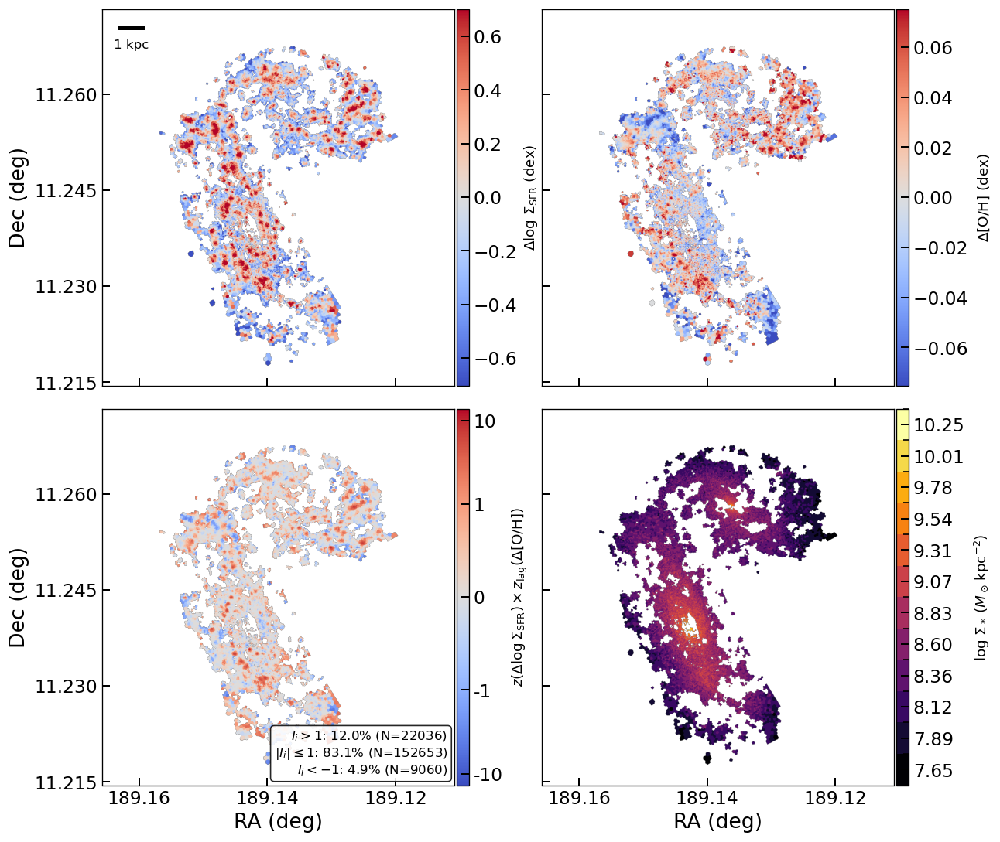

In [19]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------
    # 2x2 Combined figure: offset maps + Moran-like map + binned Σ* map
    # ------------------------------------------------------------------
    from pathlib import Path
    from astropy.io import fits

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    EW_MIN = 6.0

    from astropy.wcs import WCS
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gs_module
    from matplotlib.colors import BoundaryNorm, SymLogNorm
    import matplotlib.ticker as mticker
    from matplotlib.ticker import ScalarFormatter

    # Only focus on NGC4567_8 for this visualisation
    galaxies = [gal for gal in ['NGC4567_8'] if gal in physics_ready_galaxies(require_ew=True)]
    if not galaxies:
        print('Skipped NGC4567_8 visualisation: nested *_further mass/SFR/OH+EW products are not ready for this galaxy yet.')

    # ------------------------------------------------------------------
    # Define threshold parameter for linear/log colorbar transition and classification
    # ------------------------------------------------------------------
    threshold = 1  # Values between -threshold and +threshold use linear scale

    # ------------------------------------------------------------------
    # 1.  Helper: read the required maps
    # ------------------------------------------------------------------
    def load_maps(gal):
        spatial_path = further_spatial_path(gal)
        gas_path = further_gas_path(gal)
        ew_path = further_ew_path(gal, EW_FILE_SUFFIX)

        if not (Path(spatial_path).exists() and Path(gas_path).exists() and Path(ew_path).exists()):
            raise FileNotFoundError(f'Required FITS files for {gal} not found.')

        with fits.open(spatial_path) as h_spatial:
            sigM = h_spatial['LOGMASS_SURFACE_DENSITY'].data
            binid_map = h_spatial['BINID'].data
            wcs = WCS(h_spatial['LOGMASS_SURFACE_DENSITY'].header)
        with fits.open(gas_path) as h_gas:
            sigSFR = h_gas['LOGSFR_SURFACE_DENSITY_HII'].data
            ha_sigma_obs = h_gas['HA6562_SIGMA'].data
            ha_sigma_corr = h_gas['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h_gas else None
            if ha_sigma_corr is None:
                raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gas_path}')
            if ha_sigma_corr.shape != ha_sigma_obs.shape:
                raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {ha_sigma_corr.shape} vs SIGMA {ha_sigma_obs.shape}')
            sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
            ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
            sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
            ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
            if 'O_H_O3N2_M14_HII' in h_gas:
                oh_map = h_gas['O_H_O3N2_M14_HII'].data
                indicator_name = 'O3N2-M14'
            elif 'O_H_O3N2_M13_HII' in h_gas:
                print(f"Warning: O3N2-M14 not available for {gal}; using O3N2-M13 instead.")
                oh_map = h_gas['O_H_O3N2_M13_HII'].data
                indicator_name = 'O3N2-M13'
            else:
                available = [hdu.name for hdu in h_gas]
                raise KeyError(f"No O3N2 metallicity extension (M14/M13) found for {gal}. Available: {available}")
            gas_header = h_gas['LOGSFR_SURFACE_DENSITY_HII'].header
        with fits.open(ew_path) as h_ew:
            if EW_HDU not in h_ew:
                raise KeyError(f"Missing {EW_HDU} in {ew_path}")
            ew_ha = h_ew[EW_HDU].data
        ew_ha = align_map_to_shape(ew_ha, sigSFR.shape, label=f"{gal} {EW_HDU}")
        ew_mask = np.isfinite(ew_ha) & (ew_ha > EW_MIN)
        ew_mask = ew_mask & np.isfinite(ha_sigma) & (ha_sigma < 45.0)
        sigSFR = np.where(ew_mask, sigSFR, np.nan)
        oh_map = np.where(ew_mask, oh_map, np.nan)
        return sigM, sigSFR, oh_map, indicator_name, wcs, gas_header, binid_map

    for gal in galaxies:
        sigM, sigSFR, oh_o3n2_map, indicator_name, wcs_full, gas_header, binid_map = load_maps(gal)
        # Valid pixels across maps
        valid_sfr = np.isfinite(sigSFR)
        valid_oh = np.isfinite(oh_o3n2_map)
        valid_sigM = np.isfinite(sigM)
        valid_all = valid_sfr & valid_oh & valid_sigM

        # ------------------------------------------------------------------
        # 2.  Calculate offset maps (relative to Σ* bin means)
        # ------------------------------------------------------------------
        # Define 12 Σ* bins
        n_bins = 12
        sigmaM_min = np.nanmin(sigM[valid_all])
        sigmaM_max = np.nanmax(sigM[valid_all])
        sigmaM_bin_edges = np.linspace(sigmaM_min, sigmaM_max, n_bins + 1)
    
        # Initialize offset maps
        sfr_offset = np.full_like(sigSFR, np.nan)
        oh_offset = np.full_like(oh_o3n2_map, np.nan)
    
        # Calculate offset for each Σ* bin
        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM <= sigmaM_bin_edges[i+1]) & valid_all
            else:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
        
            if np.sum(bin_mask) > 0:
                # Calculate bin mean and offset within this bin
                sfr_bin_mean = np.mean(sigSFR[bin_mask])
                oh_bin_mean = np.mean(oh_o3n2_map[bin_mask])
            
                sfr_offset[bin_mask] = sigSFR[bin_mask] - sfr_bin_mean
                oh_offset[bin_mask] = oh_o3n2_map[bin_mask] - oh_bin_mean
    
        sfr_offset_max = np.nanpercentile(np.abs(sfr_offset[valid_all]), 95)
        # Reduce Delta O/H range to 95th percentile to highlight differences
        oh_offset_max = np.nanpercentile(np.abs(oh_offset[valid_all]), 95)
    
        # Global means for display purposes only
        sfr_mean = np.nanmean(sigSFR[valid_sfr])
        oh_mean = np.nanmean(oh_o3n2_map[valid_oh])

        # ------------------------------------------------------------------
        # 3.  Calculate local bivariate Moran-like map
        # ------------------------------------------------------------------
        def local_bivariate_moran_by_bin(A, B, valid_mask, binid_map, neighbourhood='queen'):
            """Local bivariate Moran-style statistic on adjacent spatial bins.

            Each valid BINID is treated as one graph node, using the mean A and B value
            of that bin. The resulting per-bin Moran value is expanded back to all
            valid pixels in the bin for plotting.
            """
            A = np.asarray(A, dtype=float)
            B = np.asarray(B, dtype=float)
            valid_mask = np.asarray(valid_mask, dtype=bool)
            binid_raw = np.asarray(binid_map, dtype=float)
            if A.shape != B.shape or A.shape != valid_mask.shape or A.shape != binid_raw.shape:
                raise ValueError('A, B, valid_mask, and binid_map must have the same shape')

            I_map = np.full(A.shape, np.nan)
            quad_map = np.zeros(A.shape, dtype=np.int16)
            finite_bin = np.isfinite(binid_raw) & (binid_raw >= 0)
            binid = np.full(A.shape, -1, dtype=np.int64)
            binid[finite_bin] = np.rint(binid_raw[finite_bin]).astype(np.int64)
            valid = valid_mask & np.isfinite(A) & np.isfinite(B) & (binid >= 0)
            valid_bins = np.unique(binid[valid])
            if valid_bins.size < 2:
                return I_map, quad_map

            max_bin = int(valid_bins.max())
            flat_bins = binid[valid].ravel()
            counts = np.bincount(flat_bins, minlength=max_bin + 1).astype(float)
            sum_A = np.bincount(flat_bins, weights=A[valid].ravel(), minlength=max_bin + 1)
            sum_B = np.bincount(flat_bins, weights=B[valid].ravel(), minlength=max_bin + 1)
            A_bin = np.full(max_bin + 1, np.nan)
            B_bin = np.full(max_bin + 1, np.nan)
            has_data = counts > 0
            A_bin[has_data] = sum_A[has_data] / counts[has_data]
            B_bin[has_data] = sum_B[has_data] / counts[has_data]

            A_vals = A_bin[valid_bins]
            B_vals = B_bin[valid_bins]
            A_std = np.nanstd(A_vals)
            B_std = np.nanstd(B_vals)
            if not np.isfinite(A_std) or not np.isfinite(B_std) or A_std == 0 or B_std == 0:
                return I_map, quad_map

            Az = np.full(max_bin + 1, np.nan)
            Bz = np.full(max_bin + 1, np.nan)
            Az[valid_bins] = (A_vals - np.nanmean(A_vals)) / A_std
            Bz[valid_bins] = (B_vals - np.nanmean(B_vals)) / B_std

            offsets = [(-1, 0), (1, 0), (0, -1), (0, 1)]
            if neighbourhood == 'queen':
                offsets += [(-1, -1), (-1, 1), (1, -1), (1, 1)]
            elif neighbourhood != 'rook':
                raise ValueError("neighbourhood must be 'rook' or 'queen'")

            adjacency = {int(b): set() for b in valid_bins}
            rows, cols = A.shape
            for dy, dx in offsets:
                y0 = max(0, -dy)
                y1 = rows - max(0, dy)
                x0 = max(0, -dx)
                x1 = cols - max(0, dx)
                src = (slice(y0, y1), slice(x0, x1))
                dst = (slice(y0 + dy, y1 + dy), slice(x0 + dx, x1 + dx))
                pair_valid = valid[src] & valid[dst] & (binid[src] != binid[dst])
                for left, right in zip(binid[src][pair_valid], binid[dst][pair_valid]):
                    left = int(left)
                    right = int(right)
                    adjacency[left].add(right)
                    adjacency[right].add(left)

            for b in valid_bins:
                b = int(b)
                neigh = sorted(adjacency[b])
                if not neigh:
                    continue
                lag_B = np.nanmean(Bz[neigh])
                I_val = Az[b] * lag_B
                pixels = valid & (binid == b)
                I_map[pixels] = I_val
                if Az[b] >= 0 and lag_B >= 0:
                    quad_map[pixels] = 1
                elif Az[b] < 0 and lag_B < 0:
                    quad_map[pixels] = 2
                elif Az[b] >= 0 and lag_B < 0:
                    quad_map[pixels] = 3
                else:
                    quad_map[pixels] = 4

            return I_map, quad_map
        I_map, quad_map = local_bivariate_moran_by_bin(sfr_offset, oh_offset, valid_all, binid_map,
                                                neighbourhood='queen')

        # ------------------------------------------------------------------
        # Calculate statistics for three classes based on threshold
        # ------------------------------------------------------------------
        valid_I = np.isfinite(I_map)
        n_total = np.sum(valid_I)
        n_high = np.sum(I_map[valid_I] > threshold)
        n_mid = np.sum((I_map[valid_I] >= -threshold) & (I_map[valid_I] <= threshold))
        n_low = np.sum(I_map[valid_I] < -threshold)
        pct_high = (n_high / n_total * 100) if n_total > 0 else 0
        pct_mid = (n_mid / n_total * 100) if n_total > 0 else 0
        pct_low = (n_low / n_total * 100) if n_total > 0 else 0

        # ------------------------------------------------------------------
        # 4.  Create binned Σ* map
        # ------------------------------------------------------------------
        sigM_binned_map = np.full_like(sigM, np.nan)
    
        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM <= sigmaM_bin_edges[i+1]) & valid_all
            else:
                bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
        
            # Assign bin center value
            bin_center = (sigmaM_bin_edges[i] + sigmaM_bin_edges[i+1]) / 2
            sigM_binned_map[bin_mask] = bin_center

        # ------------------------------------------------------------------
        # 5.  Prepare coordinate extent
        # ------------------------------------------------------------------
        wcs_celestial = WCS(gas_header).celestial
        y_size, x_size = sigSFR.shape
        x_coords = np.arange(x_size)
        y_coords = np.arange(y_size)
        xx, yy = np.meshgrid(x_coords, y_coords)
        ra, dec = wcs_celestial.pixel_to_world_values(xx, yy)
        extent = [ra.max(), ra.min(), dec.min(), dec.max()]

        # ------------------------------------------------------------------
        # 5b.  Scale bar: 5 kpc for 0.2 arcsec/pixel at 16.5 Mpc
        # ------------------------------------------------------------------
        pix_scale_arcsec = 0.2
        distance_mpc = 16.5
        # calculate degrees for 5 kpc, including cos(dec) for the RA axis
        kpc_arcsec = 206265.0 / (distance_mpc * 1000.0)
        scalebar_kpc = 1
        scalebar_length_deg = (scalebar_kpc * kpc_arcsec) / 3600.0
        mean_dec = np.nanmean(dec)
        scalebar_length_deg_ra = scalebar_length_deg / np.cos(np.deg2rad(mean_dec))

        def add_scalebar(ax, length_deg, label='1 kpc'):
            x0, x1 = ax.get_xlim()
            x_range = abs(x1 - x0)
            if x_range == 0:
                return
            frac_len = length_deg / x_range
            x_start = 0.05
            y_start = 0.95
            x_end = x_start + frac_len
            line, = ax.plot([x_start, x_end], [y_start, y_start], transform=ax.transAxes,
                            color='k', lw=3, clip_on=False)
            line.set_in_layout(False)
            txt = ax.text((x_start + x_end) / 2, y_start - 0.03, label,
                          transform=ax.transAxes, ha='center', va='top', color='k')
            txt.set_in_layout(False)

        # ------------------------------------------------------------------
        # 6.  2x2 figure: shared axes, equal aspect preserved, colorbars glued to axes
        # ------------------------------------------------------------------
        from mpl_toolkits.axes_grid1 import make_axes_locatable

        # Auto-derive a reasonable figsize from the map extent
        dx = abs(extent[1] - extent[0])   # RA span
        dy = abs(extent[3] - extent[2])   # Dec span
        data_ratio = (dx / dy) if dy > 0 else 1.0  # width / height

        panel_h = 4.2   # inches per panel height (tune once)
        panel_w = panel_h * data_ratio
        cbar_w = 0.35   # inches per colorbar (tune once)

        W = 2 * panel_w + 2 * cbar_w + 1.2
        H = 2 * panel_h + 0.8

        fig, axs = plt.subplots(
            2, 2, figsize=(W, H), sharex=True, sharey=True
        )

        # Make space for the appended colorbars (right margin matters)
        fig.subplots_adjust(
            left=0.07, right=0.96, bottom=0.07, top=0.98,
            wspace=0.20, hspace=0.06
        )

        ax1, ax2 = axs[0, 0], axs[0, 1]
        ax3, ax4 = axs[1, 0], axs[1, 1]

        def add_cbar(ax, im, label, size="3.5%", pad=0.02, labelpad=6, labelsize=11):
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size=size, pad=pad)
            cbar = fig.colorbar(im, cax=cax)
            cbar.set_label(label, fontsize=labelsize, labelpad=labelpad)
            return cbar

        # --- Ticks / formatting (readable RA, no +1.834e2)
        for ax in (ax1, ax2, ax3, ax4):
            ax.xaxis.set_major_locator(mticker.MaxNLocator(3))
            ax.yaxis.set_major_locator(mticker.MaxNLocator(5))
            ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))

        # Hide inner tick labels
        plt.setp(ax1.get_xticklabels(), visible=False)
        plt.setp(ax2.get_xticklabels(), visible=False)
        plt.setp(ax2.get_yticklabels(), visible=False)
        plt.setp(ax4.get_yticklabels(), visible=False)

        # Axis labels (outer only)
        ax3.set_xlabel("RA (deg)", fontsize=16)
        ax4.set_xlabel("RA (deg)", fontsize=16)
        ax1.set_ylabel("Dec (deg)", fontsize=16)
        ax3.set_ylabel("Dec (deg)", fontsize=16)

        # ---- Panel 1: SFR offset
        im_sfr = ax1.imshow(
            np.ma.masked_invalid(sfr_offset),
            origin="lower", cmap="coolwarm",
            extent=extent, vmin=-sfr_offset_max, vmax=sfr_offset_max,
            aspect="equal"
        )
        add_scalebar(ax1, scalebar_length_deg_ra, label="1 kpc")
        add_cbar(ax1, im_sfr, r'$\Delta\log\,\Sigma_{\mathrm{SFR}}$ (dex)', labelpad=4)

        # ---- Panel 2: OH offset
        im_oh = ax2.imshow(
            np.ma.masked_invalid(oh_offset),
            origin="lower", cmap="coolwarm",
            extent=extent, vmin=-oh_offset_max, vmax=oh_offset_max,
            aspect="equal"
        )
        add_cbar(ax2, im_oh, r'$\Delta$[O/H] (dex)')

        # ---- Panel 3: Moran-like
        vI = np.nanmax(np.abs(I_map))
        norm = SymLogNorm(linthresh=threshold, linscale=1.0, vmin=-vI, vmax=vI, base=10)

        imI = ax3.imshow(
            np.ma.masked_invalid(I_map),
            origin="lower", cmap="coolwarm",
            extent=extent, norm=norm,
            aspect="equal"
        )
        cbarI = add_cbar(
            ax3, imI,
            r'$z(\Delta\log\Sigma_{\rm SFR}) \times z_{\rm lag}(\Delta{\rm [O/H]})$'
        )

        # Keep your symmetric-log ticks logic
        max_pow = int(np.floor(np.log10(vI))) if vI > 0 else 0
        pos_ticks = [10**k for k in range(0, max_pow + 1) if 10**k <= vI]
        pos_ticks_filtered = [p for p in pos_ticks if p != threshold]
        neg_ticks_filtered = [-p for p in reversed(pos_ticks_filtered)]
        ticks = sorted(set(neg_ticks_filtered + [-threshold, 0.0, threshold] + pos_ticks_filtered))
        cbarI.set_ticks(ticks)
        cbarI.set_ticklabels([f"{t:g}" for t in ticks])

        legend_text = (
            rf'$I_i > {threshold}$: {pct_high:.1f}% (N={n_high})'
            '\n' + rf'$|I_i| \leq {threshold}$: {pct_mid:.1f}% (N={n_mid})'
            '\n' + rf'$I_i < -{threshold}$: {pct_low:.1f}% (N={n_low})'
        )
        ax3.text(
            0.98, 0.02, legend_text, transform=ax3.transAxes,
            fontsize=10, va="bottom", ha="right",
            bbox=dict(boxstyle="round", facecolor="white", alpha=0.85)
        )

        # ---- Panel 4: binned Σ*
        cmap_discrete = plt.cm.inferno
        norm_discrete = BoundaryNorm(sigmaM_bin_edges, cmap_discrete.N)

        im_sigM_binned = ax4.imshow(
            np.ma.masked_invalid(sigM_binned_map),
            origin="lower", cmap=cmap_discrete, norm=norm_discrete,
            extent=extent,
            aspect="equal"
        )
        cbar_binned = add_cbar(
            ax4, im_sigM_binned,
            r'$\log\,\Sigma_*\;(M_\odot\,\mathrm{kpc}^{-2})$'
        )

        bin_centers = [(sigmaM_bin_edges[i] + sigmaM_bin_edges[i+1]) / 2 for i in range(n_bins)]
        cbar_binned.set_ticks(bin_centers)
        cbar_binned.set_ticklabels([f"{bc:.2f}" for bc in bin_centers])

        # fig.savefig(f'Plot_Paper_1/{gal}_correlation_map_moran_EW.png', dpi=600, bbox_inches="tight", pad_inches=0.02)
        # fig.savefig(f'Plot_Paper_1/{gal}_correlation_map_moran_EW.pdf', bbox_inches="tight", pad_inches=0.02)
        plt.show()
else:
    print("Skipped copied previous-project analysis cell 8: no nested *_further mass/SFR/OH+EW products are ready yet.")


Processing 28 galaxies (excluding NGC4383 for stats): IC3392, NGC4064, NGC4189, NGC4192, NGC4254, NGC4293, NGC4294, NGC4298, NGC4302, NGC4330, NGC4351, NGC4388, NGC4394, NGC4396, NGC4402, NGC4405, NGC4419, NGC4450, NGC4457, NGC4501, NGC4522, NGC4567_8, NGC4569, NGC4580, NGC4606, NGC4607, NGC4694, NGC4698
  NGC4419 PROXY_EWHA: aligned shape (643, 628) -> (643, 629); overlap=(643, 628)
  NGC4694 PROXY_EWHA: aligned shape (440, 439) -> (441, 439); overlap=(440, 439)
Computing global Spearman trends...


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_12693/4279040060.py:799: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.85])


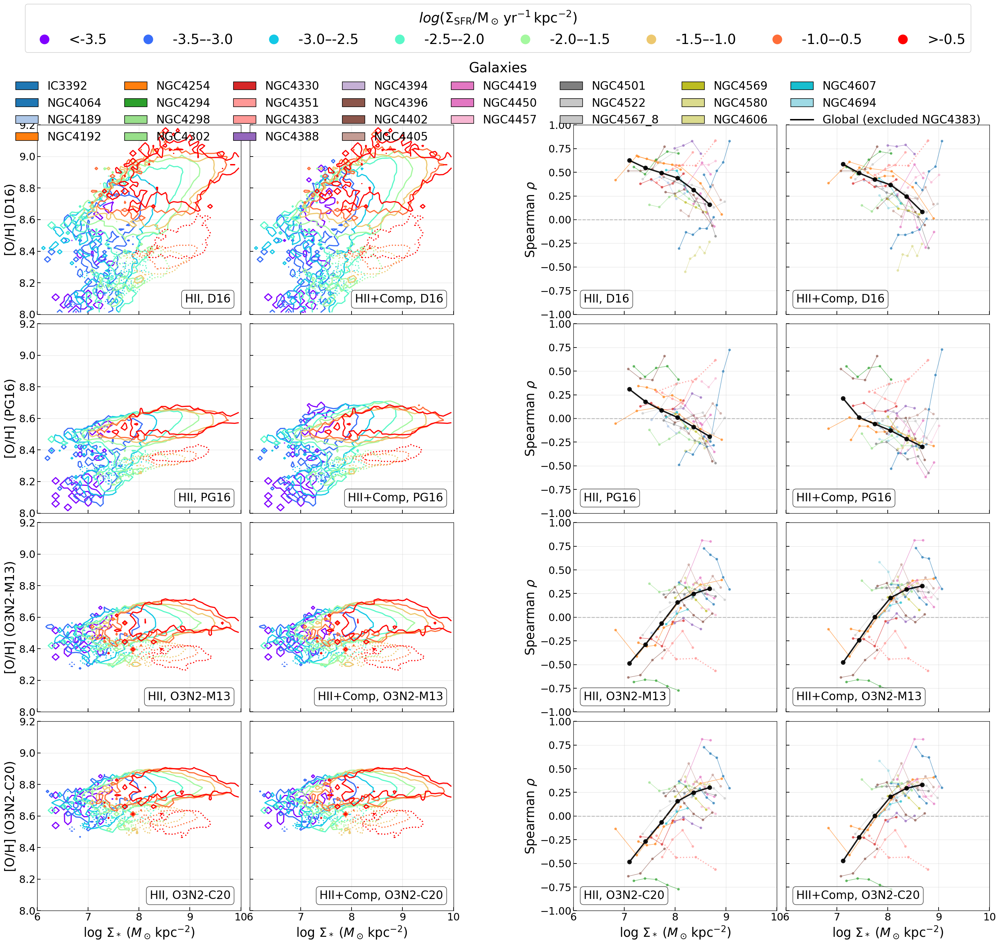

In [20]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------
    # COMBINED FIGURE: rMZR Scatter (Cols 1-2) and Spearman rho (Cols 3-4)
    # WITH NGC4383 (Dotted Contours/Lines)
    # ------------------------------------------------------------------
    import numpy as np
    import matplotlib.pyplot as plt
    from pathlib import Path
    from astropy.io import fits

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    EW_MIN = 6.0

    import scipy.stats as stats
    from scipy.stats import spearmanr
    import matplotlib.gridspec as gridspec
    from matplotlib.patches import Patch
    import matplotlib.lines as mlines

    # ==========================================
    # PART 1: FUNCTIONS & SETUP
    # ==========================================

    def load_maps_mzr(gal):
        """Load all metallicity calibrations for both HII and SF regions (MZR version)"""
        ew_path = further_ew_path(gal, EW_FILE_SUFFIX)

        with fits.open(further_spatial_path(gal)) as h:
            sigM = h['LOGMASS_SURFACE_DENSITY'].data
        with fits.open(further_gas_path(gal)) as h:
            # HII regions
            sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
            ha_sigma_obs = h['HA6562_SIGMA'].data
            ha_sigma_corr = h['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h else None
            if ha_sigma_corr is None:
                raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gal}_gas_BIN_maps_extended.fits')
            if ha_sigma_corr.shape != ha_sigma_obs.shape:
                raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {ha_sigma_corr.shape} vs SIGMA {ha_sigma_obs.shape}')
            sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
            ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
            sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
            ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
            oh_d16_HII = h['O_H_D16_HII'].data
            oh_pg16_HII = h['O_H_PG16_HII'].data
            oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
            oh_o3n2_c20_HII = h['O_H_O3N2_C20_HII'].data
            # SF regions
            sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
            oh_d16_SF = h['O_H_D16_SF'].data
            oh_pg16_SF = h['O_H_PG16_SF'].data
            oh_o3n2_m13_SF = h['O_H_O3N2_M13_SF'].data
            oh_o3n2_c20_SF = h['O_H_O3N2_C20_SF'].data
            # Emission lines
            HB4861_FLUX_corr = h['HB4861_FLUX_corr'].data
            HA6562_FLUX_corr = h['HA6562_FLUX_corr'].data
            OIII5006_FLUX_corr = h['OIII5006_FLUX_corr'].data
            NII6583_FLUX_corr = h['NII6583_FLUX_corr'].data
            SII6716_FLUX_corr = h['SII6716_FLUX_corr'].data
            SII6730_FLUX_corr = h['SII6730_FLUX_corr'].data
        with fits.open(ew_path) as h_ew:
            if EW_HDU not in h_ew:
                raise KeyError(f"Missing {EW_HDU} in {ew_path}")
            ew_ha = h_ew[EW_HDU].data
        ew_ha = align_map_to_shape(ew_ha, sigSFR_HII.shape, label=f"{gal} {EW_HDU}")
        ew_mask = np.isfinite(ew_ha) & (ew_ha > EW_MIN)
        ew_mask = ew_mask & np.isfinite(ha_sigma) & (ha_sigma < 45.0)
        sigSFR_HII = np.where(ew_mask, sigSFR_HII, np.nan)
        oh_d16_HII = np.where(ew_mask, oh_d16_HII, np.nan)
        oh_pg16_HII = np.where(ew_mask, oh_pg16_HII, np.nan)
        oh_o3n2_m13_HII = np.where(ew_mask, oh_o3n2_m13_HII, np.nan)
        oh_o3n2_c20_HII = np.where(ew_mask, oh_o3n2_c20_HII, np.nan)
        sigSFR_SF = np.where(ew_mask, sigSFR_SF, np.nan)
        oh_d16_SF = np.where(ew_mask, oh_d16_SF, np.nan)
        oh_pg16_SF = np.where(ew_mask, oh_pg16_SF, np.nan)
        oh_o3n2_m13_SF = np.where(ew_mask, oh_o3n2_m13_SF, np.nan)
        oh_o3n2_c20_SF = np.where(ew_mask, oh_o3n2_c20_SF, np.nan)
        return (sigM, sigSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, oh_o3n2_c20_HII,
                sigSFR_SF, oh_d16_SF, oh_pg16_SF, oh_o3n2_m13_SF, oh_o3n2_c20_SF,
                HB4861_FLUX_corr, HA6562_FLUX_corr, OIII5006_FLUX_corr, 
                NII6583_FLUX_corr, SII6716_FLUX_corr, SII6730_FLUX_corr)

    def calculate_binned_stats_spearman(x_data, y_data, bin_width=0.2, min_unique=20):
        """Calculate median and std in x-bins (Spearman version)"""
        x_data = np.asarray(x_data)
        y_data = np.asarray(y_data)
    
        finite = np.isfinite(x_data) & np.isfinite(y_data)
        if np.sum(finite) == 0:
            return np.array([]), np.array([]), np.array([]), np.array([])
        
        x_min, x_max = np.nanmin(x_data[finite]), np.nanmax(x_data[finite])
        if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
            return np.array([]), np.array([]), np.array([]), np.array([])
        
        bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
        if bin_edges.size < 2:
            return np.array([]), np.array([]), np.array([]), np.array([])
        
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
        medians = []
        stds = []
        counts = []
        valid_centers = []
    
        for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
            in_bin = finite & (x_data >= bin_start) & (x_data < bin_end)
            if np.sum(in_bin) == 0:
                continue
            
            y_in_bin = y_data[in_bin]
            if len(np.unique(y_in_bin)) >= min_unique:
                medians.append(np.nanmedian(y_in_bin))
                stds.append(np.nanstd(y_in_bin))
                counts.append(len(y_in_bin))
                valid_centers.append(bin_centers[i])
            
        return (np.array(valid_centers), np.array(medians), 
                np.array(stds), np.array(counts))

    def compute_spearman_track(sigM, sigSFR, oh_map, n_bins=6):
        valid_all = np.isfinite(sigM) & np.isfinite(sigSFR) & np.isfinite(oh_map)
        if np.sum(valid_all) == 0:
            return np.array([]), np.array([])

        sigM = sigM[valid_all]
        sigSFR = sigSFR[valid_all]
        oh_map = oh_map[valid_all]

        sigmaM_min = np.nanpercentile(sigM, 2.5)
        sigmaM_max = np.nanpercentile(sigM, 97.5)
        sigmaM_edges = np.linspace(sigmaM_min, sigmaM_max, n_bins + 1)
        sigmaM_centers = 0.5 * (sigmaM_edges[:-1] + sigmaM_edges[1:])

        valid_centers = []
        rho_values = []

        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM < sigmaM_edges[i+1])
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM <= sigmaM_edges[i+1])
            else:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM < sigmaM_edges[i+1])

            if np.sum(bin_mask) <= 20:
                continue

            sfr_bin = sigSFR[bin_mask]
            oh_bin = oh_map[bin_mask]

            sfr_off = sfr_bin - np.mean(sfr_bin)
            oh_off = oh_bin - np.mean(oh_bin)

            valid_corr = np.isfinite(sfr_off) & np.isfinite(oh_off)

            # ------------------------------------------------------------------
            # Calculate 3-sigma clipping mask on unique valid data
            # ------------------------------------------------------------------
            sigma_clip_mask = np.zeros_like(valid_corr, dtype=bool)
            if np.sum(valid_corr) > 0:
                sfr_data = sfr_off[valid_corr]
                oh_data = oh_off[valid_corr]

                sfr_unique = np.unique(sfr_data)
                oh_unique = np.unique(oh_data)

                x_mean = np.mean(sfr_unique)
                x_std = np.std(sfr_unique)
                y_mean = np.mean(oh_unique)
                y_std = np.std(oh_unique)

                x_lower = x_mean - 3 * x_std
                x_upper = x_mean + 3 * x_std
                y_lower = y_mean - 3 * y_std
                y_upper = y_mean + 3 * y_std

                within_3sigma = (sfr_data >= x_lower) & (sfr_data <= x_upper) & \
                                (oh_data >= y_lower) & (oh_data <= y_upper)
                sigma_clip_mask[valid_corr] = within_3sigma

            x_trend = sfr_off[sigma_clip_mask]
            y_trend = oh_off[sigma_clip_mask]
            centers, _, _, _ = calculate_binned_stats_spearman(x_trend, y_trend, bin_width=0.2, min_unique=20)

            if centers.size >= 3 and np.sum(sigma_clip_mask) > 2:
                try:
                    rho, _ = spearmanr(sfr_off[sigma_clip_mask], oh_off[sigma_clip_mask])
                    if np.isfinite(rho):
                        valid_centers.append(sigmaM_centers[i])
                        rho_values.append(rho)
                except:
                    pass

        return np.array(valid_centers), np.array(rho_values)

    def compute_spearman_track_from_offsets(sigM, sfr_off, oh_off, n_bins=6):
        """Like compute_spearman_track but takes pre-subtracted offsets (Option 1)."""
        valid_all = np.isfinite(sigM) & np.isfinite(sfr_off) & np.isfinite(oh_off)
        if np.sum(valid_all) == 0:
            return np.array([]), np.array([])

        sigM = sigM[valid_all]
        sfr_off = sfr_off[valid_all]
        oh_off = oh_off[valid_all]

        sigmaM_min = np.nanpercentile(sigM, 2.5)
        sigmaM_max = np.nanpercentile(sigM, 97.5)
        sigmaM_edges = np.linspace(sigmaM_min, sigmaM_max, n_bins + 1)
        sigmaM_centers = 0.5 * (sigmaM_edges[:-1] + sigmaM_edges[1:])

        valid_centers = []
        rho_values = []

        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM < sigmaM_edges[i+1])
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM <= sigmaM_edges[i+1])
            else:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM < sigmaM_edges[i+1])

            if np.sum(bin_mask) <= 20:
                continue

            # Use offsets directly (already mean-subtracted per galaxy per bin)
            sfr_off_bin = sfr_off[bin_mask]
            oh_off_bin = oh_off[bin_mask]

            valid_corr = np.isfinite(sfr_off_bin) & np.isfinite(oh_off_bin)

            sigma_clip_mask = np.zeros_like(valid_corr, dtype=bool)
            if np.sum(valid_corr) > 0:
                sfr_data = sfr_off_bin[valid_corr]
                oh_data = oh_off_bin[valid_corr]
                sfr_unique = np.unique(sfr_data)
                oh_unique = np.unique(oh_data)
                x_mean = np.mean(sfr_unique)
                x_std = np.std(sfr_unique)
                y_mean = np.mean(oh_unique)
                y_std = np.std(oh_unique)
                x_lower = x_mean - 3 * x_std
                x_upper = x_mean + 3 * x_std
                y_lower = y_mean - 3 * y_std
                y_upper = y_mean + 3 * y_std
                within_3sigma = (sfr_data >= x_lower) & (sfr_data <= x_upper) & \
                                (oh_data >= y_lower) & (oh_data <= y_upper)
                sigma_clip_mask[valid_corr] = within_3sigma

            x_trend = sfr_off_bin[sigma_clip_mask]
            y_trend = oh_off_bin[sigma_clip_mask]
            centers, _, _, _ = calculate_binned_stats_spearman(x_trend, y_trend, bin_width=0.2, min_unique=20)

            if centers.size >= 3 and np.sum(sigma_clip_mask) > 2:
                try:
                    rho, _ = spearmanr(sfr_off_bin[sigma_clip_mask], oh_off_bin[sigma_clip_mask])
                    if np.isfinite(rho):
                        valid_centers.append(sigmaM_centers[i])
                        rho_values.append(rho)
                except Exception:
                    pass

        return np.array(valid_centers), np.array(rho_values)

    
        valid_centers = []
        rho_values = []
    
        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM < sigmaM_edges[i+1])
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM <= sigmaM_edges[i+1])
            else:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM < sigmaM_edges[i+1])
            
            if np.sum(bin_mask) <= 20: 
                continue
            
            sfr_bin = sigSFR[bin_mask]
            oh_bin = oh_map[bin_mask]
        
            sfr_off = sfr_bin - np.mean(sfr_bin)
            oh_off = oh_bin - np.mean(oh_bin)
        
            valid_corr = np.isfinite(sfr_off) & np.isfinite(oh_off)
        
            # ------------------------------------------------------------------
            # Calculate 3-sigma clipping mask on unique valid data
            # ------------------------------------------------------------------
            sigma_clip_mask = np.zeros_like(valid_corr, dtype=bool)
            if np.sum(valid_corr) > 0:
                sfr_data = sfr_off[valid_corr]
                oh_data = oh_off[valid_corr]
            
                sfr_unique = np.unique(sfr_data)
                oh_unique = np.unique(oh_data)
            
                x_mean = np.mean(sfr_unique)
                x_std = np.std(sfr_unique)
                y_mean = np.mean(oh_unique)
                y_std = np.std(oh_unique)
            
                x_lower = x_mean - 3 * x_std
                x_upper = x_mean + 3 * x_std
                y_lower = y_mean - 3 * y_std
                y_upper = y_mean + 3 * y_std
            
                within_3sigma = (sfr_data >= x_lower) & (sfr_data <= x_upper) & \
                                (oh_data >= y_lower) & (oh_data <= y_upper)
                sigma_clip_mask[valid_corr] = within_3sigma
            
            x_trend = sfr_off[sigma_clip_mask]
            y_trend = oh_off[sigma_clip_mask]
            centers, _, _, _ = calculate_binned_stats_spearman(x_trend, y_trend, bin_width=0.2, min_unique=20)
        
            if centers.size >= 3 and np.sum(sigma_clip_mask) > 2:
                try:
                    rho, _ = spearmanr(sfr_off[sigma_clip_mask], oh_off[sigma_clip_mask])
                    if np.isfinite(rho):
                        valid_centers.append(sigmaM_centers[i])
                        rho_values.append(rho)
                except:
                    pass
                
        return np.array(valid_centers), np.array(rho_values)

    # ==========================================
    # PART 2: DATA COLLECTION
    # ==========================================

    # Get galaxies
    galaxies_all = physics_ready_galaxies(require_ew=True)
    excluded_galaxies = {'NGC4383'}
    galaxies = [g for g in galaxies_all if g not in excluded_galaxies]
    print(f"Processing {len(galaxies)} galaxies (excluding NGC4383 for stats): {', '.join(galaxies)}")

    # --- MZR Data Containers (Main) ---
    all_logSigmaM_HII = []
    all_logSigmaSFR_HII = []
    all_oh_d16_HII = []
    all_oh_pg16_HII = []
    all_oh_o3n2_m13_HII = []
    all_oh_o3n2_c20_HII = []

    all_logSigmaM_SF = []
    all_logSigmaSFR_SF = []
    all_oh_d16_SF = []
    all_oh_pg16_SF = []
    all_oh_o3n2_m13_SF = []
    all_oh_o3n2_c20_SF = []

    all_logSFR_hii = [] # For binning
    all_logSFR_sf = []

    # --- Spearman Data Containers (Main) ---
    spearman_results = {
        'HII': {ind: {'galaxies': {}, 'global_pixels': {'sigM': [], 'sfr_off': [], 'oh_off': []}} for ind in ['D16', 'PG16', 'O3N2-M13', 'O3N2-C20']},
        'SF': {ind: {'galaxies': {}, 'global_pixels': {'sigM': [], 'sfr_off': [], 'oh_off': []}} for ind in ['D16', 'PG16', 'O3N2-M13', 'O3N2-C20']}
    }

    # --- NGC4383 Data Container ---
    ngc4383_data = {
        'HII': {'sigM': [], 'sigSFR': [], 'D16': [], 'PG16': [], 'O3N2-M13': [], 'O3N2-C20': []},
        'SF': {'sigM': [], 'sigSFR': [], 'D16': [], 'PG16': [], 'O3N2-M13': [], 'O3N2-C20': []}
    }
    ngc4383_spearman = {
        'HII': {ind: ([], []) for ind in ['D16', 'PG16', 'O3N2-M13', 'O3N2-C20']},
        'SF': {ind: ([], []) for ind in ['D16', 'PG16', 'O3N2-M13', 'O3N2-C20']}
    }

    print("Collecting data...")
    for gal in galaxies_all:
        # Load data using the MZR loader (it has everything)
        try:
            (logSigmaM, logSigmaSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, oh_o3n2_c20_HII,
             logSigmaSFR_SF, oh_d16_SF, oh_pg16_SF, oh_o3n2_m13_SF, oh_o3n2_c20_SF,
             HB, HA, OIII, NII, SII6716, SII6730) = load_maps_mzr(gal)
        except Exception as e:
            print(f"Skipping {gal}: {e}")
            continue

        # --- Process MZR Data ---
        common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
                           np.isfinite(oh_d16_HII) & np.isfinite(oh_pg16_HII) & 
                           np.isfinite(oh_o3n2_m13_HII) & np.isfinite(oh_o3n2_c20_HII))
    
        common_mask_SF = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_SF) & 
                          np.isfinite(oh_d16_SF) & np.isfinite(oh_pg16_SF) & 
                          np.isfinite(oh_o3n2_m13_SF) & np.isfinite(oh_o3n2_c20_SF))
    
        if gal == 'NGC4383':
            # Store NGC4383 data separately
            ngc4383_data['HII']['sigM'] = logSigmaM[common_mask_HII].flatten()
            ngc4383_data['HII']['sigSFR'] = logSigmaSFR_HII[common_mask_HII].flatten()
            ngc4383_data['HII']['D16'] = oh_d16_HII[common_mask_HII].flatten()
            ngc4383_data['HII']['PG16'] = oh_pg16_HII[common_mask_HII].flatten()
            ngc4383_data['HII']['O3N2-M13'] = oh_o3n2_m13_HII[common_mask_HII].flatten()
            ngc4383_data['HII']['O3N2-C20'] = oh_o3n2_c20_HII[common_mask_HII].flatten()
        
            ngc4383_data['SF']['sigM'] = logSigmaM[common_mask_SF].flatten()
            ngc4383_data['SF']['sigSFR'] = logSigmaSFR_SF[common_mask_SF].flatten()
            ngc4383_data['SF']['D16'] = oh_d16_SF[common_mask_SF].flatten()
            ngc4383_data['SF']['PG16'] = oh_pg16_SF[common_mask_SF].flatten()
            ngc4383_data['SF']['O3N2-M13'] = oh_o3n2_m13_SF[common_mask_SF].flatten()
            ngc4383_data['SF']['O3N2-C20'] = oh_o3n2_c20_SF[common_mask_SF].flatten()
        
            # Compute Spearman for NGC4383
            maps_4383 = {
                'HII': {
                    'D16': (logSigmaM, logSigmaSFR_HII, oh_d16_HII),
                    'PG16': (logSigmaM, logSigmaSFR_HII, oh_pg16_HII),
                    'O3N2-M13': (logSigmaM, logSigmaSFR_HII, oh_o3n2_m13_HII),
                    'O3N2-C20': (logSigmaM, logSigmaSFR_HII, oh_o3n2_c20_HII)
                },
                'SF': {
                    'D16': (logSigmaM, logSigmaSFR_SF, oh_d16_SF),
                    'PG16': (logSigmaM, logSigmaSFR_SF, oh_pg16_SF),
                    'O3N2-M13': (logSigmaM, logSigmaSFR_SF, oh_o3n2_m13_SF),
                    'O3N2-C20': (logSigmaM, logSigmaSFR_SF, oh_o3n2_c20_SF)
                }
            }
            for reg in ['HII', 'SF']:
                for ind in ['D16', 'PG16', 'O3N2-M13', 'O3N2-C20']:
                    sM, sSFR, oh = maps_4383[reg][ind]
                    x, y = compute_spearman_track(sM, sSFR, oh)
                    ngc4383_spearman[reg][ind] = (x, y)

        else:
            # Append Main MZR data
            all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
            all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
            all_oh_d16_HII.extend(oh_d16_HII[common_mask_HII].flatten())
            all_oh_pg16_HII.extend(oh_pg16_HII[common_mask_HII].flatten())
            all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
            all_oh_o3n2_c20_HII.extend(oh_o3n2_c20_HII[common_mask_HII].flatten())
            all_logSFR_hii.extend(logSigmaSFR_HII[common_mask_HII].flatten())
        
            all_logSigmaM_SF.extend(logSigmaM[common_mask_SF].flatten())
            all_logSigmaSFR_SF.extend(logSigmaSFR_SF[common_mask_SF].flatten())
            all_oh_d16_SF.extend(oh_d16_SF[common_mask_SF].flatten())
            all_oh_pg16_SF.extend(oh_pg16_SF[common_mask_SF].flatten())
            all_oh_o3n2_m13_SF.extend(oh_o3n2_m13_SF[common_mask_SF].flatten())
            all_oh_o3n2_c20_SF.extend(oh_o3n2_c20_SF[common_mask_SF].flatten())
            all_logSFR_sf.extend(logSigmaSFR_SF[common_mask_SF].flatten())

            # --- Process Spearman Data (Main) ---
            maps = {
                'HII': {
                    'D16': (logSigmaM, logSigmaSFR_HII, oh_d16_HII),
                    'PG16': (logSigmaM, logSigmaSFR_HII, oh_pg16_HII),
                    'O3N2-M13': (logSigmaM, logSigmaSFR_HII, oh_o3n2_m13_HII),
                    'O3N2-C20': (logSigmaM, logSigmaSFR_HII, oh_o3n2_c20_HII)
                },
                'SF': {
                    'D16': (logSigmaM, logSigmaSFR_SF, oh_d16_SF),
                    'PG16': (logSigmaM, logSigmaSFR_SF, oh_pg16_SF),
                    'O3N2-M13': (logSigmaM, logSigmaSFR_SF, oh_o3n2_m13_SF),
                    'O3N2-C20': (logSigmaM, logSigmaSFR_SF, oh_o3n2_c20_SF)
                }
            }
        
            for reg in ['HII', 'SF']:
                for ind in ['D16', 'PG16', 'O3N2-M13', 'O3N2-C20']:
                    sM, sSFR, oh = maps[reg][ind]
                    # Compute per-galaxy track
                    x, y = compute_spearman_track(sM, sSFR, oh)
                    if len(x) > 0:
                        spearman_results[reg][ind]['galaxies'][gal] = (x, y)

                        # Collect per-bin offsets for global ensemble (Option 1)
                        sM_loc, sSFR_loc, oh_loc = maps[reg][ind]
                        v_all = np.isfinite(sM_loc) & np.isfinite(sSFR_loc) & np.isfinite(oh_loc)
                        if np.sum(v_all) > 0:
                            sM_v = sM_loc[v_all]; sSFR_v = sSFR_loc[v_all]; oh_v = oh_loc[v_all]
                            sM_min = np.nanpercentile(sM_v, 2.5)
                            sM_max = np.nanpercentile(sM_v, 97.5)
                            sM_edges = np.linspace(sM_min, sM_max, 7)
                            for bi in range(6):
                                if bi == 0:
                                    bm = (sM_v >= sM_edges[bi]) & (sM_v < sM_edges[bi+1])
                                elif bi == 5:
                                    bm = (sM_v >= sM_edges[bi]) & (sM_v <= sM_edges[bi+1])
                                else:
                                    bm = (sM_v >= sM_edges[bi]) & (sM_v < sM_edges[bi+1])
                                if np.sum(bm) > 0:
                                    sfr_off_b = sSFR_v[bm] - np.mean(sSFR_v[bm])
                                    oh_off_b = oh_v[bm] - np.mean(oh_v[bm])
                                    vc = np.isfinite(sfr_off_b) & np.isfinite(oh_off_b)
                                    if np.sum(vc) > 0:
                                        spearman_results[reg][ind]['global_pixels']['sigM'].extend(sM_v[bm][vc])
                                        spearman_results[reg][ind]['global_pixels']['sfr_off'].extend(sfr_off_b[vc])
                                        spearman_results[reg][ind]['global_pixels']['oh_off'].extend(oh_off_b[vc])
    # Convert MZR lists to arrays
    all_logSigmaM_HII = np.array(all_logSigmaM_HII)
    all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
    all_oh_d16_HII = np.array(all_oh_d16_HII)
    all_oh_pg16_HII = np.array(all_oh_pg16_HII)
    all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)
    all_oh_o3n2_c20_HII = np.array(all_oh_o3n2_c20_HII)
    all_logSFR_hii = np.array(all_logSFR_hii)

    all_logSigmaM_SF = np.array(all_logSigmaM_SF)
    all_logSigmaSFR_SF = np.array(all_logSigmaSFR_SF)
    all_oh_d16_SF = np.array(all_oh_d16_SF)
    all_oh_pg16_SF = np.array(all_oh_pg16_SF)
    all_oh_o3n2_m13_SF = np.array(all_oh_o3n2_m13_SF)
    all_oh_o3n2_c20_SF = np.array(all_oh_o3n2_c20_SF)
    all_logSFR_sf = np.array(all_logSFR_sf)

    # Compute global Spearman tracks (Main only)
    print("Computing global Spearman trends...")
    for reg in ['HII', 'SF']:
        for ind in ['D16', 'PG16', 'O3N2-M13', 'O3N2-C20']:
            g_data = spearman_results[reg][ind]['global_pixels']
            if len(g_data['sigM']) > 0:
                x, y = compute_spearman_track_from_offsets(
                    np.array(g_data['sigM']), 
                    np.array(g_data['sfr_off']), 
                    np.array(g_data['oh_off'])
                )
                spearman_results[reg][ind]['global_track'] = (x, y)
            else:
                spearman_results[reg][ind]['global_track'] = (np.array([]), np.array([]))

    # ==========================================
    # PART 3: PLOTTING
    # ==========================================

    # Setup MZR bins
    sfr_bin_edges = [-np.inf, -3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5, np.inf]
    n_bins = len(sfr_bin_edges) - 1
    mzr_colors = plt.cm.rainbow(np.linspace(0, 1, n_bins))
    bin_labels = ['<-3.5', '-3.5–-3.0', '-3.0–-2.5', '-2.5–-2.0', '-2.0–-1.5', '-1.5–-1.0', '-1.0–-0.5', '>-0.5']

    # Setup Galaxy colors (using ALL galaxies to preserve color mapping)
    galaxy_colors_all = plt.cm.tab20(np.linspace(0, 1, len(galaxies_all)))
    galaxy_color_dict = dict(zip(galaxies_all, galaxy_colors_all))

    # Create Figure with more top space for legends
    fig = plt.figure(figsize=(30, 24))
    # 4 rows, 5 columns (use 5 cols with middle one as spacer). Large top margin for two legends stacked vertically.
    # Columns: 0=HII, 1=SF, 2=SPACER, 3=Spearman HII, 4=Spearman SF
    # Width ratios: normal, normal, wide spacer, normal, normal
    # Use subplots for fine control over spacing
    gs = gridspec.GridSpec(4, 5, figure=fig, hspace=0.05, top=0.85, bottom=0.05,
                           width_ratios=[1, 1, 0.5, 1, 1],  # Middle column is spacer
                           wspace=0.05)  # Base spacing (will be 0.2x of original 0.25)

    calibrations = ['D16', 'PG16', 'O3N2-M13', 'O3N2-C20']
    mzr_data_HII = [all_oh_d16_HII, all_oh_pg16_HII, all_oh_o3n2_m13_HII, all_oh_o3n2_c20_HII]
    mzr_data_SF = [all_oh_d16_SF, all_oh_pg16_SF, all_oh_o3n2_m13_SF, all_oh_o3n2_c20_SF]

    mzr_legend_handles = []
    mzr_legend_labels = []

    for row_idx, calib_name in enumerate(calibrations):
        # --- COL 0 & 1: MZR (Scatter) ---
        # Note: Using columns 0 and 1 for MZR, column 2 is spacer, columns 3 and 4 for Spearman
        ax_mzr_HII = fig.add_subplot(gs[row_idx, 0])
        ax_mzr_SF = fig.add_subplot(gs[row_idx, 1])
    
        oh_HII = mzr_data_HII[row_idx]
        oh_SF = mzr_data_SF[row_idx]
    
        # Plot MZR HII (Contours for 13 galaxies - solid lines)
        for i in range(n_bins):
            in_bin = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII < sfr_bin_edges[i+1])
            if np.sum(in_bin) > 20:  # Need enough points for density estimation
                try:
                    x = all_logSigmaM_HII[in_bin]
                    y = oh_HII[in_bin]
                
                    # Use 2D histogram directly (much faster than KDE)
                    xmin, xmax = 6, 10
                    ymin, ymax = 8.0, 9.2
                    H, xedges, yedges = np.histogram2d(x, y, bins=50, range=[[xmin, xmax], [ymin, ymax]], density=True)
                
                    # Find 95% density threshold
                    H_flat = H.flatten()
                    H_sorted = np.sort(H_flat)[::-1]
                    H_cumsum = np.cumsum(H_sorted)
                    H_cumsum /= H_cumsum[-1]
                    threshold_95 = H_sorted[np.where(H_cumsum >= 0.95)[0][0]]
                
                    # Create grid centers for contour plotting
                    x_centers = (xedges[:-1] + xedges[1:]) / 2
                    y_centers = (yedges[:-1] + yedges[1:]) / 2
                
                    # Plot solid contour at 95% threshold level for 13 galaxies
                    ax_mzr_HII.contour(x_centers, y_centers, H.T, levels=[threshold_95], colors=[mzr_colors[i]], linestyles='solid', linewidths=2)
                except:
                    pass
            
            if row_idx == 0 and len(mzr_legend_handles) < n_bins:
                 mzr_legend_handles.append(mlines.Line2D([], [], color=mzr_colors[i], marker='o', linestyle='None', markersize=16, label=bin_labels[i]))
                 mzr_legend_labels.append(bin_labels[i])
        
            # Plot NGC4383 Contours (HII) - 95% population (dotted)
            if len(ngc4383_data['HII']['sigM']) > 0:
                ngc_sigM = np.array(ngc4383_data['HII']['sigM'])
                ngc_oh = np.array(ngc4383_data['HII'][calib_name])
                ngc_sfr = np.array(ngc4383_data['HII']['sigSFR'])
            
                in_bin_ngc = (ngc_sfr >= sfr_bin_edges[i]) & (ngc_sfr < sfr_bin_edges[i+1])
                if np.sum(in_bin_ngc) > 20: # Need enough points for density estimation
                    try:
                        x = ngc_sigM[in_bin_ngc]
                        y = ngc_oh[in_bin_ngc]
                    
                        # Use 2D histogram directly (much faster than KDE)
                        xmin, xmax = 6, 10
                        ymin, ymax = 8.0, 9.2
                        H, xedges, yedges = np.histogram2d(x, y, bins=50, range=[[xmin, xmax], [ymin, ymax]], density=True)
                    
                        # Find 95% density threshold
                        H_flat = H.flatten()
                        H_sorted = np.sort(H_flat)[::-1]
                        H_cumsum = np.cumsum(H_sorted)
                        H_cumsum /= H_cumsum[-1]
                        threshold_95 = H_sorted[np.where(H_cumsum >= 0.95)[0][0]]
                    
                        # Create grid centers for contour plotting
                        x_centers = (xedges[:-1] + xedges[1:]) / 2
                        y_centers = (yedges[:-1] + yedges[1:]) / 2
                    
                        # Plot dotted contour at 95% threshold level
                        ax_mzr_HII.contour(x_centers, y_centers, H.T, levels=[threshold_95], colors=[mzr_colors[i]], linestyles='dotted', linewidths=2)
                    except:
                        pass

        # Plot MZR SF (Contours for 13 galaxies - solid lines)
        for i in range(n_bins):
            in_bin = (all_logSigmaSFR_SF >= sfr_bin_edges[i]) & (all_logSigmaSFR_SF < sfr_bin_edges[i+1])
            if np.sum(in_bin) > 20:  # Need enough points for density estimation
                try:
                    x = all_logSigmaM_SF[in_bin]
                    y = oh_SF[in_bin]
                
                    # Create 2D histogram to find 95% density threshold
                    # Use 2D histogram directly (much faster than KDE)
                    xmin, xmax = 6, 10
                    ymin, ymax = 8.0, 9.2
                    H, xedges, yedges = np.histogram2d(x, y, bins=50, range=[[xmin, xmax], [ymin, ymax]], density=True)
                
                    # Find 95% density threshold
                    H_flat = H.flatten()
                    H_sorted = np.sort(H_flat)[::-1]
                    H_cumsum = np.cumsum(H_sorted)
                    H_cumsum /= H_cumsum[-1]
                    threshold_95 = H_sorted[np.where(H_cumsum >= 0.95)[0][0]]
                
                    # Create grid centers for contour plotting
                    x_centers = (xedges[:-1] + xedges[1:]) / 2
                    y_centers = (yedges[:-1] + yedges[1:]) / 2
                
                    # Plot solid contour at 95% threshold level for 13 galaxies
                    ax_mzr_SF.contour(x_centers, y_centers, H.T, levels=[threshold_95], colors=[mzr_colors[i]], linestyles='solid', linewidths=2)
                except:
                    pass
        
            # Plot NGC4383 Contours (SF) - 95% population (dotted)
            if len(ngc4383_data['SF']['sigM']) > 0:
                ngc_sigM = np.array(ngc4383_data['SF']['sigM'])
                ngc_oh = np.array(ngc4383_data['SF'][calib_name])
                ngc_sfr = np.array(ngc4383_data['SF']['sigSFR'])
            
                in_bin_ngc = (ngc_sfr >= sfr_bin_edges[i]) & (ngc_sfr < sfr_bin_edges[i+1])
                if np.sum(in_bin_ngc) > 20:
                    try:
                        x = ngc_sigM[in_bin_ngc]
                        y = ngc_oh[in_bin_ngc]
                    
                        # Create 2D histogram to find 95% density threshold
                        # Use 2D histogram directly (much faster than KDE)
                        xmin, xmax = 6, 10
                        ymin, ymax = 8.0, 9.2
                        H, xedges, yedges = np.histogram2d(x, y, bins=50, range=[[xmin, xmax], [ymin, ymax]], density=True)
                    
                        # Find 95% density threshold
                        H_flat = H.flatten()
                        H_sorted = np.sort(H_flat)[::-1]
                        H_cumsum = np.cumsum(H_sorted)
                        H_cumsum /= H_cumsum[-1]
                        threshold_95 = H_sorted[np.where(H_cumsum >= 0.95)[0][0]]
                    
                        # Create grid centers for contour plotting
                        x_centers = (xedges[:-1] + xedges[1:]) / 2
                        y_centers = (yedges[:-1] + yedges[1:]) / 2
                    
                        # Plot dotted contour at 95% threshold level
                        ax_mzr_SF.contour(x_centers, y_centers, H.T, levels=[threshold_95], colors=[mzr_colors[i]], linestyles='dotted', linewidths=2)
                    except:
                        pass

        # Format MZR Axes
        for col_idx, (ax, region_label) in enumerate(zip([ax_mzr_HII, ax_mzr_SF], ['HII', 'HII+Comp'])):
            # X-axis label only on bottom row
            if row_idx == 3:  # Bottom row
                ax.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=22)
            else:
                ax.set_xlabel('')
                ax.tick_params(labelbottom=False)
        
            # Y-axis label only on left column of first two columns
            if col_idx == 0:  # Left column
                ax.set_ylabel(f'[O/H] ({calib_name})', fontsize=22)
            else:
                ax.set_ylabel('')
                ax.tick_params(labelleft=False)
        
            # Set tick label size
            ax.tick_params(labelsize=18)
        
            ax.set_xlim(6, 10)
            ax.set_ylim(8.0, 9.2) # Fixed range for consistency
            ax.grid(True, alpha=0.3)
        
            # Add annotation in bottom right
            ax.text(0.95, 0.05, f'{region_label}, {calib_name}', 
                    transform=ax.transAxes, fontsize=20, 
                    verticalalignment='bottom', horizontalalignment='right',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

        # --- COL 3 & 4: Spearman ---
        # Note: Column 2 is the spacer, so Spearman plots go in columns 3 and 4
        ax_sp_HII = fig.add_subplot(gs[row_idx, 3])
        ax_sp_SF = fig.add_subplot(gs[row_idx, 4])
    
        for col_idx, (ax, region_key, region_label) in enumerate(zip([ax_sp_HII, ax_sp_SF], ['HII', 'SF'], ['HII', 'HII+Comp'])):
            # Plot individual galaxies (Main)
            for gal, (x, y) in spearman_results[region_key][calib_name]['galaxies'].items():
                if len(x) <= 2: continue
                color = galaxy_color_dict[gal]
                idx = np.argsort(x)
                ax.plot(x[idx], y[idx], color=color, alpha=0.6, linewidth=1)
                ax.scatter(x[idx], y[idx], color=color, s=20, alpha=0.7, edgecolors='none')
            
            # Plot NGC4383 (Dotted)
            gx_ngc, gy_ngc = ngc4383_spearman[region_key][calib_name]
            if len(gx_ngc) > 2:
                color = galaxy_color_dict['NGC4383']
                idx = np.argsort(gx_ngc)
                ax.plot(gx_ngc[idx], gy_ngc[idx], color=color, alpha=0.8, linewidth=2, linestyle=':')
                ax.scatter(gx_ngc[idx], gy_ngc[idx], color=color, s=20, alpha=0.8, edgecolors='none')

            # Plot global trend (Main only)
            gx, gy = spearman_results[region_key][calib_name].get('global_track', ([], []))
            if len(gx) > 2:
                idx = np.argsort(gx)
                ax.plot(gx[idx], gy[idx], color='black', linewidth=2.5, alpha=0.9)
                ax.scatter(gx[idx], gy[idx], color='black', s=50, alpha=0.9, zorder=10)
            
            ax.axhline(0, color='gray', linestyle='--', alpha=0.5)
            ax.set_ylim(-1.0, 1.0)
            ax.set_xlim(6, 10)
        
            # X-axis label only on bottom row
            if row_idx == 3:  # Bottom row
                ax.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=22)
            else:
                ax.set_xlabel('')
                ax.tick_params(labelbottom=False)
        
            # Y-axis label only on left column of last two columns (col 2)
            if col_idx == 0:  # Left column of columns 2-3
                ax.set_ylabel(r'Spearman $\rho$', fontsize=22)
            else:
                ax.set_ylabel('')
                ax.tick_params(labelleft=False)
        
            # Set tick label size
            ax.tick_params(labelsize=18)
        
            ax.grid(True, alpha=0.3)
        
            # Add annotation in bottom left
            ax.text(0.05, 0.05, f'{region_label}, {calib_name}', 
                transform=ax.transAxes, fontsize=20, 
                verticalalignment='bottom', horizontalalignment='left',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

    # --- LEGENDS ---
    # 1. MZR Legend (SFR bins) - Top position
    fig.legend(mzr_legend_handles, mzr_legend_labels, loc='upper center', bbox_to_anchor=(0.5, 0.98),
              ncol=8, fontsize=24, framealpha=0.9, 
              title=r'$log(\Sigma_\mathrm{SFR}/\mathrm{M_\odot\,yr^{-1}\,kpc^{-2}})$', title_fontsize=24)

    # 2. Spearman Legend (Galaxies) - Below the SFR legend
    spearman_legend_elements = [Patch(facecolor=galaxy_color_dict[gal], edgecolor='black', label=gal) for gal in galaxies_all if gal not in ['NGC4293', 'NGC4698']]
    spearman_legend_elements.append(mlines.Line2D([], [], color='black', lw=2.5, label='Global (excluded NGC4383)'))

    fig.legend(handles=spearman_legend_elements, loc='upper center', bbox_to_anchor=(0.5, 0.925),
               ncol=8, frameon=False, fontsize=20, title='Galaxies', title_fontsize=24)

    # plt.savefig('Plot_Paper_1/Combined_rMZR_spearman_EW.png', dpi=600, bbox_inches='tight')
    # plt.savefig('Plot_Paper_1/Combined_rMZR_spearman_EW.pdf', dpi=600, bbox_inches='tight')
    plt.tight_layout(rect=[0, 0, 1, 0.85])
    plt.show()
else:
    print("Skipped copied previous-project analysis cell 9: no nested *_further mass/SFR/OH+EW products are ready yet.")


In [21]:
# # ------------------------------------------------------------------
# # Combined Analysis: rMZR and Z_gas-Σ_SFR relation - HII regions only
# # Using O3N2-M13 indicator only
# # 2x2 subplot layout:
# #   Top-left: rMZR scatter
# #   Top-right: Z_gas-Σ_SFR scatter
# #   Bottom-left: rMZR median trends
# #   Bottom-right: Z_gas-Σ_SFR median trends
# # ------------------------------------------------------------------
# import numpy as np
# import matplotlib.pyplot as plt
# from pathlib import Path
# from astropy.io import fits
# import scipy.stats as stats
# import scipy.ndimage as ndimage
# from scipy.optimize import curve_fit

# def load_maps_o3n2_m13(gal):
#     """Load O3N2-M13 metallicity calibration for HII regions"""
#     with fits.open(further_spatial_path(gal)) as h:
#         sigM = h['LOGMASS_SURFACE_DENSITY'].data
#     with fits.open(further_gas_path(gal)) as h:
#         # HII regions
#         sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
#         oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
#     return (sigM, sigSFR_HII, oh_o3n2_m13_HII)

# def calculate_binned_stats(x_data, y_data, bin_width=0.2, min_pixels=20):
#     """Calculate median and std in bins - only keep bins with >= 20 unique datapoints"""
#     # Define bins
#     x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
#     bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
#     bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
#     medians = []
#     stds = []
#     counts = []
#     valid_centers = []
#     valid_bin_indices = []
    
#     for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
#         # Select data in this bin
#         in_bin = (x_data >= bin_start) & (x_data < bin_end)
#         y_in_bin = y_data[in_bin]
        
#         if len(np.unique(y_in_bin)) >= min_pixels:
#             medians.append(np.median(y_in_bin))
#             stds.append(np.std(y_in_bin))
#             counts.append(len(y_in_bin))
#             valid_centers.append(bin_centers[i])
#             valid_bin_indices.append(i)
    
#     return (np.array(valid_centers), np.array(medians), np.array(stds), 
#             np.array(counts), np.array(valid_bin_indices))

# # Define the function form for fitting
# def mzr_model(x, a, b, c):
#     return a + b * (x - c) * np.exp(-(x - c))

# def plot_literature_mzr_fits(ax, show_legend=True):
#     """Plot literature MZR fits on the given axis"""
    
#     # Yao+22
#     # Range: 6.8 to 8.8
#     x_yao = np.linspace(6.8, 8.8, 100)
#     a1, b1, c1 = 8.47, 0.0002, 12.36
#     y_yao22 = a1 + b1 * (x_yao - c1) * np.exp(-(x_yao - c1))

#     # Koller+24
#     # Range: 6.87 to 8.33
#     x_koller = np.linspace(6.87, 8.33, 100)
#     a2, b2, c2 = 8.561, 0.0001, 12.7
#     y_koller24 = a2 + b2 * (x_koller - c2) * np.exp(-(x_koller - c2))

#     # MZR literature data
#     plot_data = [
#         (x_koller, y_koller24, 'Koller+24', '--', 'brown'),
#         (x_yao, y_yao22, 'Yao+22', '-.', 'gray'), 
#     ]
    
#     # Plot all literature fits
#     for x, y, label, linestyle, color in plot_data:
#         if show_legend:
#             ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color=color)
#         else:
#             ax.plot(x, y, linewidth=2, linestyle=linestyle, color=color)

# # Get all galaxies
# bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
# galaxies = [f.name.split('_')[0] for f in bins]

# # Galaxies to exclude entirely
# excluded_galaxies = {'NGC4383'}
# included_galaxies = []

# # ==============================================================================
# # STEP 1: Collect all spaxels from all galaxies for HII regions
# # ==============================================================================
# all_logSigmaM_HII = []
# all_logSigmaSFR_HII = []
# all_oh_o3n2_m13_HII = []

# print("="*80)
# print("STEP 1: Collecting data from all galaxies for HII regions (O3N2-M13 only)...")
# print("="*80)

# for gal in galaxies:
#     if gal in excluded_galaxies:
#         print(f"  {gal}: excluded from analysis")
#         continue

#     bin_file = further_spatial_path(gal)
#     gas_file = further_gas_path(gal)

#     if bin_file.exists() and gas_file.exists():
#         included_galaxies.append(gal)
#         # Load data for HII regions
#         (logSigmaM, logSigmaSFR_HII, oh_o3n2_m13_HII) = load_maps_o3n2_m13(gal)

#         # Find common spaxels for HII regions
#         common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
#                            np.isfinite(oh_o3n2_m13_HII))
        
#         print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
        
#         # Append HII data
#         all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
#         all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
#         all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
#     else:
#         print(f"  {gal}: Data files not found")

# # Convert to numpy arrays
# all_logSigmaM_HII = np.array(all_logSigmaM_HII)
# all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
# all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)

# print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")

# # ==============================================================================
# # STEP 2: Define 8 Σ_SFR bins for rMZR analysis
# # Bins: <-3.5, [-3.5,-3.0), [-3.0,-2.5), [-2.5,-2.0), [-2.0,-1.5), [-1.5,-1.0), [-1.0,-0.5), >=-0.5
# # ==============================================================================
# print("\n" + "="*80)
# print("STEP 2: Defining 8 SFR bins for rMZR")
# print("="*80)

# # Define 8 bins with specific boundaries
# n_bins = 8
# # Bin edges: -inf, -3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5, np.inf
# sfr_bin_edges = [-np.inf, -3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5, np.inf]

# print(f"\nΣ_SFR bins:")
# print(f"  Number of bins: {n_bins}")

# # Create bin labels
# bin_labels = [
#     '<-3.5',
#     '-3.5–-3.0',
#     '-3.0–-2.5',
#     '-2.5–-2.0',
#     '-2.0–-1.5',
#     '-1.5–-1.0',
#     '-1.0–-0.5',
#     '>-0.5'
# ]

# print(f"\n8 SFR bins:")
# for i, label in enumerate(bin_labels):
#     print(f"  Bin {i+1}: {label}")

# # Colors for different bins using rainbow colormap
# colors_sfr = plt.cm.rainbow(np.linspace(0, 1, n_bins))

# # ==============================================================================
# # STEP 3: Define 8 Σ_* bins for Z_gas-Σ_SFR analysis
# # Bins: <6.5, [6.5,7.0), [7.0,7.5), [7.5,8.0), [8.0,8.5), [8.5,9.0), [9.0,9.5), >=9.5
# # ==============================================================================
# print("\n" + "="*80)
# print("STEP 3: Defining 8 Σ_* bins for Z_gas-Σ_SFR")
# print("="*80)

# # Define 8 Σ_* bins with specific boundaries
# n_bins_sigmaM = 8
# # Bin edges: -inf, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, np.inf
# sigmaM_bin_edges = [-np.inf, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, np.inf]

# print(f"\nΣ_* bins:")
# print(f"  Number of bins: {n_bins_sigmaM}")

# # Create bin labels for Σ_* bins
# bin_labels_sigmaM = [
#     '<6.5',
#     '6.5–7.0',
#     '7.0–7.5',
#     '7.5–8.0',
#     '8.0–8.5',
#     '8.5–9.0',
#     '9.0–9.5',
#     '>9.5'
# ]

# print(f"\n8 Σ_* bins:")
# for i, label in enumerate(bin_labels_sigmaM):
#     print(f"  Bin {i+1}: {label}")

# # Colors for 8 Σ_* bins: gradient from blue (low Σ_*) to red (high Σ_*)
# colors_sigmaM = plt.cm.coolwarm(np.linspace(0.1, 0.9, n_bins_sigmaM))

# # ==============================================================================
# # STEP 4: Create combined 2x2 figure (rMZR & Z_gas-Σ_SFR)
# # ==============================================================================
# print("\n" + "="*80)
# print("STEP 4: Creating combined 2x2 plot (O3N2-M13 only)")
# print("="*80)

# # Set uniform y-axis range
# common_ylim = (8.2, 8.9)

# print(f"\nUsing uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

# # Create figure with 2 rows x 2 columns, sharing axes
# # sharex='col': Top-Left shares with Bottom-Left, Top-Right shares with Bottom-Right
# # sharey='all': All panels share Y axis (since all are [O/H])
# fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharex='col', sharey='all')
# plt.subplots_adjust(wspace=0.05, hspace=0.05)

# # Use O3N2-M13 data
# oh_data_HII = all_oh_o3n2_m13_HII
# calib_name_HII = 'O3N2-M13'

# print(f"\nProcessing {calib_name_HII} calibration for HII regions:")
# print(f"  HII {calib_name_HII} range: {np.min(oh_data_HII):.3f} to {np.max(oh_data_HII):.3f}")

# # Assign axes (swap top-right with bottom-left)
# ax_rMZR_scatter = axes[0, 0]
# ax_Zgas_scatter = axes[0, 1]
# ax_rMZR_median = axes[1, 0]
# ax_Zgas_median = axes[1, 1]

# # =============================================================================
# # TOP ROW LEFT: rMZR scatter (in 8 Σ_SFR bins)
# # =============================================================================
# print(f"\n--- Processing rMZR (8 Σ_SFR bins) ---")

# legend_handles_sfr = []
# legend_labels_sfr = []

# valid_bins_rMZR = 0
# for i in range(n_bins):
#     # HII regions processing - handle all bins uniformly
#     in_bin_HII = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII < sfr_bin_edges[i+1])
    
#     n_pixels_HII = np.sum(in_bin_HII)
    
#     if n_pixels_HII >= 10:
#         # Get data for this bin (x=Σ_*, y=[O/H])
#         x_bin_HII = all_logSigmaM_HII[in_bin_HII]
#         y_bin_HII = oh_data_HII[in_bin_HII]
        
#         # Scatter plot
#         scatter_hii = ax_rMZR_scatter.scatter(x_bin_HII, y_bin_HII, c=[colors_sfr[i]], s=15, alpha=0.6, 
#                              edgecolors='none', rasterized=True)
        
#         legend_handles_sfr.append(scatter_hii)
#         legend_labels_sfr.append(bin_labels[i])
        
#         # Median trends
#         mass_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(
#             x_bin_HII, y_bin_HII, bin_width=0.2, min_pixels=20)
        
#         if len(mass_centers_HII) > 0:
#             ax_rMZR_median.errorbar(mass_centers_HII, medians_HII, yerr=stds_HII, 
#                        color=colors_sfr[i], marker='o', markersize=6, 
#                        linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
            
#             # Add lines between adjacent bins
#             for j in range(len(valid_bin_indices_HII) - 1):
#                 current_bin_idx = valid_bin_indices_HII[j]
#                 next_bin_idx = valid_bin_indices_HII[j + 1]
#                 if next_bin_idx - current_bin_idx == 1:
#                     ax_rMZR_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], 
#                            [medians_HII[j], medians_HII[j + 1]], 
#                            color=colors_sfr[i], linewidth=2, alpha=0.8)
#             valid_bins_rMZR += 1

# # --- Add Contour, Fits, and Median (95%) to Top-Left ---
# # 2. 95% Contour
# x_data = all_logSigmaM_HII
# y_data = oh_data_HII
# mask = np.isfinite(x_data) & np.isfinite(y_data)
# x_clean = x_data[mask]
# y_clean = y_data[mask]

# xmin, xmax = 6, 10
# ymin, ymax = 8.2, 8.9
# nbins = 100
# H, xedges, yedges = np.histogram2d(x_clean, y_clean, bins=nbins, range=[[xmin, xmax], [ymin, ymax]])
# sigma = 2.0
# H_smooth = ndimage.gaussian_filter(H, sigma=sigma)
# H_flat = np.sort(H_smooth.ravel())[::-1]
# H_sum = np.sum(H_flat)
# H_cumsum = np.cumsum(H_flat)
# idx_95 = np.searchsorted(H_cumsum, 0.95 * H_sum)
# level_95 = H_flat[idx_95]
# x_centers = (xedges[:-1] + xedges[1:]) / 2
# y_centers = (yedges[:-1] + yedges[1:]) / 2
# X, Y = np.meshgrid(x_centers, y_centers)
# ax_rMZR_scatter.contour(X, Y, H_smooth.T, levels=[level_95], colors='k', linewidths=1.5, linestyles='-')
# contour_line = plt.Line2D([0], [0], color='k', linewidth=1.5, linestyle='-', label='95% Population')

# # 3. Literature Fits
# plot_literature_mzr_fits(ax_rMZR_scatter, show_legend=False)
# line_koller = plt.Line2D([0], [0], color='brown', linewidth=2, linestyle='--', label='Koller+24')
# line_yao = plt.Line2D([0], [0], color='gray', linewidth=2, linestyle='-.', label='Yao+22')

# # 4. Median Trend (within 95% contour)
# dx = (xmax - xmin) / nbins
# dy = (ymax - ymin) / nbins
# x_idx = (x_clean - xmin) / dx - 0.5
# y_idx = (y_clean - ymin) / dy - 0.5
# point_densities = ndimage.map_coordinates(H_smooth, [x_idx, y_idx], order=1, mode='constant', cval=0.0)
# mask_95 = point_densities >= level_95
# x_95 = x_clean[mask_95]
# y_95 = y_clean[mask_95]
# mass_centers_95, medians_95, stds_95, counts_95, valid_indices_95 = calculate_binned_stats(
#     x_95, y_95, bin_width=0.2, min_pixels=20
# )
# median_95_err = ax_rMZR_scatter.errorbar(mass_centers_95, medians_95, yerr=stds_95, 
#             fmt='o', color='k', markersize=6, linewidth=1, capsize=4, label='Median (95% Pop)')

# # 5. Fit current data
# p0 = [8.5, 0.0002, 12.5]
# bounds = ([8.0, 0.0, 10.0], [9.0, 0.1, 15.0])
# try:
#     popt, pcov = curve_fit(mzr_model, x_95, y_95, p0=p0, bounds=bounds, maxfev=5000)
#     # Limit fit to min/max of 95% contour
#     x_fit = np.linspace(np.min(x_95), np.max(x_95), 100)
#     y_fit = mzr_model(x_fit, *popt)
#     fit_line, = ax_rMZR_scatter.plot(x_fit, y_fit, 'k-', linewidth=3, label='Fit (This Work)')
#     print(f"Fit parameters: a={popt[0]:.3f}, b={popt[1]:.5f}, c={popt[2]:.3f}")
# except Exception as e:
#     print(f"Fitting failed: {e}")
#     fit_line = plt.Line2D([0], [0], color='k', linewidth=3, linestyle='-', label='Fit (Failed)')

# # Format rMZR scatter plot
# # No title
# # No xlabel (shared with bottom)
# ax_rMZR_scatter.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
# ax_rMZR_scatter.grid(True, alpha=0.3)
# ax_rMZR_scatter.set_xlim(6, 10)
# ax_rMZR_scatter.set_ylim(common_ylim)
# # Legend for SFR bins - REMOVED from here
# # ax_rMZR_scatter.legend(legend_handles_sfr, legend_labels_sfr, loc='lower right', ncol=2, fontsize=10, framealpha=0.9, title='SFR Bins')

# # =============================================================================
# # BOTTOM ROW LEFT: rMZR median trends
# # =============================================================================
# # No title
# ax_rMZR_median.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax_rMZR_median.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
# ax_rMZR_median.grid(True, alpha=0.3)
# ax_rMZR_median.set_xlim(6, 10)
# ax_rMZR_median.set_ylim(common_ylim)

# # Add SFR bin legend to bottom panel (Top Center)
# legend1 = ax_rMZR_median.legend(legend_handles_sfr, legend_labels_sfr, loc='upper center', 
#                      ncol=4, fontsize=12, framealpha=0.9, title='SFR Bins', title_fontsize=12)
# ax_rMZR_median.add_artist(legend1)

# # Add legend to bottom panel (Contour, Fits, etc.) - Bottom Right
# handles_bl = [contour_line, line_koller, line_yao, median_95_err, fit_line]
# labels_bl = ['95% Population', 'Koller+24', 'Yao+22', 'Median (95% Pop)', 'Fit (This Work)']
# ax_rMZR_median.legend(handles_bl, labels_bl, loc='lower right', 
#                      ncol=1, fontsize=12, framealpha=0.9)

# print(f"  rMZR valid bins: {valid_bins_rMZR}")

# # =============================================================================
# # TOP ROW RIGHT: Z_gas-Σ_SFR scatter (in 8 Σ_* bins)
# # =============================================================================
# print(f"\n--- Processing Z_gas-Σ_SFR (8 Σ_* bins) ---")

# legend_handles_sigmaM = []
# legend_labels_sigmaM_display = []

# valid_bins_Zgas = 0
# for i in range(n_bins_sigmaM):
#     # HII regions processing - handle all bins uniformly
#     in_bin_HII = (all_logSigmaM_HII >= sigmaM_bin_edges[i]) & (all_logSigmaM_HII < sigmaM_bin_edges[i+1])
    
#     n_pixels_HII = np.sum(in_bin_HII)
    
#     if n_pixels_HII >= 10:
#         # Get data for this bin (x=Σ_SFR, y=[O/H])
#         x_bin_HII = all_logSigmaSFR_HII[in_bin_HII]
#         y_bin_HII = oh_data_HII[in_bin_HII]
        
#         # Scatter plot
#         scatter_hii = ax_Zgas_scatter.scatter(x_bin_HII, y_bin_HII, c=[colors_sigmaM[i]], s=15, alpha=0.6, 
#                              edgecolors='none', rasterized=True)
        
#         legend_handles_sigmaM.append(scatter_hii)
#         legend_labels_sigmaM_display.append(bin_labels_sigmaM[i])
        
#         # Median trends (now bin by Σ_SFR)
#         sfr_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(
#             x_bin_HII, y_bin_HII, bin_width=0.2, min_pixels=20)
        
#         if len(sfr_centers_HII) > 0:
#             ax_Zgas_median.errorbar(sfr_centers_HII, medians_HII, yerr=stds_HII, 
#                        color=colors_sigmaM[i], marker='o', markersize=6, 
#                        linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
            
#             # Add lines between adjacent bins
#             for j in range(len(valid_bin_indices_HII) - 1):
#                 current_bin_idx = valid_bin_indices_HII[j]
#                 next_bin_idx = valid_bin_indices_HII[j + 1]
#                 if next_bin_idx - current_bin_idx == 1:
#                     ax_Zgas_median.plot([sfr_centers_HII[j], sfr_centers_HII[j + 1]], 
#                            [medians_HII[j], medians_HII[j + 1]], 
#                            color=colors_sigmaM[i], linewidth=2, alpha=0.8)
#             valid_bins_Zgas += 1

# # Format Z_gas-Σ_SFR scatter plot
# # No title
# # No xlabel (shared with bottom)
# # No ylabel (shared with left)
# ax_Zgas_scatter.grid(True, alpha=0.3)
# ax_Zgas_scatter.set_xlim(-5.0, 0.5)
# ax_Zgas_scatter.set_ylim(common_ylim)

# # =============================================================================
# # BOTTOM ROW RIGHT: Z_gas-Σ_SFR median trends
# # =============================================================================
# # No title
# ax_Zgas_median.set_xlabel(r'$\log\,\Sigma_\mathrm{SFR} \; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
# # No ylabel (shared with left)
# ax_Zgas_median.grid(True, alpha=0.3)
# ax_Zgas_median.set_xlim(-5.0, 0.5)
# ax_Zgas_median.set_ylim(common_ylim)

# # Add legend to bottom panel
# ax_Zgas_median.legend(legend_handles_sigmaM, legend_labels_sigmaM_display, loc='upper center', 
#                      ncol=4, fontsize=12, framealpha=0.9,
#                      title='Z_gas-Σ_SFR: log(Σ*) bins', title_fontsize=12)

# print(f"  Z_gas-Σ_SFR valid bins: {valid_bins_Zgas}")

# plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13.png', dpi=600, bbox_inches='tight')
# plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13.pdf', bbox_inches='tight')
# plt.show()

# print("\n" + "="*80)
# print("COMPLETED: Combined rMZR and Z_gas-Σ_SFR analysis (O3N2-M13 only)")
# print("="*80)
# print(f"Successfully created 2x2 subplot figure showing HII regions from {len(included_galaxies)} galaxies")
# print(f"Galaxies included: {', '.join(included_galaxies)}")
# print(f"Excluded: {', '.join(sorted(excluded_galaxies))}")
# print("\nPanel summary:")
# print("  Top-left: rMZR scatter (8 Σ_SFR bins)")
# print("  Top-right: Z_gas-Σ_SFR scatter (8 Σ_* bins)")
# print("  Bottom-left: rMZR median trends (8 Σ_SFR bins)")
# print("  Bottom-right: Z_gas-Σ_SFR median trends (8 Σ_* bins)")
# print(f"  Shared y-range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")


In [22]:
# # ------------------------------------------------------------------
# # Combined Analysis: rMZR and Z_gas-Σ_SFR relation - HII regions only
# # Using O3N2-M13 indicator only
# # 2x2 subplot layout:
# #   Top-left: rMZR scatter
# #   Top-right: Z_gas-Σ_SFR scatter
# #   Bottom-left: rMZR median trends
# #   Bottom-right: Z_gas-Σ_SFR median trends
# # ------------------------------------------------------------------
# import numpy as np
# import matplotlib.pyplot as plt
# from pathlib import Path
# from astropy.io import fits
# import scipy.stats as stats
# import scipy.ndimage as ndimage
# from scipy.optimize import curve_fit

# def load_maps_o3n2_m13(gal):
#     """Load O3N2-M13 metallicity calibration for HII regions"""
#     with fits.open(further_spatial_path(gal)) as h:
#         sigM = h['LOGMASS_SURFACE_DENSITY'].data
#     with fits.open(further_gas_path(gal)) as h:
#         sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
#         oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
#     return (sigM, sigSFR_HII, oh_o3n2_m13_HII)

# def calculate_binned_stats(x_data, y_data, bin_width=0.2, min_pixels=20):
#     """Calculate median and std in bins - only keep bins with >= min_pixels unique datapoints"""
#     x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
#     bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
#     bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
#     medians, stds, counts, valid_centers, valid_bin_indices = [], [], [], [], []
#     for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
#         in_bin = (x_data >= bin_start) & (x_data < bin_end)
#         y_in_bin = y_data[in_bin]
#         if len(np.unique(y_in_bin)) >= min_pixels:
#             medians.append(np.median(y_in_bin))
#             stds.append(np.std(y_in_bin))
#             counts.append(len(y_in_bin))
#             valid_centers.append(bin_centers[i])
#             valid_bin_indices.append(i)
#     return (np.array(valid_centers), np.array(medians), np.array(stds), np.array(counts), np.array(valid_bin_indices))

# def mzr_model(x, a, b, c):
#     return a + b * (x - c) * np.exp(-(x - c))

# def compute_density_mask(x_vals, y_vals, x_range, y_range, nbins=100, sigma=2.0, return_contour=False):
#     """Return mask for points inside the 95% density contour within given ranges."""
#     mask_finite = np.isfinite(x_vals) & np.isfinite(y_vals)
#     if not np.any(mask_finite):
#         empty_mask = np.zeros_like(x_vals, dtype=bool)
#         return (empty_mask, None, None) if return_contour else empty_mask
#     x = x_vals[mask_finite]
#     y = y_vals[mask_finite]
#     H, xedges, yedges = np.histogram2d(x, y, bins=nbins, range=[x_range, y_range])
#     H_smooth = ndimage.gaussian_filter(H, sigma=sigma)
#     H_flat = np.sort(H_smooth.ravel())[::-1]
#     H_cumsum = np.cumsum(H_flat)
#     level_idx = np.searchsorted(H_cumsum, 0.95 * H_cumsum[-1])
#     level_95 = H_flat[level_idx]
#     x_centers = (xedges[:-1] + xedges[1:]) / 2
#     y_centers = (yedges[:-1] + yedges[1:]) / 2
#     X, Y = np.meshgrid(x_centers, y_centers)
#     dx = (x_range[1] - x_range[0]) / nbins
#     dy = (y_range[1] - y_range[0]) / nbins
#     x_idx = (x - x_range[0]) / dx - 0.5
#     y_idx = (y - y_range[0]) / dy - 0.5
#     densities = ndimage.map_coordinates(H_smooth, [x_idx, y_idx], order=1, mode='constant', cval=0.0)
#     mask_local = densities >= level_95
#     full_mask = np.zeros_like(x_vals, dtype=bool)
#     full_mask[np.where(mask_finite)[0]] = mask_local
#     if return_contour:
#         return full_mask, level_95, (X, Y, H_smooth)
#     return full_mask

# def plot_literature_mzr_fits(ax, show_legend=True):
#     plot_data = []
#     x_sanchez = np.linspace(7.05, 9.15, 200)
#     a5, b5, c5 = 8.74, 0.013, 9.50
#     y_sanchez13 = a5 + b5 * (x_sanchez - c5) * np.exp(-(x_sanchez - c5))
#     plot_data.append((x_sanchez, y_sanchez13, 'Sánchez+13', ':', 'olive'))
#     x_bb = np.linspace(7., 8.9, 200)
#     a2, b2, c2 = 8.55, 0.014, 9.14
#     y_bb16 = a2 + b2 * (x_bb - c2) * np.exp(-(x_bb - c2))
#     plot_data.append((x_bb, y_bb16, 'Barrera-Ballesteros+16', '--', 'brown'))
#     x_ef = np.linspace(6.5, 10.0, 200)
#     a4, b4, c4 = 8.61, 0.008, 10.0
#     y_ef17 = a4 + b4 * (x_ef - c4) * np.exp(-(x_ef - c4))
#     plot_data.append((x_ef, y_ef17, 'Erroz-Ferrer+17', '-.', 'pink'))
#     for x, y, label, linestyle, color in plot_data:
#         ax.plot(x, y, label=label if show_legend else None, linewidth=4, linestyle=linestyle, color=color)

# bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
# galaxies = [f.name.split('_')[0] for f in bins]
# excluded_galaxies = {'NGC4383'}
# included_galaxies = []
# all_logSigmaM_HII = []
# all_logSigmaSFR_HII = []
# all_oh_o3n2_m13_HII = []

# print("="*80)
# print("STEP 1: Collecting data from all galaxies for HII regions (O3N2-M13 only)...")
# print("="*80)

# for gal in galaxies:
#     if gal in excluded_galaxies:
#         print(f"  {gal}: excluded from analysis")
#         continue
#     bin_file = further_spatial_path(gal)
#     gas_file = further_gas_path(gal)
#     if bin_file.exists() and gas_file.exists():
#         included_galaxies.append(gal)
#         (logSigmaM, logSigmaSFR_HII, oh_o3n2_m13_HII) = load_maps_o3n2_m13(gal)
#         common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & np.isfinite(oh_o3n2_m13_HII))
#         print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
#         all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
#         all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
#         all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
#     else:
#         print(f"  {gal}: Data files not found")

# all_logSigmaM_HII = np.array(all_logSigmaM_HII)
# all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
# all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)
# print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")

# print("\n" + "="*80)
# print("STEP 2: Defining 8 SFR bins for rMZR")
# print("="*80)
# n_bins = 8
# sfr_bin_edges = [-np.inf, -3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5, np.inf]
# bin_labels = ['<-3.5', '-3.5–-3.0', '-3.0–-2.5', '-2.5–-2.0', '-2.0–-1.5', '-1.5–-1.0', '-1.0–-0.5', '>-0.5']
# for i, label in enumerate(bin_labels):
#     print(f"  Bin {i+1}: {label}")
# colors_sfr = plt.cm.rainbow(np.linspace(0, 1, n_bins))

# print("\n" + "="*80)
# print("STEP 3: Defining 8 Σ_* bins for Z_gas-Σ_SFR")
# print("="*80)
# n_bins_sigmaM = 8
# sigmaM_bin_edges = [-np.inf, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, np.inf]
# bin_labels_sigmaM = ['<6.5', '6.5–7.0', '7.0–7.5', '7.5–8.0', '8.0–8.5', '8.5–9.0', '9.0–9.5', '>9.5']
# for i, label in enumerate(bin_labels_sigmaM):
#     print(f"  Bin {i+1}: {label}")
# colors_sigmaM = plt.cm.coolwarm(np.linspace(0.1, 0.9, n_bins_sigmaM))

# print("\n" + "="*80)
# print("STEP 4: Creating combined 2x2 plot (O3N2-M13 only)")
# print("="*80)
# common_ylim = (8.2, 8.9)
# x_range_rMZR = (6, 10)
# x_range_Zgas = (-5.0, 0.5)
# print(f"\nUsing uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

# fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharex='col', sharey='all')
# plt.subplots_adjust(wspace=0.05, hspace=0.05)
# oh_data_HII = all_oh_o3n2_m13_HII
# calib_name_HII = 'O3N2-M13'
# print(f"\nProcessing {calib_name_HII} calibration for HII regions:")
# print(f"  HII {calib_name_HII} range: {np.min(oh_data_HII):.3f} to {np.max(oh_data_HII):.3f}")
# ax_rMZR_scatter = axes[0, 0]
# ax_Zgas_scatter = axes[0, 1]
# ax_rMZR_median = axes[1, 0]
# ax_Zgas_median = axes[1, 1]

# # Compute combined 95% mask for the full rMZR set
# mask_95_global, level_95_global, contour_data_global = compute_density_mask(all_logSigmaM_HII, oh_data_HII, x_range_rMZR, common_ylim, return_contour=True)

# print(f"\n--- Processing rMZR (8 Σ_SFR bins) ---")
# legend_handles_sfr, legend_labels_sfr = [], []
# valid_bins_rMZR = 0
# for i in range(n_bins):
#     in_bin_HII = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII < sfr_bin_edges[i + 1])
#     n_pixels_HII = np.sum(in_bin_HII)
#     if n_pixels_HII >= 10:
#         x_bin_all = all_logSigmaM_HII[in_bin_HII]
#         y_bin_all = oh_data_HII[in_bin_HII]
#         scatter_hii = ax_rMZR_scatter.scatter(x_bin_all, y_bin_all, c=[colors_sfr[i]], s=15, alpha=0.6, edgecolors='none', rasterized=True)
#         legend_handles_sfr.append(scatter_hii)
#         legend_labels_sfr.append(bin_labels[i])
#         mask_95_bin = compute_density_mask(x_bin_all, y_bin_all, x_range_rMZR, common_ylim)
#         x_bin = x_bin_all[mask_95_bin]
#         y_bin = y_bin_all[mask_95_bin]
#         if len(x_bin) >= 10:
#             mass_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(x_bin, y_bin, bin_width=0.2, min_pixels=20)
#             if len(mass_centers_HII) > 0:
#                 ax_rMZR_median.errorbar(mass_centers_HII, medians_HII, yerr=stds_HII, color=colors_sfr[i], marker='o', markersize=6, linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
#                 for j in range(len(valid_bin_indices_HII) - 1):
#                     current_bin_idx = valid_bin_indices_HII[j]
#                     next_bin_idx = valid_bin_indices_HII[j + 1]
#                     if next_bin_idx - current_bin_idx == 1:
#                         ax_rMZR_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], [medians_HII[j], medians_HII[j + 1]], color=colors_sfr[i], linewidth=2, alpha=0.8)
#                 valid_bins_rMZR += 1

# ax_rMZR_scatter.contour(contour_data_global[0], contour_data_global[1], contour_data_global[2].T, levels=[level_95_global], colors='k', linewidths=1.5, linestyles='-')
# contour_line = plt.Line2D([0], [0], color='k', linewidth=1.5, linestyle='-', label='95% Population')
# plot_literature_mzr_fits(ax_rMZR_scatter, show_legend=False)
# line_sanchez13 = plt.Line2D([0], [0], color='olive', linewidth=4, linestyle=':', label='Sánchez+13 (z~0.016)')
# line_bb16 = plt.Line2D([0], [0], color='brown', linewidth=4, linestyle='--', label='Barrera-Ballesteros+16 (z~0.045)')
# line_ef17 = plt.Line2D([0], [0], color='pink', linewidth=4, linestyle='-.', label='Erroz-Ferrer+17 (z<0.013)')
# mass_centers_95, medians_95, stds_95, counts_95, valid_indices_95 = calculate_binned_stats(all_logSigmaM_HII[mask_95_global], oh_data_HII[mask_95_global], bin_width=0.2, min_pixels=20)
# median_95_err = ax_rMZR_scatter.errorbar(mass_centers_95, medians_95, yerr=stds_95, fmt='o', color='k', markersize=6, linewidth=1, capsize=4, label='Median (95% Pop)')
# p0 = [8.5, 0.0002, 12.5]
# bounds = ([8.0, 0.0, 10.0], [9.0, 0.1, 15.0])
# try:
#     popt, pcov = curve_fit(mzr_model, all_logSigmaM_HII[mask_95_global], oh_data_HII[mask_95_global], p0=p0, bounds=bounds, maxfev=5000)
#     x_fit = np.linspace(np.min(all_logSigmaM_HII[mask_95_global]), np.max(all_logSigmaM_HII[mask_95_global]), 100)
#     y_fit = mzr_model(x_fit, *popt)
#     fit_line, = ax_rMZR_scatter.plot(x_fit, y_fit, 'k-', linewidth=3, label='Fit (This Work)')
#     print(f"Fit parameters: a={popt[0]:.3f}, b={popt[1]:.5f}, c={popt[2]:.3f}")
# except Exception as e:
#     print(f"Fitting failed: {e}")
#     fit_line = plt.Line2D([0], [0], color='k', linewidth=3, linestyle='-', label='Fit (Failed)')

# ax_rMZR_scatter.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
# ax_rMZR_scatter.grid(True, alpha=0.3)
# ax_rMZR_scatter.set_xlim(*x_range_rMZR)
# ax_rMZR_scatter.set_ylim(common_ylim)
# ax_rMZR_median.set_xlabel(r'$\log\,\Sigma_* \ (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax_rMZR_median.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
# ax_rMZR_median.grid(True, alpha=0.3)
# ax_rMZR_median.set_xlim(*x_range_rMZR)
# ax_rMZR_median.set_ylim(common_ylim)
# legend1 = ax_rMZR_median.legend(legend_handles_sfr, legend_labels_sfr, loc='upper center', ncol=4, fontsize=12, framealpha=0.9, title=r'$\log(\Sigma_\mathrm{SFR})$ bins', title_fontsize=12)
# ax_rMZR_median.add_artist(legend1)
# handles_bl = [contour_line, line_sanchez13, line_bb16, line_ef17, median_95_err, fit_line]
# labels_bl = ['95% Population', 'Sánchez+13 (z~0.016)', 'BB+16 (z~0.045)', 'EF+19 (z<0.013)', 'Median (95% Pop)', 'Fit (This Work)']
# ax_rMZR_median.legend(handles_bl, labels_bl, loc='lower right', ncol=2, fontsize=12, framealpha=0.9)
# print(f"  rMZR valid bins: {valid_bins_rMZR}")

# print(f"\n--- Processing Z_gas-Σ_SFR (8 Σ_* bins) ---")
# legend_handles_sigmaM, legend_labels_sigmaM_display = [], []
# valid_bins_Zgas = 0
# for i in range(n_bins_sigmaM):
#     in_bin_HII = (all_logSigmaM_HII >= sigmaM_bin_edges[i]) & (all_logSigmaM_HII < sigmaM_bin_edges[i + 1])
#     n_pixels_HII = np.sum(in_bin_HII)
#     if n_pixels_HII >= 10:
#         x_bin_all = all_logSigmaSFR_HII[in_bin_HII]
#         y_bin_all = oh_data_HII[in_bin_HII]
#         scatter_hii = ax_Zgas_scatter.scatter(x_bin_all, y_bin_all, c=[colors_sigmaM[i]], s=15, alpha=0.6, edgecolors='none', rasterized=True)
#         legend_handles_sigmaM.append(scatter_hii)
#         mask_95_bin = compute_density_mask(x_bin_all, y_bin_all, x_range_Zgas, common_ylim)
#         x_bin = x_bin_all[mask_95_bin]
#         y_bin = y_bin_all[mask_95_bin]
#         spearman_text = "N/A"
#         if len(x_bin) > 1:
#             y_mean, y_std = np.nanmean(y_bin), np.nanstd(y_bin)
#             x_mean, x_std = np.nanmean(x_bin), np.nanstd(x_bin)
#             mask_clip = (np.abs(y_bin - y_mean) < 3 * y_std) & (np.abs(x_bin - x_mean) < 3 * x_std)
#             x_clipped = x_bin[mask_clip]
#             y_clipped = y_bin[mask_clip]
#             if len(x_clipped) > 10:
#                 corr, _ = stats.spearmanr(x_clipped, y_clipped)
#                 spearman_text = f"{corr:.2f}"
#             sfr_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(x_clipped, y_clipped, bin_width=0.2, min_pixels=20)
#             ax_Zgas_median.errorbar(sfr_centers_HII, medians_HII, yerr=stds_HII, color=colors_sigmaM[i], marker='o', markersize=6, linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
#             for j in range(len(valid_bin_indices_HII) - 1):
#                 current_bin_idx = valid_bin_indices_HII[j]
#                 next_bin_idx = valid_bin_indices_HII[j + 1]
#                 if next_bin_idx - current_bin_idx == 1:
#                     ax_Zgas_median.plot([sfr_centers_HII[j], sfr_centers_HII[j + 1]], [medians_HII[j], medians_HII[j + 1]], color=colors_sigmaM[i], linewidth=2, alpha=0.8)
#             valid_bins_Zgas += 1
# 

# ax_Zgas_scatter.grid(True, alpha=0.3)
# ax_Zgas_scatter.set_xlim(*x_range_Zgas)
# ax_Zgas_scatter.set_ylim(common_ylim)
# ax_Zgas_median.set_xlabel(r'$\log\,\Sigma_\mathrm{SFR} \ (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax_Zgas_median.grid(True, alpha=0.3)
# ax_Zgas_median.set_xlim(*x_range_Zgas)
# ax_Zgas_median.set_ylim(common_ylim)
# ax_Zgas_median.legend(legend_handles_sigmaM, legend_labels_sigmaM_display, loc='upper center', ncol=3, fontsize=12, framealpha=0.9, title=r'$\log(\Sigma_*)$ bins with Spearman coefficient', title_fontsize=12)
# print(f"  Z_gas-Σ_SFR valid bins: {valid_bins_Zgas}")

# plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13.png', dpi=600, bbox_inches='tight')
# plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13.pdf', bbox_inches='tight')
# plt.show()

# print("\n" + "="*80)
# print("COMPLETED: Combined rMZR and Z_gas-Σ_SFR analysis (O3N2-M13 only)")
# print("="*80)
# print(f"Successfully created 2x2 subplot figure showing HII regions from {len(included_galaxies)} galaxies")
# print(f"Galaxies included: {', '.join(included_galaxies)}")
# print(f"Excluded: {', '.join(sorted(excluded_galaxies))}")
# print("\nPanel summary:")
# print("  Top-left: rMZR scatter (8 Σ_SFR bins)")
# print("  Top-right: Z_gas-Σ_SFR scatter (8 Σ_* bins)")
# print("  Bottom-left: rMZR median trends (8 Σ_SFR bins)")
# print("  Bottom-right: Z_gas-Σ_SFR median trends (8 Σ_* bins)")
# print(f"  Shared y-range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")


In [23]:
# # ------------------------------------------------------------------
# # Combined Analysis: rMZR and Z_gas-Σ_SFR relation - HII regions only
# # Using O3N2-M13 indicator only
# # 2x2 subplot layout:
# #   Top-left: rMZR scatter
# #   Top-right: Z_gas-Σ_SFR scatter
# #   Bottom-left: rMZR median trends
# #   Bottom-right: Z_gas-Σ_SFR median trends
# # ------------------------------------------------------------------
# import numpy as np
# import matplotlib.pyplot as plt
# from pathlib import Path
# from astropy.io import fits
# import scipy.stats as stats
# import scipy.ndimage as ndimage
# from scipy.optimize import curve_fit

# def load_maps_o3n2_m13(gal):
#     """Load O3N2-M13 metallicity calibration for HII regions"""
#     with fits.open(further_spatial_path(gal)) as h:
#         sigM = h['LOGMASS_SURFACE_DENSITY'].data
#     with fits.open(further_gas_path(gal)) as h:
#         sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
#         oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
#     return (sigM, sigSFR_HII, oh_o3n2_m13_HII)

# def calculate_binned_stats(x_data, y_data, bin_width=0.4, min_pixels=20):
#     """Calculate median and std in bins - only keep bins with >= min_pixels unique datapoints"""
#     x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
#     bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
#     bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
#     medians, stds, counts, valid_centers, valid_bin_indices = [], [], [], [], []
#     for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
#         in_bin = (x_data >= bin_start) & (x_data < bin_end)
#         y_in_bin = y_data[in_bin]
#         if len(np.unique(y_in_bin)) >= min_pixels:
#             medians.append(np.median(y_in_bin))
#             stds.append(np.std(y_in_bin))
#             counts.append(len(y_in_bin))
#             valid_centers.append(bin_centers[i])
#             valid_bin_indices.append(i)
#     return (np.array(valid_centers), np.array(medians), np.array(stds), np.array(counts), np.array(valid_bin_indices))

# def mzr_model(x, a, b, c):
#     return a + b * (x - c) * np.exp(-(x - c))

# def compute_density_mask(x_vals, y_vals, x_range, y_range, nbins=100, sigma=2.0, return_contour=False):
#     """Return mask for points inside the 95% density contour within given ranges."""
#     mask_finite = np.isfinite(x_vals) & np.isfinite(y_vals)
#     if not np.any(mask_finite):
#         empty_mask = np.zeros_like(x_vals, dtype=bool)
#         return (empty_mask, None, None) if return_contour else empty_mask
#     x = x_vals[mask_finite]
#     y = y_vals[mask_finite]
#     H, xedges, yedges = np.histogram2d(x, y, bins=nbins, range=[x_range, y_range])
#     H_smooth = ndimage.gaussian_filter(H, sigma=sigma)
#     H_flat = np.sort(H_smooth.ravel())[::-1]
#     H_cumsum = np.cumsum(H_flat)
#     level_idx = np.searchsorted(H_cumsum, 0.95 * H_cumsum[-1])
#     level_95 = H_flat[level_idx]
#     x_centers = (xedges[:-1] + xedges[1:]) / 2
#     y_centers = (yedges[:-1] + yedges[1:]) / 2
#     X, Y = np.meshgrid(x_centers, y_centers)
#     dx = (x_range[1] - x_range[0]) / nbins
#     dy = (y_range[1] - y_range[0]) / nbins
#     x_idx = (x - x_range[0]) / dx - 0.5
#     y_idx = (y - y_range[0]) / dy - 0.5
#     densities = ndimage.map_coordinates(H_smooth, [x_idx, y_idx], order=1, mode='constant', cval=0.0)
#     mask_local = densities >= level_95
#     full_mask = np.zeros_like(x_vals, dtype=bool)
#     full_mask[np.where(mask_finite)[0]] = mask_local
#     if return_contour:
#         return full_mask, level_95, (X, Y, H_smooth)
#     return full_mask

# def plot_literature_mzr_fits(ax, show_legend=True):
#     plot_data = []
#     x_sanchez = np.linspace(7.05, 9.15, 200)
#     a5, b5, c5 = 8.74, 0.013, 9.50
#     y_sanchez13 = a5 + b5 * (x_sanchez - c5) * np.exp(-(x_sanchez - c5))
#     plot_data.append((x_sanchez, y_sanchez13, 'Sánchez+13', ':', 'olive'))
#     x_bb = np.linspace(7., 8.9, 200)
#     a2, b2, c2 = 8.55, 0.014, 9.14
#     y_bb16 = a2 + b2 * (x_bb - c2) * np.exp(-(x_bb - c2))
#     plot_data.append((x_bb, y_bb16, 'Barrera-Ballesteros+16', '--', 'brown'))
#     x_ef = np.linspace(6.5, 10.0, 200)
#     a4, b4, c4 = 8.61, 0.008, 10.0
#     y_ef17 = a4 + b4 * (x_ef - c4) * np.exp(-(x_ef - c4))
#     plot_data.append((x_ef, y_ef17, 'Erroz-Ferrer+17', '-.', 'pink'))
#     for x, y, label, linestyle, color in plot_data:
#         ax.plot(x, y, label=label if show_legend else None, linewidth=4, linestyle=linestyle, color=color)

# bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
# galaxies = [f.name.split('_')[0] for f in bins]
# excluded_galaxies = {'NGC4383'}
# included_galaxies = []
# all_logSigmaM_HII = []
# all_logSigmaSFR_HII = []
# all_oh_o3n2_m13_HII = []

# print("="*80)
# print("STEP 1: Collecting data from all galaxies for HII regions (O3N2-M13 only)...")
# print("="*80)

# for gal in galaxies:
#     if gal in excluded_galaxies:
#         print(f"  {gal}: excluded from analysis")
#         continue
#     bin_file = further_spatial_path(gal)
#     gas_file = further_gas_path(gal)
#     if bin_file.exists() and gas_file.exists():
#         included_galaxies.append(gal)
#         (logSigmaM, logSigmaSFR_HII, oh_o3n2_m13_HII) = load_maps_o3n2_m13(gal)
#         common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & np.isfinite(oh_o3n2_m13_HII))
#         print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
#         all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
#         all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
#         all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
#     else:
#         print(f"  {gal}: Data files not found")

# all_logSigmaM_HII = np.array(all_logSigmaM_HII)
# all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
# all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)
# print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")

# print("\n" + "="*80)
# print("STEP 2: Defining 8 SFR bins for rMZR")
# print("="*80)
# n_bins = 8
# sfr_bin_edges = [-np.inf, -3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5, np.inf]
# bin_labels = ['<-3.5', '-3.5–-3.0', '-3.0–-2.5', '-2.5–-2.0', '-2.0–-1.5', '-1.5–-1.0', '-1.0–-0.5', '>-0.5']
# for i, label in enumerate(bin_labels):
#     print(f"  Bin {i+1}: {label}")
# colors_sfr = plt.cm.rainbow(np.linspace(0, 1, n_bins))

# print("\n" + "="*80)
# print("STEP 3: Defining 8 Σ_* bins for Z_gas-Σ_SFR")
# print("="*80)
# n_bins_sigmaM = 8
# sigmaM_bin_edges = [-np.inf, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, np.inf]
# bin_labels_sigmaM = ['<6.5', '6.5–7.0', '7.0–7.5', '7.5–8.0', '8.0–8.5', '8.5–9.0', '9.0–9.5', '>9.5']
# for i, label in enumerate(bin_labels_sigmaM):
#     print(f"  Bin {i+1}: {label}")
# colors_sigmaM = plt.cm.coolwarm(np.linspace(0.1, 0.9, n_bins_sigmaM))

# print("\n" + "="*80)
# print("STEP 4: Creating combined 2x2 plot (O3N2-M13 only)")
# print("="*80)
# common_ylim = (8.2, 8.9)
# x_range_rMZR = (6, 10)
# x_range_Zgas = (-5.0, 0.5)
# print(f"\nUsing uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

# fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharex='col', sharey='all')
# plt.subplots_adjust(wspace=0.05, hspace=0.05)
# oh_data_HII = all_oh_o3n2_m13_HII
# calib_name_HII = 'O3N2-M13'
# print(f"\nProcessing {calib_name_HII} calibration for HII regions:")
# print(f"  HII {calib_name_HII} range: {np.min(oh_data_HII):.3f} to {np.max(oh_data_HII):.3f}")
# ax_rMZR_scatter = axes[0, 0]
# ax_Zgas_scatter = axes[0, 1]
# ax_rMZR_median = axes[1, 0]
# ax_Zgas_median = axes[1, 1]

# mask_95_global, level_95_global, contour_data_global = compute_density_mask(all_logSigmaM_HII, oh_data_HII, x_range_rMZR, common_ylim, return_contour=True)

# print(f"\n--- Processing rMZR (8 Σ_SFR bins) ---")
# legend_handles_sfr, legend_labels_sfr = [], []
# valid_bins_rMZR = 0
# for i in range(n_bins):
#     in_bin_HII = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII < sfr_bin_edges[i + 1])
#     n_pixels_HII = np.sum(in_bin_HII)
#     if n_pixels_HII >= 10:
#         x_bin_all = all_logSigmaM_HII[in_bin_HII]
#         y_bin_all = oh_data_HII[in_bin_HII]
#         scatter_hii = ax_rMZR_scatter.scatter(x_bin_all, y_bin_all, c=[colors_sfr[i]], s=15, alpha=0.6, edgecolors='none', rasterized=True)
#         legend_handles_sfr.append(scatter_hii)
#         legend_labels_sfr.append(bin_labels[i])
#         mask_95_bin = compute_density_mask(x_bin_all, y_bin_all, x_range_rMZR, common_ylim)
#         x_bin = x_bin_all[mask_95_bin]
#         y_bin = y_bin_all[mask_95_bin]
#         if len(x_bin) >= 10:
#             mass_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(x_bin, y_bin, bin_width=0.4, min_pixels=20)
#             if len(mass_centers_HII) > 1:
#                 ax_rMZR_median.errorbar(mass_centers_HII, medians_HII, yerr=stds_HII, color=colors_sfr[i], marker='o', markersize=6, linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
#                 for j in range(len(valid_bin_indices_HII) - 1):
#                     current_bin_idx = valid_bin_indices_HII[j]
#                     next_bin_idx = valid_bin_indices_HII[j + 1]
#                     if next_bin_idx - current_bin_idx == 1:
#                         ax_rMZR_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], [medians_HII[j], medians_HII[j + 1]], color=colors_sfr[i], linewidth=2, alpha=0.8)
#                 valid_bins_rMZR += 1

# ax_rMZR_scatter.contour(contour_data_global[0], contour_data_global[1], contour_data_global[2].T, levels=[level_95_global], colors='k', linewidths=1.5, linestyles='-')
# contour_line = plt.Line2D([0], [0], color='k', linewidth=1.5, linestyle='-', label='95% Population')
# plot_literature_mzr_fits(ax_rMZR_scatter, show_legend=False)
# line_sanchez13 = plt.Line2D([0], [0], color='olive', linewidth=4, linestyle=':', label='Sánchez+13 (z~0.016)')
# line_bb16 = plt.Line2D([0], [0], color='brown', linewidth=4, linestyle='--', label='Barrera-Ballesteros+16 (z~0.045)')
# line_ef17 = plt.Line2D([0], [0], color='pink', linewidth=4, linestyle='-.', label='Erroz-Ferrer+17 (z<0.013)')
# mass_centers_95, medians_95, stds_95, counts_95, valid_indices_95 = calculate_binned_stats(all_logSigmaM_HII[mask_95_global], oh_data_HII[mask_95_global], bin_width=0.4, min_pixels=20)
# median_95_err = ax_rMZR_scatter.errorbar(mass_centers_95, medians_95, yerr=stds_95, fmt='o', color='k', markersize=6, linewidth=1, capsize=4, label='Median (95% Pop)')
# p0 = [8.5, 0.0002, 12.5]
# bounds = ([8.0, 0.0, 10.0], [9.0, 0.1, 15.0])
# try:
#     popt, pcov = curve_fit(mzr_model, all_logSigmaM_HII[mask_95_global], oh_data_HII[mask_95_global], p0=p0, bounds=bounds, maxfev=5000)
#     x_fit = np.linspace(np.min(all_logSigmaM_HII[mask_95_global]), np.max(all_logSigmaM_HII[mask_95_global]), 100)
#     y_fit = mzr_model(x_fit, *popt)
#     fit_line, = ax_rMZR_scatter.plot(x_fit, y_fit, 'k-', linewidth=3, label='Fit (This Work)')
#     print(f"Fit parameters: a={popt[0]:.3f}, b={popt[1]:.5f}, c={popt[2]:.3f}")
# except Exception as e:
#     print(f"Fitting failed: {e}")
#     fit_line = plt.Line2D([0], [0], color='k', linewidth=3, linestyle='-', label='Fit (Failed)')

# ax_rMZR_scatter.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
# ax_rMZR_scatter.grid(True, alpha=0.3)
# ax_rMZR_scatter.set_xlim(*x_range_rMZR)
# ax_rMZR_scatter.set_ylim(common_ylim)
# ax_rMZR_median.set_xlabel(r'$\log\,\Sigma_* \ (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax_rMZR_median.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
# ax_rMZR_median.grid(True, alpha=0.3)
# ax_rMZR_median.set_xlim(*x_range_rMZR)
# ax_rMZR_median.set_ylim(common_ylim)
# legend1 = ax_rMZR_median.legend(legend_handles_sfr, legend_labels_sfr, loc='upper center', ncol=4, fontsize=12, framealpha=0.9, title=r'$\log(\Sigma_\mathrm{SFR})$ bins', title_fontsize=12)
# ax_rMZR_median.add_artist(legend1)
# handles_bl = [contour_line, line_sanchez13, line_bb16, line_ef17, median_95_err, fit_line]
# labels_bl = ['95% Population', 'Sánchez+13 (z~0.016)', 'BB+16 (z~0.045)', 'EF+19 (z<0.013)', 'Median (95% Pop)', 'Fit (This Work)']
# ax_rMZR_median.legend(handles_bl, labels_bl, loc='lower right', ncol=2, fontsize=12, framealpha=0.9)
# print(f"  rMZR valid bins: {valid_bins_rMZR}")

# print(f"\n--- Processing Z_gas-Σ_SFR (8 Σ_* bins) ---")
# legend_handles_sigmaM, legend_labels_sigmaM_display = [], []
# valid_bins_Zgas = 0
# for i in range(n_bins_sigmaM):
#     in_bin_HII = (all_logSigmaM_HII >= sigmaM_bin_edges[i]) & (all_logSigmaM_HII < sigmaM_bin_edges[i + 1])
#     n_pixels_HII = np.sum(in_bin_HII)
#     if n_pixels_HII >= 10:
#         x_bin_all = all_logSigmaSFR_HII[in_bin_HII]
#         y_bin_all = oh_data_HII[in_bin_HII]
#         scatter_hii = ax_Zgas_scatter.scatter(x_bin_all, y_bin_all, c=[colors_sigmaM[i]], s=15, alpha=0.6, edgecolors='none', rasterized=True)
#         legend_handles_sigmaM.append(scatter_hii)
#         mask_95_bin = compute_density_mask(x_bin_all, y_bin_all, x_range_Zgas, common_ylim)
#         x_bin = x_bin_all[mask_95_bin]
#         y_bin = y_bin_all[mask_95_bin]
#         spearman_text = "N/A"
#         if len(x_bin) > 1:
#             y_mean, y_std = np.nanmean(y_bin), np.nanstd(y_bin)
#             x_mean, x_std = np.nanmean(x_bin), np.nanstd(x_bin)
#             mask_clip = (np.abs(y_bin - y_mean) < 3 * y_std) & (np.abs(x_bin - x_mean) < 3 * x_std)
#             x_clipped = x_bin[mask_clip]
#             y_clipped = y_bin[mask_clip]
#             sfr_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(x_clipped, y_clipped, bin_width=0.4, min_pixels=20)
#             if len(sfr_centers_HII) > 1:
#                 if len(x_clipped) > 10:
#                     corr, _ = stats.spearmanr(x_clipped, y_clipped)
#                     spearman_text = f"{corr:.2f}"
#                 ax_Zgas_median.errorbar(sfr_centers_HII, medians_HII, yerr=stds_HII, color=colors_sigmaM[i], marker='o', markersize=6, linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
#                 for j in range(len(valid_bin_indices_HII) - 1):
#                     current_bin_idx = valid_bin_indices_HII[j]
#                     next_bin_idx = valid_bin_indices_HII[j + 1]
#                     if next_bin_idx - current_bin_idx == 1:
#                         ax_Zgas_median.plot([sfr_centers_HII[j], sfr_centers_HII[j + 1]], [medians_HII[j], medians_HII[j + 1]], color=colors_sigmaM[i], linewidth=2, alpha=0.8)
#                 valid_bins_Zgas += 1
# 

# ax_Zgas_scatter.grid(True, alpha=0.3)
# ax_Zgas_scatter.set_xlim(*x_range_Zgas)
# ax_Zgas_scatter.set_ylim(common_ylim)
# ax_Zgas_median.set_xlabel(r'$\log\,\Sigma_\mathrm{SFR} \ (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax_Zgas_median.grid(True, alpha=0.3)
# ax_Zgas_median.set_xlim(*x_range_Zgas)
# ax_Zgas_median.set_ylim(common_ylim)
# ax_Zgas_median.legend(legend_handles_sigmaM, legend_labels_sigmaM_display, loc='upper center', ncol=3, fontsize=12, framealpha=0.9, title=r'$\log(\Sigma_*)$ bins with Spearman coefficient', title_fontsize=12)
# print(f"  Z_gas-Σ_SFR valid bins: {valid_bins_Zgas}")

# plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13.png', dpi=600, bbox_inches='tight')
# plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13.pdf', bbox_inches='tight')
# plt.show()

# print("\n" + "="*80)
# print("COMPLETED: Combined rMZR and Z_gas-Σ_SFR analysis (O3N2-M13 only)")
# print("="*80)
# print(f"Successfully created 2x2 subplot figure showing HII regions from {len(included_galaxies)} galaxies")
# print(f"Galaxies included: {', '.join(included_galaxies)}")
# print(f"Excluded: {', '.join(sorted(excluded_galaxies))}")
# print("\nPanel summary:")
# print("  Top-left: rMZR scatter (8 Σ_SFR bins)")
# print("  Top-right: Z_gas-Σ_SFR scatter (8 Σ_* bins)")
# print("  Bottom-left: rMZR median trends (8 Σ_SFR bins)")
# print("  Bottom-right: Z_gas-Σ_SFR median trends (8 Σ_* bins)")
# print(f"  Shared y-range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")


  IC3392: common HII pixels with EW(Ha)>6 Å = 13824
  NGC4064: common HII pixels with EW(Ha)>6 Å = 6072
  NGC4189: common HII pixels with EW(Ha)>6 Å = 80496
  NGC4192: common HII pixels with EW(Ha)>6 Å = 139747
  NGC4254: common HII pixels with EW(Ha)>6 Å = 645936
  NGC4293: common HII pixels with EW(Ha)>6 Å = 490
  NGC4294: common HII pixels with EW(Ha)>6 Å = 67487
  NGC4298: common HII pixels with EW(Ha)>6 Å = 142744
  NGC4302: common HII pixels with EW(Ha)>6 Å = 19859
  NGC4330: common HII pixels with EW(Ha)>6 Å = 34648
  NGC4351: common HII pixels with EW(Ha)>6 Å = 26425
  NGC4383: excluded from analysis
  NGC4388: common HII pixels with EW(Ha)>6 Å = 17979
  NGC4394: common HII pixels with EW(Ha)>6 Å = 17856
  NGC4396: common HII pixels with EW(Ha)>6 Å = 81304
  NGC4402: common HII pixels with EW(Ha)>6 Å = 35583
  NGC4405: common HII pixels with EW(Ha)>6 Å = 10135
  NGC4419 PROXY_EWHA: aligned shape (643, 628) -> (643, 629); overlap=(643, 628)
  NGC4419: common HII pixels with EW(H

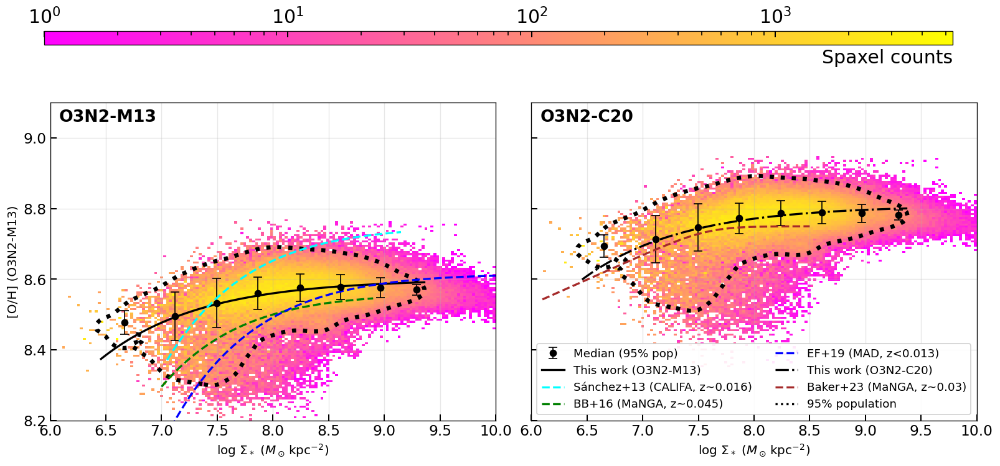


COMPLETED: Two-panel rMZR comparison (O3N2-M13 vs O3N2-C20)
Output PNG: Plot_Paper_1/MAUVE_MUSE_rMZR_O3N2M13_vs_C20_counts_EW.png
Output PDF: Plot_Paper_1/MAUVE_MUSE_rMZR_O3N2M13_vs_C20_counts_EW.pdf
Galaxies included: IC3392, NGC4064, NGC4189, NGC4192, NGC4254, NGC4293, NGC4294, NGC4298, NGC4302, NGC4330, NGC4351, NGC4388, NGC4394, NGC4396, NGC4402, NGC4405, NGC4419, NGC4450, NGC4457, NGC4501, NGC4522, NGC4567_8, NGC4569, NGC4580, NGC4606, NGC4607, NGC4694, NGC4698
Excluded: NGC4383

Final sample:
  Number of common HII spaxels: 1906345
  EW(Ha) cut: > 6 Å


In [24]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------
    # rMZR comparison: O3N2-M13 vs O3N2-C20 (HII only)
    #
    # Two-panel layout:
    #   Left : rMZR 2D histogram (O3N2-M13) with literature curves
    #   Right: rMZR 2D histogram (O3N2-C20) with Baker+23 curve
    #
    # Important fix:
    #   M13 and C20 are now selected with the SAME common spaxel mask:
    #       finite(logSigmaM) &
    #       finite(O/H_M13) &
    #       finite(O/H_C20) &
    #       finite(EW_Ha) &
    #       EW_Ha > EW_MIN
    #
    # This guarantees:
    #       logSigmaM[i], O/H_M13[i], O/H_C20[i]
    #   are from the same physical spaxel.
    # ------------------------------------------------------------------

    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.colors import LogNorm
    from matplotlib.lines import Line2D
    from pathlib import Path
    from astropy.io import fits

    import scipy.ndimage as ndimage
    from scipy.optimize import curve_fit


    # ------------------------------------------------------------------
    # Config
    # ------------------------------------------------------------------

    EW_FILE_SUFFIX = "_proxy_EW_maps.fits"
    EW_HDU = "PROXY_EWHA"
    EW_MIN = 6.0

    EXCLUDED_GALAXIES = {"NGC4383"}

    OUTDIR = Path("Plot_Paper_1")
    OUTDIR.mkdir(parents=True, exist_ok=True)

    OUTPNG = OUTDIR / "MAUVE_MUSE_rMZR_O3N2M13_vs_C20_counts_EW.png"
    OUTPDF = OUTDIR / "MAUVE_MUSE_rMZR_O3N2M13_vs_C20_counts_EW.pdf"

    COMMON_YLIM = (8.2, 9.1)
    XRANGE_RMZR = (6.0, 10.0)

    NBINS_HIST = 150
    NBINS_DENSITY = 100
    DENSITY_SIGMA = 2.0

    BIN_WIDTH = 0.4
    MIN_PIXELS_PER_BIN = 20


    # ------------------------------------------------------------------
    # Helper functions
    # ------------------------------------------------------------------

    def require_hdu(hdul, hdu_name, filename):
        """Raise a clear error if a required HDU is missing."""
        if hdu_name not in hdul:
            raise KeyError(f"Missing HDU '{hdu_name}' in {filename}")
        return hdul[hdu_name].data


    def load_maps(gal):
        """Load stellar mass surface density and both O3N2 metallicity maps."""
        bin_file = further_spatial_path(gal)
        gas_file = further_gas_path(gal)
        ew_file = further_ew_path(gal, EW_FILE_SUFFIX)

        if not bin_file.exists():
            raise FileNotFoundError(f"Missing file: {bin_file}")
        if not gas_file.exists():
            raise FileNotFoundError(f"Missing file: {gas_file}")
        if not ew_file.exists():
            raise FileNotFoundError(f"Missing file: {ew_file}")

        with fits.open(bin_file) as h:
            logSigmaM = require_hdu(h, "LOGMASS_SURFACE_DENSITY", bin_file)

        with fits.open(gas_file) as h:
            oh_o3n2_m13 = require_hdu(h, "O_H_O3N2_M13_HII", gas_file)
            oh_o3n2_c20 = require_hdu(h, "O_H_O3N2_C20_HII", gas_file)

        with fits.open(ew_file) as h:
            ew_ha = require_hdu(h, EW_HDU, ew_file)
        ew_ha = align_map_to_shape(ew_ha, oh_o3n2_m13.shape, label=f"{gal} {EW_HDU}")

        return logSigmaM, oh_o3n2_m13, oh_o3n2_c20, ew_ha


    def calculate_binned_stats(x_data, y_data, bin_width=0.4, min_pixels=20):
        """
        Calculate median and standard deviation in x bins.

        Keeps only bins with at least min_pixels finite y-values.
        """
        finite = np.isfinite(x_data) & np.isfinite(y_data)
        x_data = np.asarray(x_data)[finite]
        y_data = np.asarray(y_data)[finite]

        if len(x_data) == 0:
            return (
                np.array([]),
                np.array([]),
                np.array([]),
                np.array([]),
                np.array([]),
            )

        x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
        bin_edges = np.arange(x_min, x_max + bin_width, bin_width)

        medians = []
        stds = []
        counts = []
        valid_centers = []
        valid_bin_indices = []

        for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
            in_bin = (x_data >= bin_start) & (x_data < bin_end)

            x_in_bin = x_data[in_bin]
            y_in_bin = y_data[in_bin]

            if np.sum(np.isfinite(y_in_bin)) >= min_pixels:
                valid_centers.append(np.nanmedian(x_in_bin))
                medians.append(np.nanmedian(y_in_bin))
                stds.append(np.nanstd(y_in_bin))
                counts.append(np.sum(np.isfinite(y_in_bin)))
                valid_bin_indices.append(i)

        return (
            np.asarray(valid_centers),
            np.asarray(medians),
            np.asarray(stds),
            np.asarray(counts),
            np.asarray(valid_bin_indices),
        )


    def mzr_model(x, a, b, c):
        """Sánchez-style rMZR functional form."""
        return a + b * (x - c) * np.exp(-(x - c))


    def compute_density_mask(
        x_vals,
        y_vals,
        x_range,
        y_range,
        nbins=100,
        sigma=2.0,
        return_contour=False,
    ):
        """
        Return mask for points inside the 95% density contour.

        The density is estimated from a smoothed 2D histogram in the requested range.
        """
        x_vals = np.asarray(x_vals)
        y_vals = np.asarray(y_vals)

        mask_finite = np.isfinite(x_vals) & np.isfinite(y_vals)

        empty_mask = np.zeros_like(x_vals, dtype=bool)

        if not np.any(mask_finite):
            if return_contour:
                return empty_mask, None, None
            return empty_mask

        x = x_vals[mask_finite]
        y = y_vals[mask_finite]

        H, xedges, yedges = np.histogram2d(
            x,
            y,
            bins=nbins,
            range=[x_range, y_range],
        )

        if np.sum(H) <= 0:
            if return_contour:
                return empty_mask, None, None
            return empty_mask

        H_smooth = ndimage.gaussian_filter(H, sigma=sigma)

        H_flat = np.sort(H_smooth.ravel())[::-1]
        H_cumsum = np.cumsum(H_flat)

        if H_cumsum[-1] <= 0:
            if return_contour:
                return empty_mask, None, None
            return empty_mask

        level_idx = np.searchsorted(H_cumsum, 0.95 * H_cumsum[-1])
        level_idx = min(level_idx, len(H_flat) - 1)
        level_95 = H_flat[level_idx]

        x_centers = 0.5 * (xedges[:-1] + xedges[1:])
        y_centers = 0.5 * (yedges[:-1] + yedges[1:])

        X, Y = np.meshgrid(x_centers, y_centers)

        dx = (x_range[1] - x_range[0]) / nbins
        dy = (y_range[1] - y_range[0]) / nbins

        x_idx = (x - x_range[0]) / dx - 0.5
        y_idx = (y - y_range[0]) / dy - 0.5

        densities = ndimage.map_coordinates(
            H_smooth,
            [x_idx, y_idx],
            order=1,
            mode="constant",
            cval=0.0,
        )

        mask_local = densities >= level_95

        full_mask = np.zeros_like(x_vals, dtype=bool)
        full_mask[np.where(mask_finite)[0]] = mask_local

        if return_contour:
            return full_mask, level_95, (X, Y, H_smooth)

        return full_mask


    def plot_literature_mzr_fits(ax, show_legend=True):
        """Overlay literature rMZR curves: Sánchez+13, Barrera-Ballesteros+16, Erroz-Ferrer+19."""
        plot_data = []

        x_sanchez = np.linspace(7.05, 9.15, 200)
        a5, b5, c5 = 8.74, 0.013, 9.50
        y_sanchez13 = a5 + b5 * (x_sanchez - c5) * np.exp(-(x_sanchez - c5))
        plot_data.append(
            (
                x_sanchez,
                y_sanchez13,
                "Sánchez+13 (CALIFA, z~0.016)",
                "--",
                "cyan",
            )
        )

        x_bb = np.linspace(7.0, 8.9, 200)
        a2, b2, c2 = 8.55, 0.014, 9.14
        y_bb16 = a2 + b2 * (x_bb - c2) * np.exp(-(x_bb - c2))
        plot_data.append(
            (
                x_bb,
                y_bb16,
                "BB+16 (MaNGA, z~0.045)",
                "--",
                "green",
            )
        )

        x_ef = np.linspace(6.5, 10.0, 200)
        a4, b4, c4 = 8.61, 0.008, 10.0
        y_ef19 = a4 + b4 * (x_ef - c4) * np.exp(-(x_ef - c4))
        plot_data.append(
            (
                x_ef,
                y_ef19,
                "EF+19 (MAD, z<0.013)",
                "--",
                "blue",
            )
        )

        handles = []

        for x, y, label, linestyle, color in plot_data:
            line, = ax.plot(
                x,
                y,
                label=label if show_legend else None,
                linewidth=2,
                linestyle=linestyle,
                color=color,
            )
            handles.append(line)

        return handles


    def plot_literature_baker(ax, show_legend=True):
        """Overlay Baker+23 collapsed rFMR curve."""
        x_baker = np.linspace(6.1, 8.5, 200)

        logSigmaSFR_ref = -2.0

        Z0_B = 8.75
        gamma_B = 0.14
        phi_B = 2.73
        m0_B = 8.58
        m1_B = 0.50

        logM0_B = m0_B + m1_B * logSigmaSFR_ref
        M0_B = 10.0 ** logM0_B
        Sigma_star_B = 10.0 ** x_baker

        y_baker23 = Z0_B - (gamma_B / phi_B) * np.log10(
            1.0 + (Sigma_star_B / M0_B) ** (-phi_B)
        )

        line, = ax.plot(
            x_baker,
            y_baker23,
            label="Baker+23 (MaNGA, z~0.03)" if show_legend else None,
            linewidth=2,
            linestyle="--",
            color="brown",
        )

        return [line]


    def safe_fit_and_plot(ax, x, y, linestyle, label):
        """Fit mzr_model to x/y and plot the result."""
        finite = np.isfinite(x) & np.isfinite(y)
        x_fit_data = np.asarray(x)[finite]
        y_fit_data = np.asarray(y)[finite]

        if len(x_fit_data) < 10:
            print(f"{label}: not enough points for fitting.")
            return None, None, None, None

        p0 = [8.5, 0.0002, 12.5]
        bounds = ([8.0, 0.0, 10.0], [9.0, 0.1, 15.0])

        try:
            popt, pcov = curve_fit(
                mzr_model,
                x_fit_data,
                y_fit_data,
                p0=p0,
                bounds=bounds,
                maxfev=5000,
            )

            x_model = np.linspace(np.nanmin(x_fit_data), np.nanmax(x_fit_data), 150)
            y_model = mzr_model(x_model, *popt)

            line, = ax.plot(
                x_model,
                y_model,
                linestyle,
                linewidth=2,
                color="k",
                label=label,
            )

            perr = np.sqrt(np.diag(pcov))

            print(
                f"{label}: "
                f"a={popt[0]:.3f} ± {perr[0]:.3f}, "
                f"b={popt[1]:.5f} ± {perr[1]:.5f}, "
                f"c={popt[2]:.3f} ± {perr[2]:.3f}"
            )

            return line, popt, pcov, (x_model, y_model)

        except Exception as e:
            print(f"{label} fit failed: {e}")
            return None, None, None, None


    # ------------------------------------------------------------------
    # Collect data
    # ------------------------------------------------------------------

    galaxies = physics_ready_galaxies(require_ew=True)

    included_galaxies = []

    all_logSigmaM_HII = []
    all_oh_o3n2_m13_HII = []
    all_oh_o3n2_c20_HII = []

    print("=" * 80)
    print("Collecting common HII spaxels for O3N2-M13 and O3N2-C20...")
    print("=" * 80)

    for gal in galaxies:
        if gal in EXCLUDED_GALAXIES:
            print(f"  {gal}: excluded from analysis")
            continue

        try:
            logSigmaM, oh_o3n2_m13, oh_o3n2_c20, ew_ha = load_maps(gal)
        except Exception as e:
            print(f"  {gal}: skipped - {e}")
            continue

        shapes = {
            "logSigmaM": logSigmaM.shape,
            "O3N2-M13": oh_o3n2_m13.shape,
            "O3N2-C20": oh_o3n2_c20.shape,
            "EW(Ha)": ew_ha.shape,
        }

        if len(set(shapes.values())) != 1:
            print(f"  {gal}: skipped - shape mismatch: {shapes}")
            continue

        common_mask = (
            np.isfinite(logSigmaM)
            & np.isfinite(oh_o3n2_m13)
            & np.isfinite(oh_o3n2_c20)
            & np.isfinite(ew_ha)
            & (ew_ha > EW_MIN)
        )

        n_common = int(np.sum(common_mask))

        print(f"  {gal}: common HII pixels with EW(Ha)>{EW_MIN:g} Å = {n_common}")

        if n_common == 0:
            continue

        included_galaxies.append(gal)

        all_logSigmaM_HII.extend(logSigmaM[common_mask].ravel())
        all_oh_o3n2_m13_HII.extend(oh_o3n2_m13[common_mask].ravel())
        all_oh_o3n2_c20_HII.extend(oh_o3n2_c20[common_mask].ravel())


    all_logSigmaM_HII = np.asarray(all_logSigmaM_HII)
    all_oh_o3n2_m13_HII = np.asarray(all_oh_o3n2_m13_HII)
    all_oh_o3n2_c20_HII = np.asarray(all_oh_o3n2_c20_HII)

    print("\n" + "-" * 80)
    print("Final array lengths:")
    print(f"  logSigmaM   : {len(all_logSigmaM_HII)}")
    print(f"  O3N2-M13    : {len(all_oh_o3n2_m13_HII)}")
    print(f"  O3N2-C20    : {len(all_oh_o3n2_c20_HII)}")
    print("-" * 80)

    assert len(all_logSigmaM_HII) == len(all_oh_o3n2_m13_HII)
    assert len(all_logSigmaM_HII) == len(all_oh_o3n2_c20_HII)

    if len(all_logSigmaM_HII) == 0:
        raise RuntimeError("No common HII spaxels found. Check EW files, HDU names, and input maps.")


    # ------------------------------------------------------------------
    # Plot setup
    # ------------------------------------------------------------------

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(16, 6),
        sharex=True,
        sharey=True,
    )

    plt.subplots_adjust(wspace=0.08, top=0.82)

    ax_left, ax_right = axes


    # ------------------------------------------------------------------
    # Left panel: O3N2-M13
    # ------------------------------------------------------------------

    print("\n--- Left panel: O3N2-M13 rMZR ---")

    mask_m13 = np.isfinite(all_logSigmaM_HII) & np.isfinite(all_oh_o3n2_m13_HII)

    hist_m13, xedges_m13, yedges_m13 = np.histogram2d(
        all_logSigmaM_HII[mask_m13],
        all_oh_o3n2_m13_HII[mask_m13],
        bins=NBINS_HIST,
        range=[XRANGE_RMZR, COMMON_YLIM],
    )

    mask_95_m13, level_95_m13, contour_data_m13 = compute_density_mask(
        all_logSigmaM_HII,
        all_oh_o3n2_m13_HII,
        XRANGE_RMZR,
        COMMON_YLIM,
        nbins=NBINS_DENSITY,
        sigma=DENSITY_SIGMA,
        return_contour=True,
    )

    img_m13 = ax_left.pcolormesh(
        xedges_m13,
        yedges_m13,
        np.ma.masked_where(hist_m13.T == 0, hist_m13.T),
        cmap="spring",
        norm=LogNorm(vmin=1),
        shading="auto",
    )

    if contour_data_m13 is not None and level_95_m13 is not None and level_95_m13 > 0:
        ax_left.contour(
            contour_data_m13[0],
            contour_data_m13[1],
            contour_data_m13[2].T,
            levels=[level_95_m13],
            colors="k",
            linewidths=4,
            linestyles=":",
        )

    mass_centers_m13, medians_m13, stds_m13, counts_m13, _ = calculate_binned_stats(
        all_logSigmaM_HII[mask_95_m13],
        all_oh_o3n2_m13_HII[mask_95_m13],
        bin_width=BIN_WIDTH,
        min_pixels=MIN_PIXELS_PER_BIN,
    )

    median_left = None

    if len(mass_centers_m13) >= 3:
        median_left = ax_left.errorbar(
            mass_centers_m13,
            medians_m13,
            yerr=stds_m13,
            fmt="o",
            color="k",
            markersize=6,
            linewidth=1,
            capsize=4,
            label="Median (95% pop)",
        )

    fit_line_left, popt_m13, pcov_m13, fit_data_m13 = safe_fit_and_plot(
        ax_left,
        all_logSigmaM_HII[mask_95_m13],
        all_oh_o3n2_m13_HII[mask_95_m13],
        "-",
        "This work (O3N2-M13)",
    )

    lit_handles_left = plot_literature_mzr_fits(ax_left, show_legend=True)

    ax_left.set_ylabel("[O/H] (O3N2-M13)", fontsize=12)
    ax_left.set_xlabel(r"$\log\,\Sigma_* \ (M_\odot\,\mathrm{kpc}^{-2})$", fontsize=12)
    ax_left.set_xlim(*XRANGE_RMZR)
    ax_left.set_ylim(*COMMON_YLIM)
    ax_left.grid(True, alpha=0.3)

    ax_left.text(
        0.02,
        0.98,
        "O3N2-M13",
        transform=ax_left.transAxes,
        ha="left",
        va="top",
        fontsize=16,
        fontweight="bold",
    )


    # ------------------------------------------------------------------
    # Right panel: O3N2-C20
    # ------------------------------------------------------------------

    print("\n--- Right panel: O3N2-C20 rMZR ---")

    mask_c20 = np.isfinite(all_logSigmaM_HII) & np.isfinite(all_oh_o3n2_c20_HII)

    hist_c20, xedges_c20, yedges_c20 = np.histogram2d(
        all_logSigmaM_HII[mask_c20],
        all_oh_o3n2_c20_HII[mask_c20],
        bins=NBINS_HIST,
        range=[XRANGE_RMZR, COMMON_YLIM],
    )

    mask_95_c20, level_95_c20, contour_data_c20 = compute_density_mask(
        all_logSigmaM_HII,
        all_oh_o3n2_c20_HII,
        XRANGE_RMZR,
        COMMON_YLIM,
        nbins=NBINS_DENSITY,
        sigma=DENSITY_SIGMA,
        return_contour=True,
    )

    img_c20 = ax_right.pcolormesh(
        xedges_c20,
        yedges_c20,
        np.ma.masked_where(hist_c20.T == 0, hist_c20.T),
        cmap="spring",
        norm=LogNorm(vmin=1),
        shading="auto",
    )

    if contour_data_c20 is not None and level_95_c20 is not None and level_95_c20 > 0:
        ax_right.contour(
            contour_data_c20[0],
            contour_data_c20[1],
            contour_data_c20[2].T,
            levels=[level_95_c20],
            colors="k",
            linewidths=4,
            linestyles=":",
        )

    mass_centers_c20, medians_c20, stds_c20, counts_c20, _ = calculate_binned_stats(
        all_logSigmaM_HII[mask_95_c20],
        all_oh_o3n2_c20_HII[mask_95_c20],
        bin_width=BIN_WIDTH,
        min_pixels=MIN_PIXELS_PER_BIN,
    )

    median_right = None

    if len(mass_centers_c20) >= 3:
        median_right = ax_right.errorbar(
            mass_centers_c20,
            medians_c20,
            yerr=stds_c20,
            fmt="o",
            color="k",
            markersize=6,
            linewidth=1,
            capsize=4,
            label=None,
        )

    fit_line_right, popt_c20, pcov_c20, fit_data_c20 = safe_fit_and_plot(
        ax_right,
        all_logSigmaM_HII[mask_95_c20],
        all_oh_o3n2_c20_HII[mask_95_c20],
        "-.",
        "This work (O3N2-C20)",
    )

    baker_handles = plot_literature_baker(ax_right, show_legend=True)

    ax_right.set_xlabel(r"$\log\,\Sigma_* \ (M_\odot\,\mathrm{kpc}^{-2})$", fontsize=12)
    ax_right.set_xlim(*XRANGE_RMZR)
    ax_right.set_ylim(*COMMON_YLIM)
    ax_right.grid(True, alpha=0.3)

    ax_right.text(
        0.02,
        0.98,
        "O3N2-C20",
        transform=ax_right.transAxes,
        ha="left",
        va="top",
        fontsize=16,
        fontweight="bold",
    )


    # ------------------------------------------------------------------
    # Optional: show both fitted curves on both panels
    # ------------------------------------------------------------------
    # Uncomment this block if you want direct visual comparison of the two fitted curves
    # on both panels.
    #
    # if fit_data_m13 is not None:
    #     x_fit_m13, y_fit_m13 = fit_data_m13
    #     ax_right.plot(
    #         x_fit_m13,
    #         y_fit_m13,
    #         "-",
    #         color="k",
    #         linewidth=2,
    #         alpha=0.6,
    #         label=None,
    #     )
    #
    # if fit_data_c20 is not None:
    #     x_fit_c20, y_fit_c20 = fit_data_c20
    #     ax_left.plot(
    #         x_fit_c20,
    #         y_fit_c20,
    #         "-.",
    #         color="k",
    #         linewidth=2,
    #         alpha=0.6,
    #         label=None,
    #     )


    # ------------------------------------------------------------------
    # Consolidated legend
    # ------------------------------------------------------------------

    contour_handle = Line2D(
        [0],
        [0],
        color="k",
        linestyle=":",
        linewidth=2,
        label="95% population",
    )

    legend_handles = []
    legend_labels = []

    if median_left is not None:
        legend_handles.append(median_left)
        legend_labels.append("Median (95% pop)")

    if fit_line_left is not None:
        legend_handles.append(fit_line_left)
        legend_labels.append(fit_line_left.get_label())

    for h in lit_handles_left:
        legend_handles.append(h)
        legend_labels.append(h.get_label())

    if fit_line_right is not None:
        legend_handles.append(fit_line_right)
        legend_labels.append(fit_line_right.get_label())

    for h in baker_handles:
        legend_handles.append(h)
        legend_labels.append(h.get_label())

    legend_handles.append(contour_handle)
    legend_labels.append(contour_handle.get_label())

    ax_right.legend(
        legend_handles,
        legend_labels,
        loc="lower right",
        fontsize=11,
        framealpha=0.9,
        ncol=2,
    )


    # ------------------------------------------------------------------
    # Shared log-scale colorbar
    # ------------------------------------------------------------------

    vmax_shared = np.nanmax([hist_m13.max(), hist_c20.max()])

    if np.isfinite(vmax_shared) and vmax_shared > 0:
        norm = LogNorm(vmin=1, vmax=vmax_shared)

        img_m13.set_norm(norm)
        img_c20.set_norm(norm)

        cax = fig.add_axes([0.12, 0.95, 0.76, 0.03])
        cbar = fig.colorbar(img_m13, cax=cax, orientation="horizontal")

        cax.xaxis.set_ticks_position("top")
        cax.xaxis.set_label_position("bottom")

        cbar.set_label("Spaxel counts", fontsize=18, loc="right")
        cbar.ax.tick_params(labelsize=18)


    # ------------------------------------------------------------------
    # Save and show
    # ------------------------------------------------------------------

    # plt.savefig(OUTPNG, dpi=600, bbox_inches="tight")
    # plt.savefig(OUTPDF, bbox_inches="tight")
    plt.show()


    # ------------------------------------------------------------------
    # Summary
    # ------------------------------------------------------------------

    print("\n" + "=" * 80)
    print("COMPLETED: Two-panel rMZR comparison (O3N2-M13 vs O3N2-C20)")
    print("=" * 80)

    print(f"Output PNG: {OUTPNG}")
    print(f"Output PDF: {OUTPDF}")

    print(f"Galaxies included: {', '.join(included_galaxies)}")
    print(f"Excluded: {', '.join(sorted(EXCLUDED_GALAXIES))}")

    print("\nFinal sample:")
    print(f"  Number of common HII spaxels: {len(all_logSigmaM_HII)}")
    print(f"  EW(Ha) cut: > {EW_MIN:g} Å")
    print("=" * 80)
else:
    print("Skipped copied previous-project analysis cell 13: no nested *_further mass/SFR/OH+EW products are ready yet.")


In [25]:
# # ------------------------------------------------------------------
# # Combined Analysis: rMZR and Z_gas-Σ_SFR relation - HII regions only
# # Using O3N2-M13 indicator only
# # 2x2 subplot layout:
# #   Top-left: rMZR scatter
# #   Top-right: Z_gas-Σ_SFR scatter
# #   Bottom-left: rMZR median trends
# #   Bottom-right: Z_gas-Σ_SFR median trends
# # ------------------------------------------------------------------
# import numpy as np
# import matplotlib.pyplot as plt
# from pathlib import Path
# from astropy.io import fits
# import scipy.stats as stats
# import scipy.ndimage as ndimage
# from scipy.optimize import curve_fit

# def load_maps_o3n2_m13(gal):
#     """Load O3N2-M13 metallicity calibration for HII regions"""
#     with fits.open(further_spatial_path(gal)) as h:
#         sigM = h['LOGMASS_SURFACE_DENSITY'].data
#     with fits.open(further_gas_path(gal)) as h:
#         sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
#         oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
#     return (sigM, sigSFR_HII, oh_o3n2_m13_HII)

# def calculate_binned_stats(x_data, y_data, bin_width=0.4, min_pixels=20):
#     """Calculate median and std in bins - only keep bins with >= min_pixels unique datapoints"""
#     x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
#     bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
#     bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
#     medians, stds, counts, valid_centers, valid_bin_indices = [], [], [], [], []
#     for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
#         in_bin = (x_data >= bin_start) & (x_data < bin_end)
#         y_in_bin = y_data[in_bin]
#         if len(np.unique(y_in_bin)) >= min_pixels:
#             medians.append(np.median(y_in_bin))
#             stds.append(np.std(y_in_bin))
#             counts.append(len(y_in_bin))
#             valid_centers.append(bin_centers[i])
#             valid_bin_indices.append(i)
#     return (np.array(valid_centers), np.array(medians), np.array(stds), np.array(counts), np.array(valid_bin_indices))

# def mzr_model(x, a, b, c):
#     return a + b * (x - c) * np.exp(-(x - c))

# def compute_density_mask(x_vals, y_vals, x_range, y_range, nbins=100, sigma=2.0, return_contour=False):
#     """Return mask for points inside the 95% density contour within given ranges."""
#     mask_finite = np.isfinite(x_vals) & np.isfinite(y_vals)
#     if not np.any(mask_finite):
#         empty_mask = np.zeros_like(x_vals, dtype=bool)
#         return (empty_mask, None, None) if return_contour else empty_mask
#     x = x_vals[mask_finite]
#     y = y_vals[mask_finite]
#     H, xedges, yedges = np.histogram2d(x, y, bins=nbins, range=[x_range, y_range])
#     H_smooth = ndimage.gaussian_filter(H, sigma=sigma)
#     H_flat = np.sort(H_smooth.ravel())[::-1]
#     H_cumsum = np.cumsum(H_flat)
#     level_idx = np.searchsorted(H_cumsum, 0.95 * H_cumsum[-1])
#     level_95 = H_flat[level_idx]
#     x_centers = (xedges[:-1] + xedges[1:]) / 2
#     y_centers = (yedges[:-1] + yedges[1:]) / 2
#     X, Y = np.meshgrid(x_centers, y_centers)
#     dx = (x_range[1] - x_range[0]) / nbins
#     dy = (y_range[1] - y_range[0]) / nbins
#     x_idx = (x - x_range[0]) / dx - 0.5
#     y_idx = (y - y_range[0]) / dy - 0.5
#     densities = ndimage.map_coordinates(H_smooth, [x_idx, y_idx], order=1, mode='constant', cval=0.0)
#     mask_local = densities >= level_95
#     full_mask = np.zeros_like(x_vals, dtype=bool)
#     full_mask[np.where(mask_finite)[0]] = mask_local
#     if return_contour:
#         return full_mask, level_95, (X, Y, H_smooth)
#     return full_mask

# def plot_literature_mzr_fits(ax, show_legend=True):
#     plot_data = []
#     x_sanchez = np.linspace(7.05, 9.15, 200)
#     a5, b5, c5 = 8.74, 0.013, 9.50
#     y_sanchez13 = a5 + b5 * (x_sanchez - c5) * np.exp(-(x_sanchez - c5))
#     plot_data.append((x_sanchez, y_sanchez13, 'Sánchez+13', ':', 'olive'))
#     x_bb = np.linspace(7., 8.9, 200)
#     a2, b2, c2 = 8.55, 0.014, 9.14
#     y_bb16 = a2 + b2 * (x_bb - c2) * np.exp(-(x_bb - c2))
#     plot_data.append((x_bb, y_bb16, 'Barrera-Ballesteros+16', '--', 'brown'))
#     x_ef = np.linspace(6.5, 10.0, 200)
#     a4, b4, c4 = 8.61, 0.008, 10.0
#     y_ef17 = a4 + b4 * (x_ef - c4) * np.exp(-(x_ef - c4))
#     plot_data.append((x_ef, y_ef17, 'Erroz-Ferrer+17', '-.', 'pink'))
#     for x, y, label, linestyle, color in plot_data:
#         ax.plot(x, y, label=label if show_legend else None, linewidth=2, linestyle=linestyle, color=color)

# bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
# galaxies = [f.name.split('_')[0] for f in bins]
# excluded_galaxies = {'NGC4383'}
# included_galaxies = []
# all_logSigmaM_HII = []
# all_logSigmaSFR_HII = []
# all_oh_o3n2_m13_HII = []

# print("="*80)
# print("STEP 1: Collecting data from all galaxies for HII regions (O3N2-M13 only)...")
# print("="*80)

# for gal in galaxies:
#     if gal in excluded_galaxies:
#         print(f"  {gal}: excluded from analysis")
#         continue
#     bin_file = further_spatial_path(gal)
#     gas_file = further_gas_path(gal)
#     if bin_file.exists() and gas_file.exists():
#         included_galaxies.append(gal)
#         (logSigmaM, logSigmaSFR_HII, oh_o3n2_m13_HII) = load_maps_o3n2_m13(gal)
#         common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & np.isfinite(oh_o3n2_m13_HII))
#         print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
#         all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
#         all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
#         all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
#     else:
#         print(f"  {gal}: Data files not found")

# all_logSigmaM_HII = np.array(all_logSigmaM_HII)
# all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
# all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)
# print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")

# print("\n" + "="*80)
# print("STEP 2: Defining 8 SFR bins for rMZR")
# print("="*80)
# n_bins = 8
# sfr_bin_edges = [-np.inf, -3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5, np.inf]
# bin_labels = ['<-3.5', '-3.5–-3.0', '-3.0–-2.5', '-2.5–-2.0', '-2.0–-1.5', '-1.5–-1.0', '-1.0–-0.5', '>-0.5']
# for i, label in enumerate(bin_labels):
#     print(f"  Bin {i+1}: {label}")
# colors_sfr = plt.cm.rainbow(np.linspace(0, 1, n_bins))

# print("\n" + "="*80)
# print("STEP 3: Defining 8 Σ_* bins for Z_gas-Σ_SFR")
# print("="*80)
# n_bins_sigmaM = 8
# sigmaM_bin_edges = [-np.inf, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, np.inf]
# bin_labels_sigmaM = ['<6.5', '6.5–7.0', '7.0–7.5', '7.5–8.0', '8.0–8.5', '8.5–9.0', '9.0–9.5', '>9.5']
# for i, label in enumerate(bin_labels_sigmaM):
#     print(f"  Bin {i+1}: {label}")
# colors_sigmaM = plt.cm.coolwarm(np.linspace(0.1, 0.9, n_bins_sigmaM))

# print("\n" + "="*80)
# print("STEP 4: Creating combined 2x2 plot (O3N2-M13 only)")
# print("="*80)
# common_ylim = (8.2, 8.9)
# x_range_rMZR = (6, 10)
# x_range_Zgas = (-5.0, 0.5)
# print(f"\nUsing uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

# fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharex='col', sharey='all')
# plt.subplots_adjust(wspace=0.05, hspace=0.05)
# oh_data_HII = all_oh_o3n2_m13_HII
# calib_name_HII = 'O3N2-M13'
# print(f"\nProcessing {calib_name_HII} calibration for HII regions:")
# print(f"  HII {calib_name_HII} range: {np.min(oh_data_HII):.3f} to {np.max(oh_data_HII):.3f}")
# ax_rMZR_scatter = axes[0, 0]
# ax_Zgas_scatter = axes[0, 1]
# ax_rMZR_median = axes[1, 0]
# ax_Zgas_median = axes[1, 1]

# print(f"\n--- Processing rMZR (8 Σ_SFR bins) ---")
# legend_handles_sfr, legend_labels_sfr = [], []
# valid_bins_rMZR = 0
# for i in range(n_bins):
#     in_bin_HII = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII < sfr_bin_edges[i + 1])
#     n_pixels_HII = np.sum(in_bin_HII)
#     if n_pixels_HII >= 10:
#         x_bin_all = all_logSigmaM_HII[in_bin_HII]
#         y_bin_all = oh_data_HII[in_bin_HII]
#         scatter_hii = ax_rMZR_scatter.scatter(x_bin_all, y_bin_all, c=[colors_sfr[i]], s=15, alpha=0.6, edgecolors='none', rasterized=True)
#         legend_handles_sfr.append(scatter_hii)
#         legend_labels_sfr.append(bin_labels[i])
#         mask_95_bin = compute_density_mask(x_bin_all, y_bin_all, x_range_rMZR, common_ylim)
#         x_bin = x_bin_all[mask_95_bin]
#         y_bin = y_bin_all[mask_95_bin]
#         if len(x_bin) >= 10:
#             mass_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(x_bin, y_bin, bin_width=0.4, min_pixels=20)
#             if len(mass_centers_HII) > 1:
#                 ax_rMZR_median.errorbar(mass_centers_HII, medians_HII, yerr=stds_HII, color=colors_sfr[i], marker='o', markersize=6, linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
#                 for j in range(len(valid_bin_indices_HII) - 1):
#                     current_bin_idx = valid_bin_indices_HII[j]
#                     next_bin_idx = valid_bin_indices_HII[j + 1]
#                     if next_bin_idx - current_bin_idx == 1:
#                         ax_rMZR_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], [medians_HII[j], medians_HII[j + 1]], color=colors_sfr[i], linewidth=2, alpha=0.8)
#                 valid_bins_rMZR += 1

# ax_rMZR_scatter.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
# ax_rMZR_scatter.grid(True, alpha=0.3)
# ax_rMZR_scatter.set_xlim(*x_range_rMZR)
# ax_rMZR_scatter.set_ylim(common_ylim)
# ax_rMZR_median.set_xlabel(r'$\log\,\Sigma_* \ (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax_rMZR_median.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
# ax_rMZR_median.grid(True, alpha=0.3)
# ax_rMZR_median.set_xlim(*x_range_rMZR)
# ax_rMZR_median.set_ylim(common_ylim)
# legend1 = ax_rMZR_median.legend(legend_handles_sfr, legend_labels_sfr, loc='upper center', ncol=4, fontsize=12, framealpha=0.9, title=r'$\log(\Sigma_\mathrm{SFR})$ bins', title_fontsize=12)
# ax_rMZR_median.add_artist(legend1)
# print(f"  rMZR valid bins: {valid_bins_rMZR}")

# print(f"\n--- Processing Z_gas-Σ_SFR (8 Σ_* bins) ---")
# legend_handles_sigmaM, legend_labels_sigmaM_display = [], []
# valid_bins_Zgas = 0
# for i in range(n_bins_sigmaM):
#     in_bin_HII = (all_logSigmaM_HII >= sigmaM_bin_edges[i]) & (all_logSigmaM_HII < sigmaM_bin_edges[i + 1])
#     n_pixels_HII = np.sum(in_bin_HII)
#     if n_pixels_HII >= 10:
#         x_bin_all = all_logSigmaSFR_HII[in_bin_HII]
#         y_bin_all = oh_data_HII[in_bin_HII]
#         scatter_hii = ax_Zgas_scatter.scatter(x_bin_all, y_bin_all, c=[colors_sigmaM[i]], s=15, alpha=0.6, edgecolors='none', rasterized=True)
#         legend_handles_sigmaM.append(scatter_hii)
#         mask_95_bin = compute_density_mask(x_bin_all, y_bin_all, x_range_Zgas, common_ylim)
#         x_bin = x_bin_all[mask_95_bin]
#         y_bin = y_bin_all[mask_95_bin]
#         spearman_text = "N/A"
#         if len(x_bin) > 1:
#             y_mean, y_std = np.nanmean(y_bin), np.nanstd(y_bin)
#             x_mean, x_std = np.nanmean(x_bin), np.nanstd(x_bin)
#             mask_clip = (np.abs(y_bin - y_mean) < 3 * y_std) & (np.abs(x_bin - x_mean) < 3 * x_std)
#             x_clipped = x_bin[mask_clip]
#             y_clipped = y_bin[mask_clip]
#             sfr_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(x_clipped, y_clipped, bin_width=0.4, min_pixels=20)
#             if len(sfr_centers_HII) > 1:
#                 if len(x_clipped) > 10:
#                     corr, _ = stats.spearmanr(x_clipped, y_clipped)
#                     spearman_text = f"{corr:.2f}"
#                 ax_Zgas_median.errorbar(sfr_centers_HII, medians_HII, yerr=stds_HII, color=colors_sigmaM[i], marker='o', markersize=6, linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
#                 for j in range(len(valid_bin_indices_HII) - 1):
#                     current_bin_idx = valid_bin_indices_HII[j]
#                     next_bin_idx = valid_bin_indices_HII[j + 1]
#                     if next_bin_idx - current_bin_idx == 1:
#                         ax_Zgas_median.plot([sfr_centers_HII[j], sfr_centers_HII[j + 1]], [medians_HII[j], medians_HII[j + 1]], color=colors_sigmaM[i], linewidth=2, alpha=0.8)
#                 valid_bins_Zgas += 1
# 

# ax_Zgas_scatter.grid(True, alpha=0.3)
# ax_Zgas_scatter.set_xlim(*x_range_Zgas)
# ax_Zgas_scatter.set_ylim(common_ylim)
# ax_Zgas_median.set_xlabel(r'$\log\,\Sigma_\mathrm{SFR} \ (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax_Zgas_median.grid(True, alpha=0.3)
# ax_Zgas_median.set_xlim(*x_range_Zgas)
# ax_Zgas_median.set_ylim(common_ylim)
# ax_Zgas_median.legend(legend_handles_sigmaM, legend_labels_sigmaM_display, loc='upper center', ncol=3, fontsize=12, framealpha=0.9, title=r'$\log(\Sigma_*)$ bins with Spearman coefficient', title_fontsize=12)
# print(f"  Z_gas-Σ_SFR valid bins: {valid_bins_Zgas}")

# plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13.png', dpi=600, bbox_inches='tight')
# plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13.pdf', bbox_inches='tight')
# plt.show()

# print("\n" + "="*80)
# print("COMPLETED: Combined rMZR and Z_gas-Σ_SFR analysis (O3N2-M13 only)")
# print("="*80)
# print(f"Successfully created 2x2 subplot figure showing HII regions from {len(included_galaxies)} galaxies")
# print(f"Galaxies included: {', '.join(included_galaxies)}")
# print(f"Excluded: {', '.join(sorted(excluded_galaxies))}")
# print("\nPanel summary:")
# print("  Top-left: rMZR scatter (8 Σ_SFR bins)")
# print("  Top-right: Z_gas-Σ_SFR scatter (8 Σ_* bins)")
# print("  Bottom-left: rMZR median trends (8 Σ_SFR bins)")
# print("  Bottom-right: Z_gas-Σ_SFR median trends (8 Σ_* bins)")
# print(f"  Shared y-range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")


STEP 1: Collecting data from all galaxies for HII regions (O3N2-M13 only)...
  IC3392: HII=13799 pixels
  NGC4064: HII=3165 pixels
  NGC4189: HII=79662 pixels
  NGC4192: HII=138187 pixels
  NGC4254: HII=631740 pixels
  NGC4293: HII=439 pixels
  NGC4294: HII=67102 pixels
  NGC4298: HII=142275 pixels
  NGC4302: HII=17835 pixels
  NGC4330: HII=34567 pixels
  NGC4351: HII=26367 pixels
  NGC4383: excluded from analysis
  NGC4388: HII=17173 pixels
  NGC4394: HII=17856 pixels
  NGC4396: HII=80672 pixels
  NGC4402: HII=35164 pixels
  NGC4405: HII=10135 pixels
  NGC4419 PROXY_EWHA: aligned shape (643, 628) -> (643, 629); overlap=(643, 628)
  NGC4419: HII=5606 pixels
  NGC4450: HII=11951 pixels
  NGC4457: HII=5610 pixels
  NGC4501: HII=248803 pixels
  NGC4522: HII=31713 pixels
  NGC4567_8: HII=184719 pixels
  NGC4569: HII=36618 pixels
  NGC4580: HII=14984 pixels
  NGC4606: HII=1091 pixels
  NGC4607: HII=13891 pixels
  NGC4694 PROXY_EWHA: aligned shape (440, 439) -> (441, 439); overlap=(440, 439)

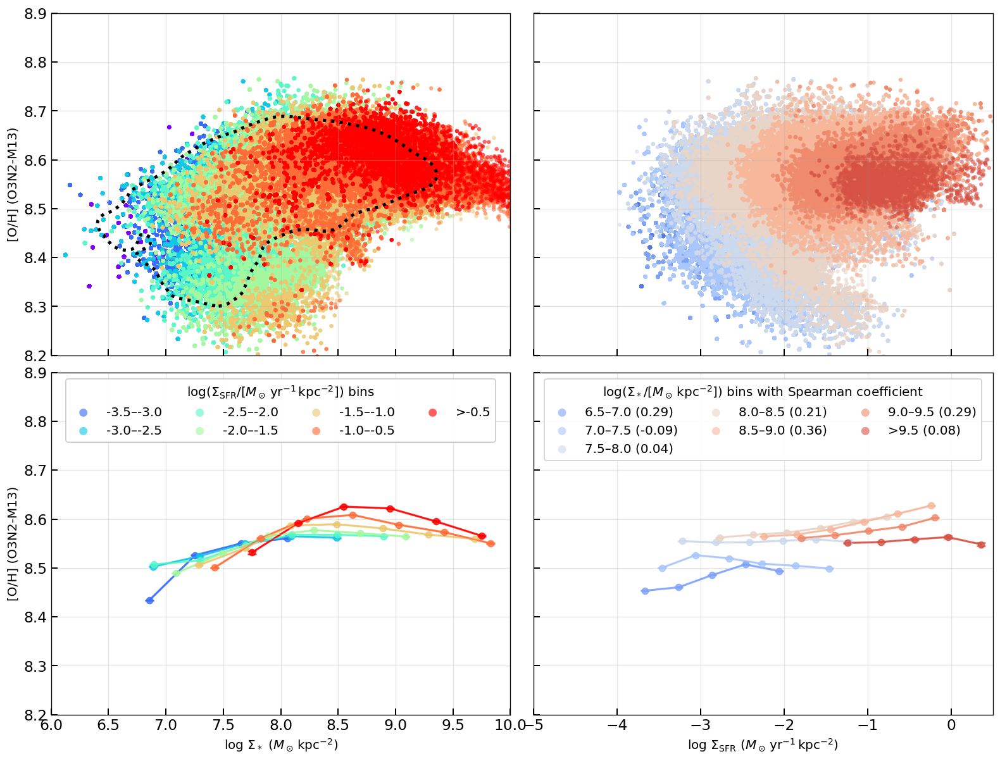


COMPLETED: Combined rMZR and Z_gas-Σ_SFR analysis (O3N2-M13 only)
Successfully created 2x2 subplot figure showing HII regions from 28 galaxies
Galaxies included: IC3392, NGC4064, NGC4189, NGC4192, NGC4254, NGC4293, NGC4294, NGC4298, NGC4302, NGC4330, NGC4351, NGC4388, NGC4394, NGC4396, NGC4402, NGC4405, NGC4419, NGC4450, NGC4457, NGC4501, NGC4522, NGC4567_8, NGC4569, NGC4580, NGC4606, NGC4607, NGC4694, NGC4698
Excluded: NGC4383

Panel summary:
  Top-left: rMZR scatter (8 Σ_SFR bins)
  Top-right: Z_gas-Σ_SFR scatter (8 Σ_* bins)
  Bottom-left: rMZR median trends (8 Σ_SFR bins)
  Bottom-right: Z_gas-Σ_SFR median trends (8 Σ_* bins)
  Shared y-range: 8.2 to 8.9


In [26]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------
    # Combined Analysis: rMZR and Z_gas-Σ_SFR relation - HII regions only
    # Using O3N2-M13 indicator only
    # 2x2 subplot layout:
    #   Top-left: rMZR scatter
    #   Top-right: Z_gas-Σ_SFR scatter
    #   Bottom-left: rMZR median trends
    #   Bottom-right: Z_gas-Σ_SFR median trends
    # ------------------------------------------------------------------
    import numpy as np
    import matplotlib.pyplot as plt
    from pathlib import Path
    from astropy.io import fits

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    EW_MIN = 6.0

    import scipy.stats as stats
    import scipy.ndimage as ndimage
    from scipy.optimize import curve_fit

    def load_maps_o3n2_m13(gal):
        """Load O3N2-M13 metallicity calibration for HII regions"""
        with fits.open(further_spatial_path(gal)) as h:
            sigM = h['LOGMASS_SURFACE_DENSITY'].data
        with fits.open(further_gas_path(gal)) as h:
            sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
            ha_sigma_obs = h['HA6562_SIGMA'].data
            ha_sigma_corr = h['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h else None
            if ha_sigma_corr is None:
                raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gal}_gas_BIN_maps_extended.fits')
            if ha_sigma_corr.shape != ha_sigma_obs.shape:
                raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {ha_sigma_corr.shape} vs SIGMA {ha_sigma_obs.shape}')
            sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
            ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
            sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
            ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
            oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
        with fits.open(further_ew_path(gal, EW_FILE_SUFFIX)) as h_ew:
            if EW_HDU not in h_ew:
                raise KeyError(f'Missing {EW_HDU} in {gal}{EW_FILE_SUFFIX}')
            ew_ha = h_ew[EW_HDU].data
        ew_ha = align_map_to_shape(ew_ha, sigSFR_HII.shape, label=f"{gal} {EW_HDU}")
        ew_mask = np.isfinite(ew_ha) & (ew_ha > EW_MIN)
        ew_mask = ew_mask & np.isfinite(ha_sigma) & (ha_sigma < 45.0)
        sigSFR_HII = np.where(ew_mask, sigSFR_HII, np.nan)
        oh_o3n2_m13_HII = np.where(ew_mask, oh_o3n2_m13_HII, np.nan)
        return (sigM, sigSFR_HII, oh_o3n2_m13_HII)

    def calculate_binned_stats(x_data, y_data, bin_width=0.4, min_pixels=20):
        """Calculate median and std in bins - only keep bins with >= min_pixels unique datapoints"""
        x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
        bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        medians, stds, counts, valid_centers, valid_bin_indices = [], [], [], [], []
        for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
            in_bin = (x_data >= bin_start) & (x_data < bin_end)
            y_in_bin = y_data[in_bin]
            if len(np.unique(y_in_bin)) >= min_pixels:
                medians.append(np.median(y_in_bin))
                stds.append(np.std(y_in_bin))
                counts.append(len(y_in_bin))
                valid_centers.append(bin_centers[i])
                valid_bin_indices.append(i)
        return (np.array(valid_centers), np.array(medians), np.array(stds), np.array(counts), np.array(valid_bin_indices))

    def mzr_model(x, a, b, c):
        return a + b * (x - c) * np.exp(-(x - c))

    def compute_density_mask(x_vals, y_vals, x_range, y_range, nbins=100, sigma=2.0, return_contour=False):
        """Return mask for points inside the 95% density contour within given ranges."""
        mask_finite = np.isfinite(x_vals) & np.isfinite(y_vals)
        if not np.any(mask_finite):
            empty_mask = np.zeros_like(x_vals, dtype=bool)
            return (empty_mask, None, None) if return_contour else empty_mask
        x = x_vals[mask_finite]
        y = y_vals[mask_finite]
        H, xedges, yedges = np.histogram2d(x, y, bins=nbins, range=[x_range, y_range])
        H_smooth = ndimage.gaussian_filter(H, sigma=sigma)
        H_flat = np.sort(H_smooth.ravel())[::-1]
        H_cumsum = np.cumsum(H_flat)
        level_idx = np.searchsorted(H_cumsum, 0.95 * H_cumsum[-1])
        level_95 = H_flat[level_idx]
        x_centers = (xedges[:-1] + xedges[1:]) / 2
        y_centers = (yedges[:-1] + yedges[1:]) / 2
        X, Y = np.meshgrid(x_centers, y_centers)
        dx = (x_range[1] - x_range[0]) / nbins
        dy = (y_range[1] - y_range[0]) / nbins
        x_idx = (x - x_range[0]) / dx - 0.5
        y_idx = (y - y_range[0]) / dy - 0.5
        densities = ndimage.map_coordinates(H_smooth, [x_idx, y_idx], order=1, mode='constant', cval=0.0)
        mask_local = densities >= level_95
        full_mask = np.zeros_like(x_vals, dtype=bool)
        full_mask[np.where(mask_finite)[0]] = mask_local
        if return_contour:
            return full_mask, level_95, (X, Y, H_smooth)
        return full_mask

    def plot_literature_mzr_fits(ax, show_legend=True):
        plot_data = []
        x_sanchez = np.linspace(7.05, 9.15, 200)
        a5, b5, c5 = 8.74, 0.013, 9.50
        y_sanchez13 = a5 + b5 * (x_sanchez - c5) * np.exp(-(x_sanchez - c5))
        plot_data.append((x_sanchez, y_sanchez13, 'Sánchez+13', ':', 'olive'))
        x_bb = np.linspace(7., 8.9, 200)
        a2, b2, c2 = 8.55, 0.014, 9.14
        y_bb16 = a2 + b2 * (x_bb - c2) * np.exp(-(x_bb - c2))
        plot_data.append((x_bb, y_bb16, 'Barrera-Ballesteros+16', '--', 'brown'))
        x_ef = np.linspace(6.5, 10.0, 200)
        a4, b4, c4 = 8.61, 0.008, 10.0
        y_ef17 = a4 + b4 * (x_ef - c4) * np.exp(-(x_ef - c4))
        plot_data.append((x_ef, y_ef17, 'Erroz-Ferrer+17', '-.', 'pink'))
        for x, y, label, linestyle, color in plot_data:
            ax.plot(x, y, label=label if show_legend else None, linewidth=2, linestyle=linestyle, color=color)

    galaxies = physics_ready_galaxies(require_ew=True)
    excluded_galaxies = {'NGC4383'}
    included_galaxies = []
    all_logSigmaM_HII = []
    all_logSigmaSFR_HII = []
    all_oh_o3n2_m13_HII = []

    print("="*80)
    print("STEP 1: Collecting data from all galaxies for HII regions (O3N2-M13 only)...")
    print("="*80)

    for gal in galaxies:
        if gal in excluded_galaxies:
            print(f"  {gal}: excluded from analysis")
            continue
        bin_file = further_spatial_path(gal)
        gas_file = further_gas_path(gal)
        if bin_file.exists() and gas_file.exists():
            included_galaxies.append(gal)
            (logSigmaM, logSigmaSFR_HII, oh_o3n2_m13_HII) = load_maps_o3n2_m13(gal)
            common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & np.isfinite(oh_o3n2_m13_HII))
            print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
            all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
            all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
            all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
        else:
            print(f"  {gal}: Data files not found")

    all_logSigmaM_HII = np.array(all_logSigmaM_HII)
    all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
    all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)
    print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")

    print("\n" + "="*80)
    print("STEP 2: Defining 8 SFR bins for rMZR")
    print("="*80)
    n_bins = 8
    sfr_bin_edges = [-np.inf, -3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5, np.inf]
    bin_labels = ['<-3.5', '-3.5–-3.0', '-3.0–-2.5', '-2.5–-2.0', '-2.0–-1.5', '-1.5–-1.0', '-1.0–-0.5', '>-0.5']
    for i, label in enumerate(bin_labels):
        print(f"  Bin {i+1}: {label}")
    colors_sfr = plt.cm.rainbow(np.linspace(0, 1, n_bins))

    print("\n" + "="*80)
    print("STEP 3: Defining 8 Σ_* bins for Z_gas-Σ_SFR")
    print("="*80)
    n_bins_sigmaM = 8
    sigmaM_bin_edges = [-np.inf, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, np.inf]
    bin_labels_sigmaM = ['<6.5', '6.5–7.0', '7.0–7.5', '7.5–8.0', '8.0–8.5', '8.5–9.0', '9.0–9.5', '>9.5']
    for i, label in enumerate(bin_labels_sigmaM):
        print(f"  Bin {i+1}: {label}")
    colors_sigmaM = plt.cm.coolwarm(np.linspace(0.1, 0.9, n_bins_sigmaM))

    print("\n" + "="*80)
    print("STEP 4: Creating combined 2x2 plot (O3N2-M13 only)")
    print("="*80)
    common_ylim = (8.2, 8.9)
    x_range_rMZR = (6, 10)
    x_range_Zgas = (-5.0, 0.5)
    print(f"\nUsing uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

    fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharex='col', sharey='all')
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    oh_data_HII = all_oh_o3n2_m13_HII
    calib_name_HII = 'O3N2-M13'
    print(f"\nProcessing {calib_name_HII} calibration for HII regions:")
    print(f"  HII {calib_name_HII} range: {np.min(oh_data_HII):.3f} to {np.max(oh_data_HII):.3f}")
    ax_rMZR_scatter = axes[0, 0]
    ax_Zgas_scatter = axes[0, 1]
    ax_rMZR_median = axes[1, 0]
    ax_Zgas_median = axes[1, 1]

    mask_95_all_rMZR, level_95_all_rMZR, contour_data_rMZR = compute_density_mask(all_logSigmaM_HII, oh_data_HII, x_range_rMZR, common_ylim, return_contour=True)
    max_typical_yerr_rMZR = np.nan
    max_typical_yerr_Zgas = np.nan

    print(f"\n--- Processing rMZR (8 Σ_SFR bins) ---")
    legend_handles_sfr, legend_labels_sfr = [], []
    valid_bins_rMZR = 0
    for i in range(n_bins):
        in_bin_HII = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII < sfr_bin_edges[i + 1])
        n_pixels_HII = np.sum(in_bin_HII)
        if n_pixels_HII >= 10:
            x_bin_all = all_logSigmaM_HII[in_bin_HII]
            y_bin_all = oh_data_HII[in_bin_HII]
            scatter_hii = ax_rMZR_scatter.scatter(x_bin_all, y_bin_all, c=[colors_sfr[i]], s=15, alpha=0.6, edgecolors='none', rasterized=True)
            mask_95_bin = compute_density_mask(x_bin_all, y_bin_all, x_range_rMZR, common_ylim)
            x_bin = x_bin_all[mask_95_bin]
            y_bin = y_bin_all[mask_95_bin]
            if len(x_bin) >= 10:
                mass_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(x_bin, y_bin, bin_width=0.4, min_pixels=20)
                if len(mass_centers_HII) >= 3:
                    legend_handles_sfr.append(scatter_hii)
                    legend_labels_sfr.append(bin_labels[i])
                    yerr_HII = stds_HII / np.sqrt(counts_HII)
                    typical_yerr = np.nanmedian(yerr_HII)
                    print(f"    rMZR bin {i+1} {bin_labels[i]}: typical yerr (median σ/√N) = {typical_yerr:.4f}")
                    if np.isfinite(typical_yerr):
                        max_typical_yerr_rMZR = np.nanmax([max_typical_yerr_rMZR, typical_yerr])
                    ax_rMZR_median.errorbar(mass_centers_HII, medians_HII, yerr=yerr_HII, color=colors_sfr[i], marker='o', markersize=6, linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
                    for j in range(len(valid_bin_indices_HII) - 1):
                        current_bin_idx = valid_bin_indices_HII[j]
                        next_bin_idx = valid_bin_indices_HII[j + 1]
                        if next_bin_idx - current_bin_idx == 1:
                            ax_rMZR_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], [medians_HII[j], medians_HII[j + 1]], color=colors_sfr[i], linewidth=2, alpha=0.8)
                    valid_bins_rMZR += 1

    if contour_data_rMZR is not None and level_95_all_rMZR is not None:
        ax_rMZR_scatter.contour(contour_data_rMZR[0], contour_data_rMZR[1], contour_data_rMZR[2].T, levels=[level_95_all_rMZR], colors='k', linewidths=3, linestyles=':')
    ax_rMZR_scatter.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
    ax_rMZR_scatter.grid(True, alpha=0.3)
    ax_rMZR_scatter.set_xlim(*x_range_rMZR)
    ax_rMZR_scatter.set_ylim(common_ylim)
    ax_rMZR_median.set_xlabel(r'$\log\,\Sigma_* \ (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
    ax_rMZR_median.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
    ax_rMZR_median.grid(True, alpha=0.3)
    ax_rMZR_median.set_xlim(*x_range_rMZR)
    ax_rMZR_median.set_ylim(common_ylim)
    legend1 = ax_rMZR_median.legend(legend_handles_sfr, legend_labels_sfr, loc='upper center', ncol=4, fontsize=12, framealpha=0.9, title=r'$\log(\Sigma_\mathrm{SFR}/[M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2}])$ bins', title_fontsize=12)
    legend1_handles = getattr(legend1, "legend_handles", None)
    if legend1_handles is None:
        legend1_handles = getattr(legend1, "legendHandles", [])
    for handle in legend1_handles:
        try:
            handle.set_sizes([60])
        except Exception:
            pass
    ax_rMZR_median.add_artist(legend1)
    # if np.isfinite(max_typical_yerr_rMZR):
    #     ax_rMZR_median.errorbar(x_range_rMZR[0] + 0.2, common_ylim[0] + 0.05, yerr=max_typical_yerr_rMZR, color='k', marker='o', markersize=4, linewidth=1, capsize=4, capthick=1.5)
    print(f"  rMZR valid bins: {valid_bins_rMZR}")

    print(f"\n--- Processing Z_gas-Σ_SFR (8 Σ_* bins) ---")
    legend_handles_sigmaM, legend_labels_sigmaM_display = [], []
    valid_bins_Zgas = 0
    for i in range(n_bins_sigmaM):
        in_bin_HII = (all_logSigmaM_HII >= sigmaM_bin_edges[i]) & (all_logSigmaM_HII < sigmaM_bin_edges[i + 1])
        n_pixels_HII = np.sum(in_bin_HII)
        if n_pixels_HII >= 10:
            x_bin_all = all_logSigmaSFR_HII[in_bin_HII]
            y_bin_all = oh_data_HII[in_bin_HII]
            scatter_hii = ax_Zgas_scatter.scatter(x_bin_all, y_bin_all, c=[colors_sigmaM[i]], s=15, alpha=0.6, edgecolors='none', rasterized=True)
            mask_95_bin = compute_density_mask(x_bin_all, y_bin_all, x_range_Zgas, common_ylim)
            x_bin = x_bin_all[mask_95_bin]
            y_bin = y_bin_all[mask_95_bin]
            spearman_text = "N/A"
            if len(x_bin) > 1:
                y_mean, y_std = np.nanmean(y_bin), np.nanstd(y_bin)
                x_mean, x_std = np.nanmean(x_bin), np.nanstd(x_bin)
                mask_clip = (np.abs(y_bin - y_mean) < 3 * y_std) & (np.abs(x_bin - x_mean) < 3 * x_std)
                x_clipped = x_bin[mask_clip]
                y_clipped = y_bin[mask_clip]
                sfr_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(x_clipped, y_clipped, bin_width=0.4, min_pixels=20)
                if len(sfr_centers_HII) >= 3:
                    if len(x_clipped) > 10:
                        corr, _ = stats.spearmanr(x_clipped, y_clipped)
                        spearman_text = f"{corr:.2f}"
                    legend_handles_sigmaM.append(scatter_hii)
                    legend_labels_sigmaM_display.append(f"{bin_labels_sigmaM[i]} ({spearman_text})")
                    yerr_HII = stds_HII / np.sqrt(counts_HII)
                    typical_yerr = np.nanmedian(yerr_HII)
                    print(f"    Zgas-ΣSFR bin {i+1} {bin_labels_sigmaM[i]}: typical yerr (median σ/√N) = {typical_yerr:.4f}")
                    if np.isfinite(typical_yerr):
                        max_typical_yerr_Zgas = np.nanmax([max_typical_yerr_Zgas, typical_yerr])
                    ax_Zgas_median.errorbar(sfr_centers_HII, medians_HII, yerr=yerr_HII, color=colors_sigmaM[i], marker='o', markersize=6, linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
                    for j in range(len(valid_bin_indices_HII) - 1):
                        current_bin_idx = valid_bin_indices_HII[j]
                        next_bin_idx = valid_bin_indices_HII[j + 1]
                        if next_bin_idx - current_bin_idx == 1:
                            ax_Zgas_median.plot([sfr_centers_HII[j], sfr_centers_HII[j + 1]], [medians_HII[j], medians_HII[j + 1]], color=colors_sigmaM[i], linewidth=2, alpha=0.8)
                    valid_bins_Zgas += 1


    ax_Zgas_scatter.grid(True, alpha=0.3)
    ax_Zgas_scatter.set_xlim(*x_range_Zgas)
    ax_Zgas_scatter.set_ylim(common_ylim)
    ax_Zgas_median.set_xlabel(r'$\log\,\Sigma_\mathrm{SFR} \ (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
    ax_Zgas_median.grid(True, alpha=0.3)
    ax_Zgas_median.set_xlim(*x_range_Zgas)
    ax_Zgas_median.set_ylim(common_ylim)
    legend2 = ax_Zgas_median.legend(legend_handles_sigmaM, legend_labels_sigmaM_display, loc='upper center', ncol=3, fontsize=12, framealpha=0.9, title=r'$\log(\Sigma_*/[M_\odot\,\mathrm{kpc}^{-2}])$ bins with Spearman coefficient', title_fontsize=12)
    legend2_handles = getattr(legend2, "legend_handles", None)
    if legend2_handles is None:
        legend2_handles = getattr(legend2, "legendHandles", [])
    for handle in legend2_handles:
        try:
            handle.set_sizes([60])
        except Exception:
            pass
    # if np.isfinite(max_typical_yerr_Zgas):
    #     ax_Zgas_median.errorbar(x_range_Zgas[0] + 0.2, common_ylim[0] + 0.05, yerr=max_typical_yerr_Zgas, color='k', marker='o', markersize=4, linewidth=1, capsize=4, capthick=1.5)
    print(f"  Z_gas-Σ_SFR valid bins: {valid_bins_Zgas}")

    # plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13_EW.png', dpi=600, bbox_inches='tight')
    # plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13_EW.pdf', bbox_inches='tight')
    plt.show()

    print("\n" + "="*80)
    print("COMPLETED: Combined rMZR and Z_gas-Σ_SFR analysis (O3N2-M13 only)")
    print("="*80)
    print(f"Successfully created 2x2 subplot figure showing HII regions from {len(included_galaxies)} galaxies")
    print(f"Galaxies included: {', '.join(included_galaxies)}")
    print(f"Excluded: {', '.join(sorted(excluded_galaxies))}")
    print("\nPanel summary:")
    print("  Top-left: rMZR scatter (8 Σ_SFR bins)")
    print("  Top-right: Z_gas-Σ_SFR scatter (8 Σ_* bins)")
    print("  Bottom-left: rMZR median trends (8 Σ_SFR bins)")
    print("  Bottom-right: Z_gas-Σ_SFR median trends (8 Σ_* bins)")
    print(f"  Shared y-range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")
else:
    print("Skipped copied previous-project analysis cell 15: no nested *_further mass/SFR/OH+EW products are ready yet.")


STEP 1: Collecting data from all galaxies for HII regions (O3N2-M13 only)...
  IC3392: HII=13799 pixels
  NGC4064: HII=3165 pixels
  NGC4189: HII=79662 pixels
  NGC4192: HII=138187 pixels
  NGC4254: HII=631740 pixels
  NGC4293: HII=439 pixels
  NGC4294: HII=67102 pixels
  NGC4298: HII=142275 pixels
  NGC4302: HII=17835 pixels
  NGC4330: HII=34567 pixels
  NGC4351: HII=26367 pixels
  NGC4383: excluded from analysis
  NGC4388: HII=17173 pixels
  NGC4394: HII=17856 pixels
  NGC4396: HII=80672 pixels
  NGC4402: HII=35164 pixels
  NGC4405: HII=10135 pixels
  NGC4419 PROXY_EWHA: aligned shape (643, 628) -> (643, 629); overlap=(643, 628)
  NGC4419: HII=5606 pixels
  NGC4450: HII=11951 pixels
  NGC4457: HII=5610 pixels
  NGC4501: HII=248803 pixels
  NGC4522: HII=31713 pixels
  NGC4567_8: HII=184719 pixels
  NGC4569: HII=36618 pixels
  NGC4580: HII=14984 pixels
  NGC4606: HII=1091 pixels
  NGC4607: HII=13891 pixels
  NGC4694 PROXY_EWHA: aligned shape (440, 439) -> (441, 439); overlap=(440, 439)

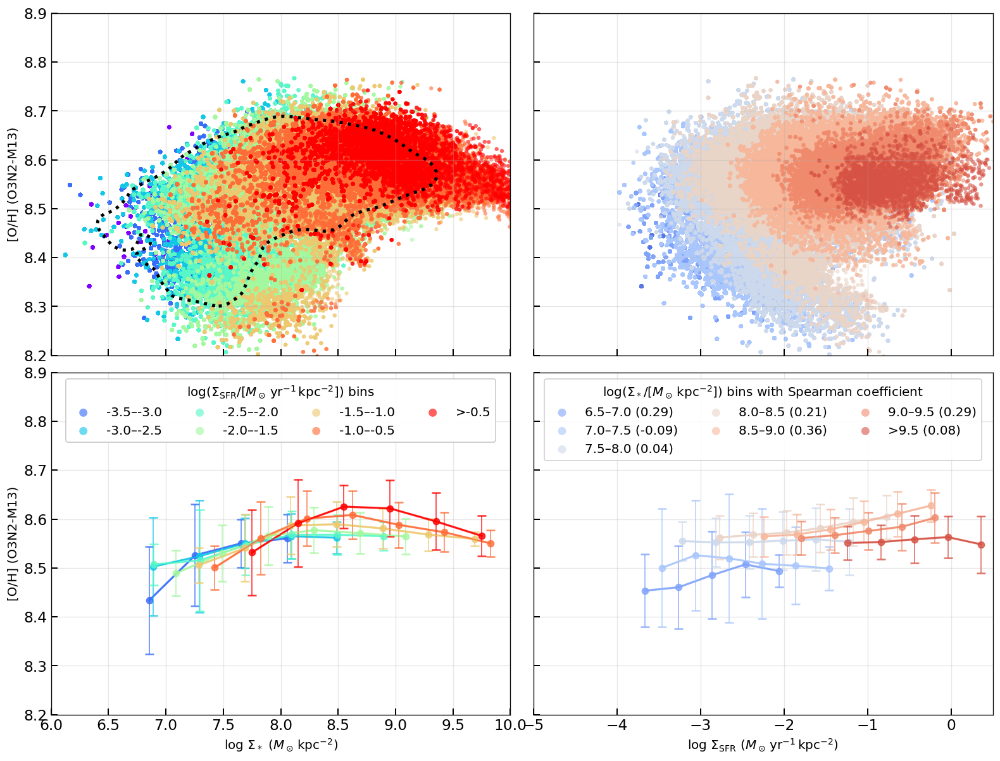


COMPLETED: Combined rMZR and Z_gas-Σ_SFR analysis (O3N2-M13 only)
Successfully created 2x2 subplot figure showing HII regions from 28 galaxies
Galaxies included: IC3392, NGC4064, NGC4189, NGC4192, NGC4254, NGC4293, NGC4294, NGC4298, NGC4302, NGC4330, NGC4351, NGC4388, NGC4394, NGC4396, NGC4402, NGC4405, NGC4419, NGC4450, NGC4457, NGC4501, NGC4522, NGC4567_8, NGC4569, NGC4580, NGC4606, NGC4607, NGC4694, NGC4698
Excluded: NGC4383

Panel summary:
  Top-left: rMZR scatter (8 Σ_SFR bins)
  Top-right: Z_gas-Σ_SFR scatter (8 Σ_* bins)
  Bottom-left: rMZR median trends (8 Σ_SFR bins)
  Bottom-right: Z_gas-Σ_SFR median trends (8 Σ_* bins)
  Shared y-range: 8.2 to 8.9


In [27]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------
    # Combined Analysis: rMZR and Z_gas-Σ_SFR relation - HII regions only
    # Using O3N2-M13 indicator only
    # 2x2 subplot layout:
    #   Top-left: rMZR scatter
    #   Top-right: Z_gas-Σ_SFR scatter
    #   Bottom-left: rMZR median trends
    #   Bottom-right: Z_gas-Σ_SFR median trends
    # ------------------------------------------------------------------
    import numpy as np
    import matplotlib.pyplot as plt
    from pathlib import Path
    from astropy.io import fits

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    EW_MIN = 6.0

    import scipy.stats as stats
    import scipy.ndimage as ndimage
    from scipy.optimize import curve_fit

    def load_maps_o3n2_m13(gal):
        """Load O3N2-M13 metallicity calibration for HII regions"""
        with fits.open(further_spatial_path(gal)) as h:
            sigM = h['LOGMASS_SURFACE_DENSITY'].data
        with fits.open(further_gas_path(gal)) as h:
            sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
            ha_sigma_obs = h['HA6562_SIGMA'].data
            ha_sigma_corr = h['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h else None
            if ha_sigma_corr is None:
                raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gal}_gas_BIN_maps_extended.fits')
            if ha_sigma_corr.shape != ha_sigma_obs.shape:
                raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {ha_sigma_corr.shape} vs SIGMA {ha_sigma_obs.shape}')
            sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
            ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
            sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
            ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
            oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
        with fits.open(further_ew_path(gal, EW_FILE_SUFFIX)) as h_ew:
            if EW_HDU not in h_ew:
                raise KeyError(f'Missing {EW_HDU} in {gal}{EW_FILE_SUFFIX}')
            ew_ha = h_ew[EW_HDU].data
        ew_ha = align_map_to_shape(ew_ha, sigSFR_HII.shape, label=f"{gal} {EW_HDU}")
        ew_mask = np.isfinite(ew_ha) & (ew_ha > EW_MIN)
        ew_mask = ew_mask & np.isfinite(ha_sigma) & (ha_sigma < 45.0)
        sigSFR_HII = np.where(ew_mask, sigSFR_HII, np.nan)
        oh_o3n2_m13_HII = np.where(ew_mask, oh_o3n2_m13_HII, np.nan)
        return (sigM, sigSFR_HII, oh_o3n2_m13_HII)

    def calculate_binned_stats(x_data, y_data, bin_width=0.4, min_pixels=20):
        """Calculate median and IQR in bins - only keep bins with >= min_pixels unique datapoints"""
        x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
        bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        medians, iqrs, counts, valid_centers, valid_bin_indices = [], [], [], [], []
        for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
            in_bin = (x_data >= bin_start) & (x_data < bin_end)
            y_in_bin = y_data[in_bin]
            if len(np.unique(y_in_bin)) >= min_pixels:
                med = np.median(y_in_bin)
                q25, q75 = np.percentile(y_in_bin, [25, 75])
                iqr = q75 - q25
                medians.append(med)
                iqrs.append(iqr)
                counts.append(len(y_in_bin))
                valid_centers.append(bin_centers[i])
                valid_bin_indices.append(i)
        return (np.array(valid_centers), np.array(medians), np.array(iqrs), np.array(counts), np.array(valid_bin_indices))

    def mzr_model(x, a, b, c):
        return a + b * (x - c) * np.exp(-(x - c))

    def compute_density_mask(x_vals, y_vals, x_range, y_range, nbins=100, sigma=2.0, return_contour=False):
        """Return mask for points inside the 95% density contour within given ranges."""
        mask_finite = np.isfinite(x_vals) & np.isfinite(y_vals)
        if not np.any(mask_finite):
            empty_mask = np.zeros_like(x_vals, dtype=bool)
            return (empty_mask, None, None) if return_contour else empty_mask
        x = x_vals[mask_finite]
        y = y_vals[mask_finite]
        H, xedges, yedges = np.histogram2d(x, y, bins=nbins, range=[x_range, y_range])
        H_smooth = ndimage.gaussian_filter(H, sigma=sigma)
        H_flat = np.sort(H_smooth.ravel())[::-1]
        H_cumsum = np.cumsum(H_flat)
        level_idx = np.searchsorted(H_cumsum, 0.95 * H_cumsum[-1])
        level_95 = H_flat[level_idx]
        x_centers = (xedges[:-1] + xedges[1:]) / 2
        y_centers = (yedges[:-1] + yedges[1:]) / 2
        X, Y = np.meshgrid(x_centers, y_centers)
        dx = (x_range[1] - x_range[0]) / nbins
        dy = (y_range[1] - y_range[0]) / nbins
        x_idx = (x - x_range[0]) / dx - 0.5
        y_idx = (y - y_range[0]) / dy - 0.5
        densities = ndimage.map_coordinates(H_smooth, [x_idx, y_idx], order=1, mode='constant', cval=0.0)
        mask_local = densities >= level_95
        full_mask = np.zeros_like(x_vals, dtype=bool)
        full_mask[np.where(mask_finite)[0]] = mask_local
        if return_contour:
            return full_mask, level_95, (X, Y, H_smooth)
        return full_mask

    def plot_literature_mzr_fits(ax, show_legend=True):
        plot_data = []
        x_sanchez = np.linspace(7.05, 9.15, 200)
        a5, b5, c5 = 8.74, 0.013, 9.50
        y_sanchez13 = a5 + b5 * (x_sanchez - c5) * np.exp(-(x_sanchez - c5))
        plot_data.append((x_sanchez, y_sanchez13, 'Sánchez+13', ':', 'olive'))
        x_bb = np.linspace(7., 8.9, 200)
        a2, b2, c2 = 8.55, 0.014, 9.14
        y_bb16 = a2 + b2 * (x_bb - c2) * np.exp(-(x_bb - c2))
        plot_data.append((x_bb, y_bb16, 'Barrera-Ballesteros+16', '--', 'brown'))
        x_ef = np.linspace(6.5, 10.0, 200)
        a4, b4, c4 = 8.61, 0.008, 10.0
        y_ef17 = a4 + b4 * (x_ef - c4) * np.exp(-(x_ef - c4))
        plot_data.append((x_ef, y_ef17, 'Erroz-Ferrer+17', '-.', 'pink'))
        for x, y, label, linestyle, color in plot_data:
            ax.plot(x, y, label=label if show_legend else None, linewidth=2, linestyle=linestyle, color=color)

    galaxies = physics_ready_galaxies(require_ew=True)
    excluded_galaxies = {'NGC4383'}
    included_galaxies = []
    all_logSigmaM_HII = []
    all_logSigmaSFR_HII = []
    all_oh_o3n2_m13_HII = []

    print("="*80)
    print("STEP 1: Collecting data from all galaxies for HII regions (O3N2-M13 only)...")
    print("="*80)

    for gal in galaxies:
        if gal in excluded_galaxies:
            print(f"  {gal}: excluded from analysis")
            continue
        bin_file = further_spatial_path(gal)
        gas_file = further_gas_path(gal)
        if bin_file.exists() and gas_file.exists():
            included_galaxies.append(gal)
            (logSigmaM, logSigmaSFR_HII, oh_o3n2_m13_HII) = load_maps_o3n2_m13(gal)
            common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & np.isfinite(oh_o3n2_m13_HII))
            print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
            all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
            all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
            all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
        else:
            print(f"  {gal}: Data files not found")

    all_logSigmaM_HII = np.array(all_logSigmaM_HII)
    all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
    all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)
    print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")

    print("\n" + "="*80)
    print("STEP 2: Defining 8 SFR bins for rMZR")
    print("="*80)
    n_bins = 8
    sfr_bin_edges = [-np.inf, -3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5, np.inf]
    bin_labels = ['<-3.5', '-3.5–-3.0', '-3.0–-2.5', '-2.5–-2.0', '-2.0–-1.5', '-1.5–-1.0', '-1.0–-0.5', '>-0.5']
    for i, label in enumerate(bin_labels):
        print(f"  Bin {i+1}: {label}")
    colors_sfr = plt.cm.rainbow(np.linspace(0, 1, n_bins))

    print("\n" + "="*80)
    print("STEP 3: Defining 8 Σ_* bins for Z_gas-Σ_SFR")
    print("="*80)
    n_bins_sigmaM = 8
    sigmaM_bin_edges = [-np.inf, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, np.inf]
    bin_labels_sigmaM = ['<6.5', '6.5–7.0', '7.0–7.5', '7.5–8.0', '8.0–8.5', '8.5–9.0', '9.0–9.5', '>9.5']
    for i, label in enumerate(bin_labels_sigmaM):
        print(f"  Bin {i+1}: {label}")
    colors_sigmaM = plt.cm.coolwarm(np.linspace(0.1, 0.9, n_bins_sigmaM))

    print("\n" + "="*80)
    print("STEP 4: Creating combined 2x2 plot (O3N2-M13 only)")
    print("="*80)
    common_ylim = (8.2, 8.9)
    x_range_rMZR = (6, 10)
    x_range_Zgas = (-5.0, 0.5)
    print(f"\nUsing uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

    fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharex='col', sharey='all')
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    oh_data_HII = all_oh_o3n2_m13_HII
    calib_name_HII = 'O3N2-M13'
    print(f"\nProcessing {calib_name_HII} calibration for HII regions:")
    print(f"  HII {calib_name_HII} range: {np.min(oh_data_HII):.3f} to {np.max(oh_data_HII):.3f}")
    ax_rMZR_scatter = axes[0, 0]
    ax_Zgas_scatter = axes[0, 1]
    ax_rMZR_median = axes[1, 0]
    ax_Zgas_median = axes[1, 1]

    mask_95_all_rMZR, level_95_all_rMZR, contour_data_rMZR = compute_density_mask(all_logSigmaM_HII, oh_data_HII, x_range_rMZR, common_ylim, return_contour=True)
    max_typical_yerr_rMZR = np.nan
    max_typical_yerr_Zgas = np.nan

    print(f"\n--- Processing rMZR (8 Σ_SFR bins) ---")
    legend_handles_sfr, legend_labels_sfr = [], []
    valid_bins_rMZR = 0
    for i in range(n_bins):
        in_bin_HII = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII < sfr_bin_edges[i + 1])
        n_pixels_HII = np.sum(in_bin_HII)
        if n_pixels_HII >= 10:
            x_bin_all = all_logSigmaM_HII[in_bin_HII]
            y_bin_all = oh_data_HII[in_bin_HII]
            scatter_hii = ax_rMZR_scatter.scatter(x_bin_all, y_bin_all, c=[colors_sfr[i]], s=15, alpha=0.6, edgecolors='none', rasterized=True)
            mask_95_bin = compute_density_mask(x_bin_all, y_bin_all, x_range_rMZR, common_ylim)
            x_bin = x_bin_all[mask_95_bin]
            y_bin = y_bin_all[mask_95_bin]
            if len(x_bin) >= 10:
                mass_centers_HII, medians_HII, iqrs_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(x_bin, y_bin, bin_width=0.4, min_pixels=20)
                if len(mass_centers_HII) >= 3:
                    legend_handles_sfr.append(scatter_hii)
                    legend_labels_sfr.append(bin_labels[i])
                    yerr_HII = iqrs_HII
                    typical_yerr = np.nanmedian(yerr_HII)
                    print(f"    rMZR bin {i+1} {bin_labels[i]}: typical yerr (median IQR) = {typical_yerr:.4f}")
                    if np.isfinite(typical_yerr):
                        max_typical_yerr_rMZR = np.nanmax([max_typical_yerr_rMZR, typical_yerr])
                    ax_rMZR_median.errorbar(mass_centers_HII, medians_HII, yerr=yerr_HII, color=colors_sfr[i], marker='o', markersize=6, linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
                    for j in range(len(valid_bin_indices_HII) - 1):
                        current_bin_idx = valid_bin_indices_HII[j]
                        next_bin_idx = valid_bin_indices_HII[j + 1]
                        if next_bin_idx - current_bin_idx == 1:
                            ax_rMZR_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], [medians_HII[j], medians_HII[j + 1]], color=colors_sfr[i], linewidth=2, alpha=0.8)
                    valid_bins_rMZR += 1

    if contour_data_rMZR is not None and level_95_all_rMZR is not None:
        ax_rMZR_scatter.contour(contour_data_rMZR[0], contour_data_rMZR[1], contour_data_rMZR[2].T, levels=[level_95_all_rMZR], colors='k', linewidths=3, linestyles=':')
    ax_rMZR_scatter.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
    ax_rMZR_scatter.grid(True, alpha=0.3)
    ax_rMZR_scatter.set_xlim(*x_range_rMZR)
    ax_rMZR_scatter.set_ylim(common_ylim)
    ax_rMZR_median.set_xlabel(r'$\log\,\Sigma_* \ (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
    ax_rMZR_median.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
    ax_rMZR_median.grid(True, alpha=0.3)
    ax_rMZR_median.set_xlim(*x_range_rMZR)
    ax_rMZR_median.set_ylim(common_ylim)
    legend1 = ax_rMZR_median.legend(legend_handles_sfr, legend_labels_sfr, loc='upper center', ncol=4, fontsize=12, framealpha=0.9, title=r'$\log(\Sigma_\mathrm{SFR}/[M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2}])$ bins', title_fontsize=12)
    legend1_handles = getattr(legend1, "legend_handles", None)
    if legend1_handles is None:
        legend1_handles = getattr(legend1, "legendHandles", [])
    for handle in legend1_handles:
        try:
            handle.set_sizes([60])
        except Exception:
            pass
    ax_rMZR_median.add_artist(legend1)
    # if np.isfinite(max_typical_yerr_rMZR):
    #     ax_rMZR_median.errorbar(x_range_rMZR[0] + 0.2, common_ylim[0] + 0.05, yerr=max_typical_yerr_rMZR, color='k', marker='o', markersize=4, linewidth=1, capsize=4, capthick=1.5)
    print(f"  rMZR valid bins: {valid_bins_rMZR}")

    print(f"\n--- Processing Z_gas-Σ_SFR (8 Σ_* bins) ---")
    legend_handles_sigmaM, legend_labels_sigmaM_display = [], []
    valid_bins_Zgas = 0
    for i in range(n_bins_sigmaM):
        in_bin_HII = (all_logSigmaM_HII >= sigmaM_bin_edges[i]) & (all_logSigmaM_HII < sigmaM_bin_edges[i + 1])
        n_pixels_HII = np.sum(in_bin_HII)
        if n_pixels_HII >= 10:
            x_bin_all = all_logSigmaSFR_HII[in_bin_HII]
            y_bin_all = oh_data_HII[in_bin_HII]
            scatter_hii = ax_Zgas_scatter.scatter(x_bin_all, y_bin_all, c=[colors_sigmaM[i]], s=15, alpha=0.6, edgecolors='none', rasterized=True)
            mask_95_bin = compute_density_mask(x_bin_all, y_bin_all, x_range_Zgas, common_ylim)
            x_bin = x_bin_all[mask_95_bin]
            y_bin = y_bin_all[mask_95_bin]
            spearman_text = "N/A"
            if len(x_bin) > 1:
                y_mean, y_std = np.nanmean(y_bin), np.nanstd(y_bin)
                x_mean, x_std = np.nanmean(x_bin), np.nanstd(x_bin)
                mask_clip = (np.abs(y_bin - y_mean) < 3 * y_std) & (np.abs(x_bin - x_mean) < 3 * x_std)
                x_clipped = x_bin[mask_clip]
                y_clipped = y_bin[mask_clip]
                sfr_centers_HII, medians_HII, iqrs_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(x_clipped, y_clipped, bin_width=0.4, min_pixels=20)
                if len(sfr_centers_HII) >= 3:
                    if len(x_clipped) > 10:
                        corr, _ = stats.spearmanr(x_clipped, y_clipped)
                        spearman_text = f"{corr:.2f}"
                    legend_handles_sigmaM.append(scatter_hii)
                    legend_labels_sigmaM_display.append(f"{bin_labels_sigmaM[i]} ({spearman_text})")
                    yerr_HII = iqrs_HII
                    typical_yerr = np.nanmedian(yerr_HII)
                    print(f"    Zgas-ΣSFR bin {i+1} {bin_labels_sigmaM[i]}: typical yerr (median IQR) = {typical_yerr:.4f}")
                    if np.isfinite(typical_yerr):
                        max_typical_yerr_Zgas = np.nanmax([max_typical_yerr_Zgas, typical_yerr])
                    ax_Zgas_median.errorbar(sfr_centers_HII, medians_HII, yerr=yerr_HII, color=colors_sigmaM[i], marker='o', markersize=6, linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
                    for j in range(len(valid_bin_indices_HII) - 1):
                        current_bin_idx = valid_bin_indices_HII[j]
                        next_bin_idx = valid_bin_indices_HII[j + 1]
                        if next_bin_idx - current_bin_idx == 1:
                            ax_Zgas_median.plot([sfr_centers_HII[j], sfr_centers_HII[j + 1]], [medians_HII[j], medians_HII[j + 1]], color=colors_sigmaM[i], linewidth=2, alpha=0.8)
                    valid_bins_Zgas += 1


    ax_Zgas_scatter.grid(True, alpha=0.3)
    ax_Zgas_scatter.set_xlim(*x_range_Zgas)
    ax_Zgas_scatter.set_ylim(common_ylim)
    ax_Zgas_median.set_xlabel(r'$\log\,\Sigma_\mathrm{SFR} \ (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
    ax_Zgas_median.grid(True, alpha=0.3)
    ax_Zgas_median.set_xlim(*x_range_Zgas)
    ax_Zgas_median.set_ylim(common_ylim)
    legend2 = ax_Zgas_median.legend(legend_handles_sigmaM, legend_labels_sigmaM_display, loc='upper center', ncol=3, fontsize=12, framealpha=0.9, title=r'$\log(\Sigma_*/[M_\odot\,\mathrm{kpc}^{-2}])$ bins with Spearman coefficient', title_fontsize=12)
    legend2_handles = getattr(legend2, "legend_handles", None)
    if legend2_handles is None:
        legend2_handles = getattr(legend2, "legendHandles", [])
    for handle in legend2_handles:
        try:
            handle.set_sizes([60])
        except Exception:
            pass
    # if np.isfinite(max_typical_yerr_Zgas):
    #     ax_Zgas_median.errorbar(x_range_Zgas[0] + 0.2, common_ylim[0] + 0.05, yerr=max_typical_yerr_Zgas, color='k', marker='o', markersize=4, linewidth=1, capsize=4, capthick=1.5)
    print(f"  Z_gas-Σ_SFR valid bins: {valid_bins_Zgas}")

    # plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13_EW.png', dpi=600, bbox_inches='tight')
    # plt.savefig('Plot_Paper_1/MAUVE_MUSE_rMZR_Zgas_SigmaSFR_O3N2M13_EW.pdf', bbox_inches='tight')
    plt.show()

    print("\n" + "="*80)
    print("COMPLETED: Combined rMZR and Z_gas-Σ_SFR analysis (O3N2-M13 only)")
    print("="*80)
    print(f"Successfully created 2x2 subplot figure showing HII regions from {len(included_galaxies)} galaxies")
    print(f"Galaxies included: {', '.join(included_galaxies)}")
    print(f"Excluded: {', '.join(sorted(excluded_galaxies))}")
    print("\nPanel summary:")
    print("  Top-left: rMZR scatter (8 Σ_SFR bins)")
    print("  Top-right: Z_gas-Σ_SFR scatter (8 Σ_* bins)")
    print("  Bottom-left: rMZR median trends (8 Σ_SFR bins)")
    print("  Bottom-right: Z_gas-Σ_SFR median trends (8 Σ_* bins)")
    print(f"  Shared y-range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")
else:
    print("Skipped copied previous-project analysis cell 16: no nested *_further mass/SFR/OH+EW products are ready yet.")


Loaded MAUVE integrated properties from /Users/Igniz/Desktop/ICRAR/further/mauve_master_wiki.fits:
  IC3392: logM*=9.824 [mauve_master_wiki.fits]; logSFR=-0.986 [mauve_master_wiki.fits]
  NGC4064: logM*=10.046 [mauve_master_wiki.fits]; logSFR=-0.494 [mauve_master_wiki.fits]
  NGC4189: logM*=9.734 [mauve_master_wiki.fits]; logSFR=-0.346 [mauve_master_wiki.fits]
  NGC4192: logM*=10.764 [mauve_master_wiki.fits]; logSFR=0.114 [mauve_master_wiki.fits]
  NGC4254: logM*=10.504 [mauve_master_wiki.fits]; logSFR=0.684 [mauve_master_wiki.fits]
  NGC4293: logM*=10.527 [mauve_master_wiki.fits]; logSFR=-0.243 [mauve_master_wiki.fits]
  NGC4294: logM*=9.364 [mauve_master_wiki.fits]; logSFR=-0.406 [mauve_master_wiki.fits]
  NGC4298: logM*=10.094 [mauve_master_wiki.fits]; logSFR=-0.276 [mauve_master_wiki.fits]
  NGC4302: logM*=10.454 [mauve_master_wiki.fits]; logSFR=-0.296 [mauve_master_wiki.fits]
  NGC4330: logM*=9.614 [mauve_master_wiki.fits]; logSFR=-0.856 [mauve_master_wiki.fits]
  NGC4351: logM*=9

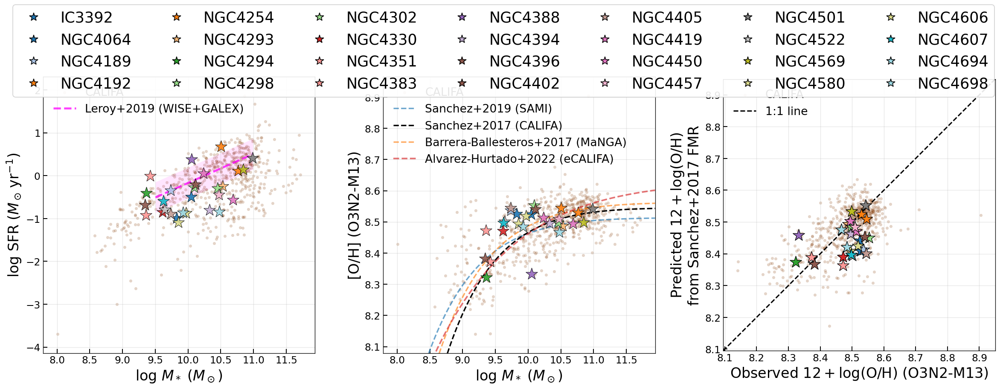

Subplot 1 (Integrated SFMS): 28 galaxies
Subplot 2 (Integrated MZR, O3N2-M13 total region): 28 galaxies
Subplot 3 (Predicted vs observed O/H): 28 galaxies


In [28]:
if SFR_LOG_STATUS["has_sfr_log"].any():
    # Cell 13 variant: 3-panel row, CALIFA points (not density), no 3D panel,
    # and axis limits derived from CALIFA distributions.
    # NOTE: this cell reads all required data from disk each run (no cached plot arrays).

    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D
    from pathlib import Path
    from mauve_master_loader import load_mauve_master_properties
    import re

    # ------------------------------------------------------------------
    # Standalone data loading with MAUVE integrated stellar mass and SFR
    # read only from mauve_master_wiki.fits.
    # ------------------------------------------------------------------
    GALAXIES = PRODUCTS.index.tolist()

    MASTER_SAMPLE_PATH = resolve_reference_file("mauve_master_wiki.fits")
    CALIFA_TABLE_PATH = resolve_reference_file("Sanchez2017TableB1.csv")


    def normalize_galaxy_name(name):
        return re.sub(r"\s+", "", name).upper()


    MAUVE_LOGMSTAR, MAUVE_LOGSFR = load_mauve_master_properties(MASTER_SAMPLE_PATH)

    print(f"Loaded MAUVE integrated properties from {MASTER_SAMPLE_PATH}:")
    for gal in GALAXIES:
        key = normalize_galaxy_name(gal)
        m = MAUVE_LOGMSTAR.get(key)
        s = MAUVE_LOGSFR.get(key)
        m_str = "MISSING" if m is None else f"{m:.3f} [mauve_master_wiki.fits]"
        s_str = "MISSING" if s is None else f"{s:.3f} [mauve_master_wiki.fits]"
        print(f"  {gal}: logM*={m_str}; logSFR={s_str}")


    def extract_total_o3n2_m13_total_metallicity(galaxy_name):
        """Extract total O3N2-M13 metallicity from total region in SFR log."""
        log_file = Path(f"sfr_logs/{galaxy_name}.log")
        if not log_file.exists():
            return None

        try:
            with open(log_file, "r") as f:
                content = f.read()
            pattern = r"\[O/H\] O3N2-M13: Total metallicity in total region:\s*([+-]?(?:\d+\.?\d*|\.\d+|nan))"
            match = re.search(pattern, content)
            if not match:
                return None
            value = float(match.group(1))
            return value if np.isfinite(value) else None
        except Exception:
            return None


    def get_integrated_stellar_mass(galaxy_name):
        """Return log10(M*/Msun) from mauve_master_wiki.fits only."""
        return MAUVE_LOGMSTAR.get(normalize_galaxy_name(galaxy_name))


    def get_integrated_sfr(galaxy_name):
        """Return log10(SFR/Msun yr^-1) from mauve_master_wiki.fits only."""
        return MAUVE_LOGSFR.get(normalize_galaxy_name(galaxy_name))


    def load_califa_o3n2_m13(table_path):
        """Load CALIFA integrated properties: COLUMN2 log_Mass, COLUMN4 log_SFR, COLUMN6 OH_O3N2_M13."""
        if not table_path.exists():
            raise FileNotFoundError(f"Missing CALIFA table file: {table_path}")

        data = np.genfromtxt(
            table_path,
            delimiter=",",
            comments="#",
            usecols=(1, 3, 5),
            dtype=float,
            invalid_raise=False,
        )

        if data.ndim == 1:
            data = data.reshape(1, -1)

        logm = data[:, 0]
        logsfr = data[:, 1]
        oh = data[:, 2]
        valid_all = np.isfinite(logm) & np.isfinite(logsfr) & np.isfinite(oh)
        logm_valid = logm[valid_all]
        logsfr_valid = logsfr[valid_all]
        oh_valid = oh[valid_all]
        return logm_valid, logsfr_valid, logm_valid, oh_valid


    def sfms_leroy2019(logM, valid=(9.5, 11.0)):
        """Leroy+2019 eq.19 converted to log SFR: logSFR = 0.68*logM - 6.97."""
        logM = np.asarray(logM)
        y = 0.68 * logM - 6.97
        y = np.where((logM < valid[0]) | (logM > valid[1]), np.nan, y)
        return y


    def sfms_boselli2023(logM, slope=0.92, intercept=-1.57, x_pivot=8.451):
        """Boselli+2023 (HRS, HI-def <= 0.4): y = slope * (logM - x_pivot) + intercept."""
        logM = np.asarray(logM)
        return slope * (logM - x_pivot) + intercept


    def mzr_sanchez2019(logM, a=8.51, b=0.007, c=3.5):
        """Sanchez+2019 SAMI relation (O3N2-M13 calibration)."""
        logM = np.asarray(logM, dtype=float)
        x = logM - 8.0
        t = x - c
        return a + b * t * np.exp(-t)


    def mzr_sanchez2017(logM, a=8.54, b=0.011, c=3.5):
        """Sanchez+2017 CALIFA relation (O3N2-M13 calibration)."""
        logM = np.asarray(logM, dtype=float)
        x = logM - 8.0
        t = x - c
        return a + b * t * np.exp(-t)


    def mzr_barrera_ballesteros2017_m13(logM, a=8.56, b=0.005, c=4.0):
        """Barrera-Ballesteros+2017 MaNGA relation (O3N2-M13)."""
        logM = np.asarray(logM, dtype=float)
        x = logM - 8.0
        t = x - c
        return a + b * t * np.exp(-t)


    def mzr_alvarez_hurtado2022_m13(logM, a=8.63366, b=-17.56889, c=3.5):
        """eCALIFA exponential MZR (erratum coefficients), using x = log10(M*/Msun)."""
        x = np.asarray(logM, dtype=float)
        t = x - c
        return a + b * t * np.exp(-t)


    def sanchez2017_fp_o3n2_m13(logMstar, logSFR, a=0.10, b=-0.020, c=8.246):
        """Sanchez+2017 Eq. (6) FP fit for O3N2-M13 calibrator."""
        logMstar = np.asarray(logMstar, dtype=float)
        logSFR = np.asarray(logSFR, dtype=float)
        return a * (logMstar - 8) - b * logSFR + c


    # Build integrated-data containers from mauve_master_wiki.fits and local metallicity logs.
    sfms_masses = []
    sfms_sfrs = []
    sfms_names = []

    mzr_masses = []
    mzr_oh_total = []
    mzr_names = []

    for gal in GALAXIES:
        mass = get_integrated_stellar_mass(gal)
        sfr = get_integrated_sfr(gal)
        oh_total = extract_total_o3n2_m13_total_metallicity(gal)

        if mass is not None and sfr is not None:
            sfms_masses.append(mass)
            sfms_sfrs.append(sfr)
            sfms_names.append(gal)

        if mass is not None and oh_total is not None:
            mzr_masses.append(mass)
            mzr_oh_total.append(oh_total)
            mzr_names.append(gal)

    sfms_masses = np.array(sfms_masses)
    sfms_sfrs = np.array(sfms_sfrs)
    mzr_masses = np.array(mzr_masses)
    mzr_oh_total = np.array(mzr_oh_total)

    galaxy_colors = plt.cm.tab20(np.linspace(0, 1, len(GALAXIES)))
    galaxy_color_dict = dict(zip(GALAXIES, galaxy_colors))

    # Build FMR rows from mauve_master_wiki.fits and local metallicity logs.
    rows = []
    for gal in GALAXIES:
        logM = get_integrated_stellar_mass(gal)
        logSFR = get_integrated_sfr(gal)
        Z_obs = extract_total_o3n2_m13_total_metallicity(gal)

        if logM is None or logSFR is None or Z_obs is None:
            continue

        Z_pred = sanchez2017_fp_o3n2_m13(logM, logSFR)
        deltaZ = Z_obs - Z_pred

        rows.append(
            {
                "gal": gal,
                "logM": float(logM),
                "logSFR": float(logSFR),
                "Z_obs": float(Z_obs),
                "Z_pred": float(Z_pred),
                "deltaZ": float(deltaZ),
            }
        )

    if len(rows) == 0:
        raise RuntimeError("No valid galaxy entries found from mauve_master_wiki.fits and local metallicity logs.")

    # Shared CALIFA data
    califa_logm_sfms, califa_logsfr, califa_logm_mzr, califa_oh = load_califa_o3n2_m13(CALIFA_TABLE_PATH)
    califa_oh_pred = sanchez2017_fp_o3n2_m13(califa_logm_sfms, califa_logsfr)
    print(f"CALIFA entries used (valid mass+SFR+O/H): {len(califa_logm_sfms)}")


    def califa_limits(values, frac_pad=0.06, min_pad=0.02):
        vals = np.asarray(values, dtype=float)
        vals = vals[np.isfinite(vals)]
        if vals.size == 0:
            return (0.0, 1.0)
        vmin = float(np.nanmin(vals))
        vmax = float(np.nanmax(vals))
        span = vmax - vmin
        if span == 0:
            pad = max(min_pad, 0.05 * max(1.0, abs(vmin)))
        else:
            pad = max(min_pad, frac_pad * span)
        return (vmin - pad, vmax + pad)


    sfms_xlim = califa_limits(califa_logm_sfms, frac_pad=0.06, min_pad=0.05)
    sfms_ylim = califa_limits(califa_logsfr, frac_pad=0.08, min_pad=0.08)
    mzr_xlim = califa_limits(califa_logm_mzr, frac_pad=0.06, min_pad=0.05)
    mzr_ylim = califa_limits(califa_oh, frac_pad=0.08, min_pad=0.01)
    right_min, right_max = califa_limits(
        np.concatenate([
            np.asarray(califa_oh, dtype=float),
            np.asarray(califa_oh_pred, dtype=float),
        ]),
        frac_pad=0.06,
        min_pad=0.01,
    )

    fig, (ax_sfms, ax_mzr, ax_right) = plt.subplots(
        1, 3, figsize=(24, 7.4), gridspec_kw={"wspace": 0.25}
    )

    # ---------- Panel 1: Integrated SFMS (CALIFA points + MAUVE stars) ----------
    ax_sfms.scatter(
        califa_logm_sfms,
        califa_logsfr,
        s=18,
        color="saddlebrown",
        alpha=0.23,
        linewidths=0,
        zorder=0,
        label="CALIFA",
    )

    for mass, sfr, gal in zip(sfms_masses, sfms_sfrs, sfms_names):
        color = galaxy_color_dict.get(gal, "tab:blue")
        ax_sfms.scatter(
            mass,
            sfr,
            s=300,
            marker="*",
            c=[color],
            alpha=0.9,
            edgecolors="black",
            linewidth=0.6,
            zorder=3,
        )

    x_sfms = np.linspace(sfms_xlim[0], sfms_xlim[1], 400)
    y_l19 = sfms_leroy2019(x_sfms)
    y_b23 = sfms_boselli2023(x_sfms)
    ax_sfms.plot(x_sfms, y_l19, lw=2.8, ls="--", color="magenta", alpha=0.75, label="Leroy+2019 (WISE+GALEX)")
    ax_sfms.fill_between(x_sfms, y_l19 - 0.36, y_l19 + 0.36, color="magenta", alpha=0.10, linewidth=0)
    # ax_sfms.plot(x_sfms, y_b23, lw=2, ls="--", alpha=0.65, label="Boselli+2023 (HRS, HI-def<=0.4)")
    # ax_sfms.fill_between(x_sfms, y_b23 - 0.42, y_b23 + 0.42, alpha=0.08, linewidth=0)
    ax_sfms.set_xlabel(r"$\log\,M_* \; (M_\odot)$", fontsize=20)
    ax_sfms.set_ylabel(r"$\log\,\mathrm{SFR} \; (M_\odot\,\mathrm{yr}^{-1})$", fontsize=20)
    ax_sfms.set_xlim(*sfms_xlim)
    ax_sfms.set_ylim(*sfms_ylim)
    ax_sfms.grid(True, alpha=0.3)
    ax_sfms.legend(frameon=False, loc="upper left", fontsize=16)

    # ---------- Panel 2: Integrated MZR (CALIFA points + MAUVE stars) ----------
    ax_mzr.scatter(
        califa_logm_mzr,
        califa_oh,
        s=18,
        color="saddlebrown",
        alpha=0.23,
        linewidths=0,
        zorder=0,
        label="CALIFA",
    )

    for mass, oh_total, gal in zip(mzr_masses, mzr_oh_total, mzr_names):
        color = galaxy_color_dict.get(gal, "tab:orange")
        ax_mzr.scatter(
            mass,
            oh_total,
            s=300,
            marker="*",
            c=[color],
            alpha=0.9,
            edgecolors="black",
            linewidth=0.6,
            zorder=3,
        )

    x_mzr = np.linspace(mzr_xlim[0], mzr_xlim[1], 400)
    ax_mzr.plot(x_mzr, mzr_sanchez2019(x_mzr), lw=2, ls="--", alpha=0.65, label="Sanchez+2019 (SAMI)", zorder=2)
    ax_mzr.plot(x_mzr, mzr_sanchez2017(x_mzr), lw=2, ls="--", color="black", label="Sanchez+2017 (CALIFA)", zorder=2)
    ax_mzr.plot(x_mzr, mzr_barrera_ballesteros2017_m13(x_mzr), lw=2, ls="--", alpha=0.65, label="Barrera-Ballesteros+2017 (MaNGA)", zorder=2)
    ax_mzr.plot(x_mzr, mzr_alvarez_hurtado2022_m13(x_mzr), lw=2.2, ls="--", alpha=0.65, color="tab:red", label="Alvarez-Hurtado+2022 (eCALIFA)", zorder=2)
    ax_mzr.set_xlabel(r"$\log\,M_* \; (M_\odot)$", fontsize=20)
    ax_mzr.set_ylabel(r"[O/H] (O3N2-M13)", fontsize=20)
    ax_mzr.set_xlim(*mzr_xlim)
    ax_mzr.set_ylim(*mzr_ylim)
    ax_mzr.grid(True, alpha=0.3)
    ax_mzr.legend(frameon=False, loc="upper left", fontsize=16)

    # ---------- Panel 3: Predicted vs observed (CALIFA points + MAUVE stars) ----------
    ax_right.scatter(
        califa_oh,
        califa_oh_pred,
        s=18,
        color="saddlebrown",
        alpha=0.23,
        linewidths=0,
        zorder=0,
        label="CALIFA",
    )

    for r in rows:
        gal = r["gal"]
        zo = r["Z_obs"]
        zp = r["Z_pred"]
        point_color = galaxy_color_dict.get(gal, "white")
        ax_right.scatter(
            zo,
            zp,
            s=300,
            marker="*",
            color=point_color,
            edgecolor="black",
            linewidth=0.8,
            alpha=0.98,
            zorder=3,
        )

    ax_right.plot(
        [right_min, right_max],
        [right_min, right_max],
        ls="--",
        color="black",
        lw=1.8,
        label="1:1 line",
        zorder=2,
    )
    ax_right.set_xlim(right_min, right_max)
    ax_right.set_ylim(right_min, right_max)
    ax_right.set_aspect("equal", adjustable="box")
    ax_right.grid(True, alpha=0.3)
    ax_right.set_xlabel(r"Observed $12+\log(\mathrm{O/H})$ (O3N2-M13)", fontsize=20)
    ax_right.set_ylabel(r"Predicted $12+\log(\mathrm{O/H})$" "\n" r"from Sanchez+2017 FMR", fontsize=20)
    ax_right.legend(frameon=False, loc="upper left", fontsize=16)

    # Keep Cell 6's shared galaxy legend behavior (top-level figure legend).
    plotted_galaxies = [gal for gal in GALAXIES if (gal in sfms_names or gal in mzr_names)]
    legend_handles = [
        Line2D(
            [0], [0], marker="*", color="none", linestyle="None", markersize=12,
            markerfacecolor=galaxy_color_dict.get(gal, "gray"), markeredgecolor="black"
        )
        for gal in plotted_galaxies
    ]
    if legend_handles:
        fig.legend(
            legend_handles,
            plotted_galaxies,
            loc="upper center",
            bbox_to_anchor=(0.5, 1.05),
            ncol=min(len(plotted_galaxies), 7),
            fontsize=21,
            framealpha=0.9,
        )

    fig.subplots_adjust(top=0.84, wspace=0.25)
    fig.canvas.draw_idle()
    # plt.savefig(output_dir / "SFMS_MZR_FMR_comparison.png", dpi=600, bbox_inches="tight")
    # plt.savefig(output_dir / "SFMS_MZR_FMR_comparison.pdf", bbox_inches="tight")
    plt.show()

    print(f"Subplot 1 (Integrated SFMS): {len(sfms_names)} galaxies")
    print(f"Subplot 2 (Integrated MZR, O3N2-M13 total region): {len(mzr_names)} galaxies")
    print(f"Subplot 3 (Predicted vs observed O/H): {len(rows)} galaxies")
else:
    print("Skipped copied integrated SFMS/MZR/FMR cell: no local SFR metallicity logs are available yet for the current further sample.")
